In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_percentage_error
from keras.models import Sequential
from keras.layers import LSTM, Bidirectional, Dense, Dropout
from keras.optimizers import Adam

# Load dataset (contohnya menggunakan dataset saham)
# df = pd.read_csv('your_stock_data.csv')
# Assuming the dataset has a 'Date' and 'Close' columns
df = pd.read_csv("/content/gdrive/MyDrive/TugasAkhir/CS.PA.csv")
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)
data = df['Close'].values

# Normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(data.reshape(-1, 1))

# Prepare the data for LSTM
def create_dataset(data, time_step=60):
    X, Y = [], []
    for i in range(len(data)-time_step-1):
        X.append(data[i:(i+time_step), 0])
        Y.append(data[i + time_step, 0])
    return np.array(X), np.array(Y)

time_step = 30
X, Y = create_dataset(scaled_data, time_step)

# Reshape input to be [samples, time steps, features] for LSTM
X = X.reshape(X.shape[0], X.shape[1], 1)

# Split the data into training and test sets
train_size = int(len(X) * 0.8)
test_size = len(X) - train_size
X_train, X_test = X[:train_size], X[train_size:]
Y_train, Y_test = Y[:train_size], Y[train_size:]

# Create the LSTM model
def create_lstm_model():
    model = Sequential()
    model.add(LSTM(50, return_sequences=True, input_shape=(time_step, 1)))
    model.add(LSTM(50, return_sequences=False))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
    return model

# Create the BiLSTM model
def create_bilstm_model():
    model = Sequential()
    model.add(Bidirectional(LSTM(50, return_sequences=True), input_shape=(time_step, 1)))
    model.add(Bidirectional(LSTM(50, return_sequences=False)))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
    return model



In [ ]:
# Kembalikan Y_test ke skala aslinya
Y_test_original = scaler.inverse_transform(Y_test.reshape(-1, 1))

# Hitung rata-rata nilai aktual dari data uji
mean_actual = np.mean(Y_test_original)

print("Rata-rata nilai aktual (Y_test):", mean_actual)


Rata-rata nilai aktual (Y_test): 23.830682982708932


Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


174/174 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.0223 - val_loss: 3.7968e-04
Epoch 2/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.0019 - val_loss: 7.8681e-04
Epoch 3/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 8s 43ms/step - loss: 0.0014 - val_loss: 0.0018
Epoch 4/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.0014 - val_loss: 3.0338e-04
Epoch 5/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step - loss: 9.9364e-04 - val_loss: 2.6700e-04
Epoch 6/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.0010 - val_loss: 2.9369e-04
Epoch 7/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 8.7683e-04 - val_loss: 2.5559e-04
Epoch 8/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 8.2024e-04 - val_loss: 2.5538e-04
Epoch 9/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 7.4670e-04 - val_loss: 2.1941e-04
Epoch 10/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 8.0107e-04 - val_loss: 2.2519e-04
Epoch 11/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step - loss: 7.8143e-04 - val_l

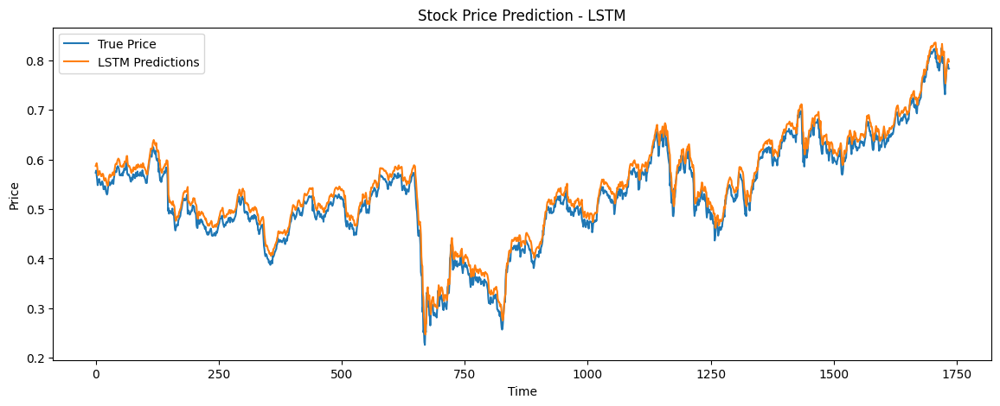

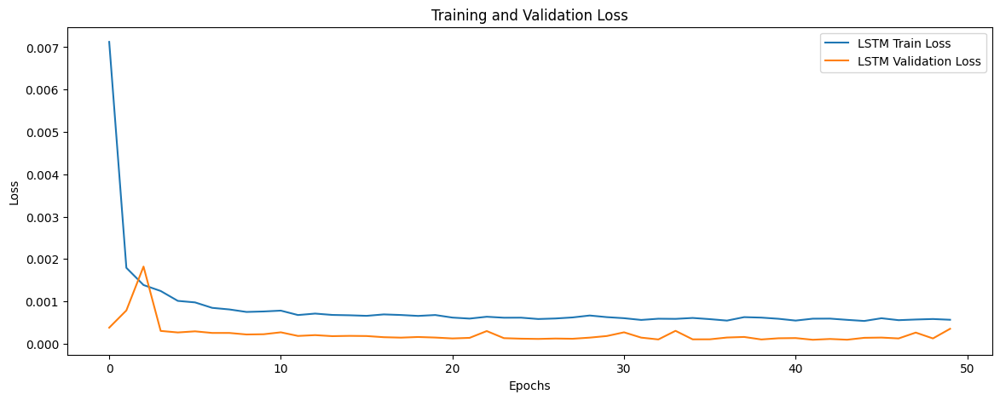

Raw LSTM Future Predictions (Before Inverse Transform):
[0.80077958 0.81162858 0.82148641 0.83069688 0.83948666 0.84800118
 0.85634166 0.86457002 0.87271661 0.88079119 0.88879007 0.89670265
 0.90451747 0.91222328 0.91981012 0.92727178 0.93460387 0.94180346
 0.94886833 0.9557988  0.96259499 0.96925735 0.97578579 0.98218054
 0.988442   0.99457169 1.00057077 1.00644088 1.01218343 1.01780021]

LSTM Future Predictions (After Inverse Transform):
[34.04450557 34.45155006 34.82140693 35.16697522 35.49675962 35.81621673
 36.12914382 36.4378644  36.74351676 37.04646766 37.34657844 37.64345105
 37.9366561  38.22577094 38.5104221  38.790377   39.06547017 39.33559201
 39.60065979 39.86068469 40.11567117 40.36563714 40.61057812 40.85050304
 41.08542758 41.31540763 41.54048792 41.76072883 41.97618404 42.18692063]


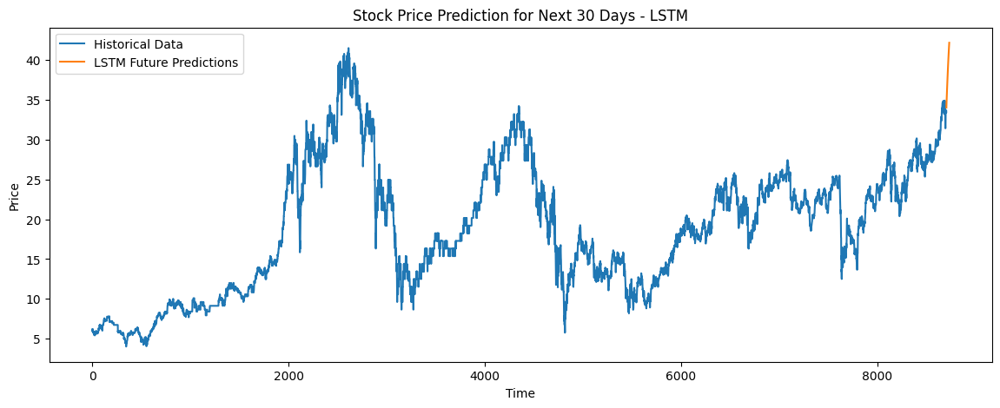

In [ ]:
#model1
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler

# Assume X_train, Y_train, X_test, Y_test are already defined and preprocessed

# Define LSTM model
def create_lstm_model(input_shape=(30, 1), lstm_units=64, dropout_rate=0.2, lr=0.001):
    model = Sequential()
    model.add(LSTM(units=lstm_units, return_sequences=True, input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(units=lstm_units, return_sequences=False))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# Train the model
lstm_model = create_lstm_model(input_shape=(X_train.shape[1], 1))
lstm_history = lstm_model.fit(X_train, Y_train, batch_size=32, epochs=50, verbose=1, validation_split=0.2)

# Predictions
lstm_predictions = lstm_model.predict(X_test)

# Misalnya, kita fit scaler dengan data training
scaler = MinMaxScaler()
scaler.fit(Y_train.reshape(-1, 1))

# Inverse scaling
lstm_predictions = scaler.inverse_transform(lstm_predictions)
Y_test_unscaled = scaler.inverse_transform(Y_test.reshape(-1, 1))

# Calculate MAPE
lstm_mape = mean_absolute_percentage_error(Y_test_unscaled, lstm_predictions)
print(f'LSTM MAPE: {lstm_mape:.4f}')

# Plot the results
plt.figure(figsize=(14, 5))
plt.plot(Y_test_unscaled, label='True Price')
plt.plot(lstm_predictions, label='LSTM Predictions')
plt.title('Stock Price Prediction - LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()

# Plot the training and validation loss for both models
plt.figure(figsize=(14, 5))
plt.plot(lstm_history.history['loss'], label='LSTM Train Loss')
plt.plot(lstm_history.history['val_loss'], label='LSTM Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Assume lstm_model, data, and scaled_data are already defined and preprocessed
time_step = 30  # Sesuaikan dengan time step yang Anda gunakan

# Fit scaler dengan data asli (bukan data yang sudah discaled)
scaler = MinMaxScaler()
scaler.fit(data.reshape(-1, 1))  # Fit dengan data asli

# Fungsi untuk prediksi 30 hari ke depan
def predict_next_30_days(model, data, time_step):
    temp_input = data[-time_step:].reshape(1, -1)  # Ambil data terakhir sebanyak time_step dan reshape
    temp_input = list(temp_input[0])  # Ubah menjadi list
    lst_output = []
    n_steps = time_step
    i = 0
    while(i < 30):
        if len(temp_input) > n_steps:
            x_input = np.array(temp_input[-n_steps:])  # Ambil hanya n_steps terakhir dan ubah menjadi numpy array
            x_input = x_input.reshape(1, n_steps, 1)
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
        else:
            x_input = np.array(temp_input).reshape((1, n_steps, 1))  # Ubah list menjadi numpy array dan reshape
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
    return np.array(lst_output).reshape(-1, 1)

# Prediksi tanpa inverse transform
lstm_future_predictions_raw = predict_next_30_days(lstm_model, scaled_data, time_step)

# Print prediksi raw (sebelum inverse transform)
print("Raw LSTM Future Predictions (Before Inverse Transform):")
print(lstm_future_predictions_raw.flatten())

# Lakukan inverse transform pada prediksi
lstm_future_predictions = scaler.inverse_transform(lstm_future_predictions_raw)

# Print prediksi setelah inverse transform
print("\nLSTM Future Predictions (After Inverse Transform):")
print(lstm_future_predictions.flatten())

# Plot hasil prediksi
plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(data)), data, label='Historical Data')
plt.plot(np.arange(len(data), len(data) + 30), lstm_future_predictions, label='LSTM Future Predictions')
plt.title('Stock Price Prediction for Next 30 Days - LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()



/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0157 - val_loss: 3.9357e-04
Epoch 2/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0017 - val_loss: 3.5102e-04
Epoch 3/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.0015 - val_loss: 4.2130e-04
Epoch 4/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0011 - val_loss: 2.6546e-04
Epoch 5/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step - loss: 9.9432e-04 - val_loss: 2.4745e-04
Epoch 6/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 8.9798e-04 - val_loss: 2.5874e-04
Epoch 7/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 8.6184e-04 - val_loss: 4.0669e-04
Epoch 8/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 7s 42ms/step - loss: 8.5080e-04 - val_loss: 2.4509e-04
Epoch 9/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 8.2766e-04 - val_loss: 2.5106e-04
Epoch 10/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 7.5232e-04 - val_loss: 1.9728e-04
Epoch 11/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 7s 41ms/

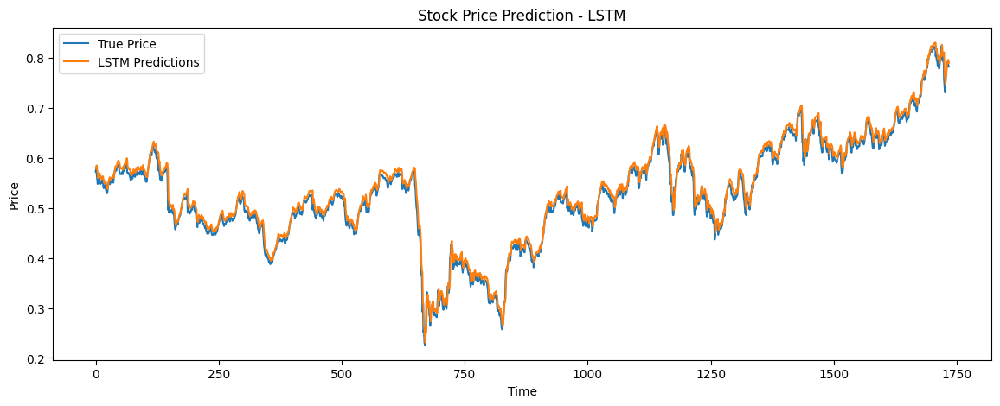

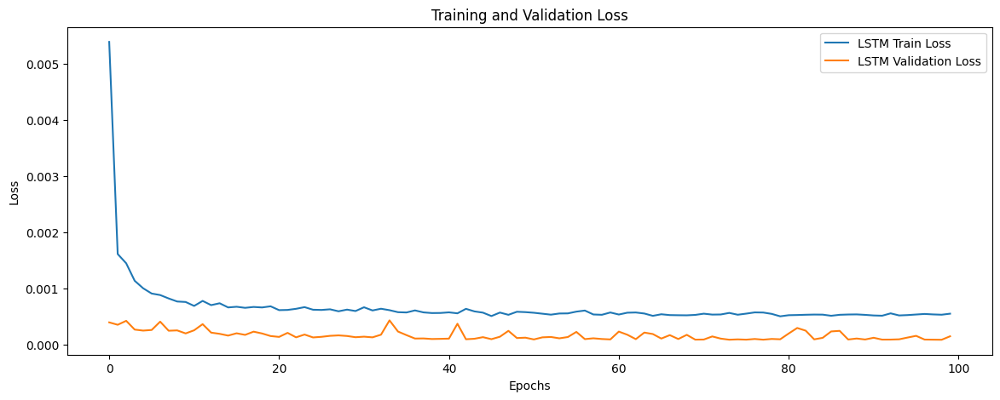

Raw LSTM Future Predictions (Before Inverse Transform):
[0.79426074 0.79965979 0.80482602 0.80985498 0.81478572 0.81967807
 0.82457948 0.82951826 0.83449817 0.83951783 0.84456933 0.84963685
 0.85470486 0.85976034 0.86478293 0.86975783 0.87467825 0.87954521
 0.88434434 0.88907403 0.89373446 0.89833093 0.90286279 0.90732825
 0.9117223  0.91604125 0.92028147 0.92443925 0.92851341 0.93250513]

LSTM Future Predictions (After Inverse Transform):
[33.79992464 34.00249198 34.19632429 34.38500637 34.57000302 34.75355947
 34.93745585 35.12275439 35.30959599 35.49792921 35.68745662 35.8775856
 36.06773247 36.25740971 36.44585251 36.63250625 36.81711601 36.9997198
 37.17977867 37.35723223 37.5320872  37.70454261 37.87457385 38.04211385
 38.20697474 38.36901788 38.52810685 38.684103   38.83696161 38.9867274 ]


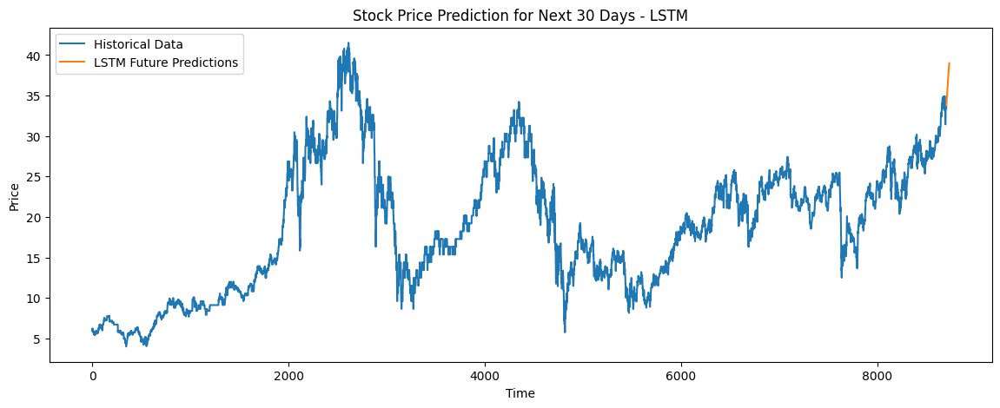

In [ ]:
#model2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler

# Assume X_train, Y_train, X_test, Y_test are already defined and preprocessed

# Define LSTM model
def create_lstm_model(input_shape=(30, 1), lstm_units=64, dropout_rate=0.2, lr=0.001):
    model = Sequential()
    model.add(LSTM(units=lstm_units, return_sequences=True, input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(units=lstm_units, return_sequences=False))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# Train the model
lstm_model = create_lstm_model(input_shape=(X_train.shape[1], 1))
lstm_history = lstm_model.fit(X_train, Y_train, batch_size=32, epochs=100, verbose=1, validation_split=0.2)

# Predictions
lstm_predictions = lstm_model.predict(X_test)

# Misalnya, kita fit scaler dengan data training
scaler = MinMaxScaler()
scaler.fit(Y_train.reshape(-1, 1))

# Inverse scaling
lstm_predictions = scaler.inverse_transform(lstm_predictions)
Y_test_unscaled = scaler.inverse_transform(Y_test.reshape(-1, 1))

# Calculate MAPE
lstm_mape = mean_absolute_percentage_error(Y_test_unscaled, lstm_predictions)
print(f'LSTM MAPE: {lstm_mape:.4f}')

# Plot the results
plt.figure(figsize=(14, 5))
plt.plot(Y_test_unscaled, label='True Price')
plt.plot(lstm_predictions, label='LSTM Predictions')
plt.title('Stock Price Prediction - LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()

# Plot the training and validation loss for both models
plt.figure(figsize=(14, 5))
plt.plot(lstm_history.history['loss'], label='LSTM Train Loss')
plt.plot(lstm_history.history['val_loss'], label='LSTM Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Assume lstm_model, data, and scaled_data are already defined and preprocessed
time_step = 30  # Sesuaikan dengan time step yang Anda gunakan

# Fit scaler dengan data asli (bukan data yang sudah discaled)
scaler = MinMaxScaler()
scaler.fit(data.reshape(-1, 1))  # Fit dengan data asli

# Fungsi untuk prediksi 30 hari ke depan
def predict_next_30_days(model, data, time_step):
    temp_input = data[-time_step:].reshape(1, -1)  # Ambil data terakhir sebanyak time_step dan reshape
    temp_input = list(temp_input[0])  # Ubah menjadi list
    lst_output = []
    n_steps = time_step
    i = 0
    while(i < 30):
        if len(temp_input) > n_steps:
            x_input = np.array(temp_input[-n_steps:])  # Ambil hanya n_steps terakhir dan ubah menjadi numpy array
            x_input = x_input.reshape(1, n_steps, 1)
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
        else:
            x_input = np.array(temp_input).reshape((1, n_steps, 1))  # Ubah list menjadi numpy array dan reshape
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
    return np.array(lst_output).reshape(-1, 1)

# Prediksi tanpa inverse transform
lstm_future_predictions_raw = predict_next_30_days(lstm_model, scaled_data, time_step)

# Print prediksi raw (sebelum inverse transform)
print("Raw LSTM Future Predictions (Before Inverse Transform):")
print(lstm_future_predictions_raw.flatten())

# Lakukan inverse transform pada prediksi
lstm_future_predictions = scaler.inverse_transform(lstm_future_predictions_raw)

# Print prediksi setelah inverse transform
print("\nLSTM Future Predictions (After Inverse Transform):")
print(lstm_future_predictions.flatten())

# Plot hasil prediksi
plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(data)), data, label='Historical Data')
plt.plot(np.arange(len(data), len(data) + 30), lstm_future_predictions, label='LSTM Future Predictions')
plt.title('Stock Price Prediction for Next 30 Days - LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()



Epoch 1/200


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


174/174 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.0165 - val_loss: 3.2442e-04
Epoch 2/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0016 - val_loss: 4.2317e-04
Epoch 3/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step - loss: 0.0014 - val_loss: 3.8390e-04
Epoch 4/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.0011 - val_loss: 2.5661e-04
Epoch 5/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step - loss: 0.0010 - val_loss: 3.0042e-04
Epoch 6/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 8.6079e-04 - val_loss: 2.7723e-04
Epoch 7/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - loss: 8.2456e-04 - val_loss: 2.2251e-04
Epoch 8/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 8.7682e-04 - val_loss: 2.0957e-04
Epoch 9/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step - loss: 7.5876e-04 - val_loss: 2.1537e-04
Epoch 10/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 7.8759e-04 - val_loss: 2.0243e-04
Epoch 11/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step - loss: 6.96

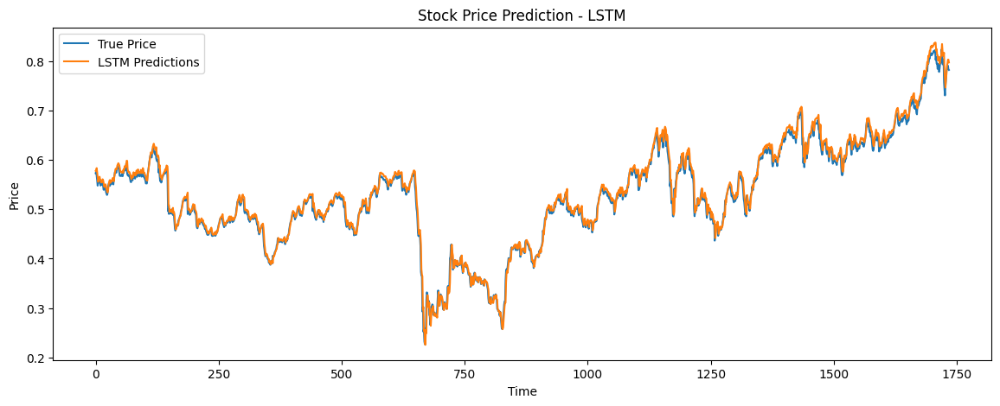

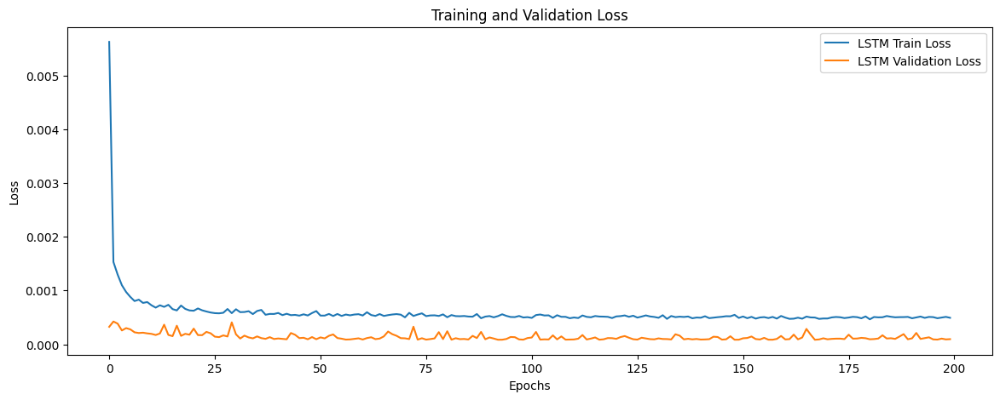

Raw LSTM Future Predictions (Before Inverse Transform):
[0.8011229  0.81290245 0.82435918 0.83589745 0.84739852 0.85890079
 0.87053406 0.88233089 0.89425659 0.90632105 0.91852057 0.93082726
 0.94323671 0.95574462 0.96826851 0.98075986 0.99319994 1.00556934
 1.01773894 1.02967739 1.04135478 1.05278063 1.06394613 1.07485008
 1.08547294 1.09580326 1.10582125 1.11550438 1.12484682 1.13385367]

LSTM Future Predictions (After Inverse Transform):
[34.05738672 34.49934451 34.92919044 35.36209564 35.79360539 36.22515986
 36.66162974 37.10423606 37.55167729 38.00432465 38.4620395  38.92377523
 39.38936636 39.85865188 40.32853673 40.79720056 41.26394115 41.72802948
 42.1846217  42.6325415  43.07066625 43.49935377 43.91827308 44.32737945
 44.72593938 45.11352349 45.48938933 45.85269157 46.20321105 46.5411401 ]


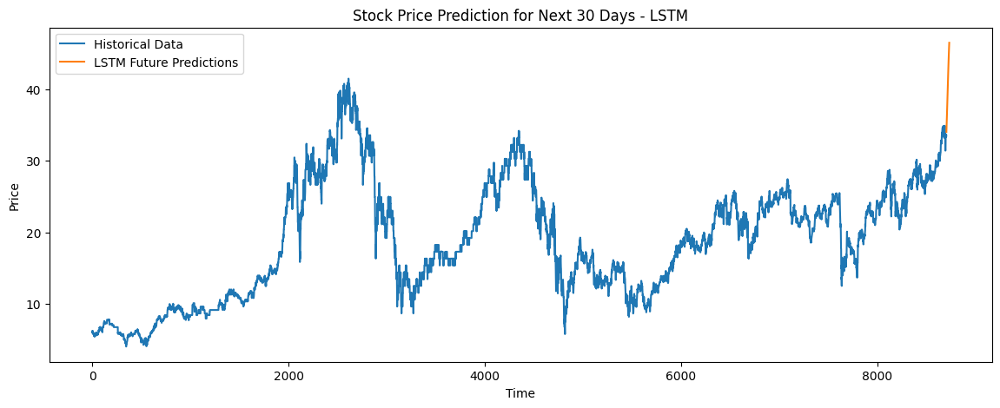

In [ ]:
#model3
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler

# Assume X_train, Y_train, X_test, Y_test are already defined and preprocessed

# Define LSTM model
def create_lstm_model(input_shape=(30, 1), lstm_units=64, dropout_rate=0.2, lr=0.001):
    model = Sequential()
    model.add(LSTM(units=lstm_units, return_sequences=True, input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(units=lstm_units, return_sequences=False))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# Train the model
lstm_model = create_lstm_model(input_shape=(X_train.shape[1], 1))
lstm_history = lstm_model.fit(X_train, Y_train, batch_size=32, epochs=200, verbose=1, validation_split=0.2)

# Predictions
lstm_predictions = lstm_model.predict(X_test)

# Misalnya, kita fit scaler dengan data training
scaler = MinMaxScaler()
scaler.fit(Y_train.reshape(-1, 1))

# Inverse scaling
lstm_predictions = scaler.inverse_transform(lstm_predictions)
Y_test_unscaled = scaler.inverse_transform(Y_test.reshape(-1, 1))

# Calculate MAPE
lstm_mape = mean_absolute_percentage_error(Y_test_unscaled, lstm_predictions)
print(f'LSTM MAPE: {lstm_mape:.4f}')

# Plot the results
plt.figure(figsize=(14, 5))
plt.plot(Y_test_unscaled, label='True Price')
plt.plot(lstm_predictions, label='LSTM Predictions')
plt.title('Stock Price Prediction - LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()

# Plot the training and validation loss for both models
plt.figure(figsize=(14, 5))
plt.plot(lstm_history.history['loss'], label='LSTM Train Loss')
plt.plot(lstm_history.history['val_loss'], label='LSTM Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Assume lstm_model, data, and scaled_data are already defined and preprocessed
time_step = 30  # Sesuaikan dengan time step yang Anda gunakan

# Fit scaler dengan data asli (bukan data yang sudah discaled)
scaler = MinMaxScaler()
scaler.fit(data.reshape(-1, 1))  # Fit dengan data asli

# Fungsi untuk prediksi 30 hari ke depan
def predict_next_30_days(model, data, time_step):
    temp_input = data[-time_step:].reshape(1, -1)  # Ambil data terakhir sebanyak time_step dan reshape
    temp_input = list(temp_input[0])  # Ubah menjadi list
    lst_output = []
    n_steps = time_step
    i = 0
    while(i < 30):
        if len(temp_input) > n_steps:
            x_input = np.array(temp_input[-n_steps:])  # Ambil hanya n_steps terakhir dan ubah menjadi numpy array
            x_input = x_input.reshape(1, n_steps, 1)
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
        else:
            x_input = np.array(temp_input).reshape((1, n_steps, 1))  # Ubah list menjadi numpy array dan reshape
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
    return np.array(lst_output).reshape(-1, 1)

# Prediksi tanpa inverse transform
lstm_future_predictions_raw = predict_next_30_days(lstm_model, scaled_data, time_step)

# Print prediksi raw (sebelum inverse transform)
print("Raw LSTM Future Predictions (Before Inverse Transform):")
print(lstm_future_predictions_raw.flatten())

# Lakukan inverse transform pada prediksi
lstm_future_predictions = scaler.inverse_transform(lstm_future_predictions_raw)

# Print prediksi setelah inverse transform
print("\nLSTM Future Predictions (After Inverse Transform):")
print(lstm_future_predictions.flatten())

# Plot hasil prediksi
plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(data)), data, label='Historical Data')
plt.plot(np.arange(len(data), len(data) + 30), lstm_future_predictions, label='LSTM Future Predictions')
plt.title('Stock Price Prediction for Next 30 Days - LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()



Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


87/87 ━━━━━━━━━━━━━━━━━━━━ 14s 51ms/step - loss: 0.0279 - val_loss: 5.6502e-04
Epoch 2/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.0019 - val_loss: 4.9371e-04
Epoch 3/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0016 - val_loss: 3.2587e-04
Epoch 4/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.0014 - val_loss: 4.5085e-04
Epoch 5/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 8s 78ms/step - loss: 0.0012 - val_loss: 3.5651e-04
Epoch 6/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0013 - val_loss: 4.7013e-04
Epoch 7/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - loss: 0.0012 - val_loss: 3.0865e-04
Epoch 8/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step - loss: 0.0012 - val_loss: 2.8542e-04
Epoch 9/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.0011 - val_loss: 3.2554e-04
Epoch 10/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 9.6047e-04 - val_loss: 2.5388e-04
Epoch 11/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 8.9504e-04 - val_loss: 2.9951e-04
Epoch 12/50
87/87 ━

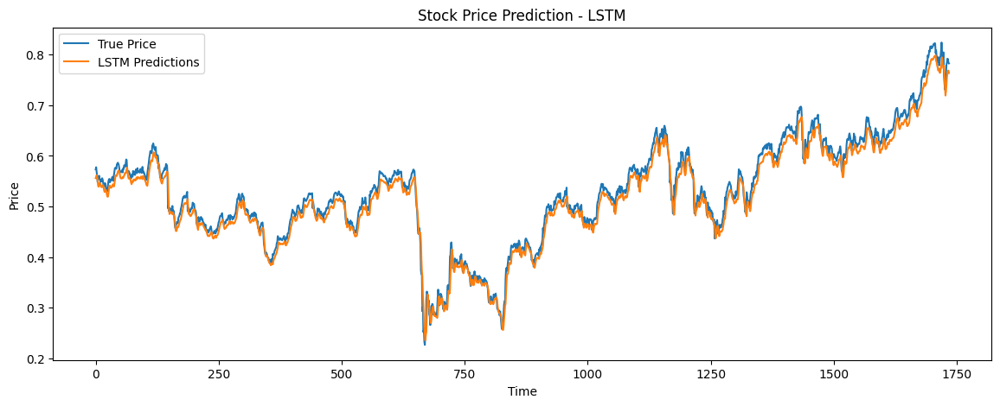

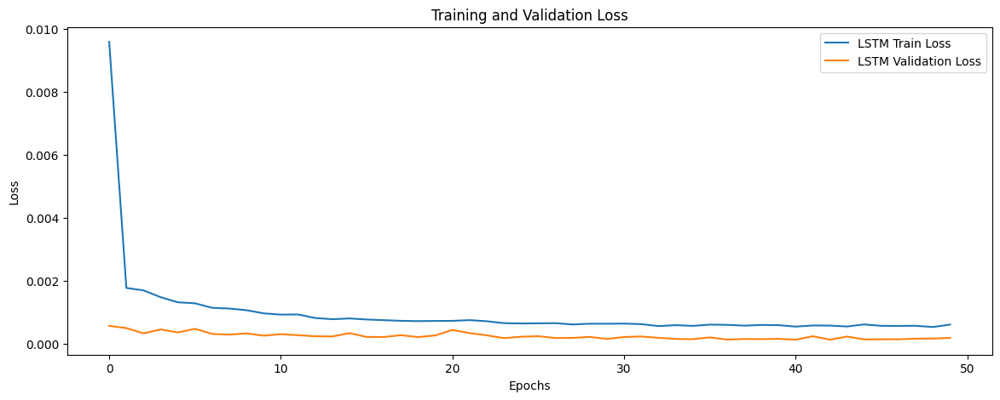

Raw LSTM Future Predictions (Before Inverse Transform):
[0.76316959 0.751221   0.7376495  0.72495025 0.71350843 0.70315307
 0.69359857 0.68458468 0.67592013 0.66748452 0.65921003 0.65106702
 0.64304799 0.63515514 0.62739325 0.61976874 0.61228371 0.6049369
 0.59772485 0.59064609 0.58369404 0.57686317 0.57014632 0.56353885
 0.55703604 0.55063486 0.54433233 0.53812671 0.53201663 0.52600026]

LSTM Future Predictions (After Inverse Transform):
[32.63341306 32.18511309 31.67592283 31.19945875 30.7701719  30.38164854
 30.02317226 29.68497933 29.35989341 29.04339718 28.73294569 28.42742751
 28.12656085 27.83042847 27.53920926 27.25314475 26.97231321 26.69666768
 26.42607844 26.1604896  25.89965516 25.64336714 25.39135719 25.14345086
 24.8994715  24.65930505 24.4228397  24.19001059 23.96076628 23.73503746]


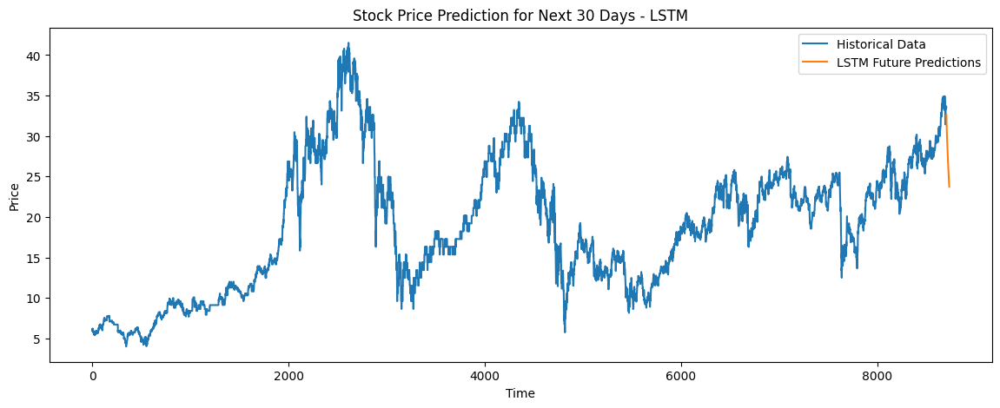

In [ ]:
#model4
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler

# Assume X_train, Y_train, X_test, Y_test are already defined and preprocessed

# Define LSTM model
def create_lstm_model(input_shape=(30, 1), lstm_units=64, dropout_rate=0.2, lr=0.001):
    model = Sequential()
    model.add(LSTM(units=lstm_units, return_sequences=True, input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(units=lstm_units, return_sequences=False))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# Train the model
lstm_model = create_lstm_model(input_shape=(X_train.shape[1], 1))
lstm_history = lstm_model.fit(X_train, Y_train, batch_size=64, epochs=50, verbose=1, validation_split=0.2)

# Predictions
lstm_predictions = lstm_model.predict(X_test)

# Misalnya, kita fit scaler dengan data training
scaler = MinMaxScaler()
scaler.fit(Y_train.reshape(-1, 1))

# Inverse scaling
lstm_predictions = scaler.inverse_transform(lstm_predictions)
Y_test_unscaled = scaler.inverse_transform(Y_test.reshape(-1, 1))

# Calculate MAPE
lstm_mape = mean_absolute_percentage_error(Y_test_unscaled, lstm_predictions)
print(f'LSTM MAPE: {lstm_mape:.4f}')

# Plot the results
plt.figure(figsize=(14, 5))
plt.plot(Y_test_unscaled, label='True Price')
plt.plot(lstm_predictions, label='LSTM Predictions')
plt.title('Stock Price Prediction - LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()

# Plot the training and validation loss for both models
plt.figure(figsize=(14, 5))
plt.plot(lstm_history.history['loss'], label='LSTM Train Loss')
plt.plot(lstm_history.history['val_loss'], label='LSTM Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Assume lstm_model, data, and scaled_data are already defined and preprocessed
time_step = 30  # Sesuaikan dengan time step yang Anda gunakan

# Fit scaler dengan data asli (bukan data yang sudah discaled)
scaler = MinMaxScaler()
scaler.fit(data.reshape(-1, 1))  # Fit dengan data asli

# Fungsi untuk prediksi 30 hari ke depan
def predict_next_30_days(model, data, time_step):
    temp_input = data[-time_step:].reshape(1, -1)  # Ambil data terakhir sebanyak time_step dan reshape
    temp_input = list(temp_input[0])  # Ubah menjadi list
    lst_output = []
    n_steps = time_step
    i = 0
    while(i < 30):
        if len(temp_input) > n_steps:
            x_input = np.array(temp_input[-n_steps:])  # Ambil hanya n_steps terakhir dan ubah menjadi numpy array
            x_input = x_input.reshape(1, n_steps, 1)
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
        else:
            x_input = np.array(temp_input).reshape((1, n_steps, 1))  # Ubah list menjadi numpy array dan reshape
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
    return np.array(lst_output).reshape(-1, 1)

# Prediksi tanpa inverse transform
lstm_future_predictions_raw = predict_next_30_days(lstm_model, scaled_data, time_step)

# Print prediksi raw (sebelum inverse transform)
print("Raw LSTM Future Predictions (Before Inverse Transform):")
print(lstm_future_predictions_raw.flatten())

# Lakukan inverse transform pada prediksi
lstm_future_predictions = scaler.inverse_transform(lstm_future_predictions_raw)

# Print prediksi setelah inverse transform
print("\nLSTM Future Predictions (After Inverse Transform):")
print(lstm_future_predictions.flatten())

# Plot hasil prediksi
plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(data)), data, label='Historical Data')
plt.plot(np.arange(len(data), len(data) + 30), lstm_future_predictions, label='LSTM Future Predictions')
plt.title('Stock Price Prediction for Next 30 Days - LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()



/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 20s 116ms/step - loss: 0.0341 - val_loss: 4.3871e-04
Epoch 2/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.0019 - val_loss: 3.3497e-04
Epoch 3/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 13s 135ms/step - loss: 0.0017 - val_loss: 3.1949e-04
Epoch 4/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 8s 92ms/step - loss: 0.0015 - val_loss: 5.7966e-04
Epoch 5/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 10s 112ms/step - loss: 0.0013 - val_loss: 3.1654e-04
Epoch 6/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.0012 - val_loss: 2.8654e-04
Epoch 7/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - loss: 0.0011 - val_loss: 2.8838e-04
Epoch 8/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.0010 - val_loss: 2.6741e-04
Epoch 9/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - loss: 0.0010 - val_loss: 2.7497e-04
Epoch 10/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 7s 82ms/step - loss: 8.9150e-04 - val_loss: 4.4517e-04
Epoch 11/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 12s 109ms/step - loss: 0.0010 - val_loss: 2.6349e

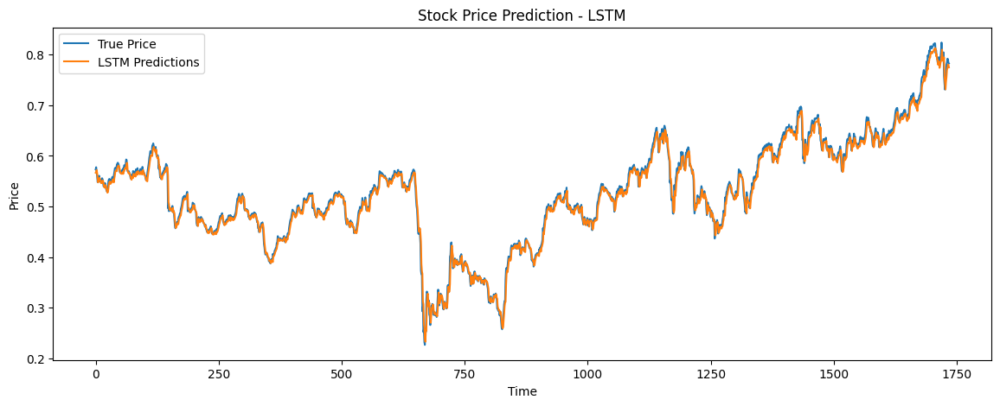

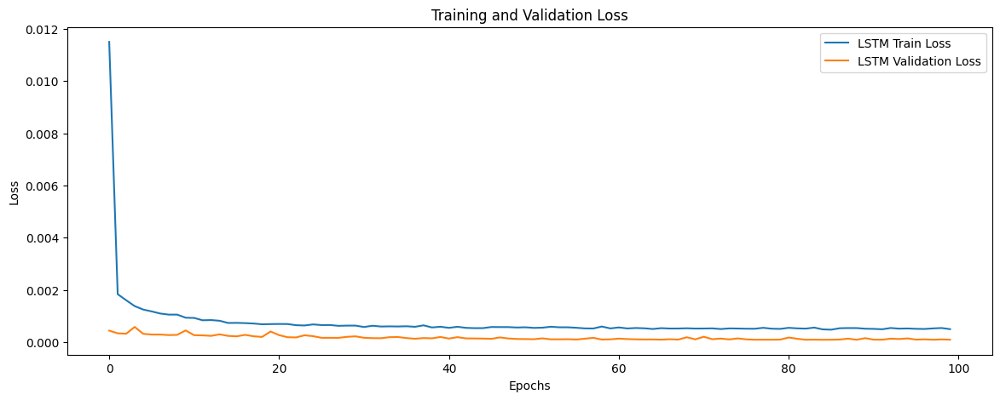

Raw LSTM Future Predictions (Before Inverse Transform):
[0.77816147 0.77060854 0.76473296 0.75928283 0.7543354  0.74972379
 0.74532038 0.7410326  0.7368027  0.73260063 0.72841406 0.72424144
 0.72008693 0.71595693 0.71185696 0.7077924  0.70376754 0.69978577
 0.69584739 0.69195408 0.68810606 0.6843037  0.68054581 0.67683172
 0.67316025 0.66953033 0.66594088 0.66239107 0.65888011 0.65540761]

LSTM Future Predictions (After Inverse Transform):
[33.19589463 32.91251594 32.69206928 32.48758542 32.30196261 32.12893918
 31.96372719 31.80285364 31.64415155 31.48649382 31.32941753 31.17286453
 31.01699138 30.86203734 30.70821041 30.55571185 30.40470267 30.25531035
 30.10754606 29.96147242 29.81709838 29.67443735 29.53344461 29.39409556
 29.25634548 29.1201541  28.98548118 28.8522954  28.72056771 28.59028243]


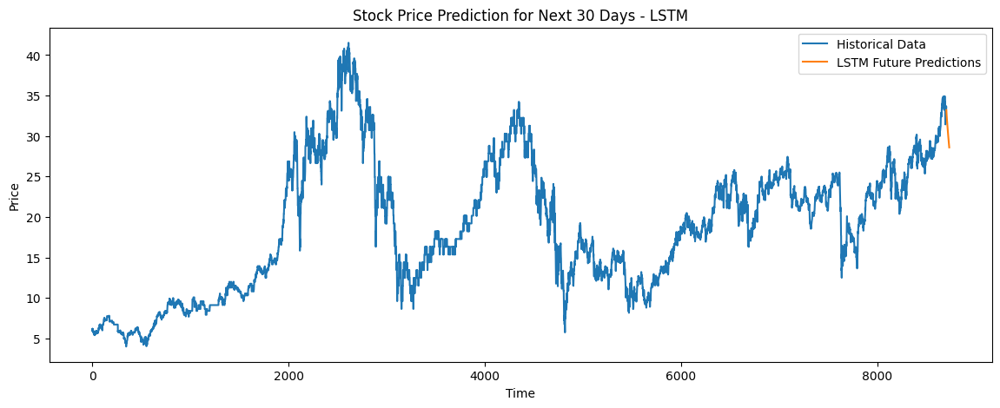

In [ ]:
#model5
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler

# Assume X_train, Y_train, X_test, Y_test are already defined and preprocessed

# Define LSTM model
def create_lstm_model(input_shape=(30, 1), lstm_units=64, dropout_rate=0.2, lr=0.001):
    model = Sequential()
    model.add(LSTM(units=lstm_units, return_sequences=True, input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(units=lstm_units, return_sequences=False))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# Train the model
lstm_model = create_lstm_model(input_shape=(X_train.shape[1], 1))
lstm_history = lstm_model.fit(X_train, Y_train, batch_size=64, epochs=100, verbose=1, validation_split=0.2)

# Predictions
lstm_predictions = lstm_model.predict(X_test)

# Misalnya, kita fit scaler dengan data training
scaler = MinMaxScaler()
scaler.fit(Y_train.reshape(-1, 1))

# Inverse scaling
lstm_predictions = scaler.inverse_transform(lstm_predictions)
Y_test_unscaled = scaler.inverse_transform(Y_test.reshape(-1, 1))

# Calculate MAPE
lstm_mape = mean_absolute_percentage_error(Y_test_unscaled, lstm_predictions)
print(f'LSTM MAPE: {lstm_mape:.4f}')

# Plot the results
plt.figure(figsize=(14, 5))
plt.plot(Y_test_unscaled, label='True Price')
plt.plot(lstm_predictions, label='LSTM Predictions')
plt.title('Stock Price Prediction - LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()

# Plot the training and validation loss for both models
plt.figure(figsize=(14, 5))
plt.plot(lstm_history.history['loss'], label='LSTM Train Loss')
plt.plot(lstm_history.history['val_loss'], label='LSTM Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Assume lstm_model, data, and scaled_data are already defined and preprocessed
time_step = 30  # Sesuaikan dengan time step yang Anda gunakan

# Fit scaler dengan data asli (bukan data yang sudah discaled)
scaler = MinMaxScaler()
scaler.fit(data.reshape(-1, 1))  # Fit dengan data asli

# Fungsi untuk prediksi 30 hari ke depan
def predict_next_30_days(model, data, time_step):
    temp_input = data[-time_step:].reshape(1, -1)  # Ambil data terakhir sebanyak time_step dan reshape
    temp_input = list(temp_input[0])  # Ubah menjadi list
    lst_output = []
    n_steps = time_step
    i = 0
    while(i < 30):
        if len(temp_input) > n_steps:
            x_input = np.array(temp_input[-n_steps:])  # Ambil hanya n_steps terakhir dan ubah menjadi numpy array
            x_input = x_input.reshape(1, n_steps, 1)
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
        else:
            x_input = np.array(temp_input).reshape((1, n_steps, 1))  # Ubah list menjadi numpy array dan reshape
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
    return np.array(lst_output).reshape(-1, 1)

# Prediksi tanpa inverse transform
lstm_future_predictions_raw = predict_next_30_days(lstm_model, scaled_data, time_step)

# Print prediksi raw (sebelum inverse transform)
print("Raw LSTM Future Predictions (Before Inverse Transform):")
print(lstm_future_predictions_raw.flatten())

# Lakukan inverse transform pada prediksi
lstm_future_predictions = scaler.inverse_transform(lstm_future_predictions_raw)

# Print prediksi setelah inverse transform
print("\nLSTM Future Predictions (After Inverse Transform):")
print(lstm_future_predictions.flatten())

# Plot hasil prediksi
plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(data)), data, label='Historical Data')
plt.plot(np.arange(len(data), len(data) + 30), lstm_future_predictions, label='LSTM Future Predictions')
plt.title('Stock Price Prediction for Next 30 Days - LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()



/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step - loss: 0.0292 - val_loss: 3.9252e-04
Epoch 2/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step - loss: 0.0019 - val_loss: 3.3365e-04
Epoch 3/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step - loss: 0.0016 - val_loss: 3.7232e-04
Epoch 4/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.0014 - val_loss: 3.0508e-04
Epoch 5/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 6s 64ms/step - loss: 0.0015 - val_loss: 4.2416e-04
Epoch 6/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.0013 - val_loss: 2.9903e-04
Epoch 7/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step - loss: 0.0011 - val_loss: 4.2261e-04
Epoch 8/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 5s 56ms/step - loss: 0.0011 - val_loss: 4.7954e-04
Epoch 9/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 9.6481e-04 - val_loss: 2.7497e-04
Epoch 10/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 6s 55ms/step - loss: 8.9280e-04 - val_loss: 2.4802e-04
Epoch 11/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 5s 55ms/step - loss: 8.1768e-04 - val_loss: 2.3533e

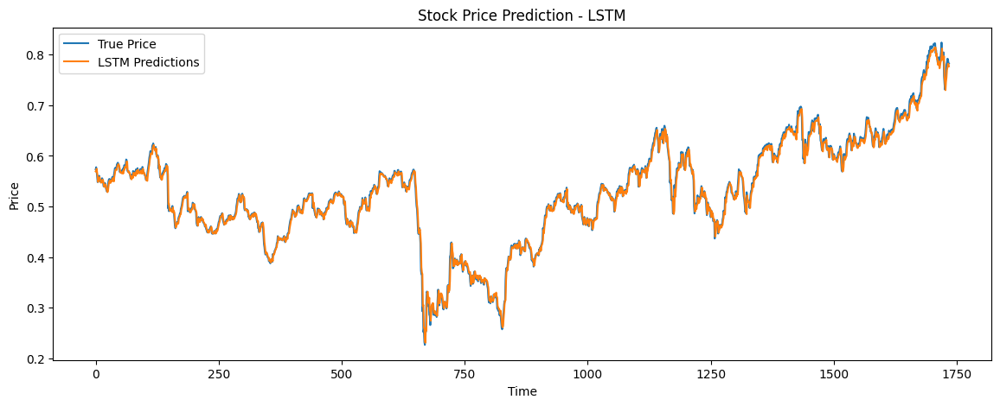

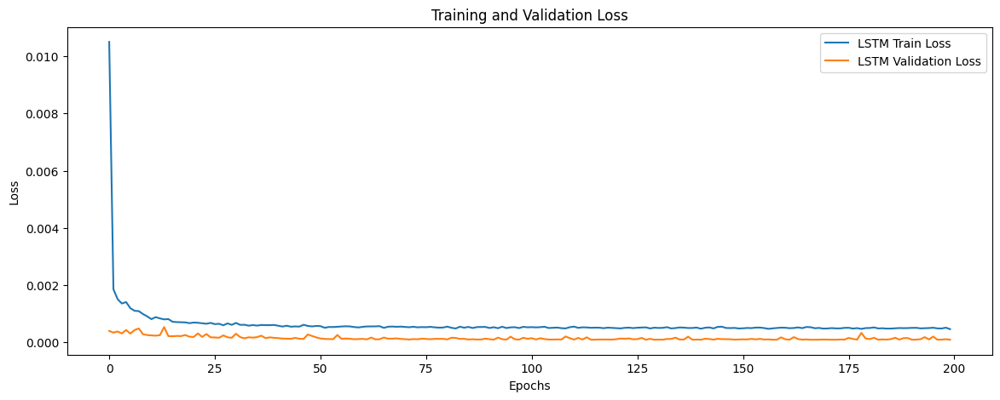

Raw LSTM Future Predictions (Before Inverse Transform):
[0.78074437 0.77438658 0.76934451 0.76445997 0.75971067 0.75500017
 0.75030434 0.74560815 0.74087286 0.73613733 0.73142093 0.72672337
 0.72207034 0.71749115 0.71294659 0.7084527  0.70403147 0.69971091
 0.69539857 0.69114262 0.68694121 0.68283468 0.67880708 0.67486793
 0.67100036 0.66721112 0.66349155 0.65983146 0.65623844 0.65272588]

LSTM Future Predictions (After Inverse Transform):
[33.29280296 33.05426455 32.86509048 32.68182698 32.50363767 32.3269042
 32.15072086 31.9745241  31.79686033 31.6191876  31.44223274 31.26598455
 31.09140688 30.9196     30.74909243 30.58048571 30.41460506 30.25250154
 30.09070663 29.93102727 29.77339414 29.61932122 29.46820917 29.32041581
 29.17530825 29.03313922 28.89358443 28.75626147 28.62145437 28.48966629]


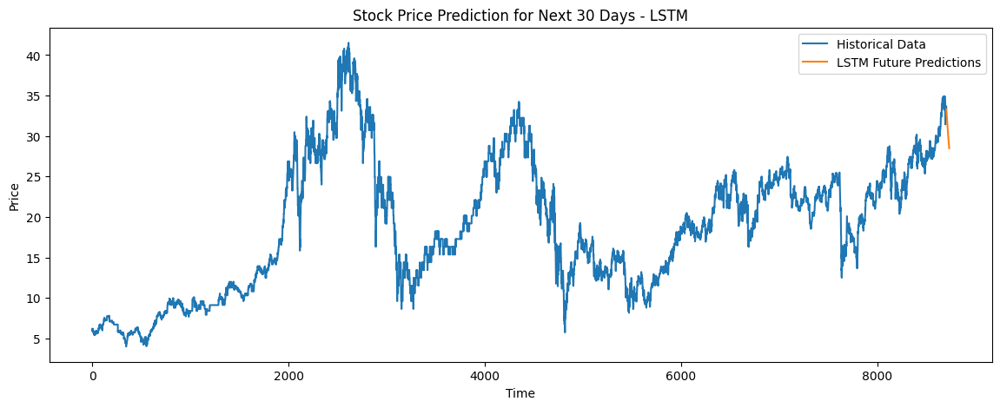

In [ ]:
#model6
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler

# Assume X_train, Y_train, X_test, Y_test are already defined and preprocessed

# Define LSTM model
def create_lstm_model(input_shape=(30, 1), lstm_units=64, dropout_rate=0.2, lr=0.001):
    model = Sequential()
    model.add(LSTM(units=lstm_units, return_sequences=True, input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(units=lstm_units, return_sequences=False))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# Train the model
lstm_model = create_lstm_model(input_shape=(X_train.shape[1], 1))
lstm_history = lstm_model.fit(X_train, Y_train, batch_size=64, epochs=200, verbose=1, validation_split=0.2)

# Predictions
lstm_predictions = lstm_model.predict(X_test)

# Misalnya, kita fit scaler dengan data training
scaler = MinMaxScaler()
scaler.fit(Y_train.reshape(-1, 1))

# Inverse scaling
lstm_predictions = scaler.inverse_transform(lstm_predictions)
Y_test_unscaled = scaler.inverse_transform(Y_test.reshape(-1, 1))

# Calculate MAPE
lstm_mape = mean_absolute_percentage_error(Y_test_unscaled, lstm_predictions)
print(f'LSTM MAPE: {lstm_mape:.4f}')

# Plot the results
plt.figure(figsize=(14, 5))
plt.plot(Y_test_unscaled, label='True Price')
plt.plot(lstm_predictions, label='LSTM Predictions')
plt.title('Stock Price Prediction - LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()

# Plot the training and validation loss for both models
plt.figure(figsize=(14, 5))
plt.plot(lstm_history.history['loss'], label='LSTM Train Loss')
plt.plot(lstm_history.history['val_loss'], label='LSTM Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Assume lstm_model, data, and scaled_data are already defined and preprocessed
time_step = 30  # Sesuaikan dengan time step yang Anda gunakan

# Fit scaler dengan data asli (bukan data yang sudah discaled)
scaler = MinMaxScaler()
scaler.fit(data.reshape(-1, 1))  # Fit dengan data asli

# Fungsi untuk prediksi 30 hari ke depan
def predict_next_30_days(model, data, time_step):
    temp_input = data[-time_step:].reshape(1, -1)  # Ambil data terakhir sebanyak time_step dan reshape
    temp_input = list(temp_input[0])  # Ubah menjadi list
    lst_output = []
    n_steps = time_step
    i = 0
    while(i < 30):
        if len(temp_input) > n_steps:
            x_input = np.array(temp_input[-n_steps:])  # Ambil hanya n_steps terakhir dan ubah menjadi numpy array
            x_input = x_input.reshape(1, n_steps, 1)
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
        else:
            x_input = np.array(temp_input).reshape((1, n_steps, 1))  # Ubah list menjadi numpy array dan reshape
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
    return np.array(lst_output).reshape(-1, 1)

# Prediksi tanpa inverse transform
lstm_future_predictions_raw = predict_next_30_days(lstm_model, scaled_data, time_step)

# Print prediksi raw (sebelum inverse transform)
print("Raw LSTM Future Predictions (Before Inverse Transform):")
print(lstm_future_predictions_raw.flatten())

# Lakukan inverse transform pada prediksi
lstm_future_predictions = scaler.inverse_transform(lstm_future_predictions_raw)

# Print prediksi setelah inverse transform
print("\nLSTM Future Predictions (After Inverse Transform):")
print(lstm_future_predictions.flatten())

# Plot hasil prediksi
plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(data)), data, label='Historical Data')
plt.plot(np.arange(len(data), len(data) + 30), lstm_future_predictions, label='LSTM Future Predictions')
plt.title('Stock Price Prediction for Next 30 Days - LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()

Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


174/174 ━━━━━━━━━━━━━━━━━━━━ 11s 46ms/step - loss: 0.0108 - val_loss: 2.5708e-04
Epoch 2/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.0014 - val_loss: 2.5671e-04
Epoch 3/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0010 - val_loss: 2.9655e-04
Epoch 4/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 9.4858e-04 - val_loss: 5.4799e-04
Epoch 5/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 9.1802e-04 - val_loss: 1.9681e-04
Epoch 6/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 8.6236e-04 - val_loss: 2.9576e-04
Epoch 7/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 8.1411e-04 - val_loss: 3.9909e-04
Epoch 8/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 9.0404e-04 - val_loss: 2.2634e-04
Epoch 9/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step - loss: 7.5247e-04 - val_loss: 1.9683e-04
Epoch 10/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 7.4002e-04 - val_loss: 1.1578e-04
Epoch 11/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 6.08

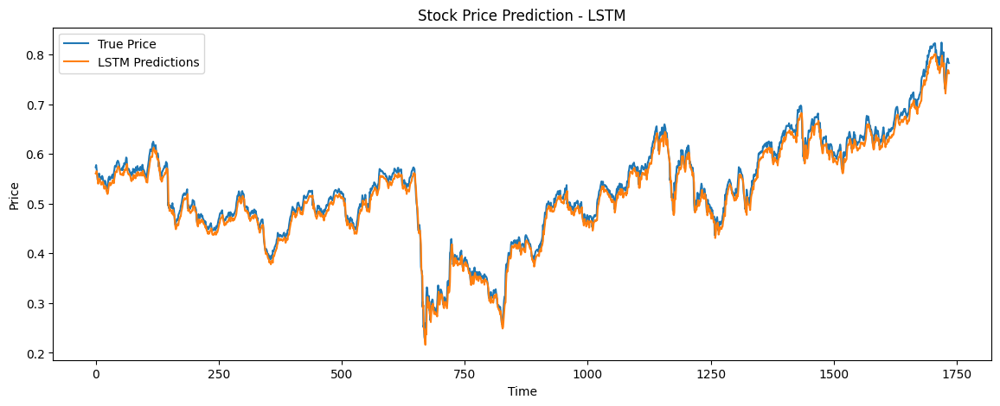

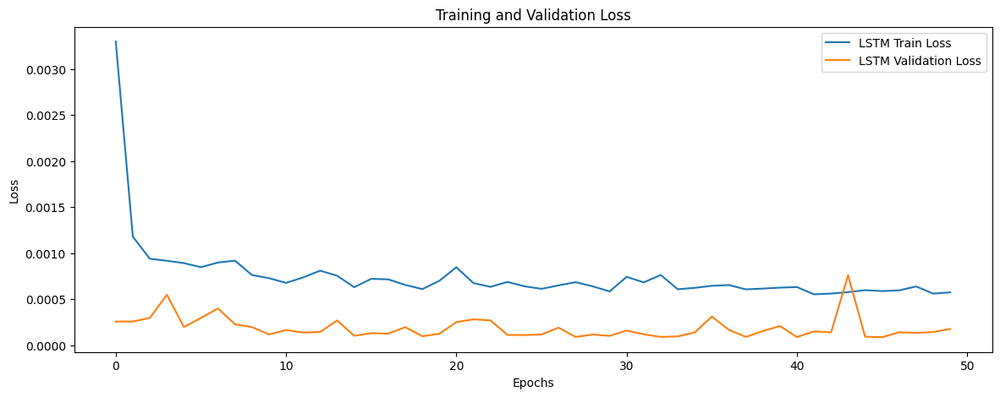

Raw LSTM Future Predictions (Before Inverse Transform):
[0.76653188 0.74981308 0.73721707 0.72572482 0.71478009 0.70509958
 0.69573581 0.68630815 0.67665398 0.66664362 0.65634763 0.64585418
 0.63525963 0.62463611 0.61403537 0.60348141 0.59298038 0.58252919
 0.57214141 0.5618102  0.55153763 0.54131889 0.53115559 0.52104497
 0.51098883 0.50098467 0.49103072 0.48112831 0.47127539 0.46146667]

LSTM Future Predictions (After Inverse Transform):
[32.7595634  32.13228918 31.65969839 31.22851962 30.81788361 30.45467977
 30.10335968 29.74964228 29.38742688 29.01184729 28.6255513  28.2318464
 27.83434872 27.43576419 27.03803394 26.64205918 26.24807028 25.85595092
 25.46621101 25.07859335 24.69317623 24.30977849 23.92846053 23.54911946
 23.17182238 22.79647537 22.42301245 22.05148282 21.68181044 21.31379629]


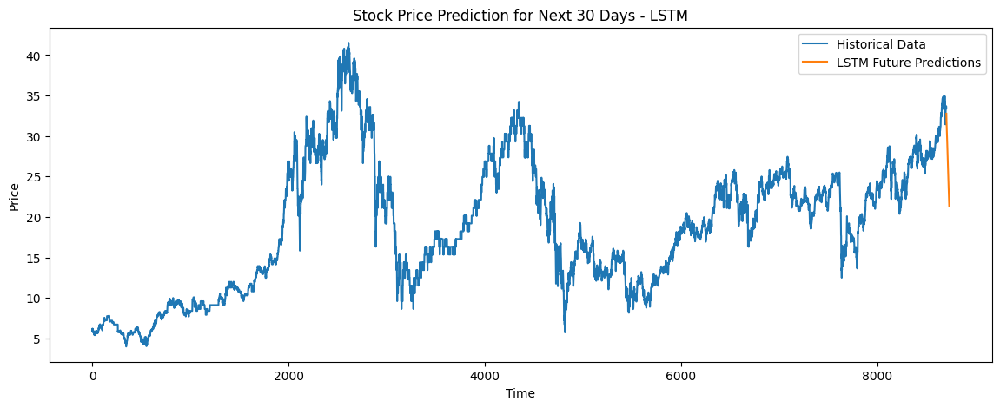

In [ ]:
#model7
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler

# Assume X_train, Y_train, X_test, Y_test are already defined and preprocessed

# Define LSTM model
def create_lstm_model(input_shape=(30, 1), lstm_units=64, dropout_rate=0.5, lr=0.001):
    model = Sequential()
    model.add(LSTM(units=lstm_units, return_sequences=True, input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(units=lstm_units, return_sequences=False))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# Train the model
lstm_model = create_lstm_model(input_shape=(X_train.shape[1], 1))
lstm_history = lstm_model.fit(X_train, Y_train, batch_size=32, epochs=50, verbose=1, validation_split=0.2)

# Predictions
lstm_predictions = lstm_model.predict(X_test)

# Misalnya, kita fit scaler dengan data training
scaler = MinMaxScaler()
scaler.fit(Y_train.reshape(-1, 1))

# Inverse scaling
lstm_predictions = scaler.inverse_transform(lstm_predictions)
Y_test_unscaled = scaler.inverse_transform(Y_test.reshape(-1, 1))

# Calculate MAPE
lstm_mape = mean_absolute_percentage_error(Y_test_unscaled, lstm_predictions)
print(f'LSTM MAPE: {lstm_mape:.4f}')

# Plot the results
plt.figure(figsize=(14, 5))
plt.plot(Y_test_unscaled, label='True Price')
plt.plot(lstm_predictions, label='LSTM Predictions')
plt.title('Stock Price Prediction - LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()

# Plot the training and validation loss for both models
plt.figure(figsize=(14, 5))
plt.plot(lstm_history.history['loss'], label='LSTM Train Loss')
plt.plot(lstm_history.history['val_loss'], label='LSTM Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Assume lstm_model, data, and scaled_data are already defined and preprocessed
time_step = 30  # Sesuaikan dengan time step yang Anda gunakan

# Fit scaler dengan data asli (bukan data yang sudah discaled)
scaler = MinMaxScaler()
scaler.fit(data.reshape(-1, 1))  # Fit dengan data asli

# Fungsi untuk prediksi 30 hari ke depan
def predict_next_30_days(model, data, time_step):
    temp_input = data[-time_step:].reshape(1, -1)  # Ambil data terakhir sebanyak time_step dan reshape
    temp_input = list(temp_input[0])  # Ubah menjadi list
    lst_output = []
    n_steps = time_step
    i = 0
    while(i < 30):
        if len(temp_input) > n_steps:
            x_input = np.array(temp_input[-n_steps:])  # Ambil hanya n_steps terakhir dan ubah menjadi numpy array
            x_input = x_input.reshape(1, n_steps, 1)
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
        else:
            x_input = np.array(temp_input).reshape((1, n_steps, 1))  # Ubah list menjadi numpy array dan reshape
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
    return np.array(lst_output).reshape(-1, 1)

# Prediksi tanpa inverse transform
lstm_future_predictions_raw = predict_next_30_days(lstm_model, scaled_data, time_step)

# Print prediksi raw (sebelum inverse transform)
print("Raw LSTM Future Predictions (Before Inverse Transform):")
print(lstm_future_predictions_raw.flatten())

# Lakukan inverse transform pada prediksi
lstm_future_predictions = scaler.inverse_transform(lstm_future_predictions_raw)

# Print prediksi setelah inverse transform
print("\nLSTM Future Predictions (After Inverse Transform):")
print(lstm_future_predictions.flatten())

# Plot hasil prediksi
plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(data)), data, label='Historical Data')
plt.plot(np.arange(len(data), len(data) + 30), lstm_future_predictions, label='LSTM Future Predictions')
plt.title('Stock Price Prediction for Next 30 Days - LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()



Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


174/174 ━━━━━━━━━━━━━━━━━━━━ 13s 50ms/step - loss: 0.0254 - val_loss: 4.7830e-04
Epoch 2/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.0033 - val_loss: 3.4839e-04
Epoch 3/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step - loss: 0.0022 - val_loss: 4.0026e-04
Epoch 4/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.0023 - val_loss: 3.1484e-04
Epoch 5/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.0019 - val_loss: 3.1452e-04
Epoch 6/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.0018 - val_loss: 3.8095e-04
Epoch 7/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0018 - val_loss: 2.7439e-04
Epoch 8/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 11s 41ms/step - loss: 0.0018 - val_loss: 3.7301e-04
Epoch 9/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0017 - val_loss: 2.8275e-04
Epoch 10/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0020 - val_loss: 2.4207e-04
Epoch 11/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.0018 - val_loss: 3.4

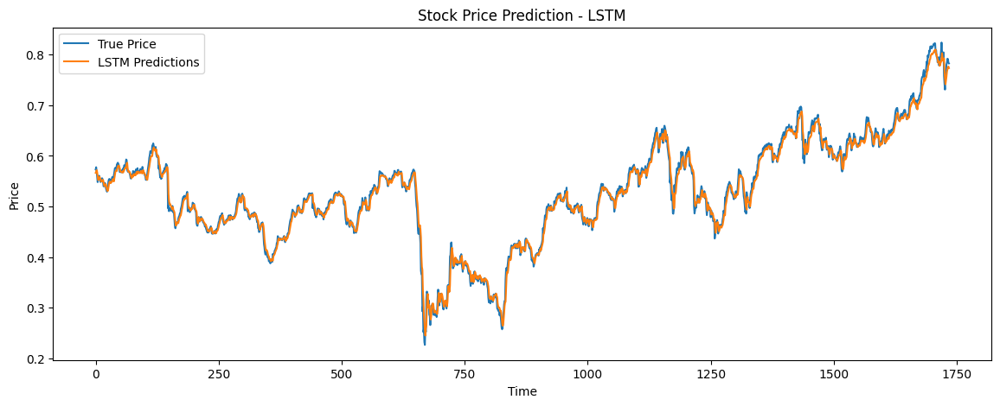

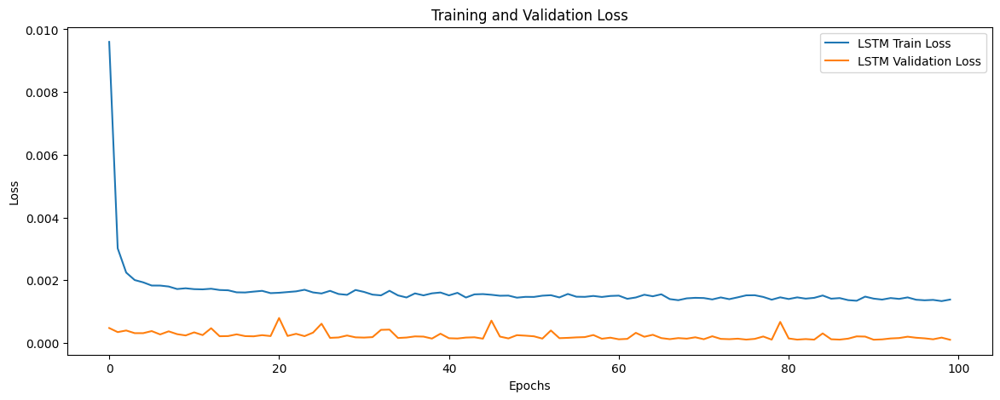

Raw LSTM Future Predictions (Before Inverse Transform):
[0.77592826 0.77037376 0.76599938 0.76240844 0.75937039 0.75656366
 0.7538144  0.75105947 0.74829006 0.74551493 0.74274731 0.73999542
 0.73726481 0.73455966 0.73188257 0.72923243 0.72661054 0.72401875
 0.72145742 0.71892267 0.71641564 0.71393704 0.71148944 0.70907301
 0.70668799 0.70433331 0.70200795 0.69971067 0.69744009 0.69519585]

LSTM Future Predictions (After Inverse Transform):
[33.11210675 32.9037071  32.7395842  32.60485537 32.49087056 32.38556488
 32.28241501 32.17905269 32.07514694 31.97102651 31.86718785 31.76393958
 31.66148967 31.55999467 31.45955297 31.36012208 31.26175121 31.16450967
 31.06841089 30.9733095  30.879248   30.78625322 30.69442132 30.60375901
 30.51427523 30.42592974 30.33868452 30.2524926  30.16730254 30.08310094]


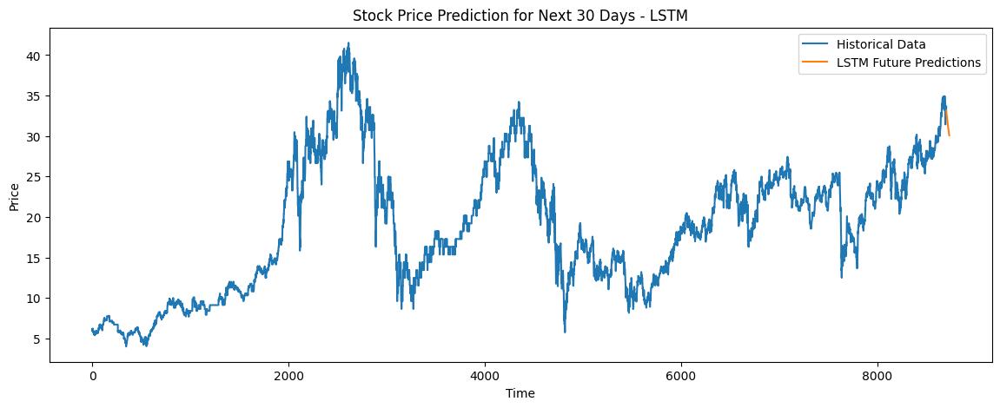

In [ ]:
#model8
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler

# Assume X_train, Y_train, X_test, Y_test are already defined and preprocessed

# Define LSTM model
def create_lstm_model(input_shape=(30, 1), lstm_units=64, dropout_rate=0.5, lr=0.001):
    model = Sequential()
    model.add(LSTM(units=lstm_units, return_sequences=True, input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(units=lstm_units, return_sequences=False))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# Train the model
lstm_model = create_lstm_model(input_shape=(X_train.shape[1], 1))
lstm_history = lstm_model.fit(X_train, Y_train, batch_size=32, epochs=100, verbose=1, validation_split=0.2)

# Predictions
lstm_predictions = lstm_model.predict(X_test)

# Misalnya, kita fit scaler dengan data training
scaler = MinMaxScaler()
scaler.fit(Y_train.reshape(-1, 1))

# Inverse scaling
lstm_predictions = scaler.inverse_transform(lstm_predictions)
Y_test_unscaled = scaler.inverse_transform(Y_test.reshape(-1, 1))

# Calculate MAPE
lstm_mape = mean_absolute_percentage_error(Y_test_unscaled, lstm_predictions)
print(f'LSTM MAPE: {lstm_mape:.4f}')

# Plot the results
plt.figure(figsize=(14, 5))
plt.plot(Y_test_unscaled, label='True Price')
plt.plot(lstm_predictions, label='LSTM Predictions')
plt.title('Stock Price Prediction - LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()

# Plot the training and validation loss for both models
plt.figure(figsize=(14, 5))
plt.plot(lstm_history.history['loss'], label='LSTM Train Loss')
plt.plot(lstm_history.history['val_loss'], label='LSTM Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Assume lstm_model, data, and scaled_data are already defined and preprocessed
time_step = 30  # Sesuaikan dengan time step yang Anda gunakan

# Fit scaler dengan data asli (bukan data yang sudah discaled)
scaler = MinMaxScaler()
scaler.fit(data.reshape(-1, 1))  # Fit dengan data asli

# Fungsi untuk prediksi 30 hari ke depan
def predict_next_30_days(model, data, time_step):
    temp_input = data[-time_step:].reshape(1, -1)  # Ambil data terakhir sebanyak time_step dan reshape
    temp_input = list(temp_input[0])  # Ubah menjadi list
    lst_output = []
    n_steps = time_step
    i = 0
    while(i < 30):
        if len(temp_input) > n_steps:
            x_input = np.array(temp_input[-n_steps:])  # Ambil hanya n_steps terakhir dan ubah menjadi numpy array
            x_input = x_input.reshape(1, n_steps, 1)
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
        else:
            x_input = np.array(temp_input).reshape((1, n_steps, 1))  # Ubah list menjadi numpy array dan reshape
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
    return np.array(lst_output).reshape(-1, 1)

# Prediksi tanpa inverse transform
lstm_future_predictions_raw = predict_next_30_days(lstm_model, scaled_data, time_step)

# Print prediksi raw (sebelum inverse transform)
print("Raw LSTM Future Predictions (Before Inverse Transform):")
print(lstm_future_predictions_raw.flatten())

# Lakukan inverse transform pada prediksi
lstm_future_predictions = scaler.inverse_transform(lstm_future_predictions_raw)

# Print prediksi setelah inverse transform
print("\nLSTM Future Predictions (After Inverse Transform):")
print(lstm_future_predictions.flatten())

# Plot hasil prediksi
plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(data)), data, label='Historical Data')
plt.plot(np.arange(len(data), len(data) + 30), lstm_future_predictions, label='LSTM Future Predictions')
plt.title('Stock Price Prediction for Next 30 Days - LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()



Epoch 1/200


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


174/174 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.0187 - val_loss: 4.1374e-04
Epoch 2/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step - loss: 0.0030 - val_loss: 4.6969e-04
Epoch 3/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.0023 - val_loss: 3.3451e-04
Epoch 4/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0018 - val_loss: 4.9837e-04
Epoch 5/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.0018 - val_loss: 3.9781e-04
Epoch 6/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.0017 - val_loss: 5.5306e-04
Epoch 7/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.0019 - val_loss: 2.6124e-04
Epoch 8/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 13s 52ms/step - loss: 0.0018 - val_loss: 2.8600e-04
Epoch 9/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.0017 - val_loss: 3.5492e-04
Epoch 10/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.0018 - val_loss: 2.4588e-04
Epoch 11/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.0017 - val_loss: 6.6

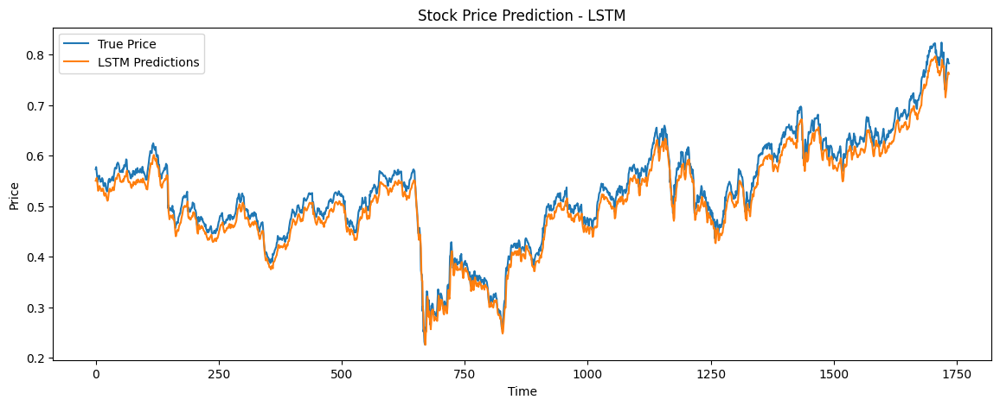

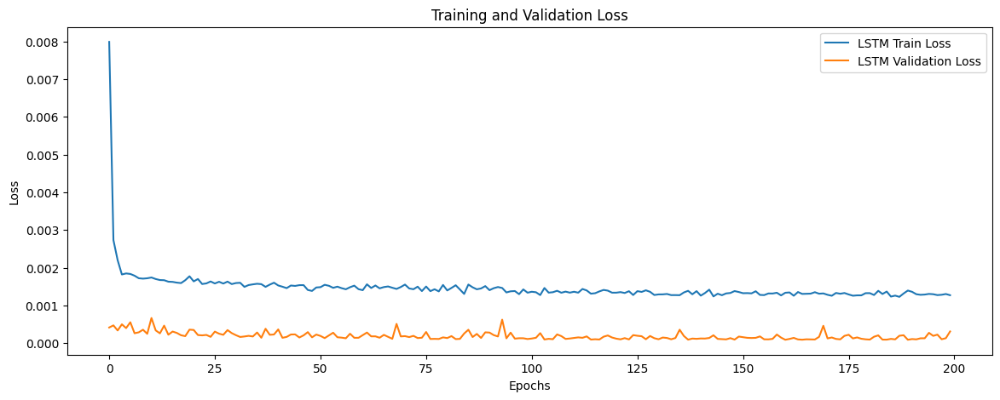

Raw LSTM Future Predictions (Before Inverse Transform):
[0.76215357 0.74460709 0.73171473 0.71598929 0.7002753  0.68459791
 0.66891629 0.65337133 0.63796872 0.62271988 0.60763669 0.59272587
 0.57799298 0.56345201 0.54911566 0.5349983  0.52111185 0.50748134
 0.49411905 0.48103157 0.46822575 0.4557094  0.44348902 0.43156877
 0.41994944 0.40862876 0.39760196 0.38686338 0.37640113 0.36621287]

LSTM Future Predictions (After Inverse Transform):
[32.5952929  31.93696525 31.45325552 30.86325166 30.27367718 29.68547579
 29.09711562 28.51388331 27.93599132 27.36386901 26.79796141 26.23852123
 25.68575643 25.14019256 24.60230594 24.07263554 23.5516286  23.04022439
 22.53888358 22.04785328 21.56739068 21.09778872 20.63929117 20.19205456
 19.75610798 19.33136643 18.91765102 18.51474929 18.1222151  17.73996124]


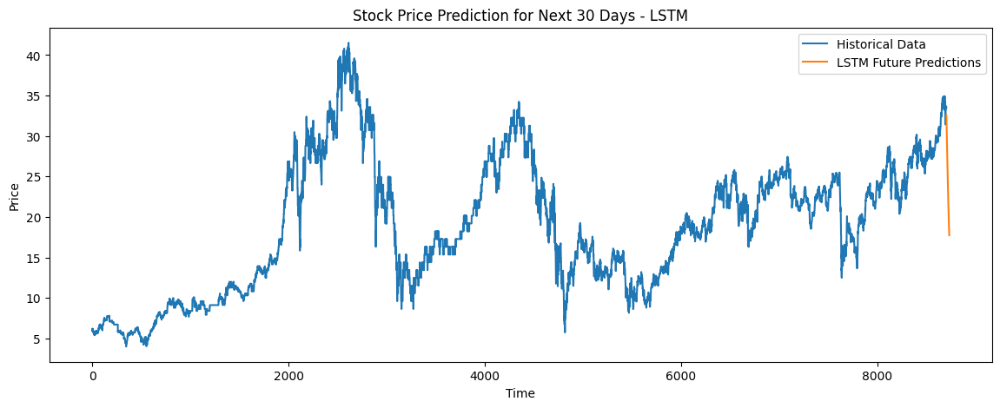

In [ ]:
#model9
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler

# Assume X_train, Y_train, X_test, Y_test are already defined and preprocessed

# Define LSTM model
def create_lstm_model(input_shape=(30, 1), lstm_units=64, dropout_rate=0.5, lr=0.001):
    model = Sequential()
    model.add(LSTM(units=lstm_units, return_sequences=True, input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(units=lstm_units, return_sequences=False))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# Train the model
lstm_model = create_lstm_model(input_shape=(X_train.shape[1], 1))
lstm_history = lstm_model.fit(X_train, Y_train, batch_size=32, epochs=200, verbose=1, validation_split=0.2)

# Predictions
lstm_predictions = lstm_model.predict(X_test)

# Misalnya, kita fit scaler dengan data training
scaler = MinMaxScaler()
scaler.fit(Y_train.reshape(-1, 1))

# Inverse scaling
lstm_predictions = scaler.inverse_transform(lstm_predictions)
Y_test_unscaled = scaler.inverse_transform(Y_test.reshape(-1, 1))

# Calculate MAPE
lstm_mape = mean_absolute_percentage_error(Y_test_unscaled, lstm_predictions)
print(f'LSTM MAPE: {lstm_mape:.4f}')

# Plot the results
plt.figure(figsize=(14, 5))
plt.plot(Y_test_unscaled, label='True Price')
plt.plot(lstm_predictions, label='LSTM Predictions')
plt.title('Stock Price Prediction - LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()

# Plot the training and validation loss for both models
plt.figure(figsize=(14, 5))
plt.plot(lstm_history.history['loss'], label='LSTM Train Loss')
plt.plot(lstm_history.history['val_loss'], label='LSTM Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Assume lstm_model, data, and scaled_data are already defined and preprocessed
time_step = 30  # Sesuaikan dengan time step yang Anda gunakan

# Fit scaler dengan data asli (bukan data yang sudah discaled)
scaler = MinMaxScaler()
scaler.fit(data.reshape(-1, 1))  # Fit dengan data asli

# Fungsi untuk prediksi 30 hari ke depan
def predict_next_30_days(model, data, time_step):
    temp_input = data[-time_step:].reshape(1, -1)  # Ambil data terakhir sebanyak time_step dan reshape
    temp_input = list(temp_input[0])  # Ubah menjadi list
    lst_output = []
    n_steps = time_step
    i = 0
    while(i < 30):
        if len(temp_input) > n_steps:
            x_input = np.array(temp_input[-n_steps:])  # Ambil hanya n_steps terakhir dan ubah menjadi numpy array
            x_input = x_input.reshape(1, n_steps, 1)
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
        else:
            x_input = np.array(temp_input).reshape((1, n_steps, 1))  # Ubah list menjadi numpy array dan reshape
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
    return np.array(lst_output).reshape(-1, 1)

# Prediksi tanpa inverse transform
lstm_future_predictions_raw = predict_next_30_days(lstm_model, scaled_data, time_step)

# Print prediksi raw (sebelum inverse transform)
print("Raw LSTM Future Predictions (Before Inverse Transform):")
print(lstm_future_predictions_raw.flatten())

# Lakukan inverse transform pada prediksi
lstm_future_predictions = scaler.inverse_transform(lstm_future_predictions_raw)

# Print prediksi setelah inverse transform
print("\nLSTM Future Predictions (After Inverse Transform):")
print(lstm_future_predictions.flatten())

# Plot hasil prediksi
plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(data)), data, label='Historical Data')
plt.plot(np.arange(len(data), len(data) + 30), lstm_future_predictions, label='LSTM Future Predictions')
plt.title('Stock Price Prediction for Next 30 Days - LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()



Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


87/87 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step - loss: 0.0223 - val_loss: 4.0021e-04
Epoch 2/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step - loss: 0.0043 - val_loss: 4.5727e-04
Epoch 3/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.0034 - val_loss: 4.0768e-04
Epoch 4/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step - loss: 0.0023 - val_loss: 3.3818e-04
Epoch 5/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0021 - val_loss: 3.6722e-04
Epoch 6/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.0019 - val_loss: 4.6069e-04
Epoch 7/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step - loss: 0.0019 - val_loss: 4.3230e-04
Epoch 8/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.0018 - val_loss: 3.3638e-04
Epoch 9/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.0019 - val_loss: 3.6867e-04
Epoch 10/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.0016 - val_loss: 3.5528e-04
Epoch 11/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0017 - val_loss: 2.7868e-04
Epoch 12/50
87/87 ━━━━━━━━━━━━

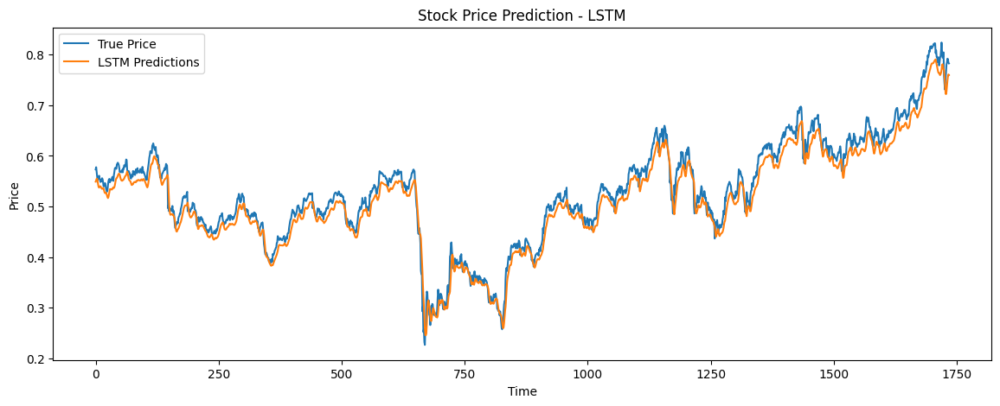

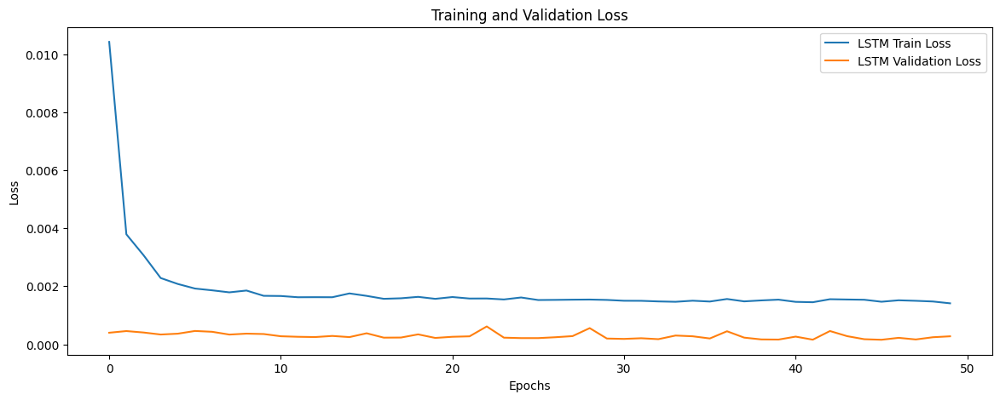

Raw LSTM Future Predictions (Before Inverse Transform):
[0.75564587 0.74698842 0.73598903 0.72484964 0.71441442 0.70483345
 0.69596827 0.68760812 0.67956764 0.67171639 0.66397864 0.6563189
 0.64872724 0.64120805 0.63377053 0.62642425 0.61917752 0.61203623
 0.60500354 0.59807992 0.59126592 0.58456028 0.57796186 0.57146853
 0.56507874 0.55879009 0.55260074 0.54650855 0.54051173 0.53460866]

LSTM Future Predictions (After Inverse Transform):
[32.35113016 32.02631037 31.61362366 31.19568386 30.80416384 30.44469463
 30.1120813  29.79841623 29.4967445  29.20217307 28.91185956 28.62447339
 28.33964109 28.05752815 27.77847895 27.50285354 27.23096277 26.96302804
 26.69916787 26.43940015 26.18374501 25.93215548 25.68458907 25.44096529
 25.20122597 24.96528168 24.73306308 24.50448967 24.27949436 24.05801677]


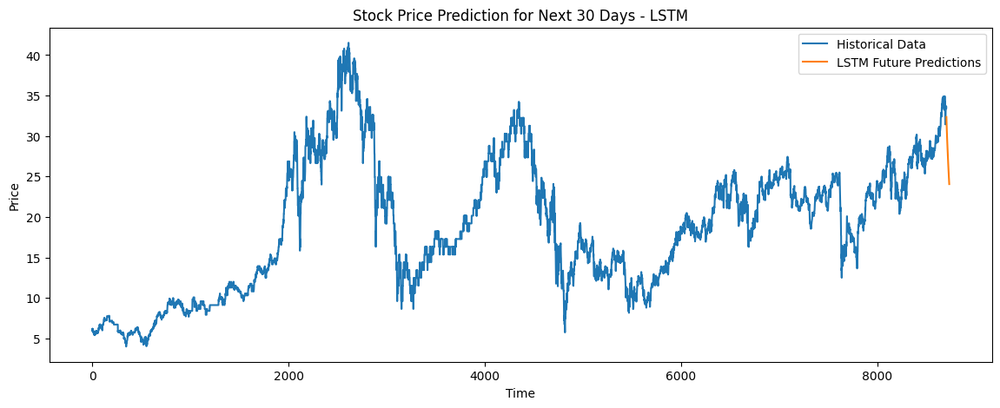

In [ ]:
#model10
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler

# Assume X_train, Y_train, X_test, Y_test are already defined and preprocessed

# Define LSTM model
def create_lstm_model(input_shape=(30, 1), lstm_units=64, dropout_rate=0.5, lr=0.001):
    model = Sequential()
    model.add(LSTM(units=lstm_units, return_sequences=True, input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(units=lstm_units, return_sequences=False))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# Train the model
lstm_model = create_lstm_model(input_shape=(X_train.shape[1], 1))
lstm_history = lstm_model.fit(X_train, Y_train, batch_size=64, epochs=50, verbose=1, validation_split=0.2)

# Predictions
lstm_predictions = lstm_model.predict(X_test)

# Misalnya, kita fit scaler dengan data training
scaler = MinMaxScaler()
scaler.fit(Y_train.reshape(-1, 1))

# Inverse scaling
lstm_predictions = scaler.inverse_transform(lstm_predictions)
Y_test_unscaled = scaler.inverse_transform(Y_test.reshape(-1, 1))

# Calculate MAPE
lstm_mape = mean_absolute_percentage_error(Y_test_unscaled, lstm_predictions)
print(f'LSTM MAPE: {lstm_mape:.4f}')

# Plot the results
plt.figure(figsize=(14, 5))
plt.plot(Y_test_unscaled, label='True Price')
plt.plot(lstm_predictions, label='LSTM Predictions')
plt.title('Stock Price Prediction - LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()

# Plot the training and validation loss for both models
plt.figure(figsize=(14, 5))
plt.plot(lstm_history.history['loss'], label='LSTM Train Loss')
plt.plot(lstm_history.history['val_loss'], label='LSTM Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Assume lstm_model, data, and scaled_data are already defined and preprocessed
time_step = 30  # Sesuaikan dengan time step yang Anda gunakan

# Fit scaler dengan data asli (bukan data yang sudah discaled)
scaler = MinMaxScaler()
scaler.fit(data.reshape(-1, 1))  # Fit dengan data asli

# Fungsi untuk prediksi 30 hari ke depan
def predict_next_30_days(model, data, time_step):
    temp_input = data[-time_step:].reshape(1, -1)  # Ambil data terakhir sebanyak time_step dan reshape
    temp_input = list(temp_input[0])  # Ubah menjadi list
    lst_output = []
    n_steps = time_step
    i = 0
    while(i < 30):
        if len(temp_input) > n_steps:
            x_input = np.array(temp_input[-n_steps:])  # Ambil hanya n_steps terakhir dan ubah menjadi numpy array
            x_input = x_input.reshape(1, n_steps, 1)
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
        else:
            x_input = np.array(temp_input).reshape((1, n_steps, 1))  # Ubah list menjadi numpy array dan reshape
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
    return np.array(lst_output).reshape(-1, 1)

# Prediksi tanpa inverse transform
lstm_future_predictions_raw = predict_next_30_days(lstm_model, scaled_data, time_step)

# Print prediksi raw (sebelum inverse transform)
print("Raw LSTM Future Predictions (Before Inverse Transform):")
print(lstm_future_predictions_raw.flatten())

# Lakukan inverse transform pada prediksi
lstm_future_predictions = scaler.inverse_transform(lstm_future_predictions_raw)

# Print prediksi setelah inverse transform
print("\nLSTM Future Predictions (After Inverse Transform):")
print(lstm_future_predictions.flatten())

# Plot hasil prediksi
plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(data)), data, label='Historical Data')
plt.plot(np.arange(len(data), len(data) + 30), lstm_future_predictions, label='LSTM Future Predictions')
plt.title('Stock Price Prediction for Next 30 Days - LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()



Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


87/87 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - loss: 0.0239 - val_loss: 4.9672e-04
Epoch 2/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 5s 55ms/step - loss: 0.0044 - val_loss: 6.1192e-04
Epoch 3/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0032 - val_loss: 4.1710e-04
Epoch 4/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step - loss: 0.0024 - val_loss: 4.2552e-04
Epoch 5/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step - loss: 0.0021 - val_loss: 3.1894e-04
Epoch 6/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step - loss: 0.0019 - val_loss: 5.0940e-04
Epoch 7/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step - loss: 0.0020 - val_loss: 3.6572e-04
Epoch 8/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step - loss: 0.0017 - val_loss: 5.7162e-04
Epoch 9/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step - loss: 0.0018 - val_loss: 2.8013e-04
Epoch 10/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step - loss: 0.0018 - val_loss: 3.3166e-04
Epoch 11/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0018 - val_loss: 6.9025e-04
Epoch 12/100
87/87

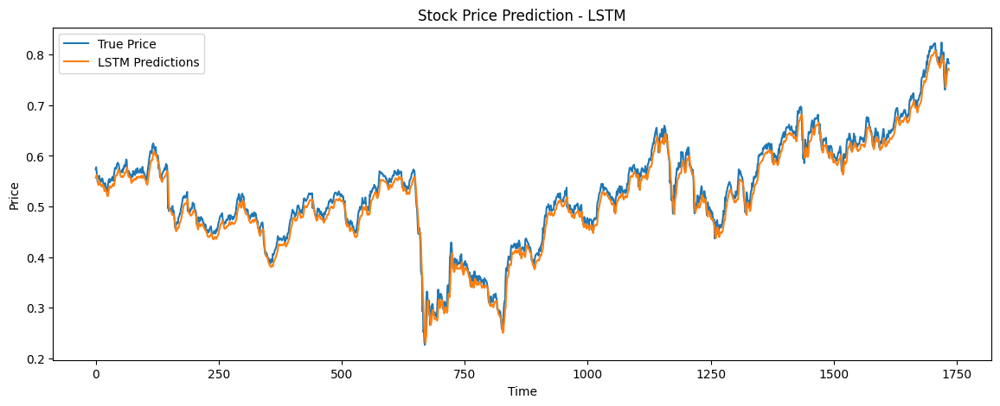

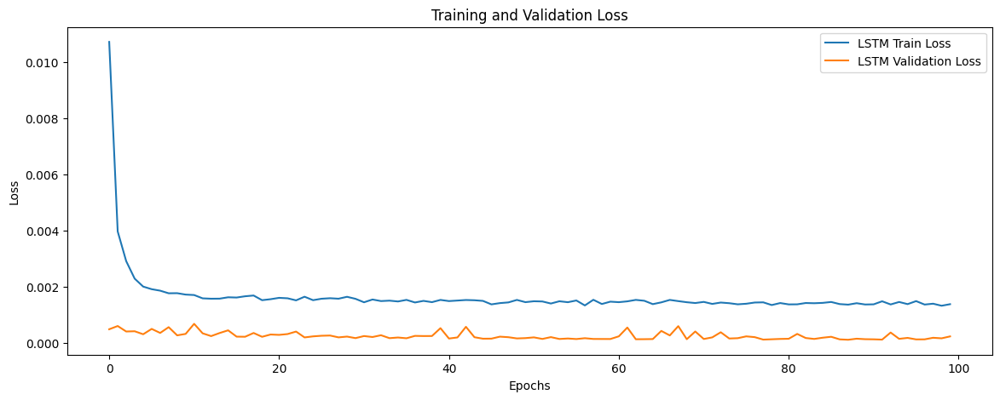

Raw LSTM Future Predictions (Before Inverse Transform):
[0.77072996 0.76508248 0.75835806 0.75237459 0.74723727 0.74256289
 0.73801774 0.73343545 0.72876978 0.72402924 0.71923918 0.71442014
 0.70958495 0.70474154 0.69989413 0.69504291 0.69018865 0.68533278
 0.68047583 0.67561513 0.67075199 0.6658864  0.66102022 0.65615284
 0.65128487 0.64641494 0.64154249 0.6366666  0.63178563 0.62689936]

LSTM Future Predictions (After Inverse Transform):
[32.9170713  32.70518301 32.45288905 32.22839467 32.03564697 31.8602687
 31.68973876 31.5178156  31.34276383 31.16490326 30.98518432 30.80437852
 30.62296669 30.44124624 30.25937596 30.07736256 29.89523511 29.71304727
 29.53081918 29.34845021 29.16598954 28.98343719 28.80086247 28.61824303
 28.43560122 28.25288562 28.07007609 27.88713686 27.70400753 27.52067918]


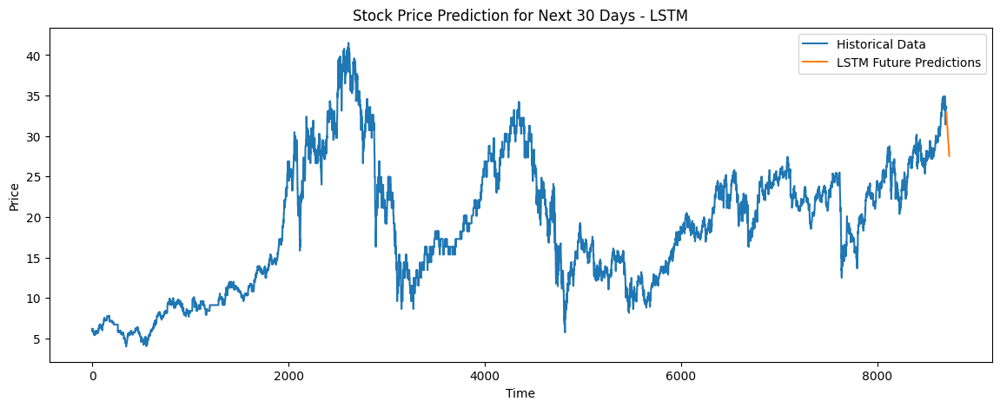

In [ ]:
#model11
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler

# Assume X_train, Y_train, X_test, Y_test are already defined and preprocessed

# Define LSTM model
def create_lstm_model(input_shape=(30, 1), lstm_units=64, dropout_rate=0.5, lr=0.001):
    model = Sequential()
    model.add(LSTM(units=lstm_units, return_sequences=True, input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(units=lstm_units, return_sequences=False))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# Train the model
lstm_model = create_lstm_model(input_shape=(X_train.shape[1], 1))
lstm_history = lstm_model.fit(X_train, Y_train, batch_size=64, epochs=100, verbose=1, validation_split=0.2)

# Predictions
lstm_predictions = lstm_model.predict(X_test)

# Misalnya, kita fit scaler dengan data training
scaler = MinMaxScaler()
scaler.fit(Y_train.reshape(-1, 1))

# Inverse scaling
lstm_predictions = scaler.inverse_transform(lstm_predictions)
Y_test_unscaled = scaler.inverse_transform(Y_test.reshape(-1, 1))

# Calculate MAPE
lstm_mape = mean_absolute_percentage_error(Y_test_unscaled, lstm_predictions)
print(f'LSTM MAPE: {lstm_mape:.4f}')

# Plot the results
plt.figure(figsize=(14, 5))
plt.plot(Y_test_unscaled, label='True Price')
plt.plot(lstm_predictions, label='LSTM Predictions')
plt.title('Stock Price Prediction - LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()

# Plot the training and validation loss for both models
plt.figure(figsize=(14, 5))
plt.plot(lstm_history.history['loss'], label='LSTM Train Loss')
plt.plot(lstm_history.history['val_loss'], label='LSTM Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Assume lstm_model, data, and scaled_data are already defined and preprocessed
time_step = 30  # Sesuaikan dengan time step yang Anda gunakan

# Fit scaler dengan data asli (bukan data yang sudah discaled)
scaler = MinMaxScaler()
scaler.fit(data.reshape(-1, 1))  # Fit dengan data asli

# Fungsi untuk prediksi 30 hari ke depan
def predict_next_30_days(model, data, time_step):
    temp_input = data[-time_step:].reshape(1, -1)  # Ambil data terakhir sebanyak time_step dan reshape
    temp_input = list(temp_input[0])  # Ubah menjadi list
    lst_output = []
    n_steps = time_step
    i = 0
    while(i < 30):
        if len(temp_input) > n_steps:
            x_input = np.array(temp_input[-n_steps:])  # Ambil hanya n_steps terakhir dan ubah menjadi numpy array
            x_input = x_input.reshape(1, n_steps, 1)
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
        else:
            x_input = np.array(temp_input).reshape((1, n_steps, 1))  # Ubah list menjadi numpy array dan reshape
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
    return np.array(lst_output).reshape(-1, 1)

# Prediksi tanpa inverse transform
lstm_future_predictions_raw = predict_next_30_days(lstm_model, scaled_data, time_step)

# Print prediksi raw (sebelum inverse transform)
print("Raw LSTM Future Predictions (Before Inverse Transform):")
print(lstm_future_predictions_raw.flatten())

# Lakukan inverse transform pada prediksi
lstm_future_predictions = scaler.inverse_transform(lstm_future_predictions_raw)

# Print prediksi setelah inverse transform
print("\nLSTM Future Predictions (After Inverse Transform):")
print(lstm_future_predictions.flatten())

# Plot hasil prediksi
plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(data)), data, label='Historical Data')
plt.plot(np.arange(len(data), len(data) + 30), lstm_future_predictions, label='LSTM Future Predictions')
plt.title('Stock Price Prediction for Next 30 Days - LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()



Epoch 1/200


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


87/87 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - loss: 0.0237 - val_loss: 3.9251e-04
Epoch 2/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.0040 - val_loss: 5.8494e-04
Epoch 3/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.0030 - val_loss: 3.4996e-04
Epoch 4/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.0025 - val_loss: 3.4600e-04
Epoch 5/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.0023 - val_loss: 3.9640e-04
Epoch 6/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.0019 - val_loss: 3.8877e-04
Epoch 7/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.0018 - val_loss: 3.0567e-04
Epoch 8/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.0017 - val_loss: 4.0216e-04
Epoch 9/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step - loss: 0.0017 - val_loss: 4.1961e-04
Epoch 10/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 5s 55ms/step - loss: 0.0016 - val_loss: 2.9916e-04
Epoch 11/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.0016 - val_loss: 2.9038e-04
Epoch 12/200
87/87 

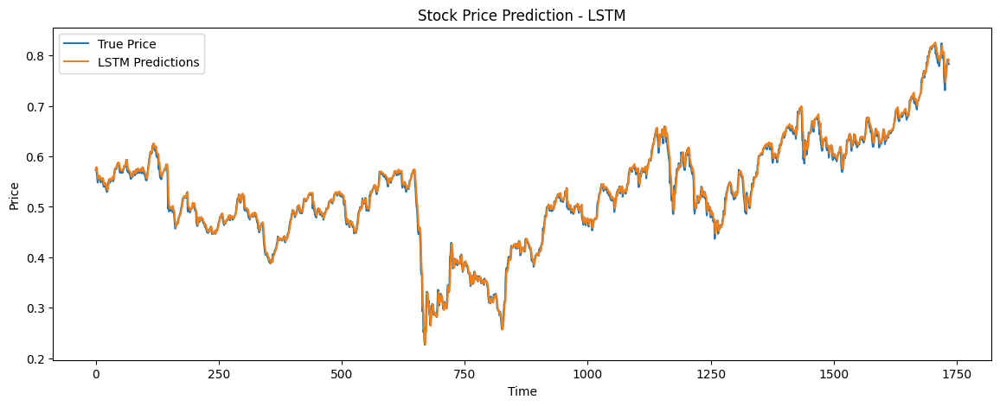

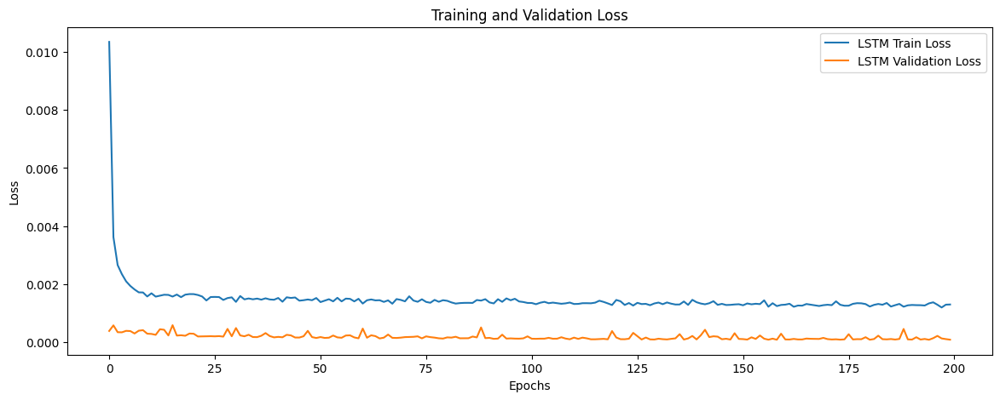

Raw LSTM Future Predictions (Before Inverse Transform):
[0.79087186 0.79258931 0.79461324 0.79667509 0.79877752 0.80088603
 0.80300987 0.80513519 0.80725908 0.80937093 0.81147206 0.81356341
 0.81564218 0.81770933 0.81976742 0.82180661 0.82382315 0.82581919
 0.82779813 0.82974344 0.8316558  0.83353734 0.83539599 0.83723325
 0.83905131 0.84084862 0.8426255  0.84438032 0.84611005 0.84781492]

LSTM Future Predictions (After Inverse Transform):
[33.67277691 33.73721399 33.81315019 33.89050868 33.9693901  34.04849962
 34.12818387 34.20792404 34.28761053 34.36684529 34.44567751 34.52414297
 34.60213658 34.6796941  34.7569117  34.8334204  34.90907929 34.98396889
 35.05821668 35.13120318 35.202953   35.27354665 35.34328155 35.41221362
 35.4804256  35.54785934 35.61452603 35.68036528 35.74526304 35.80922826]


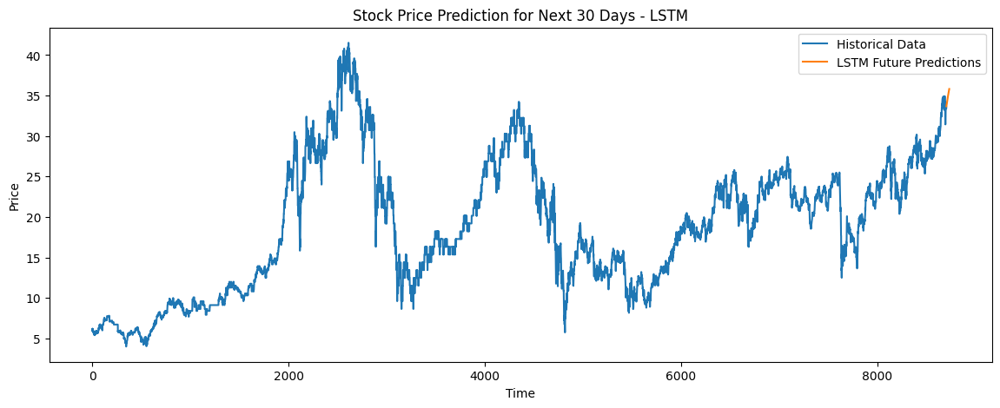

In [ ]:
#model12
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler

# Assume X_train, Y_train, X_test, Y_test are already defined and preprocessed

# Define LSTM model
def create_lstm_model(input_shape=(30, 1), lstm_units=64, dropout_rate=0.5, lr=0.001):
    model = Sequential()
    model.add(LSTM(units=lstm_units, return_sequences=True, input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(units=lstm_units, return_sequences=False))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# Train the model
lstm_model = create_lstm_model(input_shape=(X_train.shape[1], 1))
lstm_history = lstm_model.fit(X_train, Y_train, batch_size=64, epochs=200, verbose=1, validation_split=0.2)

# Predictions
lstm_predictions = lstm_model.predict(X_test)

# Misalnya, kita fit scaler dengan data training
scaler = MinMaxScaler()
scaler.fit(Y_train.reshape(-1, 1))

# Inverse scaling
lstm_predictions = scaler.inverse_transform(lstm_predictions)
Y_test_unscaled = scaler.inverse_transform(Y_test.reshape(-1, 1))

# Calculate MAPE
lstm_mape = mean_absolute_percentage_error(Y_test_unscaled, lstm_predictions)
print(f'LSTM MAPE: {lstm_mape:.4f}')

# Plot the results
plt.figure(figsize=(14, 5))
plt.plot(Y_test_unscaled, label='True Price')
plt.plot(lstm_predictions, label='LSTM Predictions')
plt.title('Stock Price Prediction - LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()

# Plot the training and validation loss for both models
plt.figure(figsize=(14, 5))
plt.plot(lstm_history.history['loss'], label='LSTM Train Loss')
plt.plot(lstm_history.history['val_loss'], label='LSTM Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Assume lstm_model, data, and scaled_data are already defined and preprocessed
time_step = 30  # Sesuaikan dengan time step yang Anda gunakan

# Fit scaler dengan data asli (bukan data yang sudah discaled)
scaler = MinMaxScaler()
scaler.fit(data.reshape(-1, 1))  # Fit dengan data asli

# Fungsi untuk prediksi 30 hari ke depan
def predict_next_30_days(model, data, time_step):
    temp_input = data[-time_step:].reshape(1, -1)  # Ambil data terakhir sebanyak time_step dan reshape
    temp_input = list(temp_input[0])  # Ubah menjadi list
    lst_output = []
    n_steps = time_step
    i = 0
    while(i < 30):
        if len(temp_input) > n_steps:
            x_input = np.array(temp_input[-n_steps:])  # Ambil hanya n_steps terakhir dan ubah menjadi numpy array
            x_input = x_input.reshape(1, n_steps, 1)
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
        else:
            x_input = np.array(temp_input).reshape((1, n_steps, 1))  # Ubah list menjadi numpy array dan reshape
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
    return np.array(lst_output).reshape(-1, 1)

# Prediksi tanpa inverse transform
lstm_future_predictions_raw = predict_next_30_days(lstm_model, scaled_data, time_step)

# Print prediksi raw (sebelum inverse transform)
print("Raw LSTM Future Predictions (Before Inverse Transform):")
print(lstm_future_predictions_raw.flatten())

# Lakukan inverse transform pada prediksi
lstm_future_predictions = scaler.inverse_transform(lstm_future_predictions_raw)

# Print prediksi setelah inverse transform
print("\nLSTM Future Predictions (After Inverse Transform):")
print(lstm_future_predictions.flatten())

# Plot hasil prediksi
plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(data)), data, label='Historical Data')
plt.plot(np.arange(len(data), len(data) + 30), lstm_future_predictions, label='LSTM Future Predictions')
plt.title('Stock Price Prediction for Next 30 Days - LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()



Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


174/174 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.0227 - val_loss: 5.5557e-04
Epoch 2/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.0011 - val_loss: 5.8586e-04
Epoch 3/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step - loss: 9.1496e-04 - val_loss: 2.3406e-04
Epoch 4/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 8.4939e-04 - val_loss: 2.7378e-04
Epoch 5/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 12s 43ms/step - loss: 8.4589e-04 - val_loss: 2.7308e-04
Epoch 6/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 7.8184e-04 - val_loss: 1.6891e-04
Epoch 7/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step - loss: 9.0680e-04 - val_loss: 1.5610e-04
Epoch 8/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 7.2702e-04 - val_loss: 1.7927e-04
Epoch 9/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 7.2003e-04 - val_loss: 2.3674e-04
Epoch 10/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step - loss: 7.5117e-04 - val_loss: 3.3659e-04
Epoch 11/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 7.1

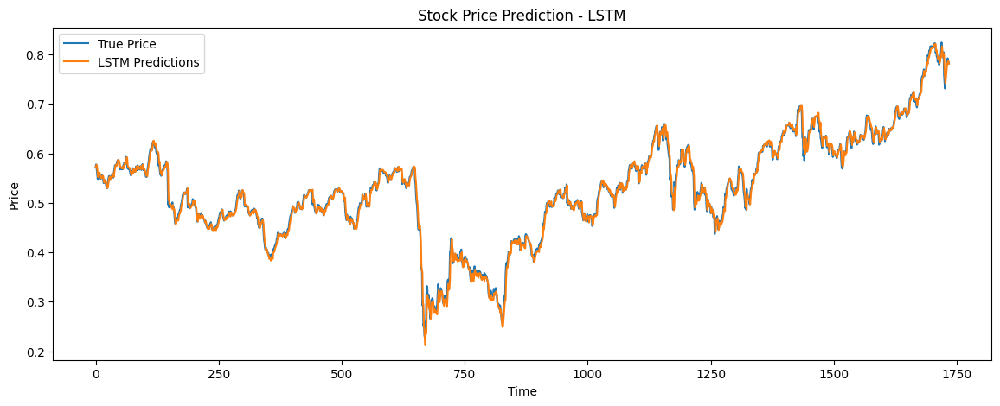

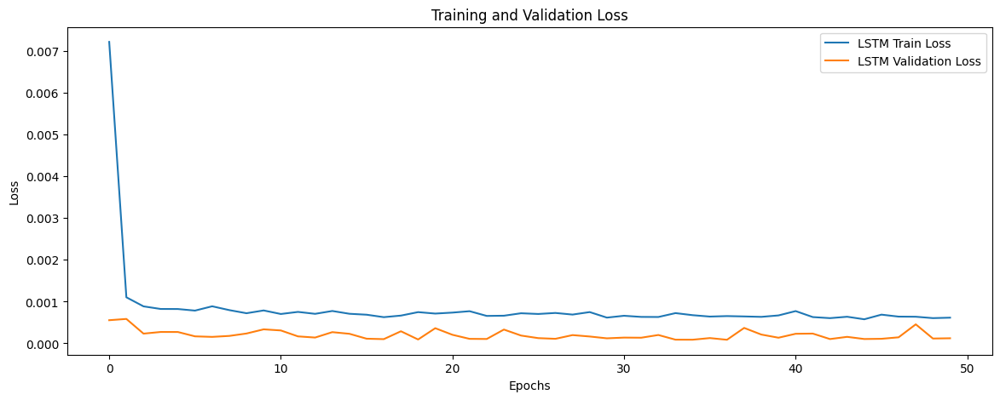

Raw LSTM Future Predictions (Before Inverse Transform):
[0.78516793 0.78460282 0.78479165 0.7852242  0.7853452  0.78564721
 0.78572243 0.78579682 0.78577119 0.78571397 0.78562498 0.78551847
 0.78540307 0.7852785  0.78514677 0.78501004 0.78486949 0.7847265
 0.78458244 0.78444171 0.78430456 0.7841711  0.78403902 0.78390741
 0.78377539 0.78364325 0.78351098 0.78337967 0.78325009 0.7831226 ]

LSTM Future Predictions (After Inverse Transform):
[33.45877083 33.43756836 33.44465299 33.46088191 33.46542162 33.47675301
 33.47957524 33.48236615 33.48140454 33.47925768 33.47591887 33.47192258
 33.46759308 33.46291919 33.45797694 33.45284684 33.44757362 33.4422087
 33.43680354 33.43152361 33.42637786 33.42137075 33.41641509 33.41147731
 33.40652388 33.40156598 33.3966036  33.39167701 33.38681527 33.3820318 ]


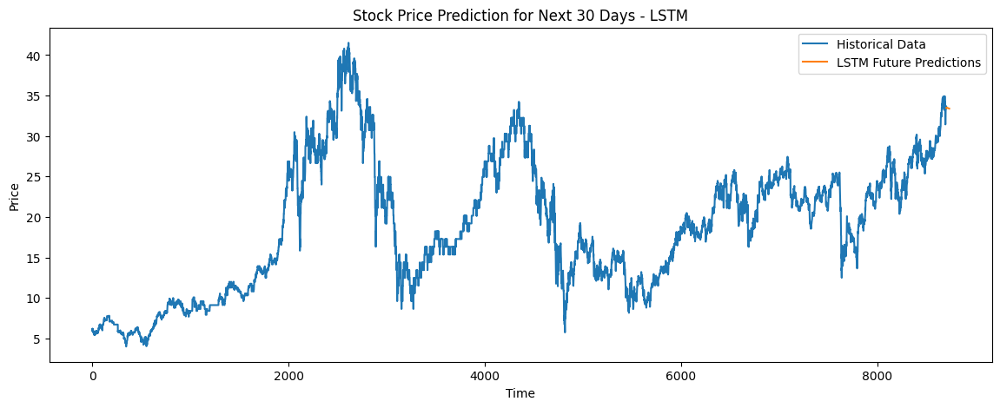

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler

# Assume X_train, Y_train, X_test, Y_test are already defined and preprocessed

# Define LSTM model
def create_lstm_model(input_shape=(30, 1), lstm_units=64, dropout_rate=0.2, lr=0.005):
    model = Sequential()
    model.add(LSTM(units=lstm_units, return_sequences=True, input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(units=lstm_units, return_sequences=False))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# Train the model
lstm_model = create_lstm_model(input_shape=(X_train.shape[1], 1))
lstm_history = lstm_model.fit(X_train, Y_train, batch_size=32, epochs=50, verbose=1, validation_split=0.2)

# Predictions
lstm_predictions = lstm_model.predict(X_test)

# Misalnya, kita fit scaler dengan data training
scaler = MinMaxScaler()
scaler.fit(Y_train.reshape(-1, 1))

# Inverse scaling
lstm_predictions = scaler.inverse_transform(lstm_predictions)
Y_test_unscaled = scaler.inverse_transform(Y_test.reshape(-1, 1))

# Calculate MAPE
lstm_mape = mean_absolute_percentage_error(Y_test_unscaled, lstm_predictions)
print(f'LSTM MAPE: {lstm_mape:.4f}')

# Plot the results
plt.figure(figsize=(14, 5))
plt.plot(Y_test_unscaled, label='True Price')
plt.plot(lstm_predictions, label='LSTM Predictions')
plt.title('Stock Price Prediction - LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()

# Plot the training and validation loss for both models
plt.figure(figsize=(14, 5))
plt.plot(lstm_history.history['loss'], label='LSTM Train Loss')
plt.plot(lstm_history.history['val_loss'], label='LSTM Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Assume lstm_model, data, and scaled_data are already defined and preprocessed
time_step = 30  # Sesuaikan dengan time step yang Anda gunakan

# Fit scaler dengan data asli (bukan data yang sudah discaled)
scaler = MinMaxScaler()
scaler.fit(data.reshape(-1, 1))  # Fit dengan data asli

# Fungsi untuk prediksi 30 hari ke depan
def predict_next_30_days(model, data, time_step):
    temp_input = data[-time_step:].reshape(1, -1)  # Ambil data terakhir sebanyak time_step dan reshape
    temp_input = list(temp_input[0])  # Ubah menjadi list
    lst_output = []
    n_steps = time_step
    i = 0
    while(i < 30):
        if len(temp_input) > n_steps:
            x_input = np.array(temp_input[-n_steps:])  # Ambil hanya n_steps terakhir dan ubah menjadi numpy array
            x_input = x_input.reshape(1, n_steps, 1)
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
        else:
            x_input = np.array(temp_input).reshape((1, n_steps, 1))  # Ubah list menjadi numpy array dan reshape
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
    return np.array(lst_output).reshape(-1, 1)

# Prediksi tanpa inverse transform
lstm_future_predictions_raw = predict_next_30_days(lstm_model, scaled_data, time_step)

# Print prediksi raw (sebelum inverse transform)
print("Raw LSTM Future Predictions (Before Inverse Transform):")
print(lstm_future_predictions_raw.flatten())

# Lakukan inverse transform pada prediksi
lstm_future_predictions = scaler.inverse_transform(lstm_future_predictions_raw)

# Print prediksi setelah inverse transform
print("\nLSTM Future Predictions (After Inverse Transform):")
print(lstm_future_predictions.flatten())

# Plot hasil prediksi
plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(data)), data, label='Historical Data')
plt.plot(np.arange(len(data), len(data) + 30), lstm_future_predictions, label='LSTM Future Predictions')
plt.title('Stock Price Prediction for Next 30 Days - LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()



Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


174/174 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step - loss: 0.0129 - val_loss: 0.0011
Epoch 2/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.0012 - val_loss: 2.1642e-04
Epoch 3/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 9.3229e-04 - val_loss: 2.3775e-04
Epoch 4/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 7s 41ms/step - loss: 9.5646e-04 - val_loss: 1.9123e-04
Epoch 5/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 8.8409e-04 - val_loss: 2.4355e-04
Epoch 6/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 9.3260e-04 - val_loss: 1.6341e-04
Epoch 7/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 8.3437e-04 - val_loss: 3.3283e-04
Epoch 8/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 8.4194e-04 - val_loss: 1.8293e-04
Epoch 9/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step - loss: 7.8797e-04 - val_loss: 2.6815e-04
Epoch 10/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 7.1338e-04 - val_loss: 1.5463e-04
Epoch 11/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - 

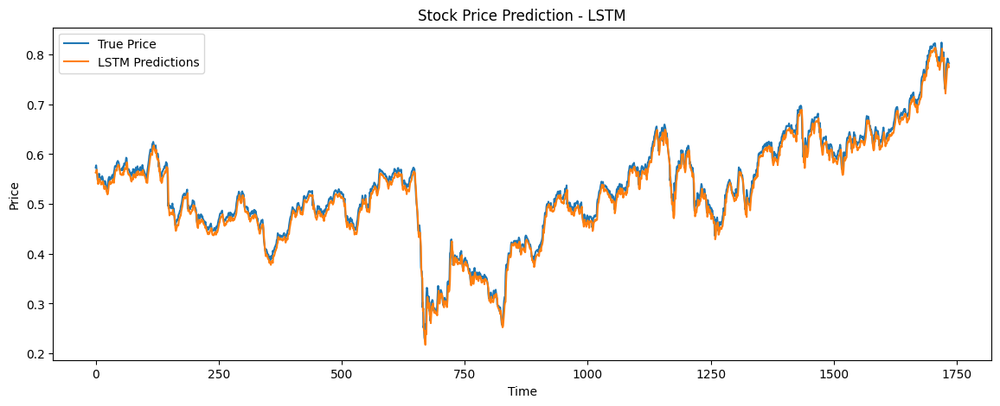

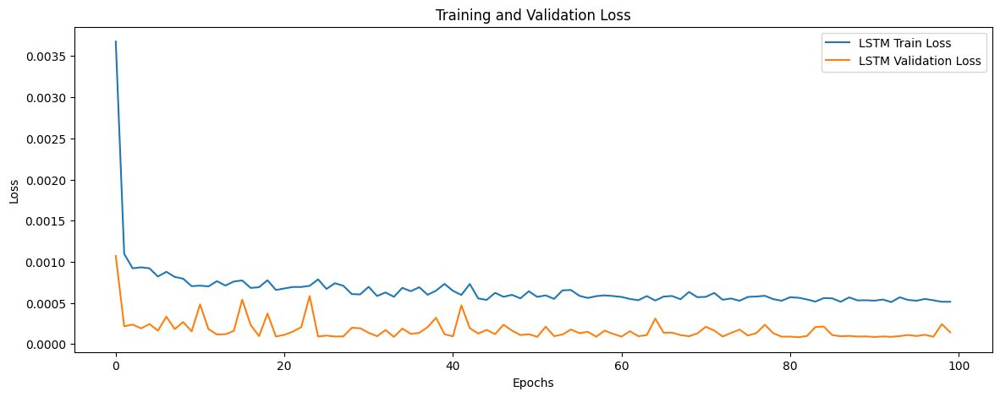

Raw LSTM Future Predictions (Before Inverse Transform):
[0.77804136 0.7685945  0.76002347 0.75145769 0.74220866 0.73269546
 0.72279763 0.7125721  0.70192945 0.69086963 0.67936182 0.66740614
 0.65497053 0.64207411 0.62874728 0.6149857  0.60075212 0.58612049
 0.57116419 0.5558691  0.54025614 0.52434176 0.508187   0.49185455
 0.47541988 0.45894533 0.44252229 0.4262366  0.41013348 0.39428651]

LSTM Future Predictions (After Inverse Transform):
[33.19138847 32.83695097 32.51537383 32.19399349 31.8469783  31.49005179
 31.11869436 30.73504168 30.3357393  29.92078497 29.48902252 29.04045643
 28.57388355 28.09002175 27.59001155 27.07368969 26.53965847 25.99069317
 25.42954668 24.85568899 24.26990506 23.67281209 23.06670008 22.45392163
 21.8373079  21.21919808 20.60302043 19.99199636 19.38782212 18.79325842]


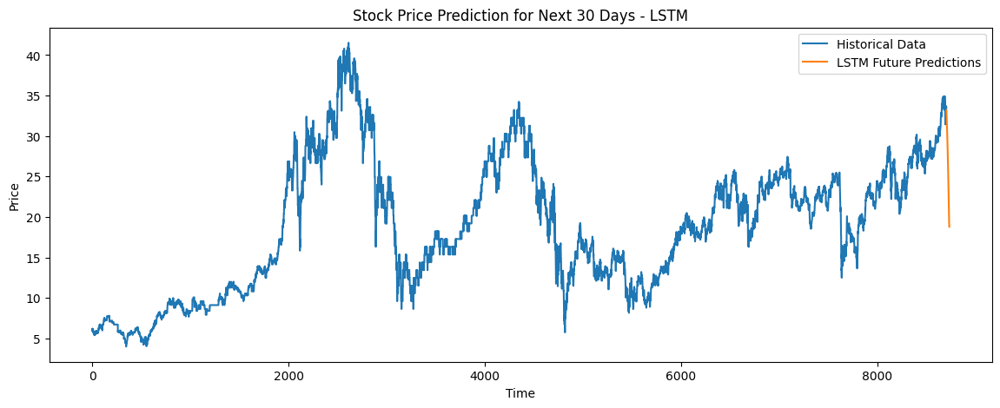

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler

# Assume X_train, Y_train, X_test, Y_test are already defined and preprocessed

# Define LSTM model
def create_lstm_model(input_shape=(30, 1), lstm_units=64, dropout_rate=0.2, lr=0.005):
    model = Sequential()
    model.add(LSTM(units=lstm_units, return_sequences=True, input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(units=lstm_units, return_sequences=False))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# Train the model
lstm_model = create_lstm_model(input_shape=(X_train.shape[1], 1))
lstm_history = lstm_model.fit(X_train, Y_train, batch_size=32, epochs=100, verbose=1, validation_split=0.2)

# Predictions
lstm_predictions = lstm_model.predict(X_test)

# Misalnya, kita fit scaler dengan data training
scaler = MinMaxScaler()
scaler.fit(Y_train.reshape(-1, 1))

# Inverse scaling
lstm_predictions = scaler.inverse_transform(lstm_predictions)
Y_test_unscaled = scaler.inverse_transform(Y_test.reshape(-1, 1))

# Calculate MAPE
lstm_mape = mean_absolute_percentage_error(Y_test_unscaled, lstm_predictions)
print(f'LSTM MAPE: {lstm_mape:.4f}')

# Plot the results
plt.figure(figsize=(14, 5))
plt.plot(Y_test_unscaled, label='True Price')
plt.plot(lstm_predictions, label='LSTM Predictions')
plt.title('Stock Price Prediction - LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()

# Plot the training and validation loss for both models
plt.figure(figsize=(14, 5))
plt.plot(lstm_history.history['loss'], label='LSTM Train Loss')
plt.plot(lstm_history.history['val_loss'], label='LSTM Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Assume lstm_model, data, and scaled_data are already defined and preprocessed
time_step = 30  # Sesuaikan dengan time step yang Anda gunakan

# Fit scaler dengan data asli (bukan data yang sudah discaled)
scaler = MinMaxScaler()
scaler.fit(data.reshape(-1, 1))  # Fit dengan data asli

# Fungsi untuk prediksi 30 hari ke depan
def predict_next_30_days(model, data, time_step):
    temp_input = data[-time_step:].reshape(1, -1)  # Ambil data terakhir sebanyak time_step dan reshape
    temp_input = list(temp_input[0])  # Ubah menjadi list
    lst_output = []
    n_steps = time_step
    i = 0
    while(i < 30):
        if len(temp_input) > n_steps:
            x_input = np.array(temp_input[-n_steps:])  # Ambil hanya n_steps terakhir dan ubah menjadi numpy array
            x_input = x_input.reshape(1, n_steps, 1)
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
        else:
            x_input = np.array(temp_input).reshape((1, n_steps, 1))  # Ubah list menjadi numpy array dan reshape
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
    return np.array(lst_output).reshape(-1, 1)

# Prediksi tanpa inverse transform
lstm_future_predictions_raw = predict_next_30_days(lstm_model, scaled_data, time_step)

# Print prediksi raw (sebelum inverse transform)
print("Raw LSTM Future Predictions (Before Inverse Transform):")
print(lstm_future_predictions_raw.flatten())

# Lakukan inverse transform pada prediksi
lstm_future_predictions = scaler.inverse_transform(lstm_future_predictions_raw)

# Print prediksi setelah inverse transform
print("\nLSTM Future Predictions (After Inverse Transform):")
print(lstm_future_predictions.flatten())

# Plot hasil prediksi
plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(data)), data, label='Historical Data')
plt.plot(np.arange(len(data), len(data) + 30), lstm_future_predictions, label='LSTM Future Predictions')
plt.title('Stock Price Prediction for Next 30 Days - LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()



/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.0232 - val_loss: 5.2665e-04
Epoch 2/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step - loss: 0.0011 - val_loss: 2.7252e-04
Epoch 3/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.0010 - val_loss: 2.7094e-04
Epoch 4/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 8.2504e-04 - val_loss: 3.9556e-04
Epoch 5/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 8.3319e-04 - val_loss: 2.5520e-04
Epoch 6/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step - loss: 8.1403e-04 - val_loss: 4.5551e-04
Epoch 7/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 8.3380e-04 - val_loss: 1.7615e-04
Epoch 8/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 7.4730e-04 - val_loss: 1.5961e-04
Epoch 9/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step - loss: 8.5165e-04 - val_loss: 3.5860e-04
Epoch 10/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 6.8171e-04 - val_loss: 3.7826e-04
Epoch 11/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 11s 3

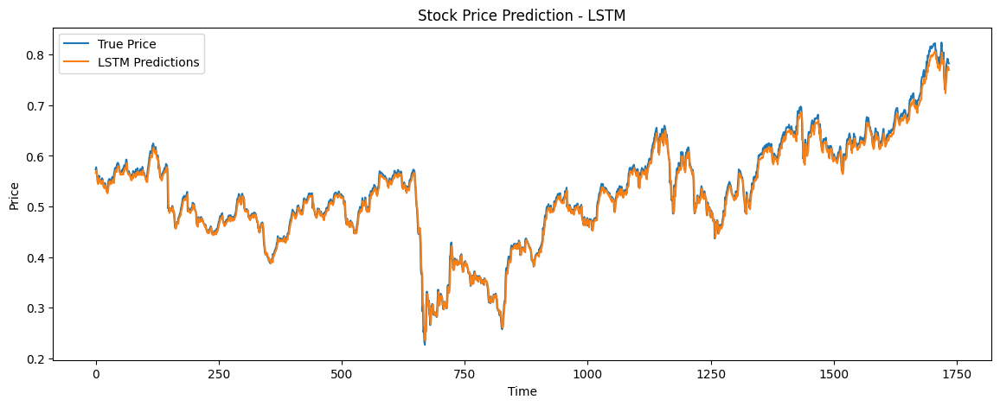

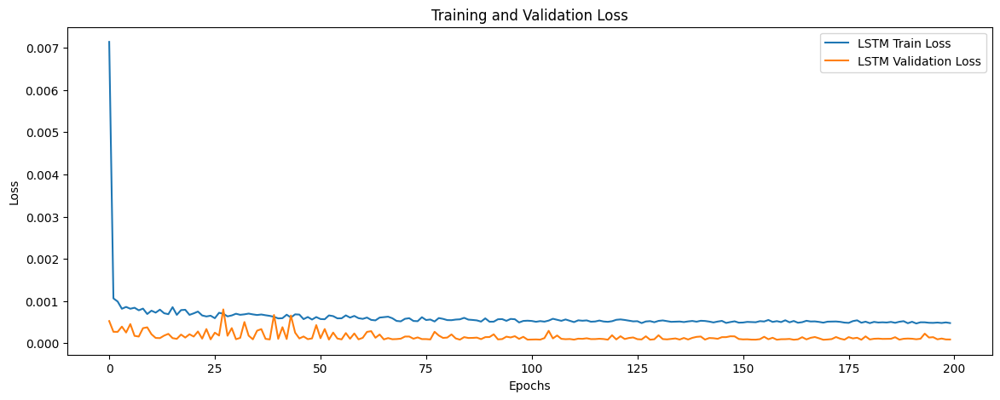

Raw LSTM Future Predictions (Before Inverse Transform):
[0.77281451 0.76056838 0.75165725 0.7422694  0.73405063 0.72634828
 0.7193532  0.71262383 0.70602894 0.69954133 0.69330001 0.68711853
 0.68109918 0.67530775 0.66961646 0.66393328 0.658373   0.65303642
 0.64751059 0.64213097 0.63690656 0.63201261 0.62737489 0.62302625
 0.6188581  0.61488271 0.61108625 0.60736024 0.6037181  0.60023642]

LSTM Future Predictions (After Inverse Transform):
[32.99528183 32.53581819 32.20148066 31.84925711 31.54089657 31.25191144
 30.98946238 30.7369828  30.48954834 30.24613923 30.01197057 29.78004717
 29.55420653 29.33691755 29.12338557 28.91015773 28.70154117 28.50131748
 28.2939935  28.0921552  27.89614025 27.71252341 27.53852047 27.37536365
 27.21897838 27.06982534 26.92738571 26.7875894  26.65093958 26.52030991]


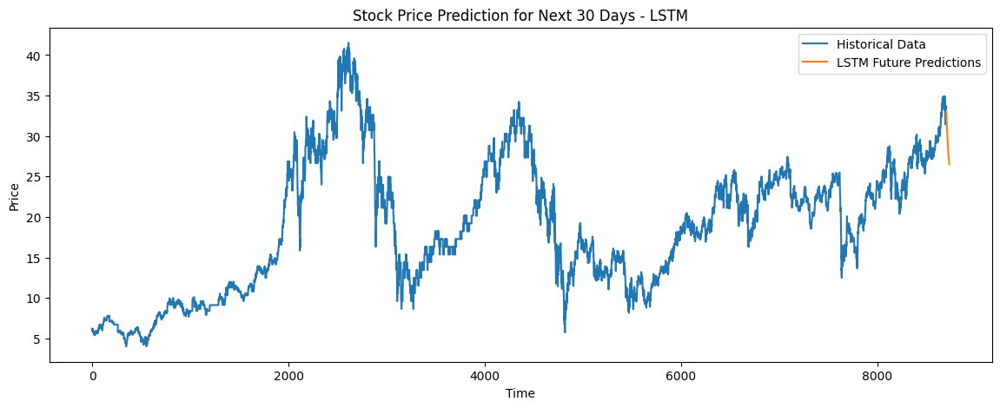

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler

# Assume X_train, Y_train, X_test, Y_test are already defined and preprocessed

# Define LSTM model
def create_lstm_model(input_shape=(30, 1), lstm_units=64, dropout_rate=0.2, lr=0.005):
    model = Sequential()
    model.add(LSTM(units=lstm_units, return_sequences=True, input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(units=lstm_units, return_sequences=False))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# Train the model
lstm_model = create_lstm_model(input_shape=(X_train.shape[1], 1))
lstm_history = lstm_model.fit(X_train, Y_train, batch_size=32, epochs=200, verbose=1, validation_split=0.2)

# Predictions
lstm_predictions = lstm_model.predict(X_test)

# Misalnya, kita fit scaler dengan data training
scaler = MinMaxScaler()
scaler.fit(Y_train.reshape(-1, 1))

# Inverse scaling
lstm_predictions = scaler.inverse_transform(lstm_predictions)
Y_test_unscaled = scaler.inverse_transform(Y_test.reshape(-1, 1))

# Calculate MAPE
lstm_mape = mean_absolute_percentage_error(Y_test_unscaled, lstm_predictions)
print(f'LSTM MAPE: {lstm_mape:.4f}')

# Plot the results
plt.figure(figsize=(14, 5))
plt.plot(Y_test_unscaled, label='True Price')
plt.plot(lstm_predictions, label='LSTM Predictions')
plt.title('Stock Price Prediction - LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()

# Plot the training and validation loss for both models
plt.figure(figsize=(14, 5))
plt.plot(lstm_history.history['loss'], label='LSTM Train Loss')
plt.plot(lstm_history.history['val_loss'], label='LSTM Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Assume lstm_model, data, and scaled_data are already defined and preprocessed
time_step = 30  # Sesuaikan dengan time step yang Anda gunakan

# Fit scaler dengan data asli (bukan data yang sudah discaled)
scaler = MinMaxScaler()
scaler.fit(data.reshape(-1, 1))  # Fit dengan data asli

# Fungsi untuk prediksi 30 hari ke depan
def predict_next_30_days(model, data, time_step):
    temp_input = data[-time_step:].reshape(1, -1)  # Ambil data terakhir sebanyak time_step dan reshape
    temp_input = list(temp_input[0])  # Ubah menjadi list
    lst_output = []
    n_steps = time_step
    i = 0
    while(i < 30):
        if len(temp_input) > n_steps:
            x_input = np.array(temp_input[-n_steps:])  # Ambil hanya n_steps terakhir dan ubah menjadi numpy array
            x_input = x_input.reshape(1, n_steps, 1)
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
        else:
            x_input = np.array(temp_input).reshape((1, n_steps, 1))  # Ubah list menjadi numpy array dan reshape
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
    return np.array(lst_output).reshape(-1, 1)

# Prediksi tanpa inverse transform
lstm_future_predictions_raw = predict_next_30_days(lstm_model, scaled_data, time_step)

# Print prediksi raw (sebelum inverse transform)
print("Raw LSTM Future Predictions (Before Inverse Transform):")
print(lstm_future_predictions_raw.flatten())

# Lakukan inverse transform pada prediksi
lstm_future_predictions = scaler.inverse_transform(lstm_future_predictions_raw)

# Print prediksi setelah inverse transform
print("\nLSTM Future Predictions (After Inverse Transform):")
print(lstm_future_predictions.flatten())

# Plot hasil prediksi
plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(data)), data, label='Historical Data')
plt.plot(np.arange(len(data), len(data) + 30), lstm_future_predictions, label='LSTM Future Predictions')
plt.title('Stock Price Prediction for Next 30 Days - LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()



Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


87/87 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - loss: 0.0176 - val_loss: 2.6778e-04
Epoch 2/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 5s 52ms/step - loss: 0.0012 - val_loss: 7.0033e-04
Epoch 3/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.0013 - val_loss: 3.5556e-04
Epoch 4/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - loss: 9.7407e-04 - val_loss: 3.3675e-04
Epoch 5/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 5s 55ms/step - loss: 8.9849e-04 - val_loss: 2.6771e-04
Epoch 6/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 8.2455e-04 - val_loss: 3.1275e-04
Epoch 7/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step - loss: 8.5623e-04 - val_loss: 1.8076e-04
Epoch 8/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step - loss: 7.5800e-04 - val_loss: 2.9994e-04
Epoch 9/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - loss: 7.5079e-04 - val_loss: 2.2357e-04
Epoch 10/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step - loss: 7.0969e-04 - val_loss: 2.1753e-04
Epoch 11/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 7.4469e-04 - val_loss: 2.3676e-

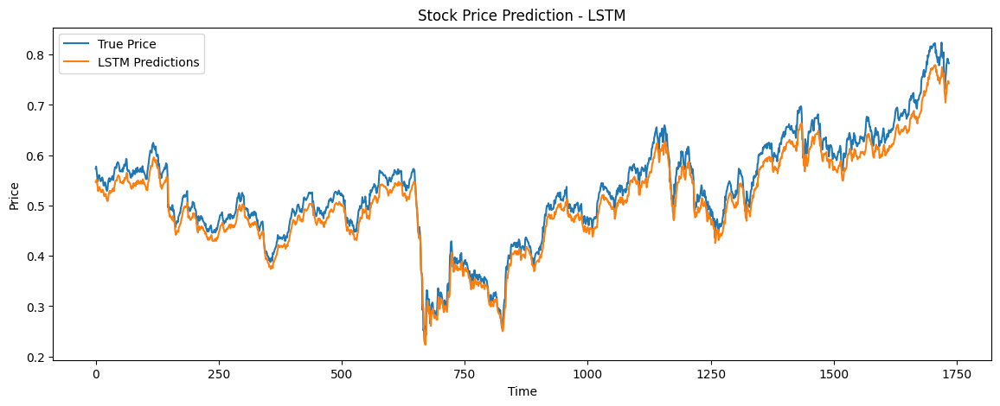

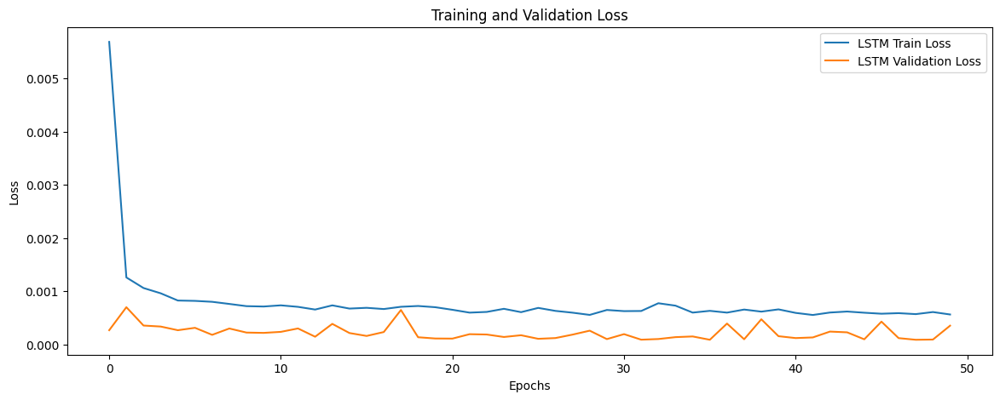

Raw LSTM Future Predictions (Before Inverse Transform):
[0.74687278 0.71566862 0.69381505 0.67393929 0.65546042 0.63827127
 0.62157744 0.6052357  0.58909637 0.57311726 0.55732036 0.54173493
 0.52640682 0.51137531 0.49667507 0.48233411 0.46837237 0.45480275
 0.44163135 0.42886251 0.41649356 0.40451828 0.39292568 0.38170406
 0.37084022 0.36032173 0.35013565 0.34027001 0.33071369 0.32145607]

LSTM Future Predictions (After Inverse Transform):
[32.02197192 30.8512203  30.03129454 29.28557407 28.5922638  27.94734284
 27.32100563 26.70787831 26.1023455  25.5028239  24.91013871 24.32538795
 23.75029134 23.18632263 22.63478333 22.0967234  21.572892   21.06377218
 20.56959316 20.09051819 19.62644663 19.17714479 18.74220119 18.32117639
 17.91357506 17.51893091 17.13675867 16.76660885 16.40806436 16.06072715]


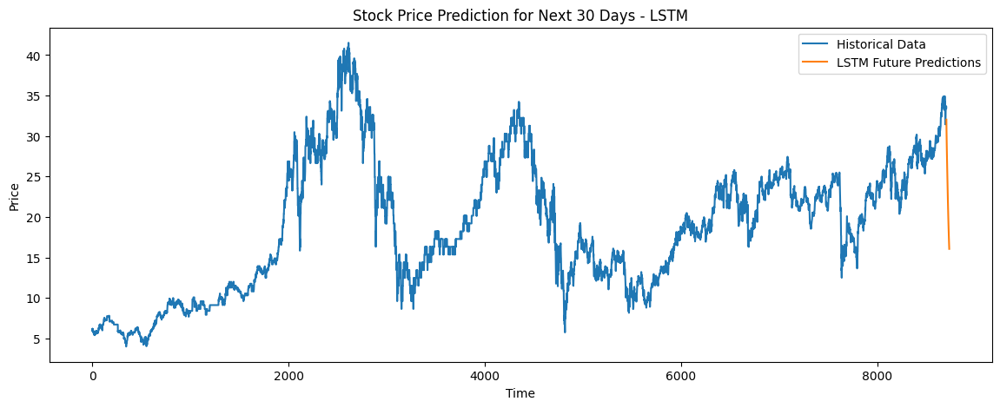

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler

# Assume X_train, Y_train, X_test, Y_test are already defined and preprocessed

# Define LSTM model
def create_lstm_model(input_shape=(30, 1), lstm_units=64, dropout_rate=0.2, lr=0.005):
    model = Sequential()
    model.add(LSTM(units=lstm_units, return_sequences=True, input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(units=lstm_units, return_sequences=False))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# Train the model
lstm_model = create_lstm_model(input_shape=(X_train.shape[1], 1))
lstm_history = lstm_model.fit(X_train, Y_train, batch_size=64, epochs=50, verbose=1, validation_split=0.2)

# Predictions
lstm_predictions = lstm_model.predict(X_test)

# Misalnya, kita fit scaler dengan data training
scaler = MinMaxScaler()
scaler.fit(Y_train.reshape(-1, 1))

# Inverse scaling
lstm_predictions = scaler.inverse_transform(lstm_predictions)
Y_test_unscaled = scaler.inverse_transform(Y_test.reshape(-1, 1))

# Calculate MAPE
lstm_mape = mean_absolute_percentage_error(Y_test_unscaled, lstm_predictions)
print(f'LSTM MAPE: {lstm_mape:.4f}')

# Plot the results
plt.figure(figsize=(14, 5))
plt.plot(Y_test_unscaled, label='True Price')
plt.plot(lstm_predictions, label='LSTM Predictions')
plt.title('Stock Price Prediction - LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()

# Plot the training and validation loss for both models
plt.figure(figsize=(14, 5))
plt.plot(lstm_history.history['loss'], label='LSTM Train Loss')
plt.plot(lstm_history.history['val_loss'], label='LSTM Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Assume lstm_model, data, and scaled_data are already defined and preprocessed
time_step = 30  # Sesuaikan dengan time step yang Anda gunakan

# Fit scaler dengan data asli (bukan data yang sudah discaled)
scaler = MinMaxScaler()
scaler.fit(data.reshape(-1, 1))  # Fit dengan data asli

# Fungsi untuk prediksi 30 hari ke depan
def predict_next_30_days(model, data, time_step):
    temp_input = data[-time_step:].reshape(1, -1)  # Ambil data terakhir sebanyak time_step dan reshape
    temp_input = list(temp_input[0])  # Ubah menjadi list
    lst_output = []
    n_steps = time_step
    i = 0
    while(i < 30):
        if len(temp_input) > n_steps:
            x_input = np.array(temp_input[-n_steps:])  # Ambil hanya n_steps terakhir dan ubah menjadi numpy array
            x_input = x_input.reshape(1, n_steps, 1)
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
        else:
            x_input = np.array(temp_input).reshape((1, n_steps, 1))  # Ubah list menjadi numpy array dan reshape
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
    return np.array(lst_output).reshape(-1, 1)

# Prediksi tanpa inverse transform
lstm_future_predictions_raw = predict_next_30_days(lstm_model, scaled_data, time_step)

# Print prediksi raw (sebelum inverse transform)
print("Raw LSTM Future Predictions (Before Inverse Transform):")
print(lstm_future_predictions_raw.flatten())

# Lakukan inverse transform pada prediksi
lstm_future_predictions = scaler.inverse_transform(lstm_future_predictions_raw)

# Print prediksi setelah inverse transform
print("\nLSTM Future Predictions (After Inverse Transform):")
print(lstm_future_predictions.flatten())

# Plot hasil prediksi
plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(data)), data, label='Historical Data')
plt.plot(np.arange(len(data), len(data) + 30), lstm_future_predictions, label='LSTM Future Predictions')
plt.title('Stock Price Prediction for Next 30 Days - LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()



Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


87/87 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.0128 - val_loss: 2.4165e-04
Epoch 2/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.0011 - val_loss: 3.4755e-04
Epoch 3/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.0010 - val_loss: 2.4305e-04
Epoch 4/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 8.3331e-04 - val_loss: 4.2263e-04
Epoch 5/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 9.0145e-04 - val_loss: 4.8447e-04
Epoch 6/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 7.3833e-04 - val_loss: 2.1098e-04
Epoch 7/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 7.3837e-04 - val_loss: 1.9088e-04
Epoch 8/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 7.3609e-04 - val_loss: 5.5061e-04
Epoch 9/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 8.2359e-04 - val_loss: 1.4962e-04
Epoch 10/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 7.2486e-04 - val_loss: 3.6112e-04
Epoch 11/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step - loss: 9.1165e-04 - val_loss

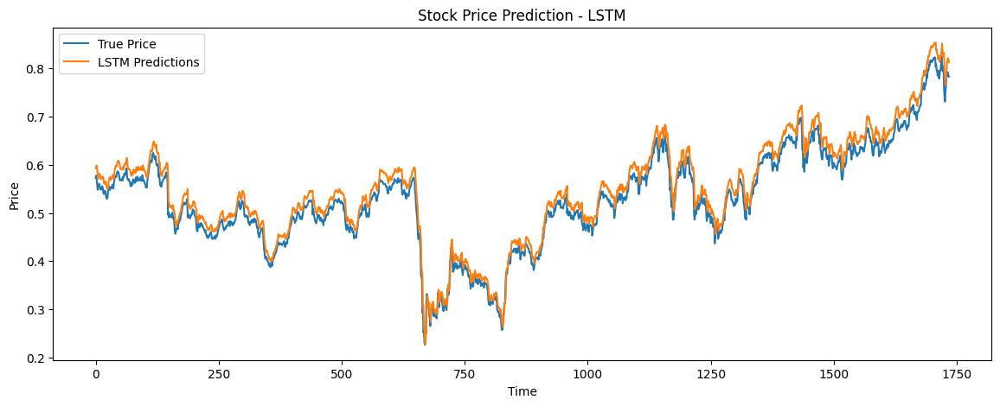

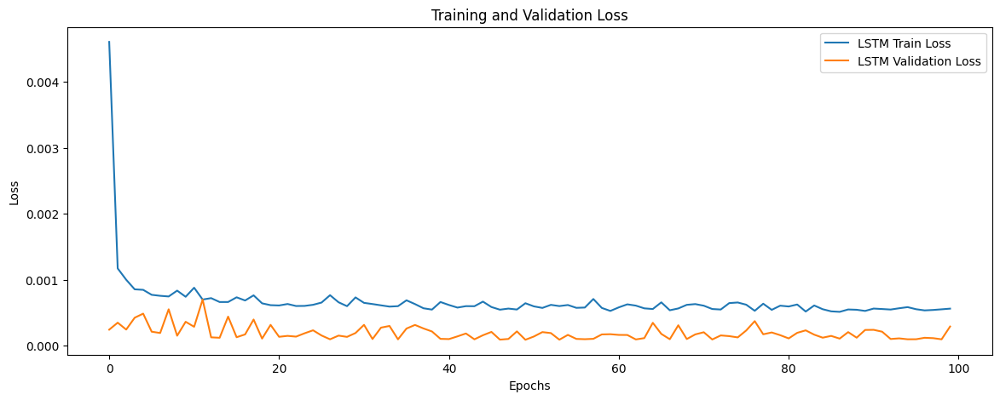

Raw LSTM Future Predictions (Before Inverse Transform):
[0.81488055 0.83860904 0.86228848 0.8854509  0.90740818 0.92783201
 0.9464488  0.96395904 0.98066193 0.99686414 1.01282358 1.02856505
 1.04404771 1.05918074 1.0738461  1.08794272 1.10139489 1.11418593
 1.12633455 1.13784206 1.14874458 1.15907824 1.16888618 1.17819977
 1.18704617 1.19544446 1.20341229 1.21096551 1.21811795 1.22488701]

LSTM Future Predictions (After Inverse Transform):
[34.57356099 35.46383217 36.35226286 37.22129579 38.04511274 38.8113961
 39.50988119 40.16684916 40.7935263  41.40141841 42.00020203 42.59080745
 43.17170281 43.73947997 44.28971102 44.81860319 45.32331636 45.80322436
 46.25902939 46.69078066 47.09983336 47.4875427  47.85552778 48.20496489
 48.53687379 48.85197009 49.15091576 49.43430564 49.70265856 49.95662752]


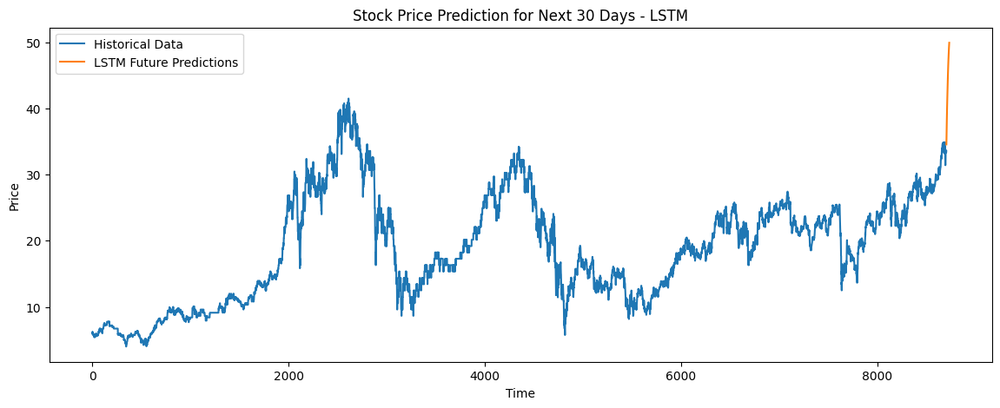

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler

# Assume X_train, Y_train, X_test, Y_test are already defined and preprocessed

# Define LSTM model
def create_lstm_model(input_shape=(30, 1), lstm_units=64, dropout_rate=0.2, lr=0.005):
    model = Sequential()
    model.add(LSTM(units=lstm_units, return_sequences=True, input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(units=lstm_units, return_sequences=False))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# Train the model
lstm_model = create_lstm_model(input_shape=(X_train.shape[1], 1))
lstm_history = lstm_model.fit(X_train, Y_train, batch_size=64, epochs=100, verbose=1, validation_split=0.2)

# Predictions
lstm_predictions = lstm_model.predict(X_test)

# Misalnya, kita fit scaler dengan data training
scaler = MinMaxScaler()
scaler.fit(Y_train.reshape(-1, 1))

# Inverse scaling
lstm_predictions = scaler.inverse_transform(lstm_predictions)
Y_test_unscaled = scaler.inverse_transform(Y_test.reshape(-1, 1))

# Calculate MAPE
lstm_mape = mean_absolute_percentage_error(Y_test_unscaled, lstm_predictions)
print(f'LSTM MAPE: {lstm_mape:.4f}')

# Plot the results
plt.figure(figsize=(14, 5))
plt.plot(Y_test_unscaled, label='True Price')
plt.plot(lstm_predictions, label='LSTM Predictions')
plt.title('Stock Price Prediction - LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()

# Plot the training and validation loss for both models
plt.figure(figsize=(14, 5))
plt.plot(lstm_history.history['loss'], label='LSTM Train Loss')
plt.plot(lstm_history.history['val_loss'], label='LSTM Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Assume lstm_model, data, and scaled_data are already defined and preprocessed
time_step = 30  # Sesuaikan dengan time step yang Anda gunakan

# Fit scaler dengan data asli (bukan data yang sudah discaled)
scaler = MinMaxScaler()
scaler.fit(data.reshape(-1, 1))  # Fit dengan data asli

# Fungsi untuk prediksi 30 hari ke depan
def predict_next_30_days(model, data, time_step):
    temp_input = data[-time_step:].reshape(1, -1)  # Ambil data terakhir sebanyak time_step dan reshape
    temp_input = list(temp_input[0])  # Ubah menjadi list
    lst_output = []
    n_steps = time_step
    i = 0
    while(i < 30):
        if len(temp_input) > n_steps:
            x_input = np.array(temp_input[-n_steps:])  # Ambil hanya n_steps terakhir dan ubah menjadi numpy array
            x_input = x_input.reshape(1, n_steps, 1)
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
        else:
            x_input = np.array(temp_input).reshape((1, n_steps, 1))  # Ubah list menjadi numpy array dan reshape
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
    return np.array(lst_output).reshape(-1, 1)

# Prediksi tanpa inverse transform
lstm_future_predictions_raw = predict_next_30_days(lstm_model, scaled_data, time_step)

# Print prediksi raw (sebelum inverse transform)
print("Raw LSTM Future Predictions (Before Inverse Transform):")
print(lstm_future_predictions_raw.flatten())

# Lakukan inverse transform pada prediksi
lstm_future_predictions = scaler.inverse_transform(lstm_future_predictions_raw)

# Print prediksi setelah inverse transform
print("\nLSTM Future Predictions (After Inverse Transform):")
print(lstm_future_predictions.flatten())

# Plot hasil prediksi
plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(data)), data, label='Historical Data')
plt.plot(np.arange(len(data), len(data) + 30), lstm_future_predictions, label='LSTM Future Predictions')
plt.title('Stock Price Prediction for Next 30 Days - LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()



Epoch 1/200


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


87/87 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step - loss: 0.0125 - val_loss: 5.2434e-04
Epoch 2/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.0013 - val_loss: 2.2944e-04
Epoch 3/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 8.2990e-04 - val_loss: 2.6870e-04
Epoch 4/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 8.3543e-04 - val_loss: 2.6114e-04
Epoch 5/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 8.2115e-04 - val_loss: 1.9262e-04
Epoch 6/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 8.6506e-04 - val_loss: 1.9607e-04
Epoch 7/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 7.7127e-04 - val_loss: 1.9520e-04
Epoch 8/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 4s 51ms/step - loss: 7.9744e-04 - val_loss: 2.3408e-04
Epoch 9/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 8.5632e-04 - val_loss: 2.8991e-04
Epoch 10/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step - loss: 6.7778e-04 - val_loss: 1.6393e-04
Epoch 11/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step - loss: 6.8721e-04 - val_l

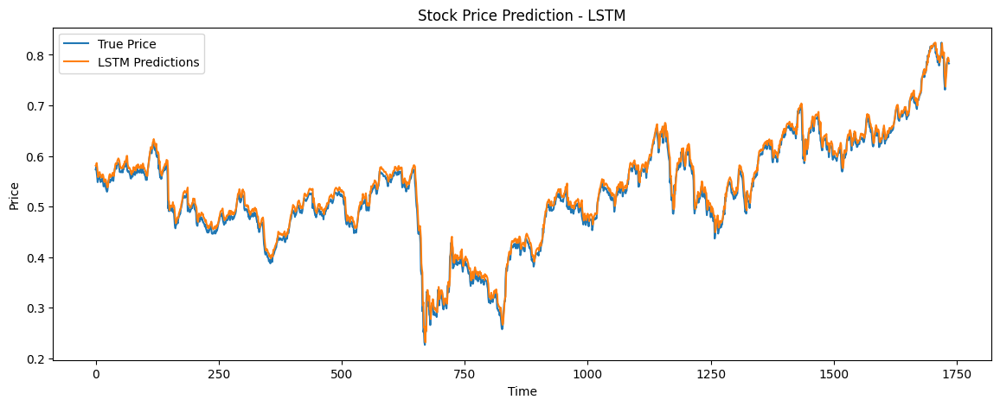

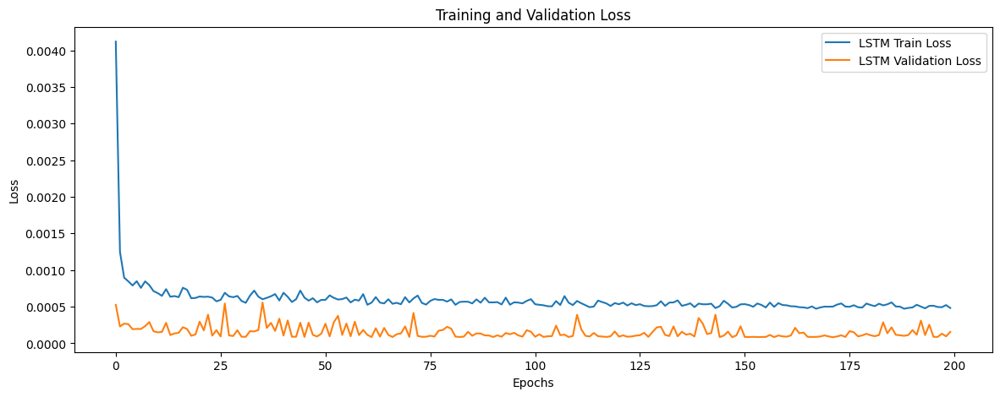

Raw LSTM Future Predictions (Before Inverse Transform):
[0.79048669 0.79337204 0.79724276 0.8004868  0.8033365  0.80580521
 0.80813599 0.81040931 0.81251192 0.81456888 0.81667018 0.81859767
 0.82048321 0.82235491 0.82414913 0.82565498 0.82716119 0.82858622
 0.82972205 0.83075702 0.83176398 0.83283615 0.83394015 0.83509994
 0.83622253 0.83732927 0.83839118 0.83935785 0.84027982 0.84120083]

LSTM Future Predictions (After Inverse Transform):
[33.65832586 33.76658123 33.91180731 34.0335208  34.14043886 34.23306242
 34.32051115 34.40580407 34.4846922  34.56186731 34.64070624 34.71302409
 34.78376757 34.85399223 34.92130968 34.97780786 35.03431945 35.08778519
 35.13040034 35.16923166 35.20701191 35.24723868 35.28865964 35.33217379
 35.37429249 35.41581632 35.45565845 35.49192695 35.52651822 35.56107371]


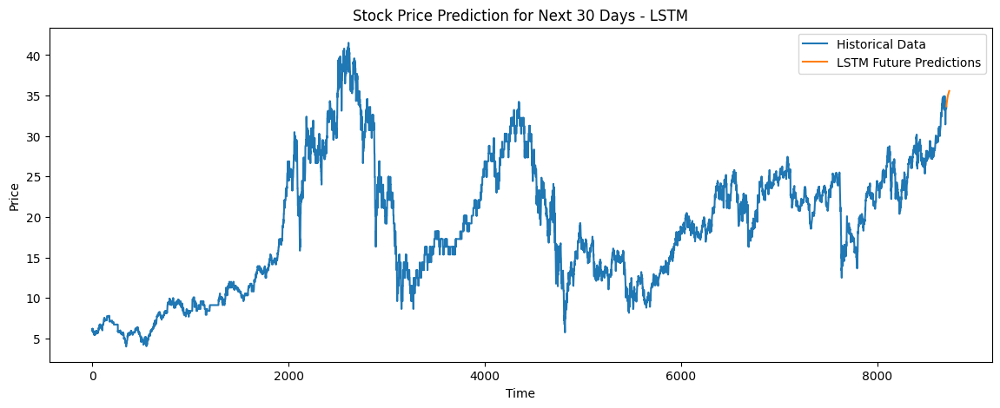

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler

# Assume X_train, Y_train, X_test, Y_test are already defined and preprocessed

# Define LSTM model
def create_lstm_model(input_shape=(30, 1), lstm_units=64, dropout_rate=0.2, lr=0.005):
    model = Sequential()
    model.add(LSTM(units=lstm_units, return_sequences=True, input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(units=lstm_units, return_sequences=False))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# Train the model
lstm_model = create_lstm_model(input_shape=(X_train.shape[1], 1))
lstm_history = lstm_model.fit(X_train, Y_train, batch_size=64, epochs=200, verbose=1, validation_split=0.2)

# Predictions
lstm_predictions = lstm_model.predict(X_test)

# Misalnya, kita fit scaler dengan data training
scaler = MinMaxScaler()
scaler.fit(Y_train.reshape(-1, 1))

# Inverse scaling
lstm_predictions = scaler.inverse_transform(lstm_predictions)
Y_test_unscaled = scaler.inverse_transform(Y_test.reshape(-1, 1))

# Calculate MAPE
lstm_mape = mean_absolute_percentage_error(Y_test_unscaled, lstm_predictions)
print(f'LSTM MAPE: {lstm_mape:.4f}')

# Plot the results
plt.figure(figsize=(14, 5))
plt.plot(Y_test_unscaled, label='True Price')
plt.plot(lstm_predictions, label='LSTM Predictions')
plt.title('Stock Price Prediction - LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()

# Plot the training and validation loss for both models
plt.figure(figsize=(14, 5))
plt.plot(lstm_history.history['loss'], label='LSTM Train Loss')
plt.plot(lstm_history.history['val_loss'], label='LSTM Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Assume lstm_model, data, and scaled_data are already defined and preprocessed
time_step = 30  # Sesuaikan dengan time step yang Anda gunakan

# Fit scaler dengan data asli (bukan data yang sudah discaled)
scaler = MinMaxScaler()
scaler.fit(data.reshape(-1, 1))  # Fit dengan data asli

# Fungsi untuk prediksi 30 hari ke depan
def predict_next_30_days(model, data, time_step):
    temp_input = data[-time_step:].reshape(1, -1)  # Ambil data terakhir sebanyak time_step dan reshape
    temp_input = list(temp_input[0])  # Ubah menjadi list
    lst_output = []
    n_steps = time_step
    i = 0
    while(i < 30):
        if len(temp_input) > n_steps:
            x_input = np.array(temp_input[-n_steps:])  # Ambil hanya n_steps terakhir dan ubah menjadi numpy array
            x_input = x_input.reshape(1, n_steps, 1)
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
        else:
            x_input = np.array(temp_input).reshape((1, n_steps, 1))  # Ubah list menjadi numpy array dan reshape
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
    return np.array(lst_output).reshape(-1, 1)

# Prediksi tanpa inverse transform
lstm_future_predictions_raw = predict_next_30_days(lstm_model, scaled_data, time_step)

# Print prediksi raw (sebelum inverse transform)
print("Raw LSTM Future Predictions (Before Inverse Transform):")
print(lstm_future_predictions_raw.flatten())

# Lakukan inverse transform pada prediksi
lstm_future_predictions = scaler.inverse_transform(lstm_future_predictions_raw)

# Print prediksi setelah inverse transform
print("\nLSTM Future Predictions (After Inverse Transform):")
print(lstm_future_predictions.flatten())

# Plot hasil prediksi
plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(data)), data, label='Historical Data')
plt.plot(np.arange(len(data), len(data) + 30), lstm_future_predictions, label='LSTM Future Predictions')
plt.title('Stock Price Prediction for Next 30 Days - LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()



Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


174/174 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step - loss: 0.0187 - val_loss: 4.4002e-04
Epoch 2/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step - loss: 0.0024 - val_loss: 6.0873e-04
Epoch 3/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0023 - val_loss: 5.2722e-04
Epoch 4/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.0021 - val_loss: 8.5598e-04
Epoch 5/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step - loss: 0.0023 - val_loss: 2.6310e-04
Epoch 6/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0023 - val_loss: 2.3983e-04
Epoch 7/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0023 - val_loss: 3.1163e-04
Epoch 8/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.0019 - val_loss: 2.2306e-04
Epoch 9/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 12s 56ms/step - loss: 0.0022 - val_loss: 2.5793e-04
Epoch 10/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 8s 41ms/step - loss: 0.0018 - val_loss: 2.8468e-04
Epoch 11/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.0021 - val_loss: 5.8173e-04
E

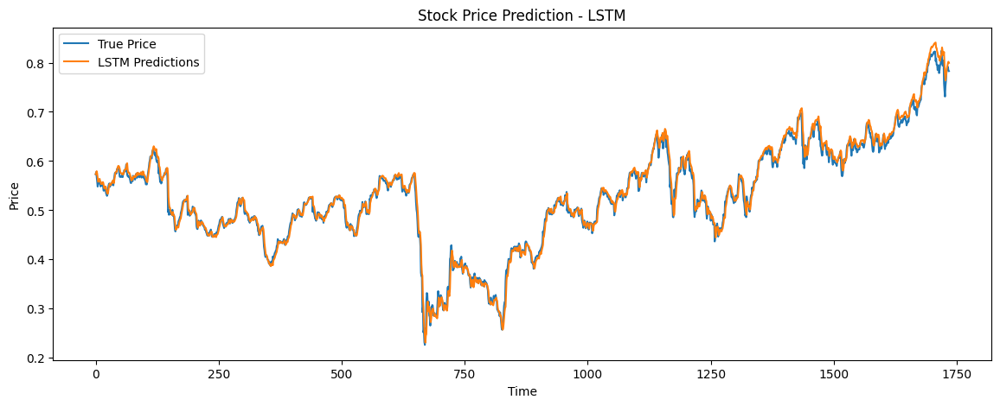

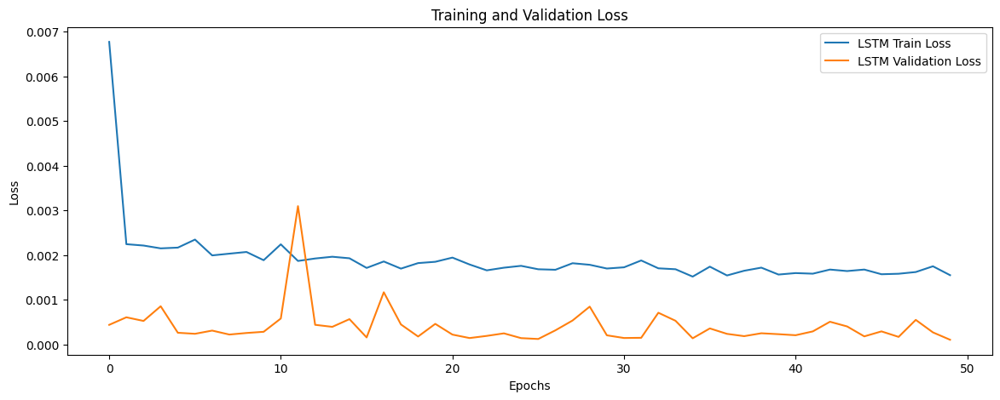

Raw LSTM Future Predictions (Before Inverse Transform):
[0.80283356 0.81329405 0.82269478 0.830881   0.83879411 0.84707224
 0.85559595 0.86426151 0.87297392 0.8817147  0.89044869 0.89915586
 0.90780497 0.9163754  0.92483914 0.93317378 0.94135916 0.94938016
 0.95721805 0.96485281 0.97227335 0.97947204 0.98644578 0.99318886
 0.99969757 1.0059675  1.01199591 1.01778042 1.02332103 1.02862072]

LSTM Future Predictions (After Inverse Transform):
[34.12156887 34.51403708 34.86674368 35.17388319 35.47077592 35.78136382
 36.10116532 36.42628925 36.75317092 37.08111707 37.40880829 37.73549316
 38.05999987 38.38155464 38.69910642 39.01181434 39.31892254 39.619863
 39.9139335  40.20038266 40.47879451 40.74888281 41.01053127 41.2635252
 41.50772595 41.74296805 41.9691486  42.18617817 42.39405675 42.59289617]


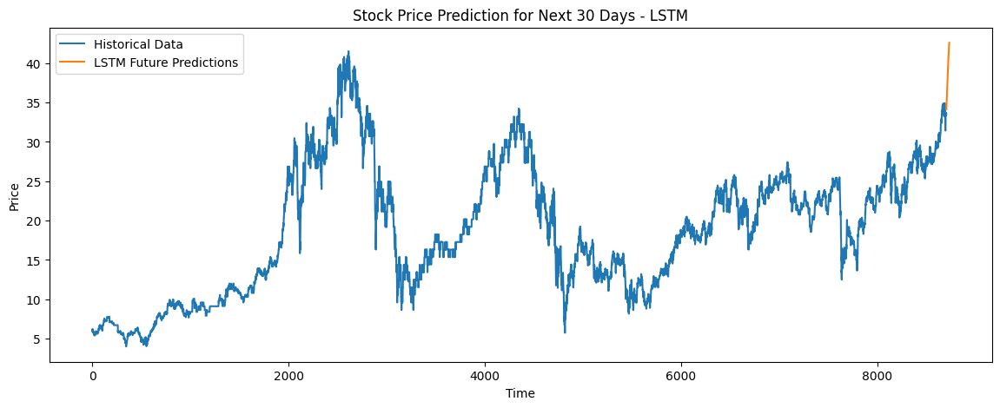

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler

# Assume X_train, Y_train, X_test, Y_test are already defined and preprocessed

# Define LSTM model
def create_lstm_model(input_shape=(30, 1), lstm_units=64, dropout_rate=0.5, lr=0.005):
    model = Sequential()
    model.add(LSTM(units=lstm_units, return_sequences=True, input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(units=lstm_units, return_sequences=False))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# Train the model
lstm_model = create_lstm_model(input_shape=(X_train.shape[1], 1))
lstm_history = lstm_model.fit(X_train, Y_train, batch_size=32, epochs=50, verbose=1, validation_split=0.2)

# Predictions
lstm_predictions = lstm_model.predict(X_test)

# Misalnya, kita fit scaler dengan data training
scaler = MinMaxScaler()
scaler.fit(Y_train.reshape(-1, 1))

# Inverse scaling
lstm_predictions = scaler.inverse_transform(lstm_predictions)
Y_test_unscaled = scaler.inverse_transform(Y_test.reshape(-1, 1))

# Calculate MAPE
lstm_mape = mean_absolute_percentage_error(Y_test_unscaled, lstm_predictions)
print(f'LSTM MAPE: {lstm_mape:.4f}')

# Plot the results
plt.figure(figsize=(14, 5))
plt.plot(Y_test_unscaled, label='True Price')
plt.plot(lstm_predictions, label='LSTM Predictions')
plt.title('Stock Price Prediction - LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()

# Plot the training and validation loss for both models
plt.figure(figsize=(14, 5))
plt.plot(lstm_history.history['loss'], label='LSTM Train Loss')
plt.plot(lstm_history.history['val_loss'], label='LSTM Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Assume lstm_model, data, and scaled_data are already defined and preprocessed
time_step = 30  # Sesuaikan dengan time step yang Anda gunakan

# Fit scaler dengan data asli (bukan data yang sudah discaled)
scaler = MinMaxScaler()
scaler.fit(data.reshape(-1, 1))  # Fit dengan data asli

# Fungsi untuk prediksi 30 hari ke depan
def predict_next_30_days(model, data, time_step):
    temp_input = data[-time_step:].reshape(1, -1)  # Ambil data terakhir sebanyak time_step dan reshape
    temp_input = list(temp_input[0])  # Ubah menjadi list
    lst_output = []
    n_steps = time_step
    i = 0
    while(i < 30):
        if len(temp_input) > n_steps:
            x_input = np.array(temp_input[-n_steps:])  # Ambil hanya n_steps terakhir dan ubah menjadi numpy array
            x_input = x_input.reshape(1, n_steps, 1)
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
        else:
            x_input = np.array(temp_input).reshape((1, n_steps, 1))  # Ubah list menjadi numpy array dan reshape
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
    return np.array(lst_output).reshape(-1, 1)

# Prediksi tanpa inverse transform
lstm_future_predictions_raw = predict_next_30_days(lstm_model, scaled_data, time_step)

# Print prediksi raw (sebelum inverse transform)
print("Raw LSTM Future Predictions (Before Inverse Transform):")
print(lstm_future_predictions_raw.flatten())

# Lakukan inverse transform pada prediksi
lstm_future_predictions = scaler.inverse_transform(lstm_future_predictions_raw)

# Print prediksi setelah inverse transform
print("\nLSTM Future Predictions (After Inverse Transform):")
print(lstm_future_predictions.flatten())

# Plot hasil prediksi
plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(data)), data, label='Historical Data')
plt.plot(np.arange(len(data), len(data) + 30), lstm_future_predictions, label='LSTM Future Predictions')
plt.title('Stock Price Prediction for Next 30 Days - LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()



Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


174/174 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step - loss: 0.0147 - val_loss: 0.0011
Epoch 2/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.0025 - val_loss: 2.4681e-04
Epoch 3/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 12s 43ms/step - loss: 0.0022 - val_loss: 3.4751e-04
Epoch 4/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - loss: 0.0021 - val_loss: 2.1006e-04
Epoch 5/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step - loss: 0.0019 - val_loss: 1.9998e-04
Epoch 6/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step - loss: 0.0022 - val_loss: 4.7142e-04
Epoch 7/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0021 - val_loss: 5.0704e-04
Epoch 8/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.0019 - val_loss: 3.3499e-04
Epoch 9/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 7s 41ms/step - loss: 0.0020 - val_loss: 3.0487e-04
Epoch 10/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0019 - val_loss: 3.2985e-04
Epoch 11/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0017 - val_loss: 2.9467e

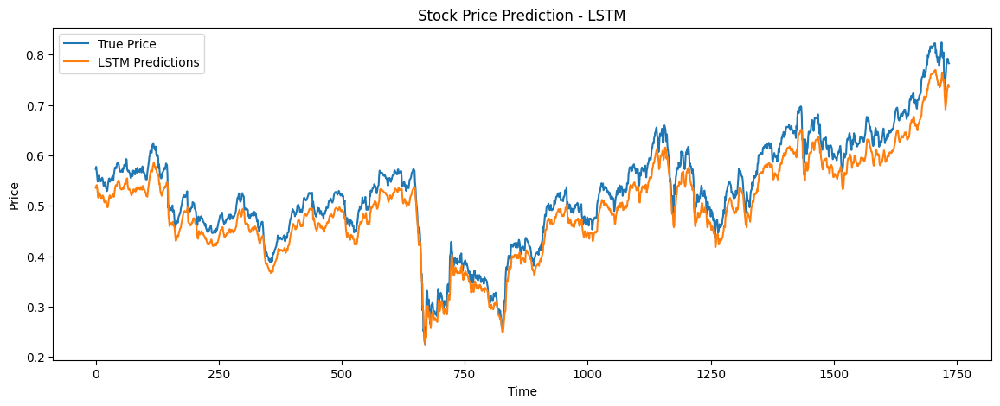

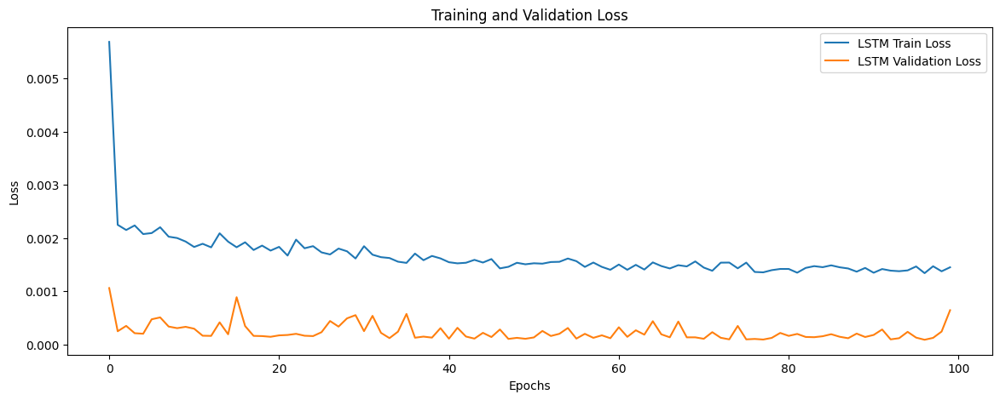

Raw LSTM Future Predictions (Before Inverse Transform):
[0.73613566 0.70369524 0.67703569 0.64521807 0.61531383 0.58603096
 0.55795431 0.53102565 0.5054785  0.4811759  0.45824403 0.43658584
 0.41620696 0.39702183 0.37896007 0.36196649 0.34600306 0.33100045
 0.3168934  0.30365148 0.29122624 0.27957997 0.26867071 0.25846505
 0.24892497 0.2400167  0.23170143 0.22393452 0.21668276 0.20994869]

LSTM Future Predictions (After Inverse Transform):
[31.61912499 30.40199003 29.40174822 28.20798048 27.08600058 25.98733423
 24.93392412 23.92358537 22.96507985 22.05326851 21.19288563 20.3802905
 19.61569332 18.895885   18.21822443 17.58064081 16.98170736 16.41882325
 15.88953973 15.39271515 14.9265314  14.489574   14.08026859 13.69736173
 13.33942663 13.00519645 12.69321532 12.4018077  12.12972853 11.87707228]


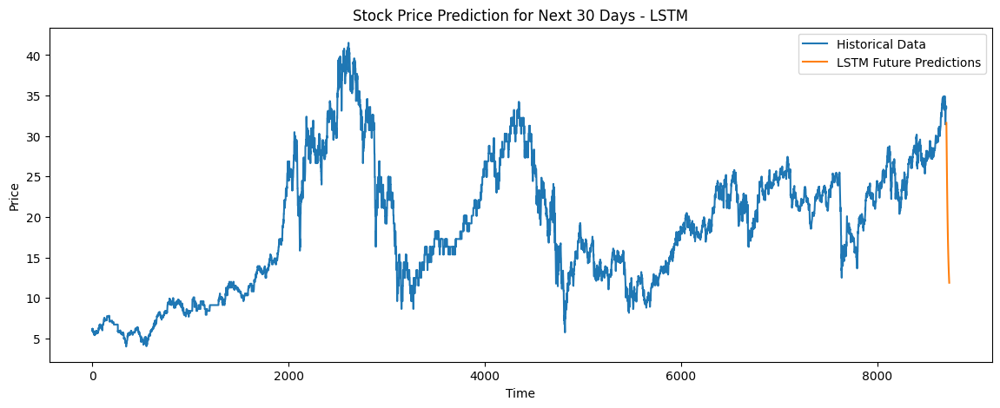

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler

# Assume X_train, Y_train, X_test, Y_test are already defined and preprocessed

# Define LSTM model
def create_lstm_model(input_shape=(30, 1), lstm_units=64, dropout_rate=0.5, lr=0.005):
    model = Sequential()
    model.add(LSTM(units=lstm_units, return_sequences=True, input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(units=lstm_units, return_sequences=False))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# Train the model
lstm_model = create_lstm_model(input_shape=(X_train.shape[1], 1))
lstm_history = lstm_model.fit(X_train, Y_train, batch_size=32, epochs=100, verbose=1, validation_split=0.2)

# Predictions
lstm_predictions = lstm_model.predict(X_test)

# Misalnya, kita fit scaler dengan data training
scaler = MinMaxScaler()
scaler.fit(Y_train.reshape(-1, 1))

# Inverse scaling
lstm_predictions = scaler.inverse_transform(lstm_predictions)
Y_test_unscaled = scaler.inverse_transform(Y_test.reshape(-1, 1))

# Calculate MAPE
lstm_mape = mean_absolute_percentage_error(Y_test_unscaled, lstm_predictions)
print(f'LSTM MAPE: {lstm_mape:.4f}')

# Plot the results
plt.figure(figsize=(14, 5))
plt.plot(Y_test_unscaled, label='True Price')
plt.plot(lstm_predictions, label='LSTM Predictions')
plt.title('Stock Price Prediction - LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()

# Plot the training and validation loss for both models
plt.figure(figsize=(14, 5))
plt.plot(lstm_history.history['loss'], label='LSTM Train Loss')
plt.plot(lstm_history.history['val_loss'], label='LSTM Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Assume lstm_model, data, and scaled_data are already defined and preprocessed
time_step = 30  # Sesuaikan dengan time step yang Anda gunakan

# Fit scaler dengan data asli (bukan data yang sudah discaled)
scaler = MinMaxScaler()
scaler.fit(data.reshape(-1, 1))  # Fit dengan data asli

# Fungsi untuk prediksi 30 hari ke depan
def predict_next_30_days(model, data, time_step):
    temp_input = data[-time_step:].reshape(1, -1)  # Ambil data terakhir sebanyak time_step dan reshape
    temp_input = list(temp_input[0])  # Ubah menjadi list
    lst_output = []
    n_steps = time_step
    i = 0
    while(i < 30):
        if len(temp_input) > n_steps:
            x_input = np.array(temp_input[-n_steps:])  # Ambil hanya n_steps terakhir dan ubah menjadi numpy array
            x_input = x_input.reshape(1, n_steps, 1)
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
        else:
            x_input = np.array(temp_input).reshape((1, n_steps, 1))  # Ubah list menjadi numpy array dan reshape
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
    return np.array(lst_output).reshape(-1, 1)

# Prediksi tanpa inverse transform
lstm_future_predictions_raw = predict_next_30_days(lstm_model, scaled_data, time_step)

# Print prediksi raw (sebelum inverse transform)
print("Raw LSTM Future Predictions (Before Inverse Transform):")
print(lstm_future_predictions_raw.flatten())

# Lakukan inverse transform pada prediksi
lstm_future_predictions = scaler.inverse_transform(lstm_future_predictions_raw)

# Print prediksi setelah inverse transform
print("\nLSTM Future Predictions (After Inverse Transform):")
print(lstm_future_predictions.flatten())

# Plot hasil prediksi
plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(data)), data, label='Historical Data')
plt.plot(np.arange(len(data), len(data) + 30), lstm_future_predictions, label='LSTM Future Predictions')
plt.title('Stock Price Prediction for Next 30 Days - LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()



Epoch 1/200


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


174/174 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step - loss: 0.0287 - val_loss: 3.4245e-04
Epoch 2/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0022 - val_loss: 3.3028e-04
Epoch 3/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.0023 - val_loss: 3.2867e-04
Epoch 4/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.0019 - val_loss: 4.1107e-04
Epoch 5/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step - loss: 0.0019 - val_loss: 0.0011
Epoch 6/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.0021 - val_loss: 2.2786e-04
Epoch 7/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.0019 - val_loss: 3.6411e-04
Epoch 8/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 7s 42ms/step - loss: 0.0020 - val_loss: 2.3368e-04
Epoch 9/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.0019 - val_loss: 4.7857e-04
Epoch 10/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.0023 - val_loss: 2.0020e-04
Epoch 11/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step - loss: 0.0019 - val_loss: 2.7939e-0

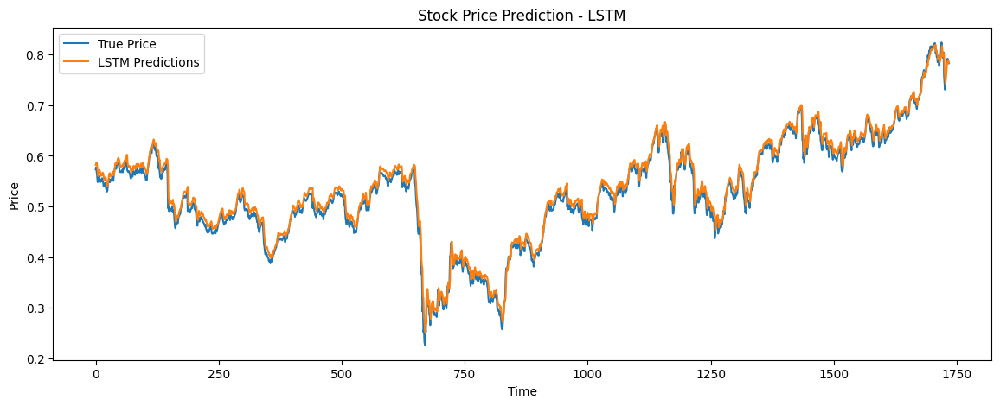

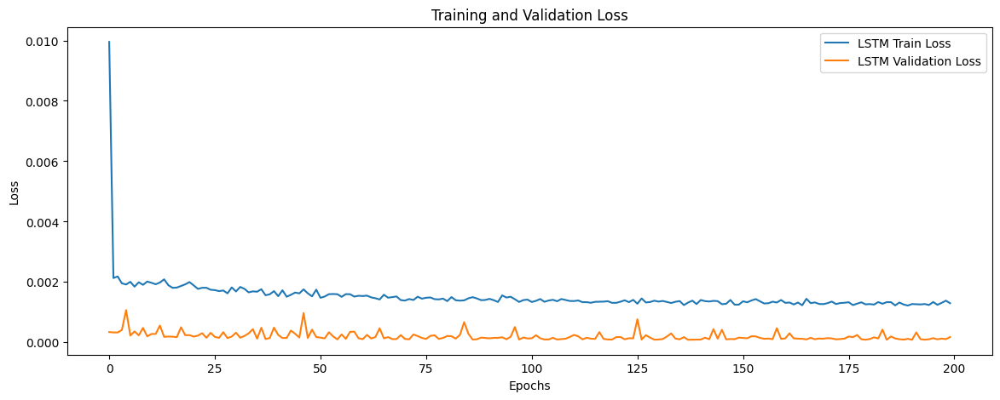

Raw LSTM Future Predictions (Before Inverse Transform):
[0.78678334 0.78678203 0.7871021  0.78721517 0.7873472  0.78756535
 0.78780031 0.78806144 0.78830981 0.78852379 0.78874958 0.788939
 0.78906822 0.78923583 0.78945863 0.78972638 0.78997386 0.79025584
 0.79052776 0.79081649 0.791107   0.79136765 0.79160213 0.79182684
 0.79203367 0.79222858 0.79243207 0.79263824 0.79283273 0.79302633]

LSTM Future Predictions (After Inverse Transform):
[33.51937935 33.51933015 33.53133914 33.53558142 33.54053485 33.54871975
 33.55753529 33.56733258 33.57665129 33.58467965 33.59315079 33.60025779
 33.60510612 33.61139462 33.61975396 33.62979947 33.63908463 33.64966462
 33.65986668 33.67069937 33.68159915 33.69137855 33.70017619 33.70860709
 33.71636709 33.72367983 33.7313146  33.73905    33.74634708 33.75361062]


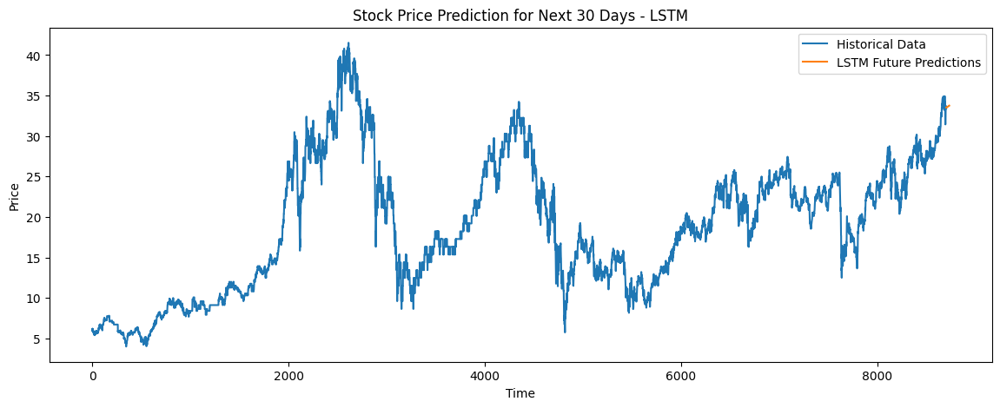

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler

# Assume X_train, Y_train, X_test, Y_test are already defined and preprocessed

# Define LSTM model
def create_lstm_model(input_shape=(30, 1), lstm_units=64, dropout_rate=0.5, lr=0.005):
    model = Sequential()
    model.add(LSTM(units=lstm_units, return_sequences=True, input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(units=lstm_units, return_sequences=False))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# Train the model
lstm_model = create_lstm_model(input_shape=(X_train.shape[1], 1))
lstm_history = lstm_model.fit(X_train, Y_train, batch_size=32, epochs=200, verbose=1, validation_split=0.2)

# Predictions
lstm_predictions = lstm_model.predict(X_test)

# Misalnya, kita fit scaler dengan data training
scaler = MinMaxScaler()
scaler.fit(Y_train.reshape(-1, 1))

# Inverse scaling
lstm_predictions = scaler.inverse_transform(lstm_predictions)
Y_test_unscaled = scaler.inverse_transform(Y_test.reshape(-1, 1))

# Calculate MAPE
lstm_mape = mean_absolute_percentage_error(Y_test_unscaled, lstm_predictions)
print(f'LSTM MAPE: {lstm_mape:.4f}')

# Plot the results
plt.figure(figsize=(14, 5))
plt.plot(Y_test_unscaled, label='True Price')
plt.plot(lstm_predictions, label='LSTM Predictions')
plt.title('Stock Price Prediction - LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()

# Plot the training and validation loss for both models
plt.figure(figsize=(14, 5))
plt.plot(lstm_history.history['loss'], label='LSTM Train Loss')
plt.plot(lstm_history.history['val_loss'], label='LSTM Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Assume lstm_model, data, and scaled_data are already defined and preprocessed
time_step = 30  # Sesuaikan dengan time step yang Anda gunakan

# Fit scaler dengan data asli (bukan data yang sudah discaled)
scaler = MinMaxScaler()
scaler.fit(data.reshape(-1, 1))  # Fit dengan data asli

# Fungsi untuk prediksi 30 hari ke depan
def predict_next_30_days(model, data, time_step):
    temp_input = data[-time_step:].reshape(1, -1)  # Ambil data terakhir sebanyak time_step dan reshape
    temp_input = list(temp_input[0])  # Ubah menjadi list
    lst_output = []
    n_steps = time_step
    i = 0
    while(i < 30):
        if len(temp_input) > n_steps:
            x_input = np.array(temp_input[-n_steps:])  # Ambil hanya n_steps terakhir dan ubah menjadi numpy array
            x_input = x_input.reshape(1, n_steps, 1)
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
        else:
            x_input = np.array(temp_input).reshape((1, n_steps, 1))  # Ubah list menjadi numpy array dan reshape
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
    return np.array(lst_output).reshape(-1, 1)

# Prediksi tanpa inverse transform
lstm_future_predictions_raw = predict_next_30_days(lstm_model, scaled_data, time_step)

# Print prediksi raw (sebelum inverse transform)
print("Raw LSTM Future Predictions (Before Inverse Transform):")
print(lstm_future_predictions_raw.flatten())

# Lakukan inverse transform pada prediksi
lstm_future_predictions = scaler.inverse_transform(lstm_future_predictions_raw)

# Print prediksi setelah inverse transform
print("\nLSTM Future Predictions (After Inverse Transform):")
print(lstm_future_predictions.flatten())

# Plot hasil prediksi
plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(data)), data, label='Historical Data')
plt.plot(np.arange(len(data), len(data) + 30), lstm_future_predictions, label='LSTM Future Predictions')
plt.title('Stock Price Prediction for Next 30 Days - LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()



/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step - loss: 0.0163 - val_loss: 7.0633e-04
Epoch 2/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.0024 - val_loss: 5.2448e-04
Epoch 3/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.0022 - val_loss: 3.6295e-04
Epoch 4/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.0022 - val_loss: 2.3608e-04
Epoch 5/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.0018 - val_loss: 3.6033e-04
Epoch 6/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.0021 - val_loss: 3.0672e-04
Epoch 7/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.0018 - val_loss: 7.4858e-04
Epoch 8/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.0019 - val_loss: 4.2503e-04
Epoch 9/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.0018 - val_loss: 3.3978e-04
Epoch 10/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.0020 - val_loss: 3.0018e-04
Epoch 11/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.0018 - val_loss: 4.6496e-04
Epoch 12/50
87/87 ━

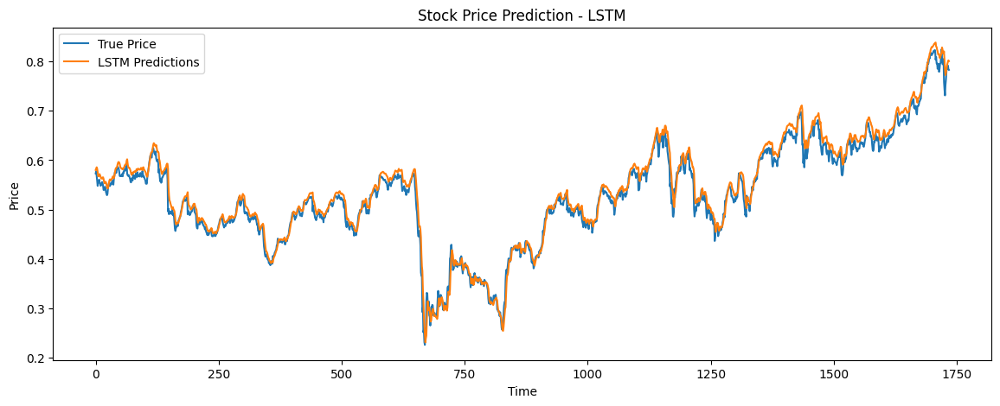

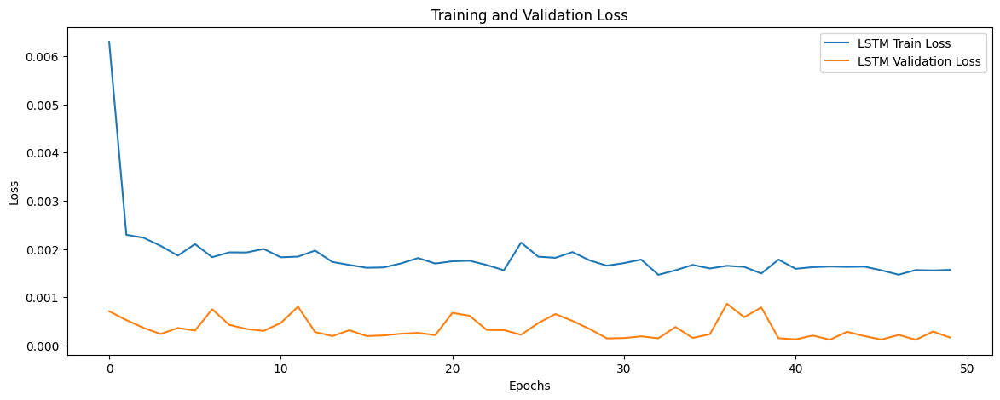

Raw LSTM Future Predictions (Before Inverse Transform):
[0.8028062  0.81124997 0.81864524 0.82483673 0.83048445 0.83609647
 0.84178263 0.84746766 0.85306996 0.85855442 0.86391693 0.86915964
 0.87428141 0.87927908 0.88414943 0.88888925 0.89349729 0.89797306
 0.90231675 0.90652752 0.91060662 0.91455525 0.91837525 0.9220686
 0.92563677 0.92908156 0.93240494 0.93560916 0.93869627 0.94166899]

LSTM Future Predictions (After Inverse Transform):
[34.1205424  34.43734501 34.71480866 34.94710777 35.159005   35.36956269
 35.58290234 35.79619951 36.00639267 36.21216465 36.41336113 36.61006263
 36.80222665 36.98973467 37.17246593 37.35029967 37.52318892 37.69111579
 37.854087   38.01207124 38.16511546 38.31326439 38.45658737 38.59515818
 38.72903274 38.85827813 38.98296816 39.1031878  39.21901309 39.33054689]


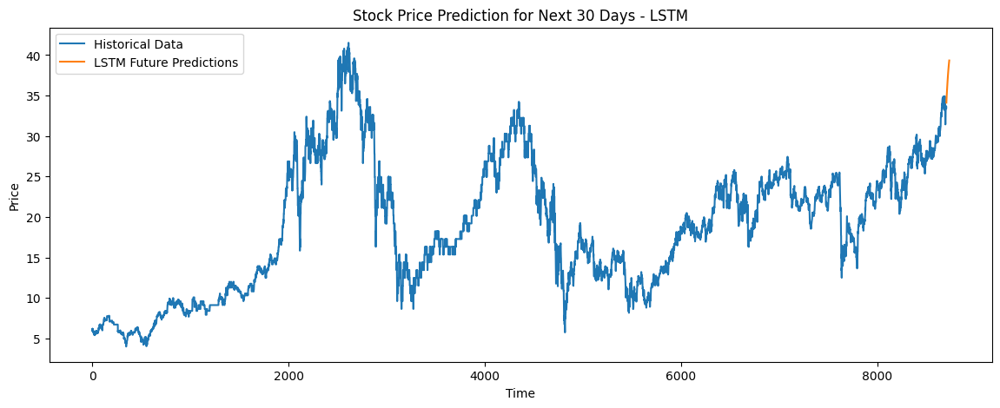

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler

# Assume X_train, Y_train, X_test, Y_test are already defined and preprocessed

# Define LSTM model
def create_lstm_model(input_shape=(30, 1), lstm_units=64, dropout_rate=0.5, lr=0.005):
    model = Sequential()
    model.add(LSTM(units=lstm_units, return_sequences=True, input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(units=lstm_units, return_sequences=False))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# Train the model
lstm_model = create_lstm_model(input_shape=(X_train.shape[1], 1))
lstm_history = lstm_model.fit(X_train, Y_train, batch_size=64, epochs=50, verbose=1, validation_split=0.2)

# Predictions
lstm_predictions = lstm_model.predict(X_test)

# Misalnya, kita fit scaler dengan data training
scaler = MinMaxScaler()
scaler.fit(Y_train.reshape(-1, 1))

# Inverse scaling
lstm_predictions = scaler.inverse_transform(lstm_predictions)
Y_test_unscaled = scaler.inverse_transform(Y_test.reshape(-1, 1))

# Calculate MAPE
lstm_mape = mean_absolute_percentage_error(Y_test_unscaled, lstm_predictions)
print(f'LSTM MAPE: {lstm_mape:.4f}')

# Plot the results
plt.figure(figsize=(14, 5))
plt.plot(Y_test_unscaled, label='True Price')
plt.plot(lstm_predictions, label='LSTM Predictions')
plt.title('Stock Price Prediction - LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()

# Plot the training and validation loss for both models
plt.figure(figsize=(14, 5))
plt.plot(lstm_history.history['loss'], label='LSTM Train Loss')
plt.plot(lstm_history.history['val_loss'], label='LSTM Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Assume lstm_model, data, and scaled_data are already defined and preprocessed
time_step = 30  # Sesuaikan dengan time step yang Anda gunakan

# Fit scaler dengan data asli (bukan data yang sudah discaled)
scaler = MinMaxScaler()
scaler.fit(data.reshape(-1, 1))  # Fit dengan data asli

# Fungsi untuk prediksi 30 hari ke depan
def predict_next_30_days(model, data, time_step):
    temp_input = data[-time_step:].reshape(1, -1)  # Ambil data terakhir sebanyak time_step dan reshape
    temp_input = list(temp_input[0])  # Ubah menjadi list
    lst_output = []
    n_steps = time_step
    i = 0
    while(i < 30):
        if len(temp_input) > n_steps:
            x_input = np.array(temp_input[-n_steps:])  # Ambil hanya n_steps terakhir dan ubah menjadi numpy array
            x_input = x_input.reshape(1, n_steps, 1)
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
        else:
            x_input = np.array(temp_input).reshape((1, n_steps, 1))  # Ubah list menjadi numpy array dan reshape
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
    return np.array(lst_output).reshape(-1, 1)

# Prediksi tanpa inverse transform
lstm_future_predictions_raw = predict_next_30_days(lstm_model, scaled_data, time_step)

# Print prediksi raw (sebelum inverse transform)
print("Raw LSTM Future Predictions (Before Inverse Transform):")
print(lstm_future_predictions_raw.flatten())

# Lakukan inverse transform pada prediksi
lstm_future_predictions = scaler.inverse_transform(lstm_future_predictions_raw)

# Print prediksi setelah inverse transform
print("\nLSTM Future Predictions (After Inverse Transform):")
print(lstm_future_predictions.flatten())

# Plot hasil prediksi
plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(data)), data, label='Historical Data')
plt.plot(np.arange(len(data), len(data) + 30), lstm_future_predictions, label='LSTM Future Predictions')
plt.title('Stock Price Prediction for Next 30 Days - LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()



Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


87/87 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0421 - val_loss: 4.5565e-04
Epoch 2/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step - loss: 0.0026 - val_loss: 4.4633e-04
Epoch 3/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.0020 - val_loss: 2.9052e-04
Epoch 4/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step - loss: 0.0020 - val_loss: 3.9451e-04
Epoch 5/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step - loss: 0.0017 - val_loss: 3.5662e-04
Epoch 6/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.0018 - val_loss: 3.1087e-04
Epoch 7/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step - loss: 0.0019 - val_loss: 2.8913e-04
Epoch 8/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step - loss: 0.0017 - val_loss: 2.7492e-04
Epoch 9/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.0018 - val_loss: 3.4507e-04
Epoch 10/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step - loss: 0.0017 - val_loss: 3.0205e-04
Epoch 11/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.0017 - val_loss: 2.2154e-04
Epoch 12/100
87/87 

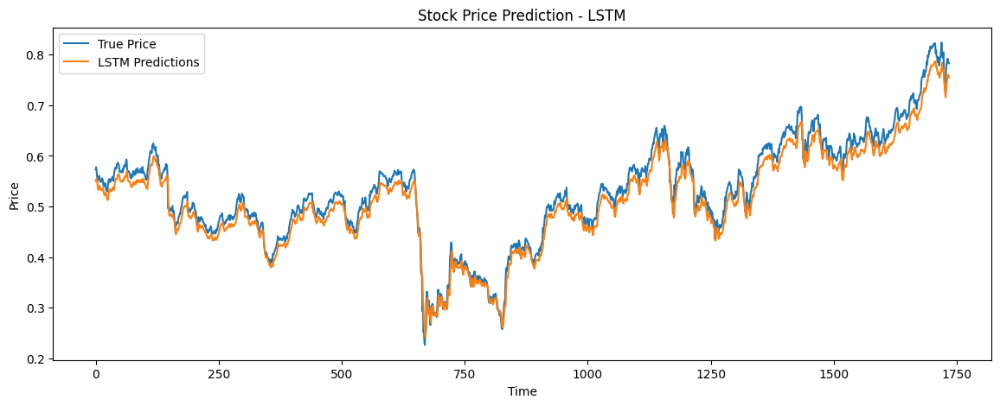

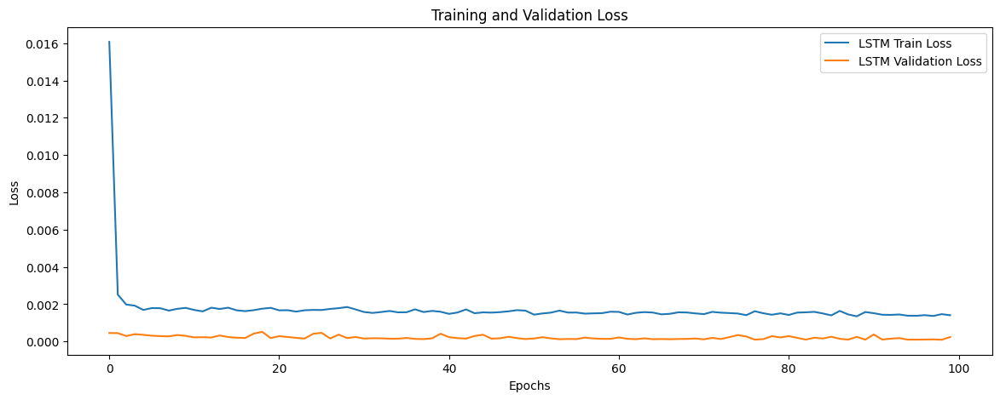

Raw LSTM Future Predictions (Before Inverse Transform):
[0.75549161 0.73459113 0.71905231 0.70388341 0.68944383 0.67747676
 0.66628182 0.65659654 0.64730614 0.63848674 0.62968278 0.62076032
 0.61165953 0.60229588 0.59274447 0.58299756 0.57316554 0.56327391
 0.55338824 0.54355276 0.53380024 0.52415246 0.51462382 0.50522947
 0.49598292 0.48689777 0.47798896 0.46926892 0.46074578 0.45243597]

LSTM Future Predictions (After Inverse Transform):
[32.34534258 31.56117544 30.97817348 30.40905006 29.86729016 29.41829693
 28.99827288 28.63489013 28.28632295 27.9554271  27.62511046 27.29034803
 26.94889455 26.59757895 26.23921895 25.87352386 25.50463532 25.13351046
 24.76260923 24.39359098 24.02768567 23.66570957 23.30820385 22.95573654
 22.60881416 22.26794772 21.9336974  21.60652949 21.28674922 20.97497272]


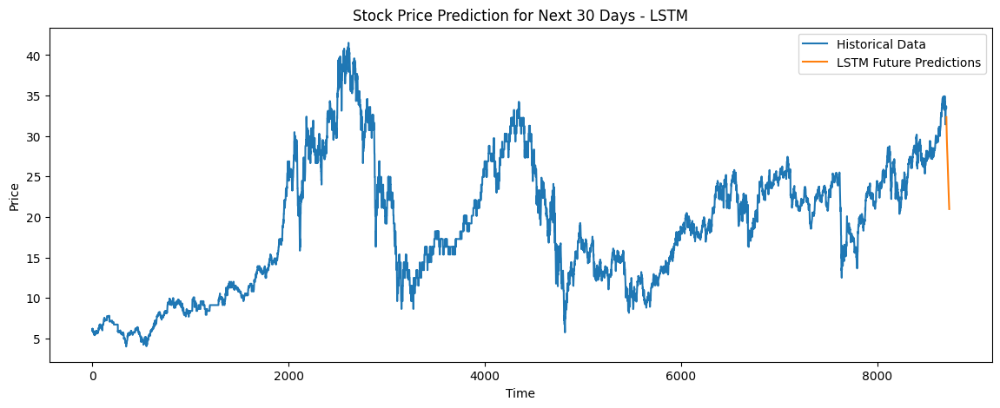

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler

# Assume X_train, Y_train, X_test, Y_test are already defined and preprocessed

# Define LSTM model
def create_lstm_model(input_shape=(30, 1), lstm_units=64, dropout_rate=0.5, lr=0.005):
    model = Sequential()
    model.add(LSTM(units=lstm_units, return_sequences=True, input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(units=lstm_units, return_sequences=False))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# Train the model
lstm_model = create_lstm_model(input_shape=(X_train.shape[1], 1))
lstm_history = lstm_model.fit(X_train, Y_train, batch_size=64, epochs=100, verbose=1, validation_split=0.2)

# Predictions
lstm_predictions = lstm_model.predict(X_test)

# Misalnya, kita fit scaler dengan data training
scaler = MinMaxScaler()
scaler.fit(Y_train.reshape(-1, 1))

# Inverse scaling
lstm_predictions = scaler.inverse_transform(lstm_predictions)
Y_test_unscaled = scaler.inverse_transform(Y_test.reshape(-1, 1))

# Calculate MAPE
lstm_mape = mean_absolute_percentage_error(Y_test_unscaled, lstm_predictions)
print(f'LSTM MAPE: {lstm_mape:.4f}')

# Plot the results
plt.figure(figsize=(14, 5))
plt.plot(Y_test_unscaled, label='True Price')
plt.plot(lstm_predictions, label='LSTM Predictions')
plt.title('Stock Price Prediction - LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()

# Plot the training and validation loss for both models
plt.figure(figsize=(14, 5))
plt.plot(lstm_history.history['loss'], label='LSTM Train Loss')
plt.plot(lstm_history.history['val_loss'], label='LSTM Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Assume lstm_model, data, and scaled_data are already defined and preprocessed
time_step = 30  # Sesuaikan dengan time step yang Anda gunakan

# Fit scaler dengan data asli (bukan data yang sudah discaled)
scaler = MinMaxScaler()
scaler.fit(data.reshape(-1, 1))  # Fit dengan data asli

# Fungsi untuk prediksi 30 hari ke depan
def predict_next_30_days(model, data, time_step):
    temp_input = data[-time_step:].reshape(1, -1)  # Ambil data terakhir sebanyak time_step dan reshape
    temp_input = list(temp_input[0])  # Ubah menjadi list
    lst_output = []
    n_steps = time_step
    i = 0
    while(i < 30):
        if len(temp_input) > n_steps:
            x_input = np.array(temp_input[-n_steps:])  # Ambil hanya n_steps terakhir dan ubah menjadi numpy array
            x_input = x_input.reshape(1, n_steps, 1)
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
        else:
            x_input = np.array(temp_input).reshape((1, n_steps, 1))  # Ubah list menjadi numpy array dan reshape
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
    return np.array(lst_output).reshape(-1, 1)

# Prediksi tanpa inverse transform
lstm_future_predictions_raw = predict_next_30_days(lstm_model, scaled_data, time_step)

# Print prediksi raw (sebelum inverse transform)
print("Raw LSTM Future Predictions (Before Inverse Transform):")
print(lstm_future_predictions_raw.flatten())

# Lakukan inverse transform pada prediksi
lstm_future_predictions = scaler.inverse_transform(lstm_future_predictions_raw)

# Print prediksi setelah inverse transform
print("\nLSTM Future Predictions (After Inverse Transform):")
print(lstm_future_predictions.flatten())

# Plot hasil prediksi
plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(data)), data, label='Historical Data')
plt.plot(np.arange(len(data), len(data) + 30), lstm_future_predictions, label='LSTM Future Predictions')
plt.title('Stock Price Prediction for Next 30 Days - LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()



Epoch 1/200


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


87/87 ━━━━━━━━━━━━━━━━━━━━ 8s 51ms/step - loss: 0.0269 - val_loss: 3.2742e-04
Epoch 2/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0023 - val_loss: 3.2756e-04
Epoch 3/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step - loss: 0.0021 - val_loss: 6.3041e-04
Epoch 4/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 5s 51ms/step - loss: 0.0019 - val_loss: 3.2713e-04
Epoch 5/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step - loss: 0.0019 - val_loss: 2.4101e-04
Epoch 6/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step - loss: 0.0019 - val_loss: 3.8244e-04
Epoch 7/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 6s 56ms/step - loss: 0.0018 - val_loss: 7.4811e-04
Epoch 8/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step - loss: 0.0021 - val_loss: 3.2580e-04
Epoch 9/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step - loss: 0.0018 - val_loss: 2.5780e-04
Epoch 10/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step - loss: 0.0017 - val_loss: 5.9810e-04
Epoch 11/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step - loss: 0.0023 - val_loss: 2.0577e-04
Epoch 12/200
87/87 ━

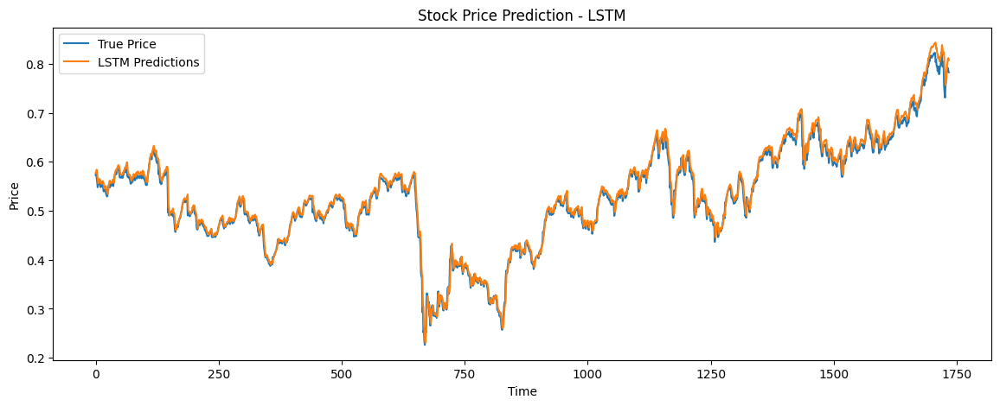

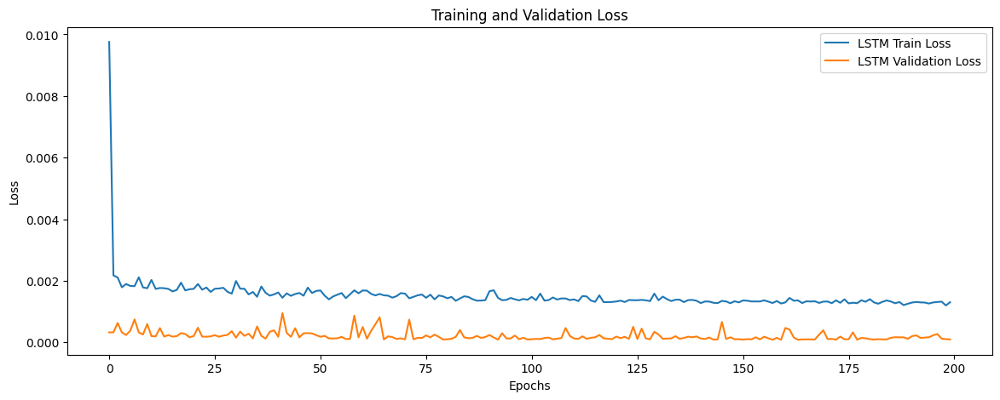

Raw LSTM Future Predictions (Before Inverse Transform):
[0.80724108 0.81976509 0.83191395 0.84416902 0.85648584 0.8681339
 0.87918067 0.88977242 0.89979112 0.90927827 0.91821098 0.92664731
 0.93445528 0.94180763 0.94863117 0.95495796 0.96068692 0.96601129
 0.97085631 0.97527063 0.97923923 0.98280549 0.98599792 0.98885512
 0.99140942 0.99368739 0.99572849 0.99755025 0.99918032 1.00062466]

LSTM Future Predictions (After Inverse Transform):
[34.28693516 34.75682449 35.21263847 35.67243755 36.13455346 36.57157794
 36.98604252 37.3834351  37.75932777 38.11527702 38.45042409 38.76694717
 39.05989504 39.33574855 39.59176151 39.82913704 40.04408237 40.24384761
 40.42562844 40.59124967 40.74014777 40.87395077 40.99372762 41.10092745
 41.19676235 41.28222971 41.35880996 41.42716059 41.48831924 41.54250955]


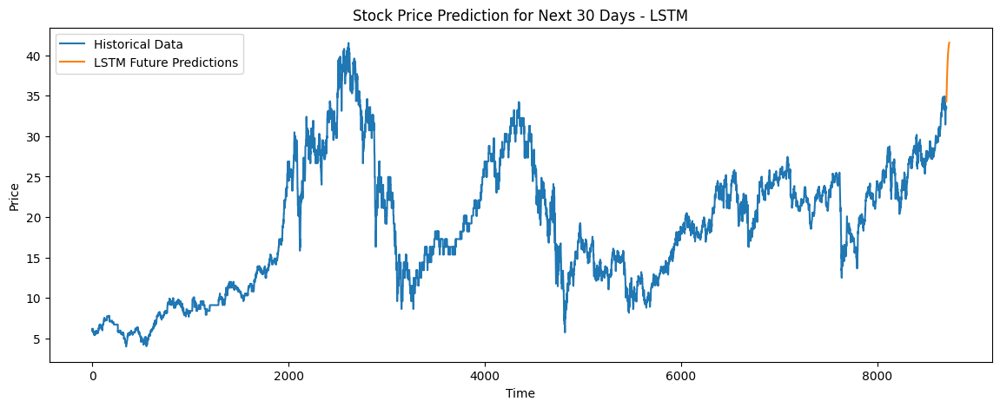

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler

# Assume X_train, Y_train, X_test, Y_test are already defined and preprocessed

# Define LSTM model
def create_lstm_model(input_shape=(30, 1), lstm_units=64, dropout_rate=0.5, lr=0.005):
    model = Sequential()
    model.add(LSTM(units=lstm_units, return_sequences=True, input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(units=lstm_units, return_sequences=False))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# Train the model
lstm_model = create_lstm_model(input_shape=(X_train.shape[1], 1))
lstm_history = lstm_model.fit(X_train, Y_train, batch_size=64, epochs=200, verbose=1, validation_split=0.2)

# Predictions
lstm_predictions = lstm_model.predict(X_test)

# Misalnya, kita fit scaler dengan data training
scaler = MinMaxScaler()
scaler.fit(Y_train.reshape(-1, 1))

# Inverse scaling
lstm_predictions = scaler.inverse_transform(lstm_predictions)
Y_test_unscaled = scaler.inverse_transform(Y_test.reshape(-1, 1))

# Calculate MAPE
lstm_mape = mean_absolute_percentage_error(Y_test_unscaled, lstm_predictions)
print(f'LSTM MAPE: {lstm_mape:.4f}')

# Plot the results
plt.figure(figsize=(14, 5))
plt.plot(Y_test_unscaled, label='True Price')
plt.plot(lstm_predictions, label='LSTM Predictions')
plt.title('Stock Price Prediction - LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()

# Plot the training and validation loss for both models
plt.figure(figsize=(14, 5))
plt.plot(lstm_history.history['loss'], label='LSTM Train Loss')
plt.plot(lstm_history.history['val_loss'], label='LSTM Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Assume lstm_model, data, and scaled_data are already defined and preprocessed
time_step = 30  # Sesuaikan dengan time step yang Anda gunakan

# Fit scaler dengan data asli (bukan data yang sudah discaled)
scaler = MinMaxScaler()
scaler.fit(data.reshape(-1, 1))  # Fit dengan data asli

# Fungsi untuk prediksi 30 hari ke depan
def predict_next_30_days(model, data, time_step):
    temp_input = data[-time_step:].reshape(1, -1)  # Ambil data terakhir sebanyak time_step dan reshape
    temp_input = list(temp_input[0])  # Ubah menjadi list
    lst_output = []
    n_steps = time_step
    i = 0
    while(i < 30):
        if len(temp_input) > n_steps:
            x_input = np.array(temp_input[-n_steps:])  # Ambil hanya n_steps terakhir dan ubah menjadi numpy array
            x_input = x_input.reshape(1, n_steps, 1)
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
        else:
            x_input = np.array(temp_input).reshape((1, n_steps, 1))  # Ubah list menjadi numpy array dan reshape
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
    return np.array(lst_output).reshape(-1, 1)

# Prediksi tanpa inverse transform
lstm_future_predictions_raw = predict_next_30_days(lstm_model, scaled_data, time_step)

# Print prediksi raw (sebelum inverse transform)
print("Raw LSTM Future Predictions (Before Inverse Transform):")
print(lstm_future_predictions_raw.flatten())

# Lakukan inverse transform pada prediksi
lstm_future_predictions = scaler.inverse_transform(lstm_future_predictions_raw)

# Print prediksi setelah inverse transform
print("\nLSTM Future Predictions (After Inverse Transform):")
print(lstm_future_predictions.flatten())

# Plot hasil prediksi
plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(data)), data, label='Historical Data')
plt.plot(np.arange(len(data), len(data) + 30), lstm_future_predictions, label='LSTM Future Predictions')
plt.title('Stock Price Prediction for Next 30 Days - LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()

**MODEL** **BILSTM**

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0159 - val_loss: 3.9145e-04
Epoch 2/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 14s 82ms/step - loss: 0.0015 - val_loss: 2.9657e-04
Epoch 3/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.0010 - val_loss: 2.6924e-04
Epoch 4/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 15s 85ms/step - loss: 9.0404e-04 - val_loss: 2.2043e-04
Epoch 5/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 19s 78ms/step - loss: 7.9501e-04 - val_loss: 2.9194e-04
Epoch 6/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 7.5448e-04 - val_loss: 2.6814e-04
Epoch 7/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 7.9991e-04 - val_loss: 2.2611e-04
Epoch 8/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 15s 85ms/step - loss: 6.4702e-04 - val_loss: 1.6461e-04
Epoch 9/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 20s 81ms/step - loss: 7.2677e-04 - val_loss: 1.7178e-04
Epoch 10/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 14s 80ms/step - loss: 6.5425e-04 - val_loss: 1.7893e-04
Epoch 11/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/s

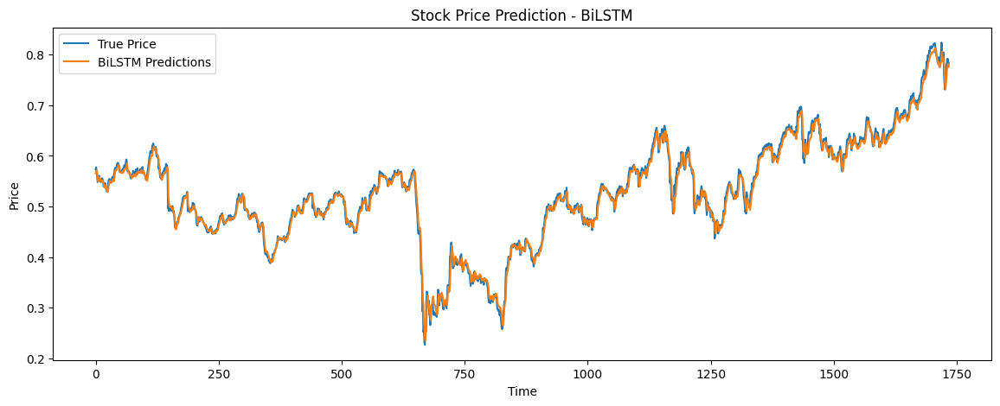

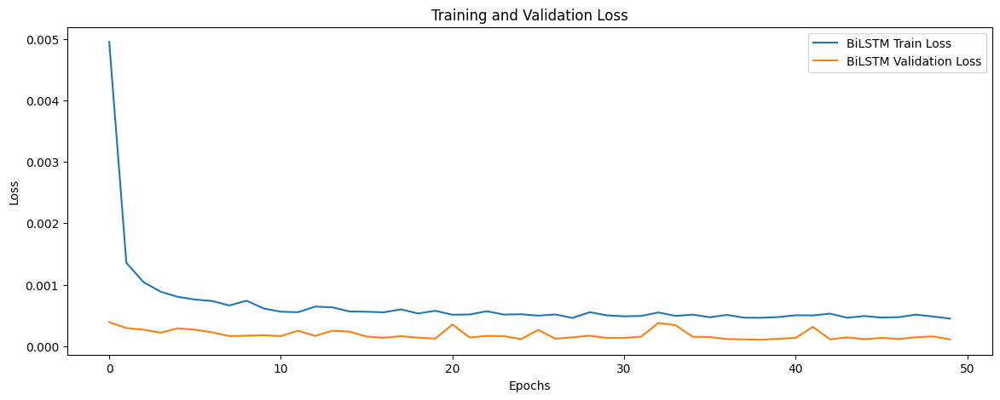

Raw BiLSTM Future Predictions (Before Inverse Transform):
[0.77562791 0.76815361 0.7612856  0.75501168 0.74960136 0.74497753
 0.74119908 0.73797953 0.73507953 0.73256439 0.73009592 0.72740024
 0.72436726 0.72073847 0.71624333 0.71122295 0.70586008 0.70015806
 0.69400823 0.68831682 0.6832459  0.67906243 0.67543834 0.6722976
 0.66935885 0.66654998 0.66367173 0.66067886 0.65762895 0.65446466]

BiLSTM Future Predictions (After Inverse Transform):
[33.10083797 32.82040897 32.56272773 32.3273358  32.1243458  31.95086392
 31.80909966 31.68830529 31.57949978 31.48513414 31.39251953 31.2913801
 31.17758539 31.0414365  30.87278282 30.68442277 30.48321287 30.26927835
 30.03854243 29.82500598 29.63474953 29.47778953 29.34181731 29.22397934
 29.11372023 29.00833405 28.9003448  28.78805512 28.67362529 28.55490398]


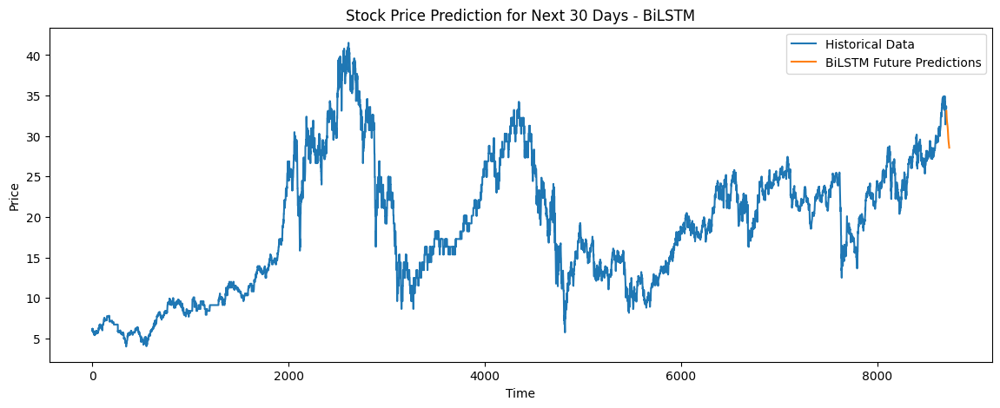

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Bidirectional, LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler

# Assume X_train, Y_train, X_test, Y_test are already defined and preprocessed

# Define BiLSTM model
def create_bilstm_model(input_shape=(30, 1), lstm_units=64, dropout_rate=0.2, lr=0.001):
    model = Sequential()
    model.add(Bidirectional(LSTM(units=lstm_units, return_sequences=True), input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(Bidirectional(LSTM(units=lstm_units, return_sequences=False)))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# Train the model
bilstm_model = create_bilstm_model(input_shape=(X_train.shape[1], 1))
bilstm_history = bilstm_model.fit(X_train, Y_train, batch_size=32, epochs=50, verbose=1, validation_split=0.2)

# Predictions
bilstm_predictions = bilstm_model.predict(X_test)

# Misalnya, kita fit scaler dengan data training
scaler = MinMaxScaler()
scaler.fit(Y_train.reshape(-1, 1))

# Inverse scaling
bilstm_predictions = scaler.inverse_transform(bilstm_predictions)
Y_test_unscaled = scaler.inverse_transform(Y_test.reshape(-1, 1))

# Calculate MAPE
bilstm_mape = mean_absolute_percentage_error(Y_test_unscaled, bilstm_predictions)
print(f'BiLSTM MAPE: {bilstm_mape:.4f}')

# Plot the results
plt.figure(figsize=(14, 5))
plt.plot(Y_test_unscaled, label='True Price')
plt.plot(bilstm_predictions, label='BiLSTM Predictions')
plt.title('Stock Price Prediction - BiLSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()


# Plot the training and validation loss for both models
plt.figure(figsize=(14, 5))
plt.plot(bilstm_history.history['loss'], label='BiLSTM Train Loss')
plt.plot(bilstm_history.history['val_loss'], label='BiLSTM Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Assume bilstm_model, data, and scaled_data are already defined and preprocessed
time_step = 30  # Sesuaikan dengan time step yang Anda gunakan

# Fit scaler dengan data asli (bukan data yang sudah discaled)
scaler = MinMaxScaler()
scaler.fit(data.reshape(-1, 1))  # Fit dengan data asli

# Fungsi untuk prediksi 30 hari ke depan
def predict_next_30_days(model, data, time_step):
    temp_input = data[-time_step:].reshape(1, -1)  # Ambil data terakhir sebanyak time_step dan reshape
    temp_input = list(temp_input[0])  # Ubah menjadi list
    lst_output = []
    n_steps = time_step
    i = 0
    while(i < 30):
        if len(temp_input) > n_steps:
            x_input = np.array(temp_input[-n_steps:])  # Ambil hanya n_steps terakhir dan ubah menjadi numpy array
            x_input = x_input.reshape(1, n_steps, 1)
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
        else:
            x_input = np.array(temp_input).reshape((1, n_steps, 1))  # Ubah list menjadi numpy array dan reshape
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
    return np.array(lst_output).reshape(-1, 1)

# Prediksi tanpa inverse transform
bilstm_future_predictions_raw = predict_next_30_days(bilstm_model, scaled_data, time_step)

# Print prediksi raw (sebelum inverse transform)
print("Raw BiLSTM Future Predictions (Before Inverse Transform):")
print(bilstm_future_predictions_raw.flatten())

# Lakukan inverse transform pada prediksi
bilstm_future_predictions = scaler.inverse_transform(bilstm_future_predictions_raw)

# Print prediksi setelah inverse transform
print("\nBiLSTM Future Predictions (After Inverse Transform):")
print(bilstm_future_predictions.flatten())

# Plot hasil prediksi
plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(data)), data, label='Historical Data')
plt.plot(np.arange(len(data), len(data) + 30), bilstm_future_predictions, label='BiLSTM Future Predictions')
plt.title('Stock Price Prediction for Next 30 Days - BiLSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()


Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


174/174 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.0158 - val_loss: 5.0319e-04
Epoch 2/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 20s 85ms/step - loss: 0.0014 - val_loss: 3.0030e-04
Epoch 3/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 20s 84ms/step - loss: 0.0013 - val_loss: 6.2477e-04
Epoch 4/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step - loss: 0.0010 - val_loss: 2.2683e-04
Epoch 5/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - loss: 8.2884e-04 - val_loss: 3.7861e-04
Epoch 6/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 8.9961e-04 - val_loss: 1.9197e-04
Epoch 7/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 19s 85ms/step - loss: 7.0356e-04 - val_loss: 2.0883e-04
Epoch 8/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step - loss: 7.3667e-04 - val_loss: 1.7923e-04
Epoch 9/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step - loss: 6.6931e-04 - val_loss: 1.9583e-04
Epoch 10/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 15s 85ms/step - loss: 6.4403e-04 - val_loss: 1.5538e-04
Epoch 11/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step -

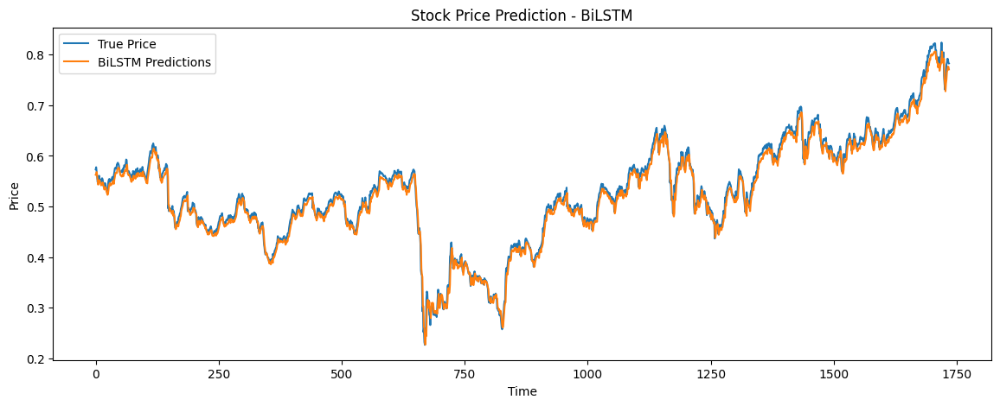

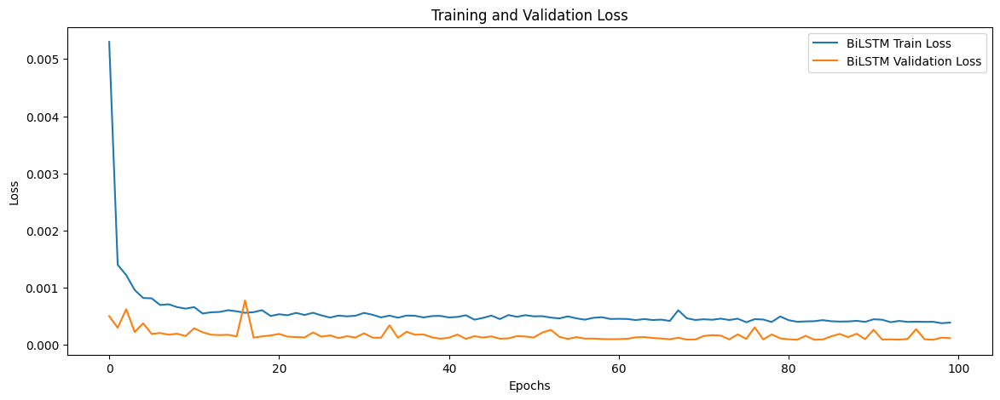

Raw BiLSTM Future Predictions (Before Inverse Transform):
[0.77574253 0.76581329 0.75906491 0.75294584 0.74711722 0.74089426
 0.73424685 0.7265588  0.7174148  0.70804197 0.69897074 0.69058383
 0.68363261 0.67805713 0.67281276 0.66826123 0.66427946 0.65969169
 0.65242791 0.64412856 0.63558066 0.62804681 0.62120885 0.61520773
 0.60962528 0.60448509 0.59941673 0.59432411 0.58948338 0.58480328]

BiLSTM Future Predictions (After Inverse Transform):
[33.1051384  32.73260243 32.47940947 32.24982748 32.03114304 31.79766316
 31.54825851 31.25981009 30.91673529 30.56507529 30.22473102 29.91006185
 29.64925872 29.44007189 29.24330778 29.07253855 28.92314623 28.75101732
 28.47848697 28.16710294 27.84639349 27.56373042 27.30717627 27.08201995
 26.87257148 26.67971643 26.48955615 26.29848568 26.11686587 25.94127292]


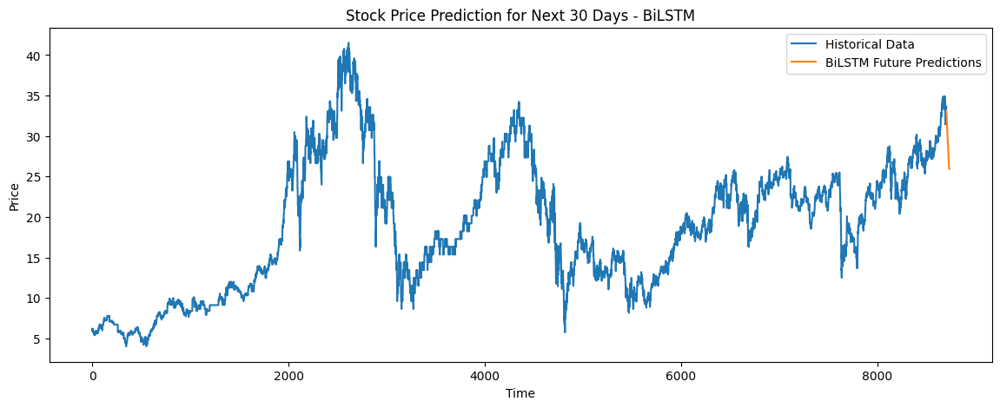

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Bidirectional, LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler

# Assume X_train, Y_train, X_test, Y_test are already defined and preprocessed

# Define BiLSTM model
def create_bilstm_model(input_shape=(30, 1), lstm_units=64, dropout_rate=0.2, lr=0.001):
    model = Sequential()
    model.add(Bidirectional(LSTM(units=lstm_units, return_sequences=True), input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(Bidirectional(LSTM(units=lstm_units, return_sequences=False)))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# Train the model
bilstm_model = create_bilstm_model(input_shape=(X_train.shape[1], 1))
bilstm_history = bilstm_model.fit(X_train, Y_train, batch_size=32, epochs=100, verbose=1, validation_split=0.2)

# Predictions
bilstm_predictions = bilstm_model.predict(X_test)

# Misalnya, kita fit scaler dengan data training
scaler = MinMaxScaler()
scaler.fit(Y_train.reshape(-1, 1))

# Inverse scaling
bilstm_predictions = scaler.inverse_transform(bilstm_predictions)
Y_test_unscaled = scaler.inverse_transform(Y_test.reshape(-1, 1))

# Calculate MAPE
bilstm_mape = mean_absolute_percentage_error(Y_test_unscaled, bilstm_predictions)
print(f'BiLSTM MAPE: {bilstm_mape:.4f}')

# Plot the results
plt.figure(figsize=(14, 5))
plt.plot(Y_test_unscaled, label='True Price')
plt.plot(bilstm_predictions, label='BiLSTM Predictions')
plt.title('Stock Price Prediction - BiLSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()


# Plot the training and validation loss for both models
plt.figure(figsize=(14, 5))
plt.plot(bilstm_history.history['loss'], label='BiLSTM Train Loss')
plt.plot(bilstm_history.history['val_loss'], label='BiLSTM Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Assume bilstm_model, data, and scaled_data are already defined and preprocessed
time_step = 30  # Sesuaikan dengan time step yang Anda gunakan

# Fit scaler dengan data asli (bukan data yang sudah discaled)
scaler = MinMaxScaler()
scaler.fit(data.reshape(-1, 1))  # Fit dengan data asli

# Fungsi untuk prediksi 30 hari ke depan
def predict_next_30_days(model, data, time_step):
    temp_input = data[-time_step:].reshape(1, -1)  # Ambil data terakhir sebanyak time_step dan reshape
    temp_input = list(temp_input[0])  # Ubah menjadi list
    lst_output = []
    n_steps = time_step
    i = 0
    while(i < 30):
        if len(temp_input) > n_steps:
            x_input = np.array(temp_input[-n_steps:])  # Ambil hanya n_steps terakhir dan ubah menjadi numpy array
            x_input = x_input.reshape(1, n_steps, 1)
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
        else:
            x_input = np.array(temp_input).reshape((1, n_steps, 1))  # Ubah list menjadi numpy array dan reshape
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
    return np.array(lst_output).reshape(-1, 1)

# Prediksi tanpa inverse transform
bilstm_future_predictions_raw = predict_next_30_days(bilstm_model, scaled_data, time_step)

# Print prediksi raw (sebelum inverse transform)
print("Raw BiLSTM Future Predictions (Before Inverse Transform):")
print(bilstm_future_predictions_raw.flatten())

# Lakukan inverse transform pada prediksi
bilstm_future_predictions = scaler.inverse_transform(bilstm_future_predictions_raw)

# Print prediksi setelah inverse transform
print("\nBiLSTM Future Predictions (After Inverse Transform):")
print(bilstm_future_predictions.flatten())

# Plot hasil prediksi
plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(data)), data, label='Historical Data')
plt.plot(np.arange(len(data), len(data) + 30), bilstm_future_predictions, label='BiLSTM Future Predictions')
plt.title('Stock Price Prediction for Next 30 Days - BiLSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 22s 88ms/step - loss: 0.0073 - val_loss: 3.7432e-04
Epoch 2/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step - loss: 0.0013 - val_loss: 3.2744e-04
Epoch 3/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step - loss: 9.6878e-04 - val_loss: 2.6782e-04
Epoch 4/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 8.8960e-04 - val_loss: 1.8988e-04
Epoch 5/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step - loss: 8.4470e-04 - val_loss: 4.7069e-04
Epoch 6/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 21s 85ms/step - loss: 6.8116e-04 - val_loss: 2.0339e-04
Epoch 7/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 20s 85ms/step - loss: 7.9096e-04 - val_loss: 1.9749e-04
Epoch 8/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step - loss: 6.5021e-04 - val_loss: 1.5932e-04
Epoch 9/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 21s 85ms/step - loss: 6.6337e-04 - val_loss: 3.7492e-04
Epoch 10/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step - loss: 6.8437e-04 - val_loss: 2.9791e-04
Epoch 11/200
174/174 ━━━━━━━━━━━━━━━━

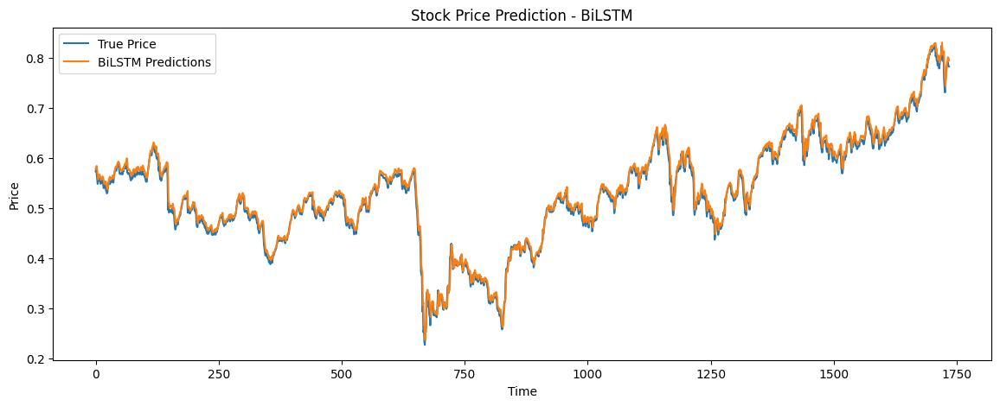

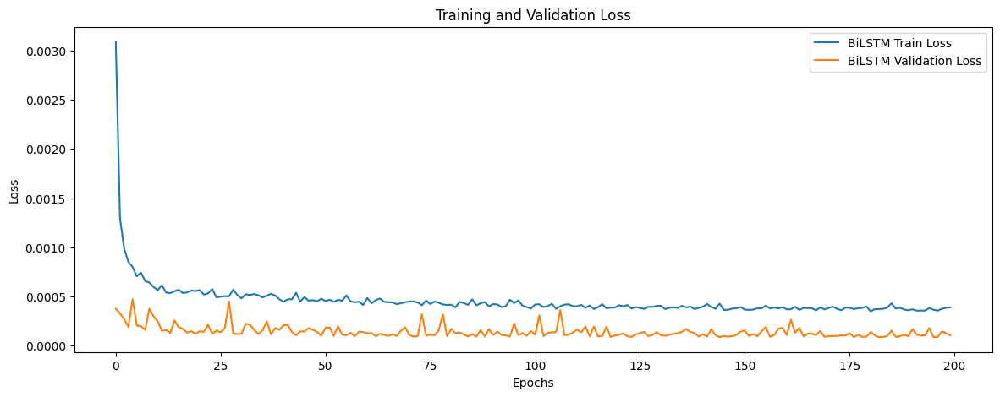

Raw BiLSTM Future Predictions (Before Inverse Transform):
[0.79817313 0.80741143 0.81695503 0.82614785 0.83465493 0.84181529
 0.84786409 0.85286111 0.85677767 0.86069846 0.86506361 0.86990255
 0.87546581 0.8816244  0.88736135 0.89262915 0.89751071 0.90197718
 0.90499669 0.90758783 0.91005331 0.9130469  0.91632152 0.91987824
 0.9233644  0.92672223 0.92972618 0.93224221 0.93443161 0.93646389]

BiLSTM Future Predictions (After Inverse Transform):
[33.9467139  34.29332654 34.65139358 34.99629992 35.31547749 35.58412784
 35.81107322 35.99855664 36.14550244 36.29260702 36.4563833  36.63793602
 36.8466644  37.07772906 37.29297405 37.49061704 37.67376872 37.84134673
 37.95463604 38.05185298 38.14435578 38.25667229 38.37953301 38.5129782
 38.6437756  38.76975821 38.88246384 38.97686303 39.05900723 39.13525651]


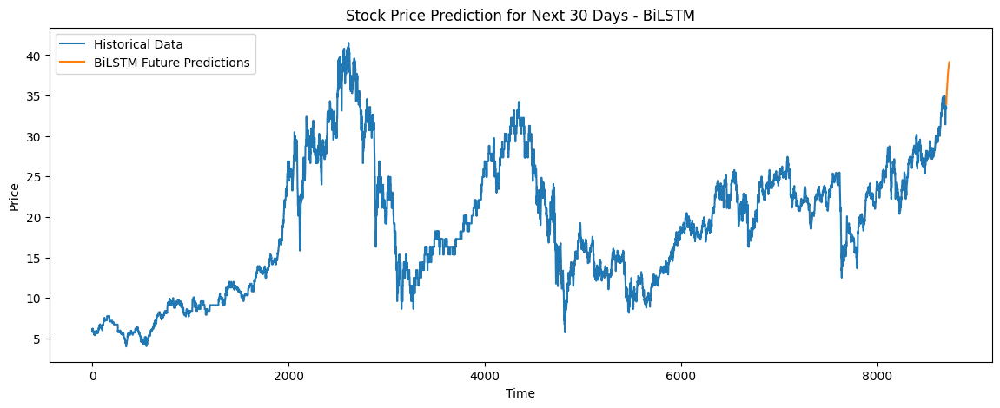

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Bidirectional, LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler

# Assume X_train, Y_train, X_test, Y_test are already defined and preprocessed

# Define BiLSTM model
def create_bilstm_model(input_shape=(30, 1), lstm_units=64, dropout_rate=0.2, lr=0.001):
    model = Sequential()
    model.add(Bidirectional(LSTM(units=lstm_units, return_sequences=True), input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(Bidirectional(LSTM(units=lstm_units, return_sequences=False)))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# Train the model
bilstm_model = create_bilstm_model(input_shape=(X_train.shape[1], 1))
bilstm_history = bilstm_model.fit(X_train, Y_train, batch_size=32, epochs=200, verbose=1, validation_split=0.2)

# Predictions
bilstm_predictions = bilstm_model.predict(X_test)

# Misalnya, kita fit scaler dengan data training
scaler = MinMaxScaler()
scaler.fit(Y_train.reshape(-1, 1))

# Inverse scaling
bilstm_predictions = scaler.inverse_transform(bilstm_predictions)
Y_test_unscaled = scaler.inverse_transform(Y_test.reshape(-1, 1))

# Calculate MAPE
bilstm_mape = mean_absolute_percentage_error(Y_test_unscaled, bilstm_predictions)
print(f'BiLSTM MAPE: {bilstm_mape:.4f}')

# Plot the results
plt.figure(figsize=(14, 5))
plt.plot(Y_test_unscaled, label='True Price')
plt.plot(bilstm_predictions, label='BiLSTM Predictions')
plt.title('Stock Price Prediction - BiLSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()


# Plot the training and validation loss for both models
plt.figure(figsize=(14, 5))
plt.plot(bilstm_history.history['loss'], label='BiLSTM Train Loss')
plt.plot(bilstm_history.history['val_loss'], label='BiLSTM Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Assume bilstm_model, data, and scaled_data are already defined and preprocessed
time_step = 30  # Sesuaikan dengan time step yang Anda gunakan

# Fit scaler dengan data asli (bukan data yang sudah discaled)
scaler = MinMaxScaler()
scaler.fit(data.reshape(-1, 1))  # Fit dengan data asli

# Fungsi untuk prediksi 30 hari ke depan
def predict_next_30_days(model, data, time_step):
    temp_input = data[-time_step:].reshape(1, -1)  # Ambil data terakhir sebanyak time_step dan reshape
    temp_input = list(temp_input[0])  # Ubah menjadi list
    lst_output = []
    n_steps = time_step
    i = 0
    while(i < 30):
        if len(temp_input) > n_steps:
            x_input = np.array(temp_input[-n_steps:])  # Ambil hanya n_steps terakhir dan ubah menjadi numpy array
            x_input = x_input.reshape(1, n_steps, 1)
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
        else:
            x_input = np.array(temp_input).reshape((1, n_steps, 1))  # Ubah list menjadi numpy array dan reshape
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
    return np.array(lst_output).reshape(-1, 1)

# Prediksi tanpa inverse transform
bilstm_future_predictions_raw = predict_next_30_days(bilstm_model, scaled_data, time_step)

# Print prediksi raw (sebelum inverse transform)
print("Raw BiLSTM Future Predictions (Before Inverse Transform):")
print(bilstm_future_predictions_raw.flatten())

# Lakukan inverse transform pada prediksi
bilstm_future_predictions = scaler.inverse_transform(bilstm_future_predictions_raw)

# Print prediksi setelah inverse transform
print("\nBiLSTM Future Predictions (After Inverse Transform):")
print(bilstm_future_predictions.flatten())

# Plot hasil prediksi
plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(data)), data, label='Historical Data')
plt.plot(np.arange(len(data), len(data) + 30), bilstm_future_predictions, label='BiLSTM Future Predictions')
plt.title('Stock Price Prediction for Next 30 Days - BiLSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 20s 143ms/step - loss: 0.0177 - val_loss: 4.5093e-04
Epoch 2/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.0016 - val_loss: 4.0280e-04
Epoch 3/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 22s 139ms/step - loss: 0.0014 - val_loss: 3.0485e-04
Epoch 4/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 12s 140ms/step - loss: 0.0011 - val_loss: 2.5567e-04
Epoch 5/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 20s 134ms/step - loss: 9.6346e-04 - val_loss: 4.5264e-04
Epoch 6/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 21s 139ms/step - loss: 9.3715e-04 - val_loss: 3.1482e-04
Epoch 7/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 20s 138ms/step - loss: 8.4984e-04 - val_loss: 4.7099e-04
Epoch 8/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 19s 117ms/step - loss: 9.4853e-04 - val_loss: 2.9265e-04
Epoch 9/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 7.9217e-04 - val_loss: 1.9454e-04
Epoch 10/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 12s 142ms/step - loss: 6.8660e-04 - val_loss: 1.9660e-04
Epoch 11/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 18s 118ms/step - loss: 7.3

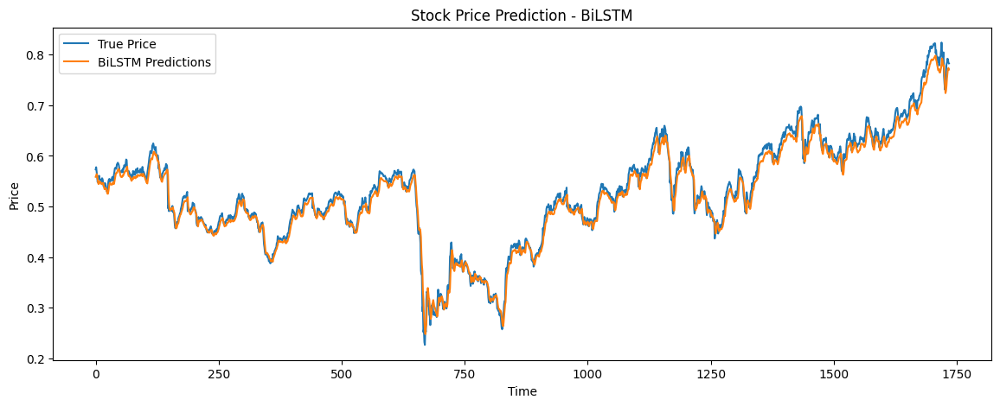

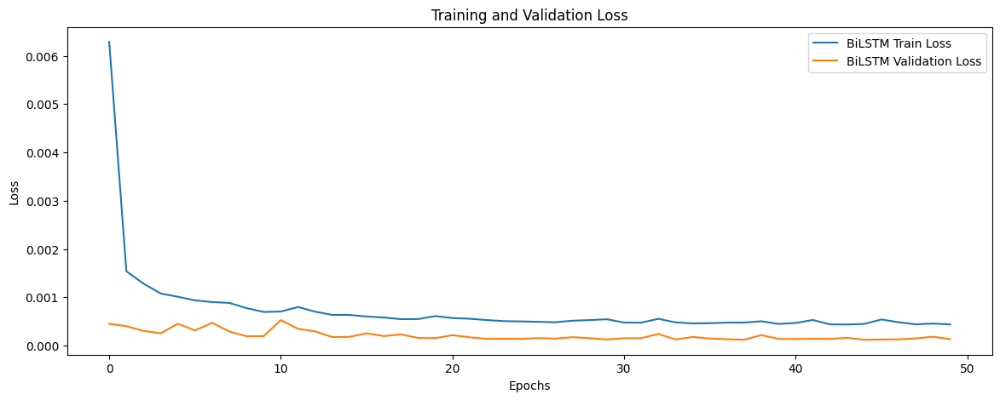

Raw BiLSTM Future Predictions (Before Inverse Transform):
[0.76694453 0.75627875 0.74507648 0.73376787 0.72307187 0.71313483
 0.70433855 0.69654375 0.68974018 0.68423826 0.67960781 0.67550725
 0.67170626 0.66766542 0.66287535 0.65763229 0.65185601 0.64535379
 0.63804728 0.63125086 0.62509906 0.61998391 0.61555392 0.61189407
 0.60876191 0.606161   0.60384327 0.60172564 0.5997507  0.59764981]

BiLSTM Future Predictions (After Inverse Transform):
[32.77504539 32.37487532 31.9545762  31.53028751 31.12898363 30.7561547
 30.42612654 30.13367289 29.8784091  29.67198188 29.49825178 29.34440248
 29.20179289 29.05018438 28.87046544 28.67375052 28.45702956 28.21307257
 27.93893878 27.68394335 27.45313362 27.26121783 27.09500845 26.95769444
 26.8401785  26.74259481 26.65563583 26.57618415 26.5020862  26.42326293]


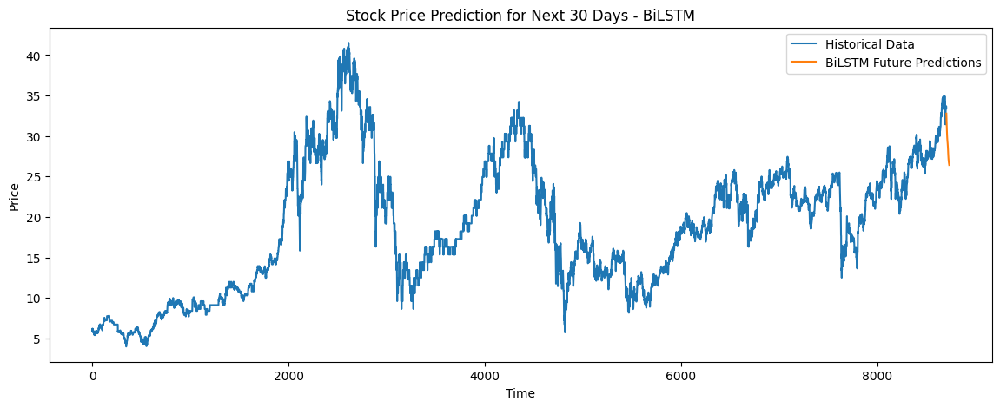

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Bidirectional, LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler

# Assume X_train, Y_train, X_test, Y_test are already defined and preprocessed

# Define BiLSTM model
def create_bilstm_model(input_shape=(30, 1), lstm_units=64, dropout_rate=0.2, lr=0.001):
    model = Sequential()
    model.add(Bidirectional(LSTM(units=lstm_units, return_sequences=True), input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(Bidirectional(LSTM(units=lstm_units, return_sequences=False)))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# Train the model
bilstm_model = create_bilstm_model(input_shape=(X_train.shape[1], 1))
bilstm_history = bilstm_model.fit(X_train, Y_train, batch_size=64, epochs=50, verbose=1, validation_split=0.2)

# Predictions
bilstm_predictions = bilstm_model.predict(X_test)

# Misalnya, kita fit scaler dengan data training
scaler = MinMaxScaler()
scaler.fit(Y_train.reshape(-1, 1))

# Inverse scaling
bilstm_predictions = scaler.inverse_transform(bilstm_predictions)
Y_test_unscaled = scaler.inverse_transform(Y_test.reshape(-1, 1))

# Calculate MAPE
bilstm_mape = mean_absolute_percentage_error(Y_test_unscaled, bilstm_predictions)
print(f'BiLSTM MAPE: {bilstm_mape:.4f}')

# Plot the results
plt.figure(figsize=(14, 5))
plt.plot(Y_test_unscaled, label='True Price')
plt.plot(bilstm_predictions, label='BiLSTM Predictions')
plt.title('Stock Price Prediction - BiLSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()


# Plot the training and validation loss for both models
plt.figure(figsize=(14, 5))
plt.plot(bilstm_history.history['loss'], label='BiLSTM Train Loss')
plt.plot(bilstm_history.history['val_loss'], label='BiLSTM Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Assume bilstm_model, data, and scaled_data are already defined and preprocessed
time_step = 30  # Sesuaikan dengan time step yang Anda gunakan

# Fit scaler dengan data asli (bukan data yang sudah discaled)
scaler = MinMaxScaler()
scaler.fit(data.reshape(-1, 1))  # Fit dengan data asli

# Fungsi untuk prediksi 30 hari ke depan
def predict_next_30_days(model, data, time_step):
    temp_input = data[-time_step:].reshape(1, -1)  # Ambil data terakhir sebanyak time_step dan reshape
    temp_input = list(temp_input[0])  # Ubah menjadi list
    lst_output = []
    n_steps = time_step
    i = 0
    while(i < 30):
        if len(temp_input) > n_steps:
            x_input = np.array(temp_input[-n_steps:])  # Ambil hanya n_steps terakhir dan ubah menjadi numpy array
            x_input = x_input.reshape(1, n_steps, 1)
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
        else:
            x_input = np.array(temp_input).reshape((1, n_steps, 1))  # Ubah list menjadi numpy array dan reshape
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
    return np.array(lst_output).reshape(-1, 1)

# Prediksi tanpa inverse transform
bilstm_future_predictions_raw = predict_next_30_days(bilstm_model, scaled_data, time_step)

# Print prediksi raw (sebelum inverse transform)
print("Raw BiLSTM Future Predictions (Before Inverse Transform):")
print(bilstm_future_predictions_raw.flatten())

# Lakukan inverse transform pada prediksi
bilstm_future_predictions = scaler.inverse_transform(bilstm_future_predictions_raw)

# Print prediksi setelah inverse transform
print("\nBiLSTM Future Predictions (After Inverse Transform):")
print(bilstm_future_predictions.flatten())

# Plot hasil prediksi
plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(data)), data, label='Historical Data')
plt.plot(np.arange(len(data), len(data) + 30), bilstm_future_predictions, label='BiLSTM Future Predictions')
plt.title('Stock Price Prediction for Next 30 Days - BiLSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()


Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


87/87 ━━━━━━━━━━━━━━━━━━━━ 20s 139ms/step - loss: 0.0214 - val_loss: 5.0332e-04
Epoch 2/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 21s 145ms/step - loss: 0.0016 - val_loss: 3.6750e-04
Epoch 3/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 12s 143ms/step - loss: 0.0013 - val_loss: 4.3386e-04
Epoch 4/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.0011 - val_loss: 2.4762e-04
Epoch 5/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 22s 144ms/step - loss: 9.7617e-04 - val_loss: 2.9092e-04
Epoch 6/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 19s 122ms/step - loss: 9.1959e-04 - val_loss: 3.3651e-04
Epoch 7/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 23s 147ms/step - loss: 9.5800e-04 - val_loss: 8.2727e-04
Epoch 8/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 13s 148ms/step - loss: 9.5851e-04 - val_loss: 4.1235e-04
Epoch 9/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 20s 143ms/step - loss: 8.9271e-04 - val_loss: 2.1985e-04
Epoch 10/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 20s 136ms/step - loss: 8.2962e-04 - val_loss: 1.8762e-04
Epoch 11/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 21s 148ms/step - loss: 7.15

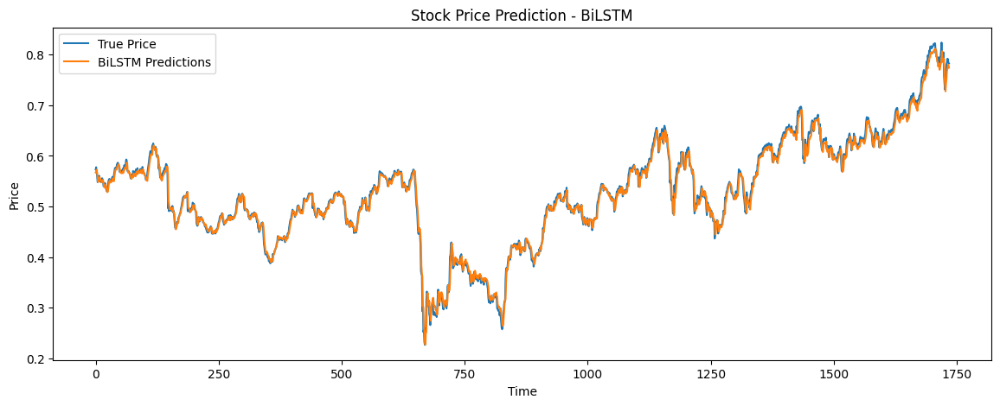

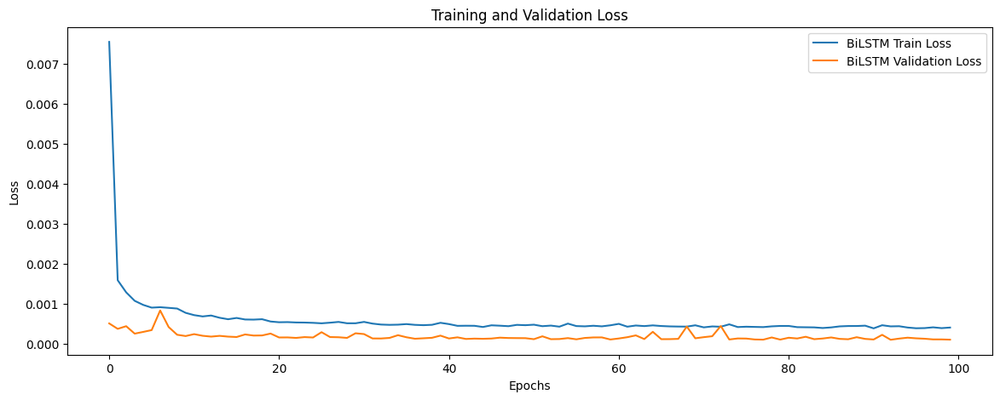

Raw BiLSTM Future Predictions (Before Inverse Transform):
[0.77622718 0.76696509 0.75909573 0.75165647 0.74485099 0.73859215
 0.73292613 0.72763526 0.72251368 0.71764857 0.71280771 0.7077601
 0.7024262  0.69659394 0.6899901  0.68288493 0.67547172 0.66773558
 0.65949845 0.65153128 0.64408082 0.63744384 0.63139302 0.62588024
 0.62069279 0.61579031 0.61101711 0.60633039 0.60179907 0.59737766]

BiLSTM Future Predictions (After Inverse Transform):
[33.12332185 32.77581692 32.48056564 32.20145159 31.94611623 31.7112901
 31.49870632 31.30019788 31.10804057 30.9255061  30.74388182 30.55449977
 30.35437672 30.13555586 29.88778595 29.62120643 29.34306964 29.05281652
 28.7437672  28.44484614 28.16531166 27.91629836 27.68927695 27.48244272
 27.28781429 27.10387766 26.92479159 26.74895041 26.57893929 26.41305193]


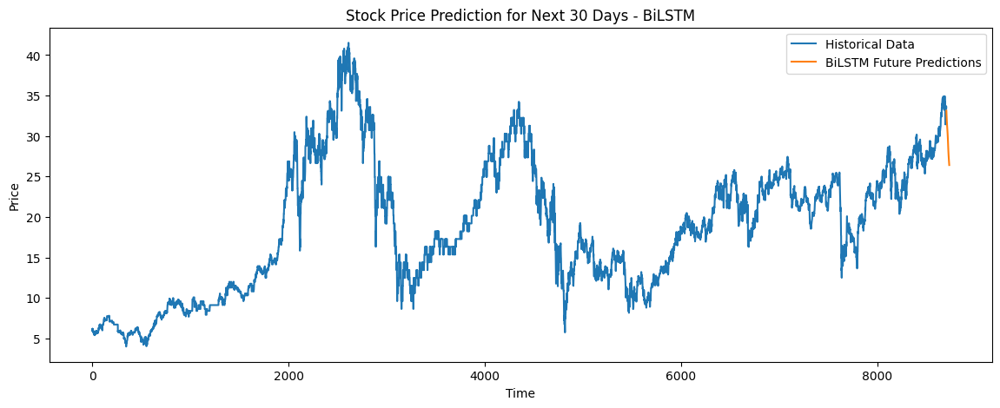

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Bidirectional, LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler

# Assume X_train, Y_train, X_test, Y_test are already defined and preprocessed

# Define BiLSTM model
def create_bilstm_model(input_shape=(30, 1), lstm_units=64, dropout_rate=0.2, lr=0.001):
    model = Sequential()
    model.add(Bidirectional(LSTM(units=lstm_units, return_sequences=True), input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(Bidirectional(LSTM(units=lstm_units, return_sequences=False)))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# Train the model
bilstm_model = create_bilstm_model(input_shape=(X_train.shape[1], 1))
bilstm_history = bilstm_model.fit(X_train, Y_train, batch_size=64, epochs=100, verbose=1, validation_split=0.2)

# Predictions
bilstm_predictions = bilstm_model.predict(X_test)

# Misalnya, kita fit scaler dengan data training
scaler = MinMaxScaler()
scaler.fit(Y_train.reshape(-1, 1))

# Inverse scaling
bilstm_predictions = scaler.inverse_transform(bilstm_predictions)
Y_test_unscaled = scaler.inverse_transform(Y_test.reshape(-1, 1))

# Calculate MAPE
bilstm_mape = mean_absolute_percentage_error(Y_test_unscaled, bilstm_predictions)
print(f'BiLSTM MAPE: {bilstm_mape:.4f}')

# Plot the results
plt.figure(figsize=(14, 5))
plt.plot(Y_test_unscaled, label='True Price')
plt.plot(bilstm_predictions, label='BiLSTM Predictions')
plt.title('Stock Price Prediction - BiLSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()


# Plot the training and validation loss for both models
plt.figure(figsize=(14, 5))
plt.plot(bilstm_history.history['loss'], label='BiLSTM Train Loss')
plt.plot(bilstm_history.history['val_loss'], label='BiLSTM Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Assume bilstm_model, data, and scaled_data are already defined and preprocessed
time_step = 30  # Sesuaikan dengan time step yang Anda gunakan

# Fit scaler dengan data asli (bukan data yang sudah discaled)
scaler = MinMaxScaler()
scaler.fit(data.reshape(-1, 1))  # Fit dengan data asli

# Fungsi untuk prediksi 30 hari ke depan
def predict_next_30_days(model, data, time_step):
    temp_input = data[-time_step:].reshape(1, -1)  # Ambil data terakhir sebanyak time_step dan reshape
    temp_input = list(temp_input[0])  # Ubah menjadi list
    lst_output = []
    n_steps = time_step
    i = 0
    while(i < 30):
        if len(temp_input) > n_steps:
            x_input = np.array(temp_input[-n_steps:])  # Ambil hanya n_steps terakhir dan ubah menjadi numpy array
            x_input = x_input.reshape(1, n_steps, 1)
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
        else:
            x_input = np.array(temp_input).reshape((1, n_steps, 1))  # Ubah list menjadi numpy array dan reshape
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
    return np.array(lst_output).reshape(-1, 1)

# Prediksi tanpa inverse transform
bilstm_future_predictions_raw = predict_next_30_days(bilstm_model, scaled_data, time_step)

# Print prediksi raw (sebelum inverse transform)
print("Raw BiLSTM Future Predictions (Before Inverse Transform):")
print(bilstm_future_predictions_raw.flatten())

# Lakukan inverse transform pada prediksi
bilstm_future_predictions = scaler.inverse_transform(bilstm_future_predictions_raw)

# Print prediksi setelah inverse transform
print("\nBiLSTM Future Predictions (After Inverse Transform):")
print(bilstm_future_predictions.flatten())

# Plot hasil prediksi
plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(data)), data, label='Historical Data')
plt.plot(np.arange(len(data), len(data) + 30), bilstm_future_predictions, label='BiLSTM Future Predictions')
plt.title('Stock Price Prediction for Next 30 Days - BiLSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 20s 152ms/step - loss: 0.0190 - val_loss: 4.3443e-04
Epoch 2/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 12s 135ms/step - loss: 0.0016 - val_loss: 3.5681e-04
Epoch 3/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 21s 142ms/step - loss: 0.0014 - val_loss: 3.1617e-04
Epoch 4/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 19s 127ms/step - loss: 0.0011 - val_loss: 6.4515e-04
Epoch 5/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 22s 142ms/step - loss: 0.0012 - val_loss: 2.4010e-04
Epoch 6/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 9.5275e-04 - val_loss: 2.6006e-04
Epoch 7/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 22s 148ms/step - loss: 8.6101e-04 - val_loss: 4.3934e-04
Epoch 8/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 8.6120e-04 - val_loss: 2.7644e-04
Epoch 9/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 22s 147ms/step - loss: 8.6920e-04 - val_loss: 5.5955e-04
Epoch 10/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 18s 115ms/step - loss: 7.2323e-04 - val_loss: 3.0091e-04
Epoch 11/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 12s 141ms/step - lo

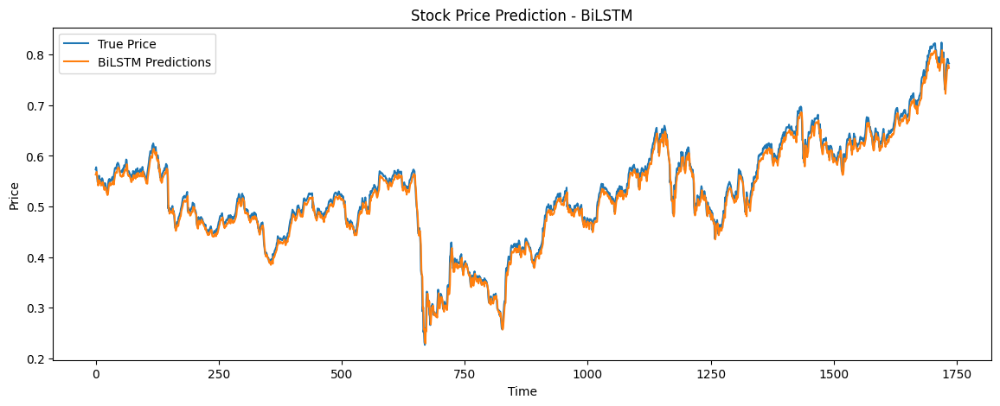

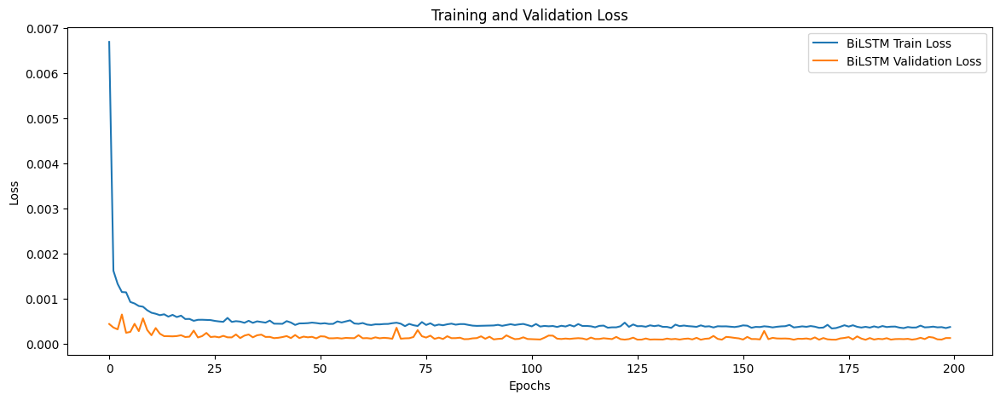

Raw BiLSTM Future Predictions (Before Inverse Transform):
[0.77709568 0.76685131 0.7577244  0.74835944 0.73910403 0.72973287
 0.7205894  0.71140373 0.70180261 0.69259119 0.68393016 0.67583966
 0.66873217 0.66248453 0.65616918 0.6501652  0.64466095 0.63900876
 0.63144028 0.62313712 0.61455333 0.60672283 0.59940219 0.59274769
 0.5864346  0.58054733 0.57484567 0.56930149 0.56423414 0.55969322]

BiLSTM Future Predictions (After Inverse Transform):
[33.15590715 32.7715478  32.42911482 32.07775001 31.73049554 31.37889816
 31.03584348 30.6912055  30.33098042 29.98537636 29.66042239 29.35687439
 29.09020765 28.85580194 28.61885578 28.39359211 28.18707768 27.97501272
 27.69105034 27.37952319 27.05746748 26.76367428 26.48901049 26.23933972
 26.00247853 25.78159356 25.56767247 25.35965971 25.16953744 24.99916627]


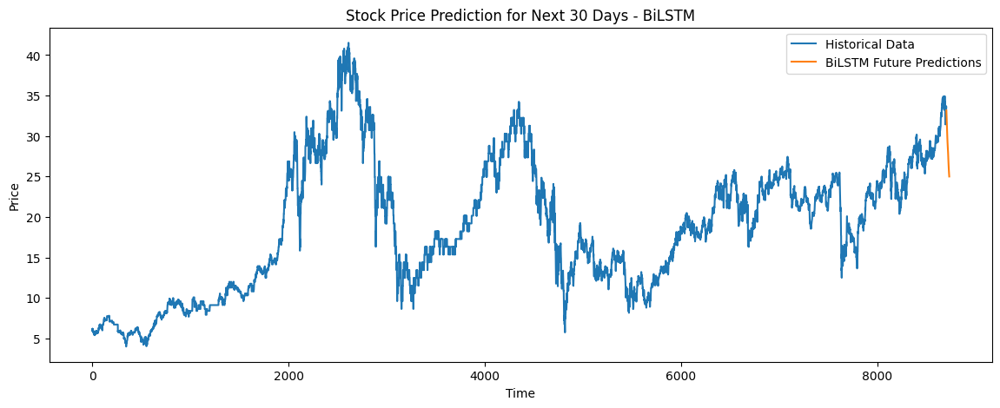

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Bidirectional, LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler

# Assume X_train, Y_train, X_test, Y_test are already defined and preprocessed

# Define BiLSTM model
def create_bilstm_model(input_shape=(30, 1), lstm_units=64, dropout_rate=0.2, lr=0.001):
    model = Sequential()
    model.add(Bidirectional(LSTM(units=lstm_units, return_sequences=True), input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(Bidirectional(LSTM(units=lstm_units, return_sequences=False)))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# Train the model
bilstm_model = create_bilstm_model(input_shape=(X_train.shape[1], 1))
bilstm_history = bilstm_model.fit(X_train, Y_train, batch_size=64, epochs=200, verbose=1, validation_split=0.2)

# Predictions
bilstm_predictions = bilstm_model.predict(X_test)

# Misalnya, kita fit scaler dengan data training
scaler = MinMaxScaler()
scaler.fit(Y_train.reshape(-1, 1))

# Inverse scaling
bilstm_predictions = scaler.inverse_transform(bilstm_predictions)
Y_test_unscaled = scaler.inverse_transform(Y_test.reshape(-1, 1))

# Calculate MAPE
bilstm_mape = mean_absolute_percentage_error(Y_test_unscaled, bilstm_predictions)
print(f'BiLSTM MAPE: {bilstm_mape:.4f}')

# Plot the results
plt.figure(figsize=(14, 5))
plt.plot(Y_test_unscaled, label='True Price')
plt.plot(bilstm_predictions, label='BiLSTM Predictions')
plt.title('Stock Price Prediction - BiLSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()


# Plot the training and validation loss for both models
plt.figure(figsize=(14, 5))
plt.plot(bilstm_history.history['loss'], label='BiLSTM Train Loss')
plt.plot(bilstm_history.history['val_loss'], label='BiLSTM Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Assume bilstm_model, data, and scaled_data are already defined and preprocessed
time_step = 30  # Sesuaikan dengan time step yang Anda gunakan

# Fit scaler dengan data asli (bukan data yang sudah discaled)
scaler = MinMaxScaler()
scaler.fit(data.reshape(-1, 1))  # Fit dengan data asli

# Fungsi untuk prediksi 30 hari ke depan
def predict_next_30_days(model, data, time_step):
    temp_input = data[-time_step:].reshape(1, -1)  # Ambil data terakhir sebanyak time_step dan reshape
    temp_input = list(temp_input[0])  # Ubah menjadi list
    lst_output = []
    n_steps = time_step
    i = 0
    while(i < 30):
        if len(temp_input) > n_steps:
            x_input = np.array(temp_input[-n_steps:])  # Ambil hanya n_steps terakhir dan ubah menjadi numpy array
            x_input = x_input.reshape(1, n_steps, 1)
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
        else:
            x_input = np.array(temp_input).reshape((1, n_steps, 1))  # Ubah list menjadi numpy array dan reshape
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
    return np.array(lst_output).reshape(-1, 1)

# Prediksi tanpa inverse transform
bilstm_future_predictions_raw = predict_next_30_days(bilstm_model, scaled_data, time_step)

# Print prediksi raw (sebelum inverse transform)
print("Raw BiLSTM Future Predictions (Before Inverse Transform):")
print(bilstm_future_predictions_raw.flatten())

# Lakukan inverse transform pada prediksi
bilstm_future_predictions = scaler.inverse_transform(bilstm_future_predictions_raw)

# Print prediksi setelah inverse transform
print("\nBiLSTM Future Predictions (After Inverse Transform):")
print(bilstm_future_predictions.flatten())

# Plot hasil prediksi
plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(data)), data, label='Historical Data')
plt.plot(np.arange(len(data), len(data) + 30), bilstm_future_predictions, label='BiLSTM Future Predictions')
plt.title('Stock Price Prediction for Next 30 Days - BiLSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.0124 - val_loss: 3.9530e-04
Epoch 2/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.0028 - val_loss: 6.3872e-04
Epoch 3/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.0020 - val_loss: 3.5562e-04
Epoch 4/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.0016 - val_loss: 2.9231e-04
Epoch 5/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.0014 - val_loss: 2.3575e-04
Epoch 6/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step - loss: 0.0013 - val_loss: 5.3526e-04
Epoch 7/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.0015 - val_loss: 4.8488e-04
Epoch 8/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.0014 - val_loss: 2.3788e-04
Epoch 9/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step - loss: 0.0012 - val_loss: 2.7154e-04
Epoch 10/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.0013 - val_loss: 2.2198e-04
Epoch 11/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step - loss: 0.0012 - val_los

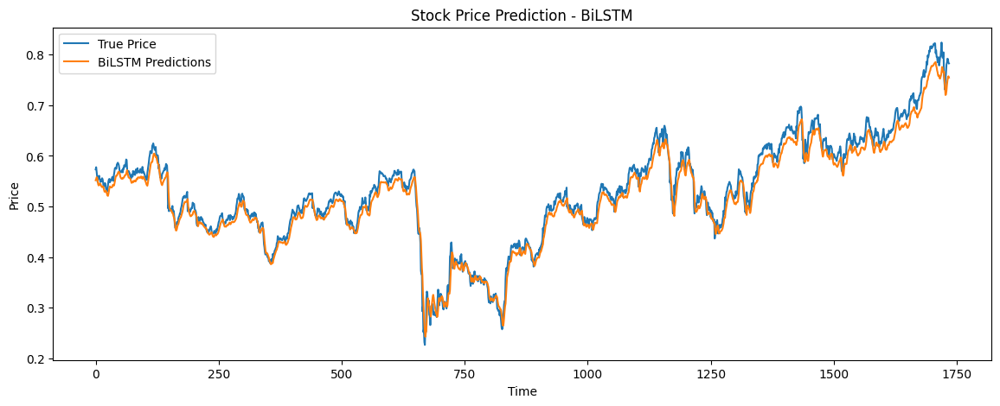

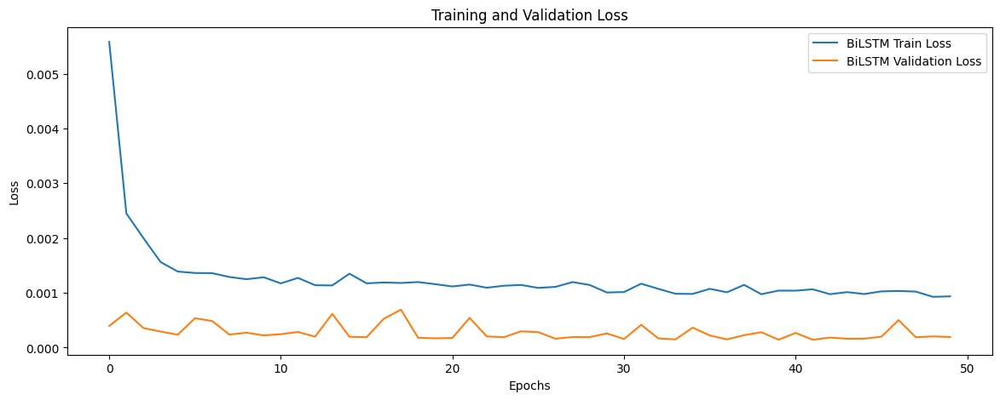

Raw BiLSTM Future Predictions (Before Inverse Transform):
[0.75229681 0.73936969 0.72587055 0.71316856 0.70185012 0.69176853
 0.68273413 0.67422873 0.66586483 0.65753514 0.64883333 0.63957953
 0.62981051 0.61945683 0.60851049 0.59753942 0.58681393 0.57641858
 0.56633496 0.55750048 0.5497973  0.54334152 0.53764248 0.53262389
 0.527951   0.52355933 0.51921546 0.51489544 0.5106585  0.50640339]

BiLSTM Future Predictions (After Inverse Transform):
[32.22547628 31.74046278 31.2339874  30.75742045 30.33276277 29.95451078
 29.61554856 29.2964336  28.98262765 28.67010533 28.34362173 27.99642764
 27.62990288 27.24144213 26.83074574 26.41912128 26.01671042 25.62668649
 25.24835848 24.91689684 24.6278804  24.38566549 24.17184279 23.98354983
 23.80822747 23.64345603 23.48047811 23.31839472 23.15942874 22.99978069]


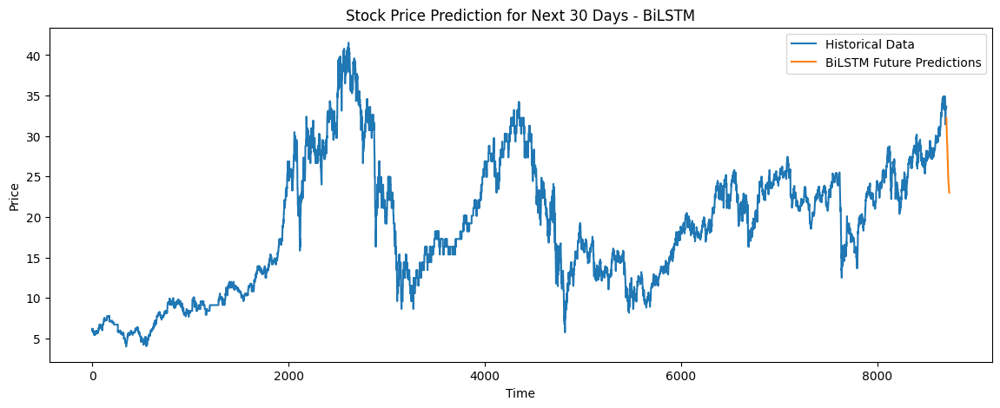

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Bidirectional, LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler

# Assume X_train, Y_train, X_test, Y_test are already defined and preprocessed

# Define BiLSTM model
def create_bilstm_model(input_shape=(30, 1), lstm_units=64, dropout_rate=0.5, lr=0.001):
    model = Sequential()
    model.add(Bidirectional(LSTM(units=lstm_units, return_sequences=True), input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(Bidirectional(LSTM(units=lstm_units, return_sequences=False)))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# Train the model
bilstm_model = create_bilstm_model(input_shape=(X_train.shape[1], 1))
bilstm_history = bilstm_model.fit(X_train, Y_train, batch_size=32, epochs=50, verbose=1, validation_split=0.2)

# Predictions
bilstm_predictions = bilstm_model.predict(X_test)

# Misalnya, kita fit scaler dengan data training
scaler = MinMaxScaler()
scaler.fit(Y_train.reshape(-1, 1))

# Inverse scaling
bilstm_predictions = scaler.inverse_transform(bilstm_predictions)
Y_test_unscaled = scaler.inverse_transform(Y_test.reshape(-1, 1))

# Calculate MAPE
bilstm_mape = mean_absolute_percentage_error(Y_test_unscaled, bilstm_predictions)
print(f'BiLSTM MAPE: {bilstm_mape:.4f}')

# Plot the results
plt.figure(figsize=(14, 5))
plt.plot(Y_test_unscaled, label='True Price')
plt.plot(bilstm_predictions, label='BiLSTM Predictions')
plt.title('Stock Price Prediction - BiLSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()


# Plot the training and validation loss for both models
plt.figure(figsize=(14, 5))
plt.plot(bilstm_history.history['loss'], label='BiLSTM Train Loss')
plt.plot(bilstm_history.history['val_loss'], label='BiLSTM Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Assume bilstm_model, data, and scaled_data are already defined and preprocessed
time_step = 30  # Sesuaikan dengan time step yang Anda gunakan

# Fit scaler dengan data asli (bukan data yang sudah discaled)
scaler = MinMaxScaler()
scaler.fit(data.reshape(-1, 1))  # Fit dengan data asli

# Fungsi untuk prediksi 30 hari ke depan
def predict_next_30_days(model, data, time_step):
    temp_input = data[-time_step:].reshape(1, -1)  # Ambil data terakhir sebanyak time_step dan reshape
    temp_input = list(temp_input[0])  # Ubah menjadi list
    lst_output = []
    n_steps = time_step
    i = 0
    while(i < 30):
        if len(temp_input) > n_steps:
            x_input = np.array(temp_input[-n_steps:])  # Ambil hanya n_steps terakhir dan ubah menjadi numpy array
            x_input = x_input.reshape(1, n_steps, 1)
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
        else:
            x_input = np.array(temp_input).reshape((1, n_steps, 1))  # Ubah list menjadi numpy array dan reshape
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
    return np.array(lst_output).reshape(-1, 1)

# Prediksi tanpa inverse transform
bilstm_future_predictions_raw = predict_next_30_days(bilstm_model, scaled_data, time_step)

# Print prediksi raw (sebelum inverse transform)
print("Raw BiLSTM Future Predictions (Before Inverse Transform):")
print(bilstm_future_predictions_raw.flatten())

# Lakukan inverse transform pada prediksi
bilstm_future_predictions = scaler.inverse_transform(bilstm_future_predictions_raw)

# Print prediksi setelah inverse transform
print("\nBiLSTM Future Predictions (After Inverse Transform):")
print(bilstm_future_predictions.flatten())

# Plot hasil prediksi
plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(data)), data, label='Historical Data')
plt.plot(np.arange(len(data), len(data) + 30), bilstm_future_predictions, label='BiLSTM Future Predictions')
plt.title('Stock Price Prediction for Next 30 Days - BiLSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()


Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


174/174 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - loss: 0.0236 - val_loss: 5.8748e-04
Epoch 2/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0028 - val_loss: 3.8727e-04
Epoch 3/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.0021 - val_loss: 4.2265e-04
Epoch 4/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0016 - val_loss: 5.9096e-04
Epoch 5/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.0016 - val_loss: 3.1486e-04
Epoch 6/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.0016 - val_loss: 3.7897e-04
Epoch 7/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.0013 - val_loss: 2.5842e-04
Epoch 8/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step - loss: 0.0014 - val_loss: 4.8320e-04
Epoch 9/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.0013 - val_loss: 2.4963e-04
Epoch 10/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.0012 - val_loss: 2.0329e-04
Epoch 11/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.0012 - val_loss

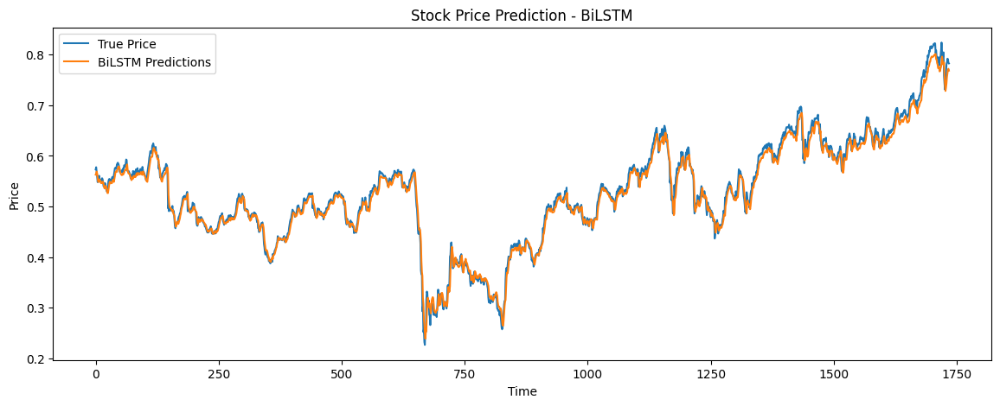

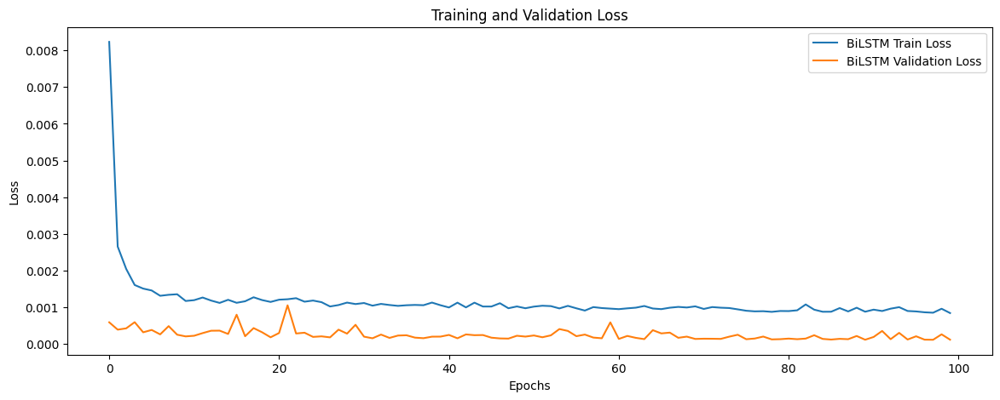

Raw BiLSTM Future Predictions (Before Inverse Transform):
[0.76958793 0.76023644 0.75253701 0.74561846 0.73899293 0.73202676
 0.72462767 0.71623421 0.7068153  0.69730073 0.68798059 0.67941624
 0.67229968 0.6665414  0.66148317 0.65704143 0.652233   0.64589471
 0.63735378 0.62858081 0.6200586  0.61258256 0.60571402 0.59967345
 0.59421855 0.58950543 0.58525914 0.58137071 0.57773715 0.57395774]

BiLSTM Future Predictions (After Inverse Transform):
[32.87422357 32.52336417 32.23448862 31.97491098 31.72632706 31.46496261
 31.18735583 30.87244067 30.519052   30.16207404 29.81239094 29.49106427
 29.22405761 29.00801202 28.81823191 28.65158196 28.47117423 28.23336709
 27.91291929 27.58376553 27.26401993 26.98352608 26.72582471 26.49918794
 26.29452518 26.11769331 25.95837623 25.81248597 25.67615818 25.53435813]


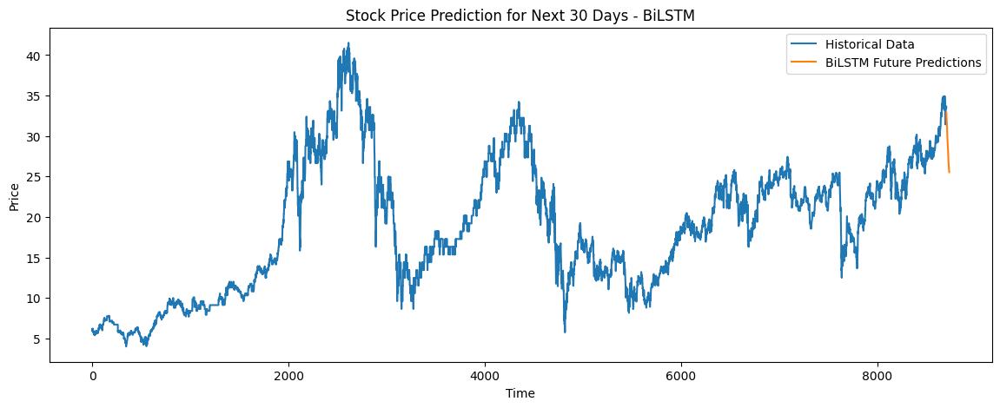

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Bidirectional, LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler

# Assume X_train, Y_train, X_test, Y_test are already defined and preprocessed

# Define BiLSTM model
def create_bilstm_model(input_shape=(30, 1), lstm_units=64, dropout_rate=0.5, lr=0.001):
    model = Sequential()
    model.add(Bidirectional(LSTM(units=lstm_units, return_sequences=True), input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(Bidirectional(LSTM(units=lstm_units, return_sequences=False)))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# Train the model
bilstm_model = create_bilstm_model(input_shape=(X_train.shape[1], 1))
bilstm_history = bilstm_model.fit(X_train, Y_train, batch_size=32, epochs=100, verbose=1, validation_split=0.2)

# Predictions
bilstm_predictions = bilstm_model.predict(X_test)

# Misalnya, kita fit scaler dengan data training
scaler = MinMaxScaler()
scaler.fit(Y_train.reshape(-1, 1))

# Inverse scaling
bilstm_predictions = scaler.inverse_transform(bilstm_predictions)
Y_test_unscaled = scaler.inverse_transform(Y_test.reshape(-1, 1))

# Calculate MAPE
bilstm_mape = mean_absolute_percentage_error(Y_test_unscaled, bilstm_predictions)
print(f'BiLSTM MAPE: {bilstm_mape:.4f}')

# Plot the results
plt.figure(figsize=(14, 5))
plt.plot(Y_test_unscaled, label='True Price')
plt.plot(bilstm_predictions, label='BiLSTM Predictions')
plt.title('Stock Price Prediction - BiLSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()


# Plot the training and validation loss for both models
plt.figure(figsize=(14, 5))
plt.plot(bilstm_history.history['loss'], label='BiLSTM Train Loss')
plt.plot(bilstm_history.history['val_loss'], label='BiLSTM Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Assume bilstm_model, data, and scaled_data are already defined and preprocessed
time_step = 30  # Sesuaikan dengan time step yang Anda gunakan

# Fit scaler dengan data asli (bukan data yang sudah discaled)
scaler = MinMaxScaler()
scaler.fit(data.reshape(-1, 1))  # Fit dengan data asli

# Fungsi untuk prediksi 30 hari ke depan
def predict_next_30_days(model, data, time_step):
    temp_input = data[-time_step:].reshape(1, -1)  # Ambil data terakhir sebanyak time_step dan reshape
    temp_input = list(temp_input[0])  # Ubah menjadi list
    lst_output = []
    n_steps = time_step
    i = 0
    while(i < 30):
        if len(temp_input) > n_steps:
            x_input = np.array(temp_input[-n_steps:])  # Ambil hanya n_steps terakhir dan ubah menjadi numpy array
            x_input = x_input.reshape(1, n_steps, 1)
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
        else:
            x_input = np.array(temp_input).reshape((1, n_steps, 1))  # Ubah list menjadi numpy array dan reshape
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
    return np.array(lst_output).reshape(-1, 1)

# Prediksi tanpa inverse transform
bilstm_future_predictions_raw = predict_next_30_days(bilstm_model, scaled_data, time_step)

# Print prediksi raw (sebelum inverse transform)
print("Raw BiLSTM Future Predictions (Before Inverse Transform):")
print(bilstm_future_predictions_raw.flatten())

# Lakukan inverse transform pada prediksi
bilstm_future_predictions = scaler.inverse_transform(bilstm_future_predictions_raw)

# Print prediksi setelah inverse transform
print("\nBiLSTM Future Predictions (After Inverse Transform):")
print(bilstm_future_predictions.flatten())

# Plot hasil prediksi
plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(data)), data, label='Historical Data')
plt.plot(np.arange(len(data), len(data) + 30), bilstm_future_predictions, label='BiLSTM Future Predictions')
plt.title('Stock Price Prediction for Next 30 Days - BiLSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()


Epoch 1/200


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


174/174 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - loss: 0.0180 - val_loss: 7.2832e-04
Epoch 2/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 18s 62ms/step - loss: 0.0027 - val_loss: 3.6235e-04
Epoch 3/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.0021 - val_loss: 3.5382e-04
Epoch 4/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.0017 - val_loss: 2.7173e-04
Epoch 5/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.0015 - val_loss: 2.4073e-04
Epoch 6/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.0015 - val_loss: 4.3209e-04
Epoch 7/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step - loss: 0.0013 - val_loss: 2.9728e-04
Epoch 8/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.0013 - val_loss: 2.5967e-04
Epoch 9/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 19s 63ms/step - loss: 0.0013 - val_loss: 2.0516e-04
Epoch 10/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.0012 - val_loss: 2.3896e-04
Epoch 11/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.0012 - val_loss

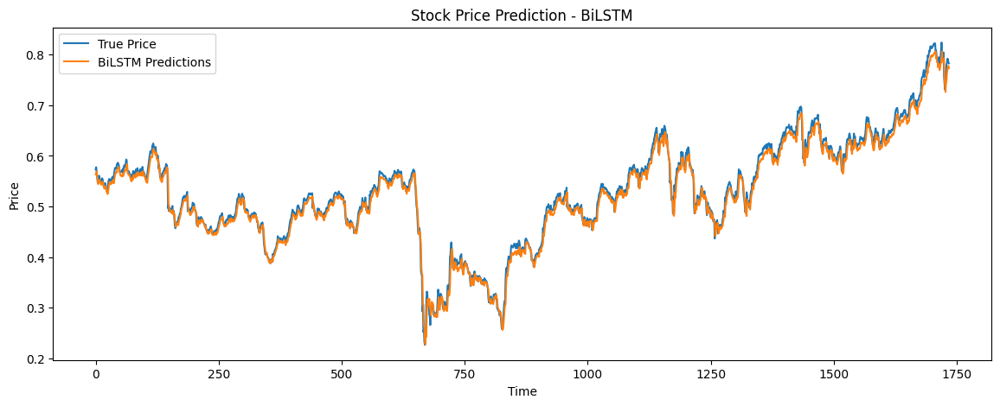

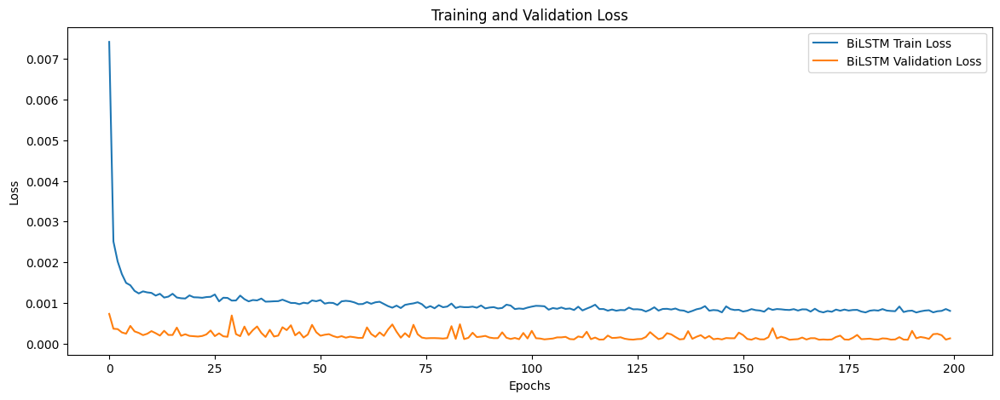

Raw BiLSTM Future Predictions (Before Inverse Transform):
[0.77607524 0.76614201 0.75822544 0.7501846  0.74204493 0.73327166
 0.72432464 0.71496606 0.70571405 0.69705862 0.68924165 0.68230093
 0.67631966 0.67094517 0.66564023 0.66046512 0.6552285  0.64926231
 0.64198881 0.63441002 0.6270225  0.62033159 0.61410558 0.60832942
 0.60279453 0.59751511 0.59236509 0.58738577 0.58277035 0.57847166]

BiLSTM Future Predictions (After Inverse Transform):
[33.11762149 32.74493569 32.44791325 32.14622811 31.84083516 31.51167021
 31.17598642 30.8248609  30.4777339  30.15299015 29.85970459 29.59929505
 29.37488341 29.17323743 28.97420122 28.7800357  28.58356231 28.35971646
 28.08682159 27.80247233 27.5252994  27.27426224 27.04066831 26.82395182
 26.61628793 26.41820886 26.22498483 26.03816559 25.86499904 25.70371625]


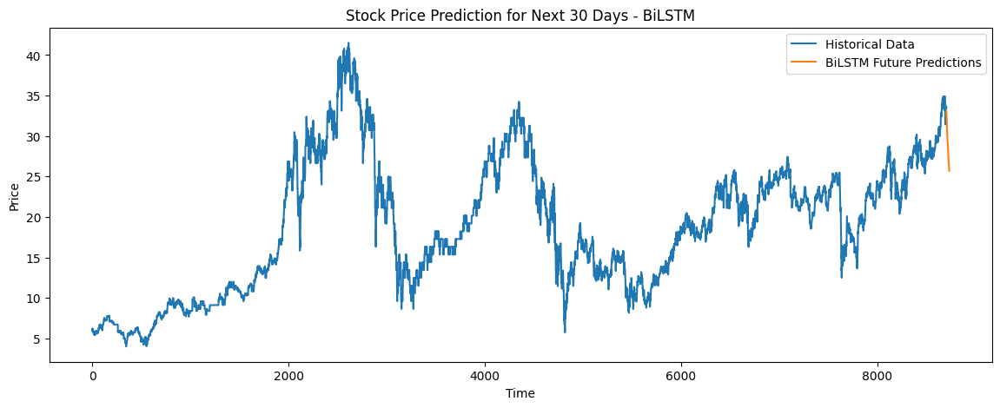

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Bidirectional, LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler

# Assume X_train, Y_train, X_test, Y_test are already defined and preprocessed

# Define BiLSTM model
def create_bilstm_model(input_shape=(30, 1), lstm_units=64, dropout_rate=0.5, lr=0.001):
    model = Sequential()
    model.add(Bidirectional(LSTM(units=lstm_units, return_sequences=True), input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(Bidirectional(LSTM(units=lstm_units, return_sequences=False)))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# Train the model
bilstm_model = create_bilstm_model(input_shape=(X_train.shape[1], 1))
bilstm_history = bilstm_model.fit(X_train, Y_train, batch_size=32, epochs=200, verbose=1, validation_split=0.2)

# Predictions
bilstm_predictions = bilstm_model.predict(X_test)

# Misalnya, kita fit scaler dengan data training
scaler = MinMaxScaler()
scaler.fit(Y_train.reshape(-1, 1))

# Inverse scaling
bilstm_predictions = scaler.inverse_transform(bilstm_predictions)
Y_test_unscaled = scaler.inverse_transform(Y_test.reshape(-1, 1))

# Calculate MAPE
bilstm_mape = mean_absolute_percentage_error(Y_test_unscaled, bilstm_predictions)
print(f'BiLSTM MAPE: {bilstm_mape:.4f}')

# Plot the results
plt.figure(figsize=(14, 5))
plt.plot(Y_test_unscaled, label='True Price')
plt.plot(bilstm_predictions, label='BiLSTM Predictions')
plt.title('Stock Price Prediction - BiLSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()


# Plot the training and validation loss for both models
plt.figure(figsize=(14, 5))
plt.plot(bilstm_history.history['loss'], label='BiLSTM Train Loss')
plt.plot(bilstm_history.history['val_loss'], label='BiLSTM Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Assume bilstm_model, data, and scaled_data are already defined and preprocessed
time_step = 30  # Sesuaikan dengan time step yang Anda gunakan

# Fit scaler dengan data asli (bukan data yang sudah discaled)
scaler = MinMaxScaler()
scaler.fit(data.reshape(-1, 1))  # Fit dengan data asli

# Fungsi untuk prediksi 30 hari ke depan
def predict_next_30_days(model, data, time_step):
    temp_input = data[-time_step:].reshape(1, -1)  # Ambil data terakhir sebanyak time_step dan reshape
    temp_input = list(temp_input[0])  # Ubah menjadi list
    lst_output = []
    n_steps = time_step
    i = 0
    while(i < 30):
        if len(temp_input) > n_steps:
            x_input = np.array(temp_input[-n_steps:])  # Ambil hanya n_steps terakhir dan ubah menjadi numpy array
            x_input = x_input.reshape(1, n_steps, 1)
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
        else:
            x_input = np.array(temp_input).reshape((1, n_steps, 1))  # Ubah list menjadi numpy array dan reshape
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
    return np.array(lst_output).reshape(-1, 1)

# Prediksi tanpa inverse transform
bilstm_future_predictions_raw = predict_next_30_days(bilstm_model, scaled_data, time_step)

# Print prediksi raw (sebelum inverse transform)
print("Raw BiLSTM Future Predictions (Before Inverse Transform):")
print(bilstm_future_predictions_raw.flatten())

# Lakukan inverse transform pada prediksi
bilstm_future_predictions = scaler.inverse_transform(bilstm_future_predictions_raw)

# Print prediksi setelah inverse transform
print("\nBiLSTM Future Predictions (After Inverse Transform):")
print(bilstm_future_predictions.flatten())

# Plot hasil prediksi
plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(data)), data, label='Historical Data')
plt.plot(np.arange(len(data), len(data) + 30), bilstm_future_predictions, label='BiLSTM Future Predictions')
plt.title('Stock Price Prediction for Next 30 Days - BiLSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.0227 - val_loss: 4.6188e-04
Epoch 2/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.0032 - val_loss: 4.4306e-04
Epoch 3/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.0024 - val_loss: 6.1680e-04
Epoch 4/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 9s 108ms/step - loss: 0.0022 - val_loss: 3.3049e-04
Epoch 5/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.0018 - val_loss: 3.0440e-04
Epoch 6/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.0017 - val_loss: 2.6193e-04
Epoch 7/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 10s 110ms/step - loss: 0.0015 - val_loss: 3.4225e-04
Epoch 8/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.0014 - val_loss: 2.5115e-04
Epoch 9/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.0014 - val_loss: 2.8215e-04
Epoch 10/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 19s 106ms/step - loss: 0.0012 - val_loss: 2.2886e-04
Epoch 11/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 10s 105ms/step - loss: 0.0012 - val_loss: 2.3918e-04
Ep

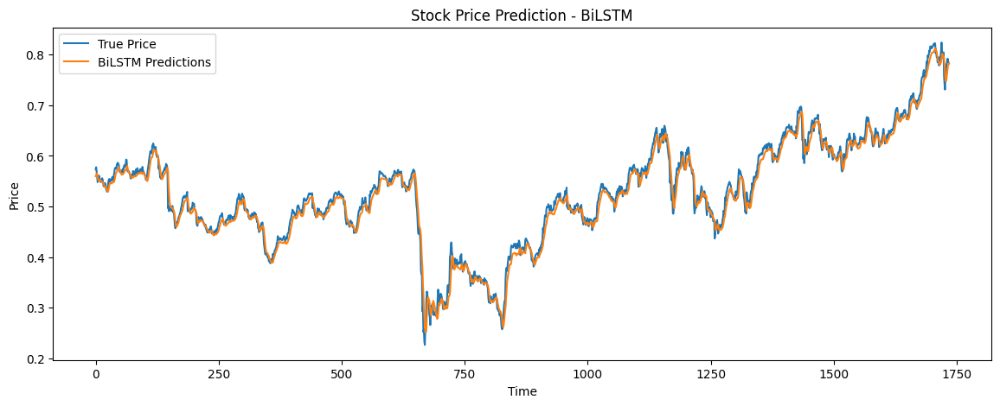

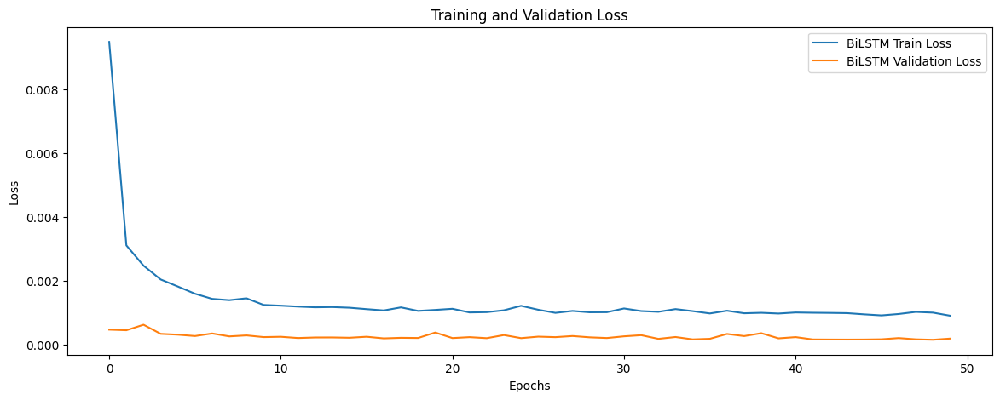

Raw BiLSTM Future Predictions (Before Inverse Transform):
[0.78057677 0.77782035 0.77504009 0.77210689 0.76950878 0.76717526
 0.76538104 0.76386803 0.7626338  0.7620402  0.76164609 0.76123405
 0.76074588 0.75979066 0.75806075 0.75606877 0.75376964 0.75095445
 0.74754745 0.7448405  0.74266487 0.74119377 0.73988026 0.73878062
 0.73764473 0.73654962 0.73533112 0.73405826 0.73283499 0.73154622]

BiLSTM Future Predictions (After Inverse Transform):
[33.28651445 33.18309622 33.07878347 32.96873234 32.87125375 32.78370215
 32.7163847  32.65961816 32.61331086 32.59103943 32.57625294 32.56079332
 32.54247793 32.5066388  32.44173432 32.36699679 32.28073554 32.17511231
 32.04728474 31.94572264 31.86409503 31.80890063 31.75961903 31.71836131
 31.67574392 31.63465617 31.58893925 31.54118282 31.49528699 31.44693347]


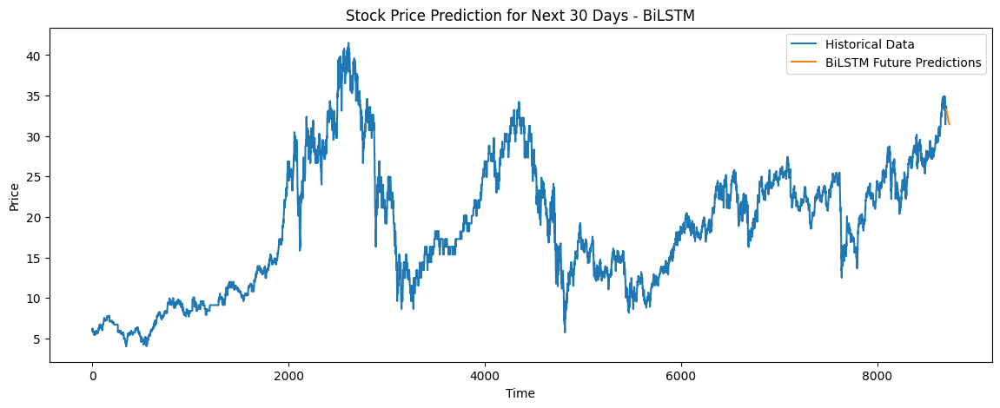

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Bidirectional, LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler

# Assume X_train, Y_train, X_test, Y_test are already defined and preprocessed

# Define BiLSTM model
def create_bilstm_model(input_shape=(30, 1), lstm_units=64, dropout_rate=0.5, lr=0.001):
    model = Sequential()
    model.add(Bidirectional(LSTM(units=lstm_units, return_sequences=True), input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(Bidirectional(LSTM(units=lstm_units, return_sequences=False)))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# Train the model
bilstm_model = create_bilstm_model(input_shape=(X_train.shape[1], 1))
bilstm_history = bilstm_model.fit(X_train, Y_train, batch_size=64, epochs=50, verbose=1, validation_split=0.2)

# Predictions
bilstm_predictions = bilstm_model.predict(X_test)

# Misalnya, kita fit scaler dengan data training
scaler = MinMaxScaler()
scaler.fit(Y_train.reshape(-1, 1))

# Inverse scaling
bilstm_predictions = scaler.inverse_transform(bilstm_predictions)
Y_test_unscaled = scaler.inverse_transform(Y_test.reshape(-1, 1))

# Calculate MAPE
bilstm_mape = mean_absolute_percentage_error(Y_test_unscaled, bilstm_predictions)
print(f'BiLSTM MAPE: {bilstm_mape:.4f}')

# Plot the results
plt.figure(figsize=(14, 5))
plt.plot(Y_test_unscaled, label='True Price')
plt.plot(bilstm_predictions, label='BiLSTM Predictions')
plt.title('Stock Price Prediction - BiLSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()


# Plot the training and validation loss for both models
plt.figure(figsize=(14, 5))
plt.plot(bilstm_history.history['loss'], label='BiLSTM Train Loss')
plt.plot(bilstm_history.history['val_loss'], label='BiLSTM Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Assume bilstm_model, data, and scaled_data are already defined and preprocessed
time_step = 30  # Sesuaikan dengan time step yang Anda gunakan

# Fit scaler dengan data asli (bukan data yang sudah discaled)
scaler = MinMaxScaler()
scaler.fit(data.reshape(-1, 1))  # Fit dengan data asli

# Fungsi untuk prediksi 30 hari ke depan
def predict_next_30_days(model, data, time_step):
    temp_input = data[-time_step:].reshape(1, -1)  # Ambil data terakhir sebanyak time_step dan reshape
    temp_input = list(temp_input[0])  # Ubah menjadi list
    lst_output = []
    n_steps = time_step
    i = 0
    while(i < 30):
        if len(temp_input) > n_steps:
            x_input = np.array(temp_input[-n_steps:])  # Ambil hanya n_steps terakhir dan ubah menjadi numpy array
            x_input = x_input.reshape(1, n_steps, 1)
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
        else:
            x_input = np.array(temp_input).reshape((1, n_steps, 1))  # Ubah list menjadi numpy array dan reshape
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
    return np.array(lst_output).reshape(-1, 1)

# Prediksi tanpa inverse transform
bilstm_future_predictions_raw = predict_next_30_days(bilstm_model, scaled_data, time_step)

# Print prediksi raw (sebelum inverse transform)
print("Raw BiLSTM Future Predictions (Before Inverse Transform):")
print(bilstm_future_predictions_raw.flatten())

# Lakukan inverse transform pada prediksi
bilstm_future_predictions = scaler.inverse_transform(bilstm_future_predictions_raw)

# Print prediksi setelah inverse transform
print("\nBiLSTM Future Predictions (After Inverse Transform):")
print(bilstm_future_predictions.flatten())

# Plot hasil prediksi
plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(data)), data, label='Historical Data')
plt.plot(np.arange(len(data), len(data) + 30), bilstm_future_predictions, label='BiLSTM Future Predictions')
plt.title('Stock Price Prediction for Next 30 Days - BiLSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()


Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


87/87 ━━━━━━━━━━━━━━━━━━━━ 17s 109ms/step - loss: 0.0284 - val_loss: 5.3870e-04
Epoch 2/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.0032 - val_loss: 4.1517e-04
Epoch 3/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - loss: 0.0027 - val_loss: 6.3830e-04
Epoch 4/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.0023 - val_loss: 3.9883e-04
Epoch 5/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 11s 122ms/step - loss: 0.0019 - val_loss: 4.0076e-04
Epoch 6/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 18s 94ms/step - loss: 0.0018 - val_loss: 2.8627e-04
Epoch 7/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 12s 110ms/step - loss: 0.0015 - val_loss: 8.0630e-04
Epoch 8/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.0015 - val_loss: 5.5392e-04
Epoch 9/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.0014 - val_loss: 3.3358e-04
Epoch 10/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - loss: 0.0013 - val_loss: 4.5490e-04
Epoch 11/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.0014 - val_loss: 2.4343e-04
Ep

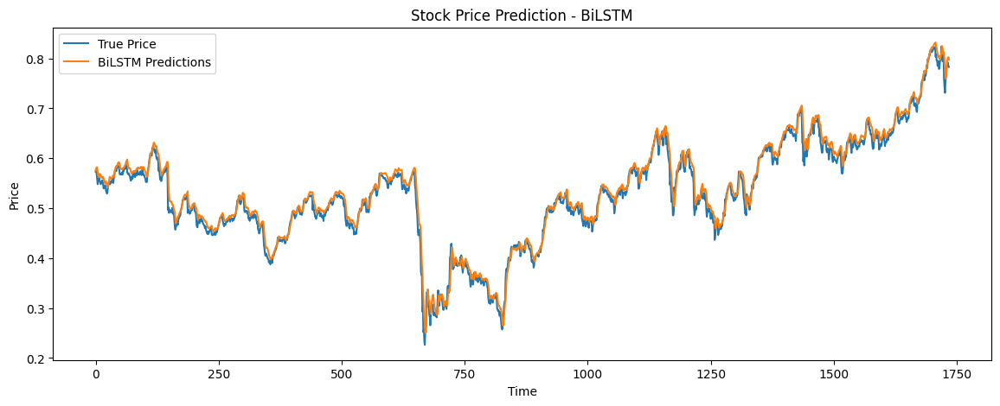

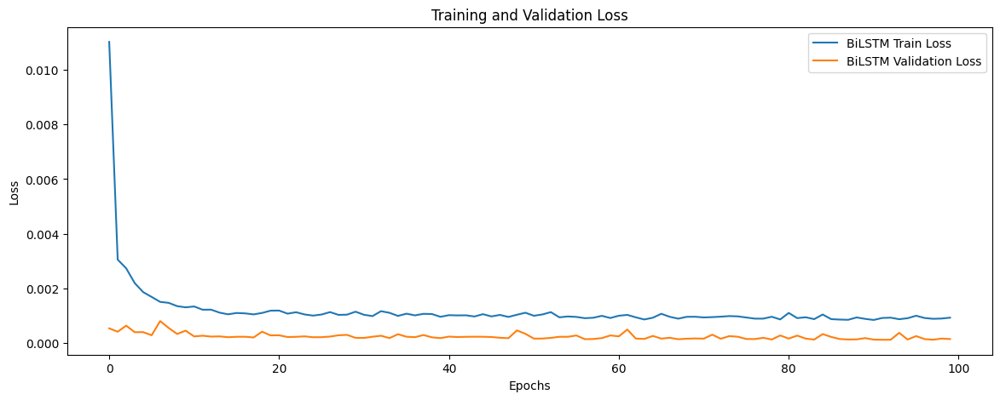

Raw BiLSTM Future Predictions (Before Inverse Transform):
[0.79490042 0.79983068 0.80603641 0.81277299 0.82004708 0.82745713
 0.83488125 0.84179479 0.8479771  0.85375565 0.85900939 0.86386305
 0.86861074 0.87320471 0.8774997  0.88192099 0.88639319 0.89049846
 0.89381218 0.89713305 0.90041548 0.90391833 0.90734684 0.91077989
 0.9140625  0.91725773 0.92026132 0.92315328 0.9260937  0.92911381]

BiLSTM Future Predictions (After Inverse Transform):
[33.82392473 34.00890349 34.24173707 34.49448724 34.76740448 35.04542274
 35.32396877 35.58335855 35.81531326 36.0321192  36.22923442 36.41133951
 36.58946844 36.76182992 36.92297406 37.08885695 37.25664964 37.41067561
 37.53500335 37.65959945 37.78275313 37.91417669 38.04281158 38.17161642
 38.2947768  38.41465876 38.52735098 38.63585458 38.7461763  38.85948798]


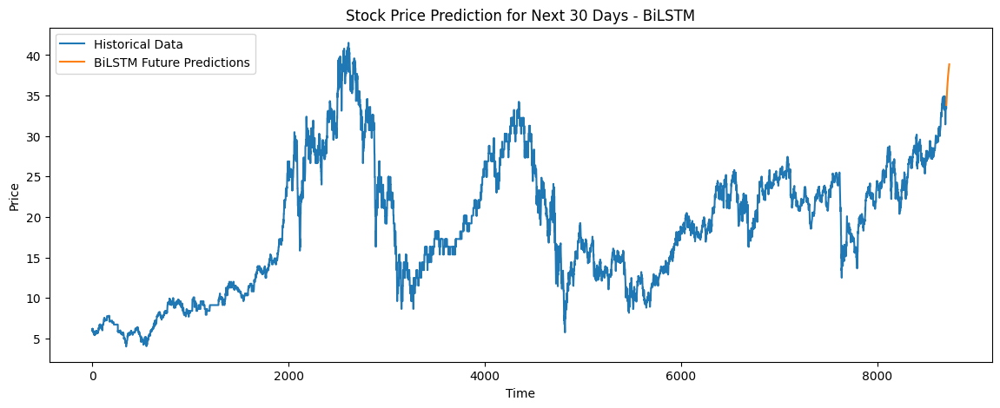

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Bidirectional, LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler

# Assume X_train, Y_train, X_test, Y_test are already defined and preprocessed

# Define BiLSTM model
def create_bilstm_model(input_shape=(30, 1), lstm_units=64, dropout_rate=0.5, lr=0.001):
    model = Sequential()
    model.add(Bidirectional(LSTM(units=lstm_units, return_sequences=True), input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(Bidirectional(LSTM(units=lstm_units, return_sequences=False)))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# Train the model
bilstm_model = create_bilstm_model(input_shape=(X_train.shape[1], 1))
bilstm_history = bilstm_model.fit(X_train, Y_train, batch_size=64, epochs=100, verbose=1, validation_split=0.2)

# Predictions
bilstm_predictions = bilstm_model.predict(X_test)

# Misalnya, kita fit scaler dengan data training
scaler = MinMaxScaler()
scaler.fit(Y_train.reshape(-1, 1))

# Inverse scaling
bilstm_predictions = scaler.inverse_transform(bilstm_predictions)
Y_test_unscaled = scaler.inverse_transform(Y_test.reshape(-1, 1))

# Calculate MAPE
bilstm_mape = mean_absolute_percentage_error(Y_test_unscaled, bilstm_predictions)
print(f'BiLSTM MAPE: {bilstm_mape:.4f}')

# Plot the results
plt.figure(figsize=(14, 5))
plt.plot(Y_test_unscaled, label='True Price')
plt.plot(bilstm_predictions, label='BiLSTM Predictions')
plt.title('Stock Price Prediction - BiLSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()


# Plot the training and validation loss for both models
plt.figure(figsize=(14, 5))
plt.plot(bilstm_history.history['loss'], label='BiLSTM Train Loss')
plt.plot(bilstm_history.history['val_loss'], label='BiLSTM Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Assume bilstm_model, data, and scaled_data are already defined and preprocessed
time_step = 30  # Sesuaikan dengan time step yang Anda gunakan

# Fit scaler dengan data asli (bukan data yang sudah discaled)
scaler = MinMaxScaler()
scaler.fit(data.reshape(-1, 1))  # Fit dengan data asli

# Fungsi untuk prediksi 30 hari ke depan
def predict_next_30_days(model, data, time_step):
    temp_input = data[-time_step:].reshape(1, -1)  # Ambil data terakhir sebanyak time_step dan reshape
    temp_input = list(temp_input[0])  # Ubah menjadi list
    lst_output = []
    n_steps = time_step
    i = 0
    while(i < 30):
        if len(temp_input) > n_steps:
            x_input = np.array(temp_input[-n_steps:])  # Ambil hanya n_steps terakhir dan ubah menjadi numpy array
            x_input = x_input.reshape(1, n_steps, 1)
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
        else:
            x_input = np.array(temp_input).reshape((1, n_steps, 1))  # Ubah list menjadi numpy array dan reshape
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
    return np.array(lst_output).reshape(-1, 1)

# Prediksi tanpa inverse transform
bilstm_future_predictions_raw = predict_next_30_days(bilstm_model, scaled_data, time_step)

# Print prediksi raw (sebelum inverse transform)
print("Raw BiLSTM Future Predictions (Before Inverse Transform):")
print(bilstm_future_predictions_raw.flatten())

# Lakukan inverse transform pada prediksi
bilstm_future_predictions = scaler.inverse_transform(bilstm_future_predictions_raw)

# Print prediksi setelah inverse transform
print("\nBiLSTM Future Predictions (After Inverse Transform):")
print(bilstm_future_predictions.flatten())

# Plot hasil prediksi
plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(data)), data, label='Historical Data')
plt.plot(np.arange(len(data), len(data) + 30), bilstm_future_predictions, label='BiLSTM Future Predictions')
plt.title('Stock Price Prediction for Next 30 Days - BiLSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()


Epoch 1/200


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


87/87 ━━━━━━━━━━━━━━━━━━━━ 18s 117ms/step - loss: 0.0214 - val_loss: 6.6754e-04
Epoch 2/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.0034 - val_loss: 5.1875e-04
Epoch 3/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.0026 - val_loss: 3.8821e-04
Epoch 4/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 12s 112ms/step - loss: 0.0021 - val_loss: 3.2140e-04
Epoch 5/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 11s 127ms/step - loss: 0.0019 - val_loss: 3.2425e-04
Epoch 6/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.0016 - val_loss: 2.7787e-04
Epoch 7/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - loss: 0.0015 - val_loss: 2.5202e-04
Epoch 8/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 11s 128ms/step - loss: 0.0013 - val_loss: 4.2560e-04
Epoch 9/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 19s 111ms/step - loss: 0.0014 - val_loss: 4.3864e-04
Epoch 10/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.0013 - val_loss: 3.3474e-04
Epoch 11/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.0012 - val_loss: 2.3944e-04
E

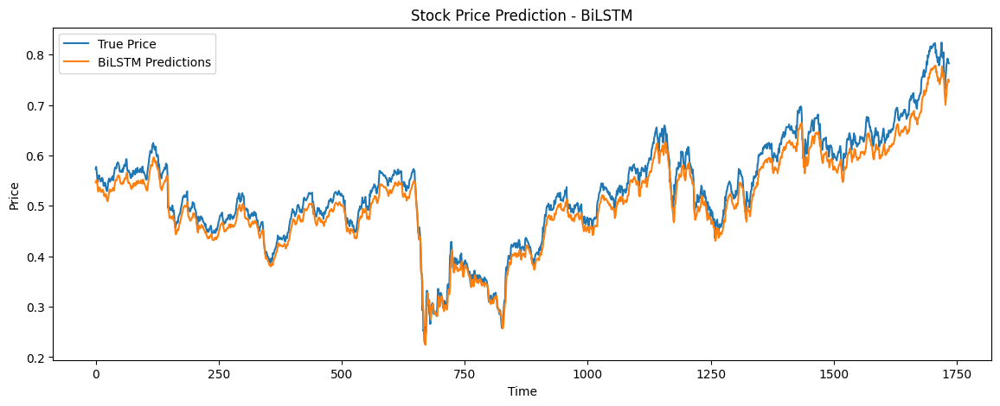

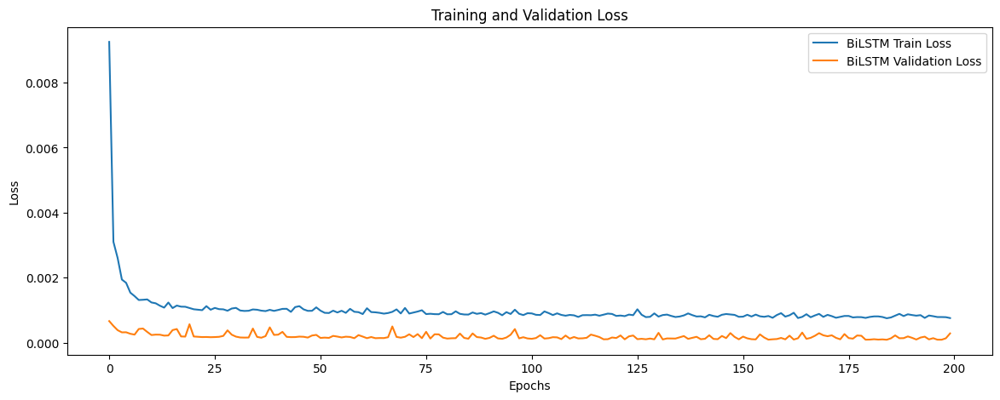

Raw BiLSTM Future Predictions (Before Inverse Transform):
[0.74881834 0.7194581  0.6952275  0.67117012 0.64811039 0.62557262
 0.60365778 0.58184129 0.55983579 0.53808457 0.51660013 0.49549809
 0.47519371 0.45568898 0.43659028 0.41834024 0.40089953 0.3836557
 0.36559477 0.347949   0.33098856 0.31547004 0.30118117 0.28851348
 0.27751863 0.26865685 0.26201105 0.25771564 0.25580564 0.25573215]

BiLSTM Future Predictions (After Inverse Transform):
[32.09496737 30.99339829 30.08428842 29.18167727 28.3164975  27.47090112
 26.64867643 25.83014165 25.00451553 24.18842952 23.38235323 22.590624
 21.82882221 21.09702278 20.38045711 19.69573203 19.04137272 18.39439994
 17.71677069 17.05471734 16.41837711 15.83613661 15.30003122 14.82475126
 14.41223451 14.07974865 13.83040438 13.66924458 13.59758309 13.59482572]


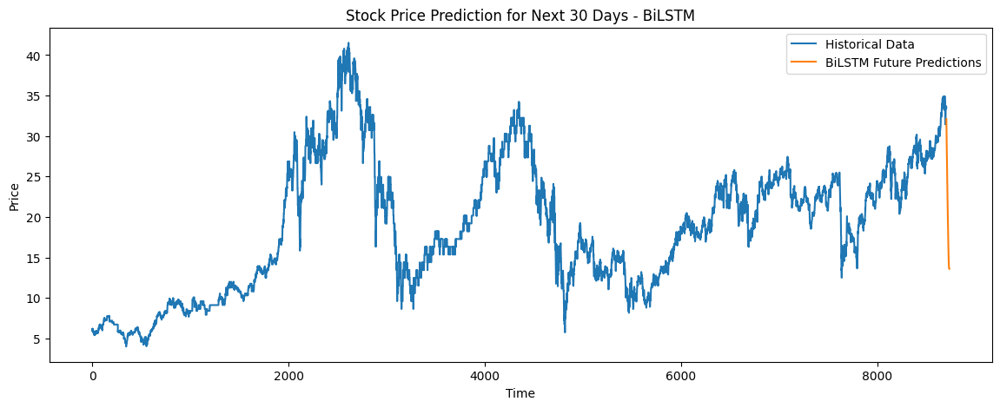

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Bidirectional, LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler

# Assume X_train, Y_train, X_test, Y_test are already defined and preprocessed

# Define BiLSTM model
def create_bilstm_model(input_shape=(30, 1), lstm_units=64, dropout_rate=0.5, lr=0.001):
    model = Sequential()
    model.add(Bidirectional(LSTM(units=lstm_units, return_sequences=True), input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(Bidirectional(LSTM(units=lstm_units, return_sequences=False)))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# Train the model
bilstm_model = create_bilstm_model(input_shape=(X_train.shape[1], 1))
bilstm_history = bilstm_model.fit(X_train, Y_train, batch_size=64, epochs=200, verbose=1, validation_split=0.2)

# Predictions
bilstm_predictions = bilstm_model.predict(X_test)

# Misalnya, kita fit scaler dengan data training
scaler = MinMaxScaler()
scaler.fit(Y_train.reshape(-1, 1))

# Inverse scaling
bilstm_predictions = scaler.inverse_transform(bilstm_predictions)
Y_test_unscaled = scaler.inverse_transform(Y_test.reshape(-1, 1))

# Calculate MAPE
bilstm_mape = mean_absolute_percentage_error(Y_test_unscaled, bilstm_predictions)
print(f'BiLSTM MAPE: {bilstm_mape:.4f}')

# Plot the results
plt.figure(figsize=(14, 5))
plt.plot(Y_test_unscaled, label='True Price')
plt.plot(bilstm_predictions, label='BiLSTM Predictions')
plt.title('Stock Price Prediction - BiLSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()


# Plot the training and validation loss for both models
plt.figure(figsize=(14, 5))
plt.plot(bilstm_history.history['loss'], label='BiLSTM Train Loss')
plt.plot(bilstm_history.history['val_loss'], label='BiLSTM Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Assume bilstm_model, data, and scaled_data are already defined and preprocessed
time_step = 30  # Sesuaikan dengan time step yang Anda gunakan

# Fit scaler dengan data asli (bukan data yang sudah discaled)
scaler = MinMaxScaler()
scaler.fit(data.reshape(-1, 1))  # Fit dengan data asli

# Fungsi untuk prediksi 30 hari ke depan
def predict_next_30_days(model, data, time_step):
    temp_input = data[-time_step:].reshape(1, -1)  # Ambil data terakhir sebanyak time_step dan reshape
    temp_input = list(temp_input[0])  # Ubah menjadi list
    lst_output = []
    n_steps = time_step
    i = 0
    while(i < 30):
        if len(temp_input) > n_steps:
            x_input = np.array(temp_input[-n_steps:])  # Ambil hanya n_steps terakhir dan ubah menjadi numpy array
            x_input = x_input.reshape(1, n_steps, 1)
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
        else:
            x_input = np.array(temp_input).reshape((1, n_steps, 1))  # Ubah list menjadi numpy array dan reshape
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
    return np.array(lst_output).reshape(-1, 1)

# Prediksi tanpa inverse transform
bilstm_future_predictions_raw = predict_next_30_days(bilstm_model, scaled_data, time_step)

# Print prediksi raw (sebelum inverse transform)
print("Raw BiLSTM Future Predictions (Before Inverse Transform):")
print(bilstm_future_predictions_raw.flatten())

# Lakukan inverse transform pada prediksi
bilstm_future_predictions = scaler.inverse_transform(bilstm_future_predictions_raw)

# Print prediksi setelah inverse transform
print("\nBiLSTM Future Predictions (After Inverse Transform):")
print(bilstm_future_predictions.flatten())

# Plot hasil prediksi
plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(data)), data, label='Historical Data')
plt.plot(np.arange(len(data), len(data) + 30), bilstm_future_predictions, label='BiLSTM Future Predictions')
plt.title('Stock Price Prediction for Next 30 Days - BiLSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()


Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


174/174 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.0228 - val_loss: 2.9128e-04
Epoch 2/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.0011 - val_loss: 5.6711e-04
Epoch 3/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 19s 63ms/step - loss: 9.3801e-04 - val_loss: 2.4585e-04
Epoch 4/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 7.7304e-04 - val_loss: 1.8092e-04
Epoch 5/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 6.7403e-04 - val_loss: 2.0557e-04
Epoch 6/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 7.2766e-04 - val_loss: 1.6113e-04
Epoch 7/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 6.3777e-04 - val_loss: 2.9832e-04
Epoch 8/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 7.5967e-04 - val_loss: 2.4645e-04
Epoch 9/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step - loss: 5.9057e-04 - val_loss: 1.4775e-04
Epoch 10/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 6.1259e-04 - val_loss: 9.6831e-04
Epoch 11/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - l

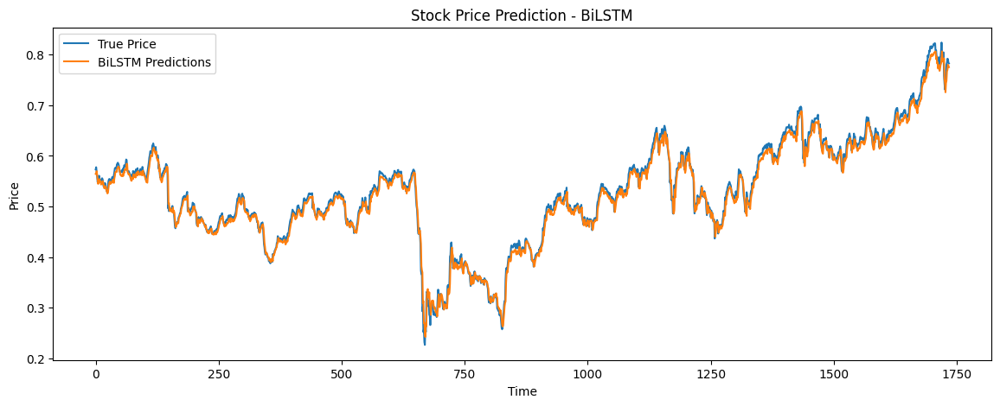

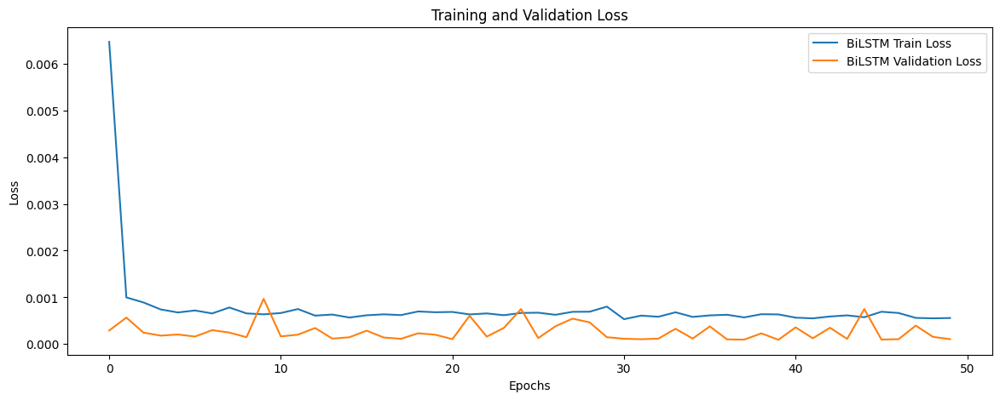

Raw BiLSTM Future Predictions (Before Inverse Transform):
[0.77820075 0.76887625 0.76255196 0.75509566 0.74808681 0.74054343
 0.73365462 0.72690928 0.71988159 0.71298862 0.70656288 0.70081705
 0.69589305 0.69117713 0.68595624 0.68102974 0.67679763 0.67260754
 0.66719586 0.66172063 0.65664911 0.65256613 0.64913207 0.64635032
 0.64394397 0.64179492 0.63964111 0.6374886  0.63563281 0.63401842]

BiLSTM Future Predictions (After Inverse Transform):
[33.19736836 32.84752201 32.6102404  32.33048677 32.06752112 31.78450023
 31.52603852 31.2729596  31.00928728 30.75066903 30.50958122 30.29400301
 30.10925907 29.9323221  29.73643909 29.55160123 29.39281639 29.23560816
 29.03256672 28.82714137 28.63686256 28.48367298 28.35483012 28.25046146
 28.16017709 28.07954687 27.99873775 27.91797783 27.84835027 27.78777977]


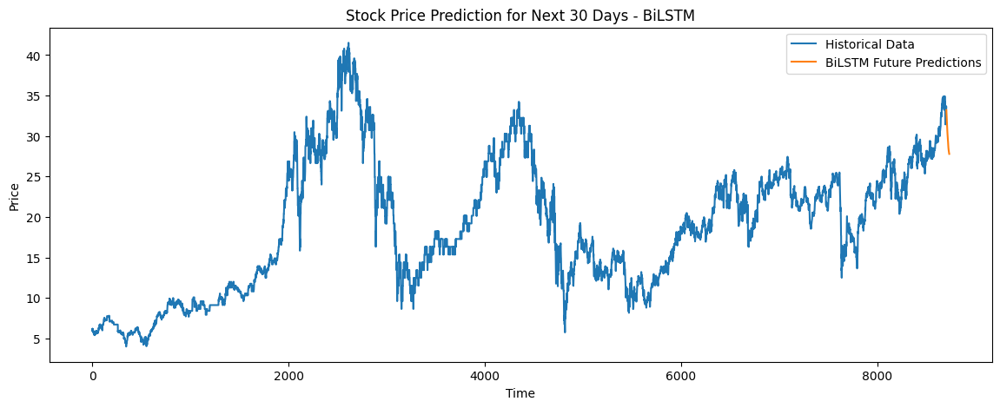

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Bidirectional, LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler

# Assume X_train, Y_train, X_test, Y_test are already defined and preprocessed

# Define BiLSTM model
def create_bilstm_model(input_shape=(30, 1), lstm_units=64, dropout_rate=0.2, lr=0.005):
    model = Sequential()
    model.add(Bidirectional(LSTM(units=lstm_units, return_sequences=True), input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(Bidirectional(LSTM(units=lstm_units, return_sequences=False)))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# Train the model
bilstm_model = create_bilstm_model(input_shape=(X_train.shape[1], 1))
bilstm_history = bilstm_model.fit(X_train, Y_train, batch_size=32, epochs=50, verbose=1, validation_split=0.2)

# Predictions
bilstm_predictions = bilstm_model.predict(X_test)

# Misalnya, kita fit scaler dengan data training
scaler = MinMaxScaler()
scaler.fit(Y_train.reshape(-1, 1))

# Inverse scaling
bilstm_predictions = scaler.inverse_transform(bilstm_predictions)
Y_test_unscaled = scaler.inverse_transform(Y_test.reshape(-1, 1))

# Calculate MAPE
bilstm_mape = mean_absolute_percentage_error(Y_test_unscaled, bilstm_predictions)
print(f'BiLSTM MAPE: {bilstm_mape:.4f}')

# Plot the results
plt.figure(figsize=(14, 5))
plt.plot(Y_test_unscaled, label='True Price')
plt.plot(bilstm_predictions, label='BiLSTM Predictions')
plt.title('Stock Price Prediction - BiLSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()


# Plot the training and validation loss for both models
plt.figure(figsize=(14, 5))
plt.plot(bilstm_history.history['loss'], label='BiLSTM Train Loss')
plt.plot(bilstm_history.history['val_loss'], label='BiLSTM Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Assume bilstm_model, data, and scaled_data are already defined and preprocessed
time_step = 30  # Sesuaikan dengan time step yang Anda gunakan

# Fit scaler dengan data asli (bukan data yang sudah discaled)
scaler = MinMaxScaler()
scaler.fit(data.reshape(-1, 1))  # Fit dengan data asli

# Fungsi untuk prediksi 30 hari ke depan
def predict_next_30_days(model, data, time_step):
    temp_input = data[-time_step:].reshape(1, -1)  # Ambil data terakhir sebanyak time_step dan reshape
    temp_input = list(temp_input[0])  # Ubah menjadi list
    lst_output = []
    n_steps = time_step
    i = 0
    while(i < 30):
        if len(temp_input) > n_steps:
            x_input = np.array(temp_input[-n_steps:])  # Ambil hanya n_steps terakhir dan ubah menjadi numpy array
            x_input = x_input.reshape(1, n_steps, 1)
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
        else:
            x_input = np.array(temp_input).reshape((1, n_steps, 1))  # Ubah list menjadi numpy array dan reshape
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
    return np.array(lst_output).reshape(-1, 1)

# Prediksi tanpa inverse transform
bilstm_future_predictions_raw = predict_next_30_days(bilstm_model, scaled_data, time_step)

# Print prediksi raw (sebelum inverse transform)
print("Raw BiLSTM Future Predictions (Before Inverse Transform):")
print(bilstm_future_predictions_raw.flatten())

# Lakukan inverse transform pada prediksi
bilstm_future_predictions = scaler.inverse_transform(bilstm_future_predictions_raw)

# Print prediksi setelah inverse transform
print("\nBiLSTM Future Predictions (After Inverse Transform):")
print(bilstm_future_predictions.flatten())

# Plot hasil prediksi
plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(data)), data, label='Historical Data')
plt.plot(np.arange(len(data), len(data) + 30), bilstm_future_predictions, label='BiLSTM Future Predictions')
plt.title('Stock Price Prediction for Next 30 Days - BiLSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()


Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


174/174 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - loss: 0.0286 - val_loss: 8.3800e-04
Epoch 2/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.0011 - val_loss: 4.3311e-04
Epoch 3/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - loss: 8.4522e-04 - val_loss: 2.2851e-04
Epoch 4/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 7.2304e-04 - val_loss: 3.9593e-04
Epoch 5/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - loss: 6.9261e-04 - val_loss: 2.8710e-04
Epoch 6/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 6.7387e-04 - val_loss: 2.3259e-04
Epoch 7/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - loss: 6.2587e-04 - val_loss: 1.6275e-04
Epoch 8/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 6.2470e-04 - val_loss: 1.6580e-04
Epoch 9/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 6.3571e-04 - val_loss: 1.4929e-04
Epoch 10/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - loss: 6.5067e-04 - val_loss: 1.8836e-04
Epoch 11/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 20s 74m

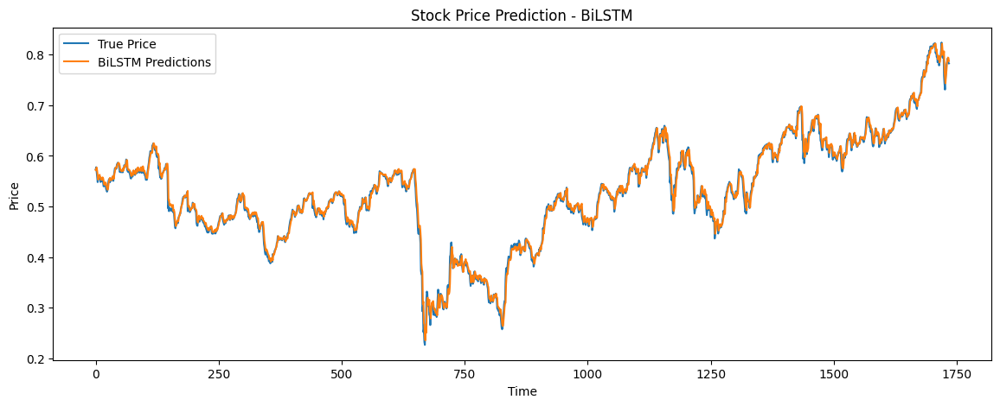

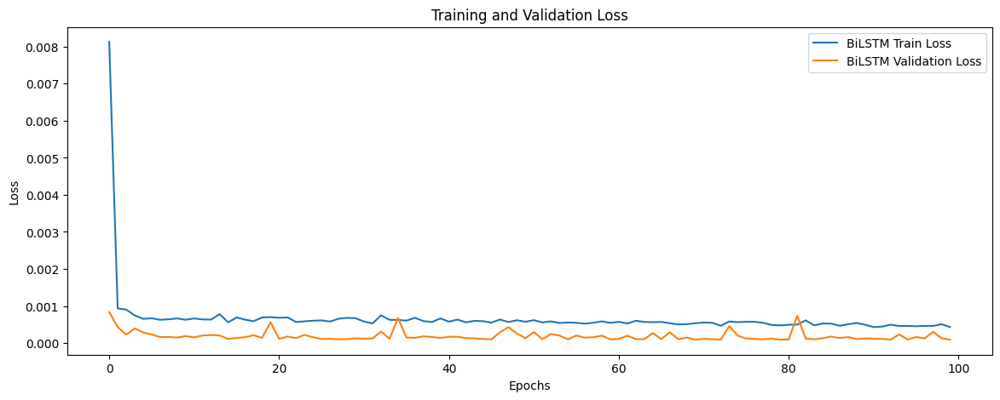

Raw BiLSTM Future Predictions (Before Inverse Transform):
[0.79037827 0.79206115 0.79520965 0.79866898 0.8019464  0.80449998
 0.80717963 0.8094945  0.80996084 0.81048018 0.8122884  0.81422323
 0.81557655 0.81773269 0.82040071 0.82290125 0.8243959  0.82575023
 0.82539999 0.82502902 0.82436603 0.82460403 0.82534415 0.82678872
 0.82806796 0.82932818 0.83056331 0.83153969 0.83231372 0.83316243]

BiLSTM Future Predictions (After Inverse Transform):
[33.65425801 33.71739803 33.83552672 33.96531777 34.0882836  34.18409167
 34.28462953 34.37148116 34.38897806 34.40846305 34.47630603 34.54889894
 34.5996744  34.68057073 34.78067251 34.87449026 34.93056801 34.98138148
 34.96824091 34.95432211 34.92944762 34.93837721 34.96614549 35.02034474
 35.06834046 35.1156228  35.16196364 35.19859667 35.22763741 35.25948025]


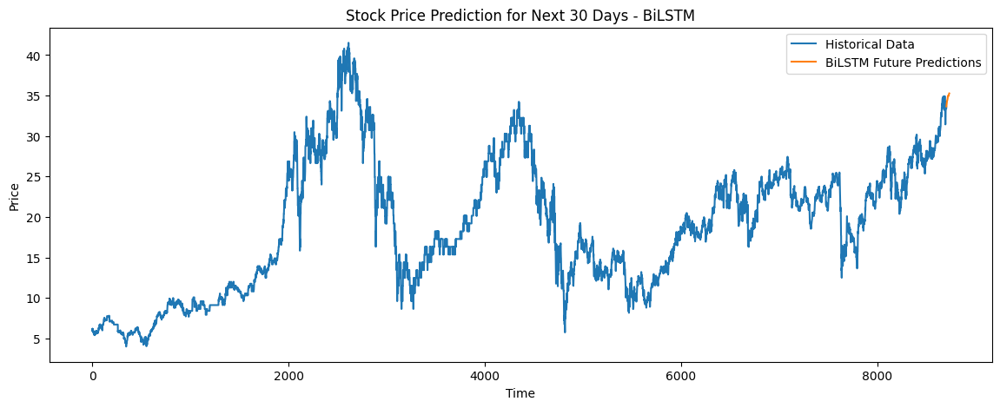

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Bidirectional, LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler

# Assume X_train, Y_train, X_test, Y_test are already defined and preprocessed

# Define BiLSTM model
def create_bilstm_model(input_shape=(30, 1), lstm_units=64, dropout_rate=0.2, lr=0.005):
    model = Sequential()
    model.add(Bidirectional(LSTM(units=lstm_units, return_sequences=True), input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(Bidirectional(LSTM(units=lstm_units, return_sequences=False)))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# Train the model
bilstm_model = create_bilstm_model(input_shape=(X_train.shape[1], 1))
bilstm_history = bilstm_model.fit(X_train, Y_train, batch_size=32, epochs=100, verbose=1, validation_split=0.2)

# Predictions
bilstm_predictions = bilstm_model.predict(X_test)

# Misalnya, kita fit scaler dengan data training
scaler = MinMaxScaler()
scaler.fit(Y_train.reshape(-1, 1))

# Inverse scaling
bilstm_predictions = scaler.inverse_transform(bilstm_predictions)
Y_test_unscaled = scaler.inverse_transform(Y_test.reshape(-1, 1))

# Calculate MAPE
bilstm_mape = mean_absolute_percentage_error(Y_test_unscaled, bilstm_predictions)
print(f'BiLSTM MAPE: {bilstm_mape:.4f}')

# Plot the results
plt.figure(figsize=(14, 5))
plt.plot(Y_test_unscaled, label='True Price')
plt.plot(bilstm_predictions, label='BiLSTM Predictions')
plt.title('Stock Price Prediction - BiLSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()


# Plot the training and validation loss for both models
plt.figure(figsize=(14, 5))
plt.plot(bilstm_history.history['loss'], label='BiLSTM Train Loss')
plt.plot(bilstm_history.history['val_loss'], label='BiLSTM Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Assume bilstm_model, data, and scaled_data are already defined and preprocessed
time_step = 30  # Sesuaikan dengan time step yang Anda gunakan

# Fit scaler dengan data asli (bukan data yang sudah discaled)
scaler = MinMaxScaler()
scaler.fit(data.reshape(-1, 1))  # Fit dengan data asli

# Fungsi untuk prediksi 30 hari ke depan
def predict_next_30_days(model, data, time_step):
    temp_input = data[-time_step:].reshape(1, -1)  # Ambil data terakhir sebanyak time_step dan reshape
    temp_input = list(temp_input[0])  # Ubah menjadi list
    lst_output = []
    n_steps = time_step
    i = 0
    while(i < 30):
        if len(temp_input) > n_steps:
            x_input = np.array(temp_input[-n_steps:])  # Ambil hanya n_steps terakhir dan ubah menjadi numpy array
            x_input = x_input.reshape(1, n_steps, 1)
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
        else:
            x_input = np.array(temp_input).reshape((1, n_steps, 1))  # Ubah list menjadi numpy array dan reshape
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
    return np.array(lst_output).reshape(-1, 1)

# Prediksi tanpa inverse transform
bilstm_future_predictions_raw = predict_next_30_days(bilstm_model, scaled_data, time_step)

# Print prediksi raw (sebelum inverse transform)
print("Raw BiLSTM Future Predictions (Before Inverse Transform):")
print(bilstm_future_predictions_raw.flatten())

# Lakukan inverse transform pada prediksi
bilstm_future_predictions = scaler.inverse_transform(bilstm_future_predictions_raw)

# Print prediksi setelah inverse transform
print("\nBiLSTM Future Predictions (After Inverse Transform):")
print(bilstm_future_predictions.flatten())

# Plot hasil prediksi
plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(data)), data, label='Historical Data')
plt.plot(np.arange(len(data), len(data) + 30), bilstm_future_predictions, label='BiLSTM Future Predictions')
plt.title('Stock Price Prediction for Next 30 Days - BiLSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()


Epoch 1/200


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


174/174 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - loss: 0.0130 - val_loss: 2.2793e-04
Epoch 2/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 9.8035e-04 - val_loss: 1.9876e-04
Epoch 3/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 7.7520e-04 - val_loss: 3.4873e-04
Epoch 4/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - loss: 8.6241e-04 - val_loss: 1.6804e-04
Epoch 5/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 7.7546e-04 - val_loss: 1.9221e-04
Epoch 6/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 7.2043e-04 - val_loss: 1.5529e-04
Epoch 7/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 6.1492e-04 - val_loss: 1.3586e-04
Epoch 8/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 6.8748e-04 - val_loss: 5.0201e-04
Epoch 9/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 7.0372e-04 - val_loss: 4.3941e-04
Epoch 10/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 7.0933e-04 - val_loss: 1.8491e-04
Epoch 11/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 13s

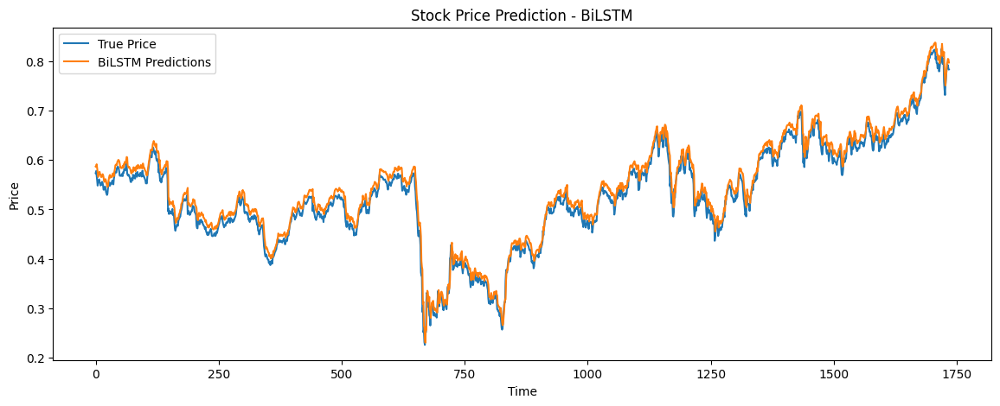

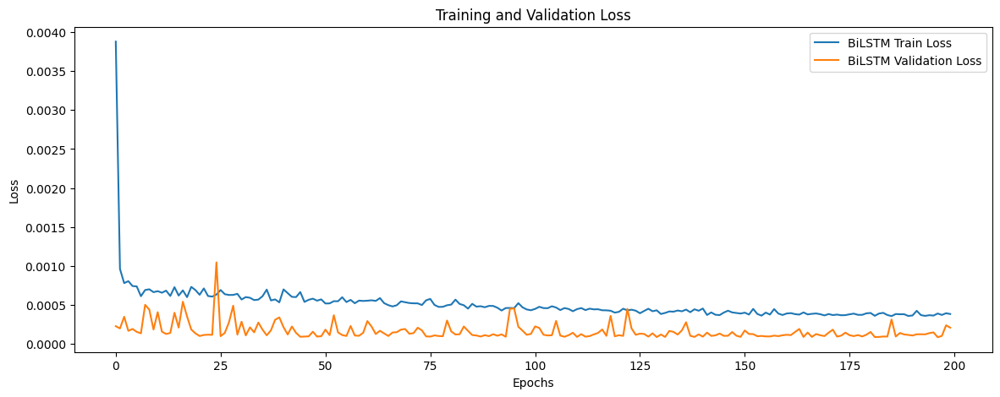

Raw BiLSTM Future Predictions (Before Inverse Transform):
[0.80024618 0.81125247 0.82268989 0.83452815 0.84669578 0.85747701
 0.86784369 0.87837112 0.88668203 0.89420521 0.90296197 0.9114697
 0.91825163 0.92602545 0.934165   0.94113356 0.94603699 0.95208174
 0.95573956 0.95931417 0.96130759 0.96370071 0.96582502 0.9685775
 0.97068208 0.97260576 0.9744435  0.97584701 0.97689915 0.9775641 ]

BiLSTM Future Predictions (After Inverse Transform):
[34.02449281 34.43743894 34.8665603  35.31072086 35.76723927 36.17174108
 36.56068934 36.95566894 37.26748681 37.54974959 37.87829507 38.19749725
 38.45194926 38.74361573 39.04900421 39.3104581  39.49443052 39.72122382
 39.85846179 39.99257787 40.06736908 40.15715699 40.23685914 40.34012977
 40.4190917  40.49126642 40.56021638 40.61287481 40.65235018 40.67729847]


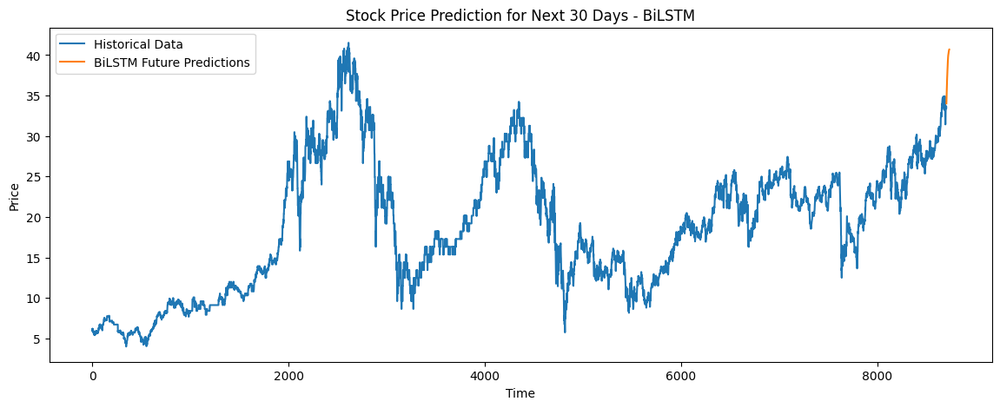

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Bidirectional, LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler

# Assume X_train, Y_train, X_test, Y_test are already defined and preprocessed

# Define BiLSTM model
def create_bilstm_model(input_shape=(30, 1), lstm_units=64, dropout_rate=0.2, lr=0.005):
    model = Sequential()
    model.add(Bidirectional(LSTM(units=lstm_units, return_sequences=True), input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(Bidirectional(LSTM(units=lstm_units, return_sequences=False)))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# Train the model
bilstm_model = create_bilstm_model(input_shape=(X_train.shape[1], 1))
bilstm_history = bilstm_model.fit(X_train, Y_train, batch_size=32, epochs=200, verbose=1, validation_split=0.2)

# Predictions
bilstm_predictions = bilstm_model.predict(X_test)

# Misalnya, kita fit scaler dengan data training
scaler = MinMaxScaler()
scaler.fit(Y_train.reshape(-1, 1))

# Inverse scaling
bilstm_predictions = scaler.inverse_transform(bilstm_predictions)
Y_test_unscaled = scaler.inverse_transform(Y_test.reshape(-1, 1))

# Calculate MAPE
bilstm_mape = mean_absolute_percentage_error(Y_test_unscaled, bilstm_predictions)
print(f'BiLSTM MAPE: {bilstm_mape:.4f}')

# Plot the results
plt.figure(figsize=(14, 5))
plt.plot(Y_test_unscaled, label='True Price')
plt.plot(bilstm_predictions, label='BiLSTM Predictions')
plt.title('Stock Price Prediction - BiLSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()


# Plot the training and validation loss for both models
plt.figure(figsize=(14, 5))
plt.plot(bilstm_history.history['loss'], label='BiLSTM Train Loss')
plt.plot(bilstm_history.history['val_loss'], label='BiLSTM Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Assume bilstm_model, data, and scaled_data are already defined and preprocessed
time_step = 30  # Sesuaikan dengan time step yang Anda gunakan

# Fit scaler dengan data asli (bukan data yang sudah discaled)
scaler = MinMaxScaler()
scaler.fit(data.reshape(-1, 1))  # Fit dengan data asli

# Fungsi untuk prediksi 30 hari ke depan
def predict_next_30_days(model, data, time_step):
    temp_input = data[-time_step:].reshape(1, -1)  # Ambil data terakhir sebanyak time_step dan reshape
    temp_input = list(temp_input[0])  # Ubah menjadi list
    lst_output = []
    n_steps = time_step
    i = 0
    while(i < 30):
        if len(temp_input) > n_steps:
            x_input = np.array(temp_input[-n_steps:])  # Ambil hanya n_steps terakhir dan ubah menjadi numpy array
            x_input = x_input.reshape(1, n_steps, 1)
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
        else:
            x_input = np.array(temp_input).reshape((1, n_steps, 1))  # Ubah list menjadi numpy array dan reshape
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
    return np.array(lst_output).reshape(-1, 1)

# Prediksi tanpa inverse transform
bilstm_future_predictions_raw = predict_next_30_days(bilstm_model, scaled_data, time_step)

# Print prediksi raw (sebelum inverse transform)
print("Raw BiLSTM Future Predictions (Before Inverse Transform):")
print(bilstm_future_predictions_raw.flatten())

# Lakukan inverse transform pada prediksi
bilstm_future_predictions = scaler.inverse_transform(bilstm_future_predictions_raw)

# Print prediksi setelah inverse transform
print("\nBiLSTM Future Predictions (After Inverse Transform):")
print(bilstm_future_predictions.flatten())

# Plot hasil prediksi
plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(data)), data, label='Historical Data')
plt.plot(np.arange(len(data), len(data) + 30), bilstm_future_predictions, label='BiLSTM Future Predictions')
plt.title('Stock Price Prediction for Next 30 Days - BiLSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()


Epoch 1/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 37s 200ms/step - loss: 0.0191 - val_loss: 6.6873e-04
Epoch 2/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 16s 143ms/step - loss: 0.0010 - val_loss: 2.8331e-04
Epoch 3/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 20s 134ms/step - loss: 9.5601e-04 - val_loss: 5.3358e-04
Epoch 4/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 15s 172ms/step - loss: 8.5675e-04 - val_loss: 1.7500e-04
Epoch 5/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 17s 198ms/step - loss: 7.4390e-04 - val_loss: 2.5213e-04
Epoch 6/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 19s 176ms/step - loss: 7.0587e-04 - val_loss: 1.5947e-04
Epoch 7/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 14s 104ms/step - loss: 7.0071e-04 - val_loss: 3.2430e-04
Epoch 8/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 12s 138ms/step - loss: 6.7046e-04 - val_loss: 1.5736e-04
Epoch 9/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 18s 113ms/step - loss: 5.9625e-04 - val_loss: 1.5176e-04
Epoch 10/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 5.8515e-04 - val_loss: 1.3179e-04
Epoch 11/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 22s 137ms/step - l

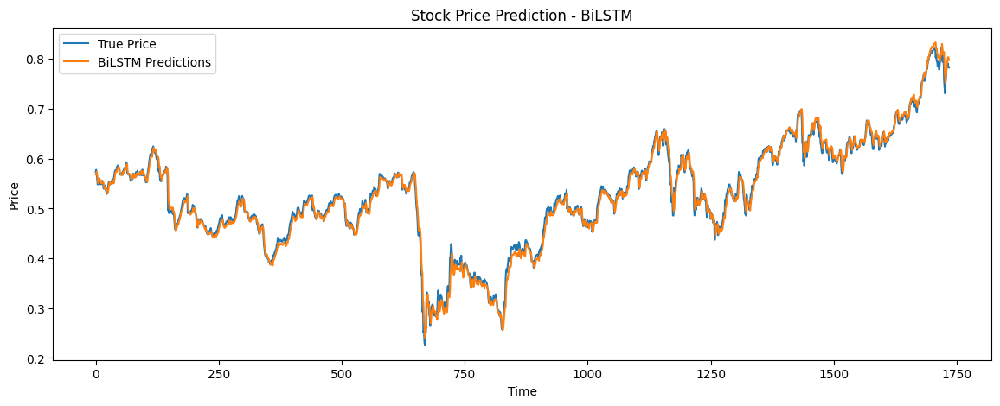

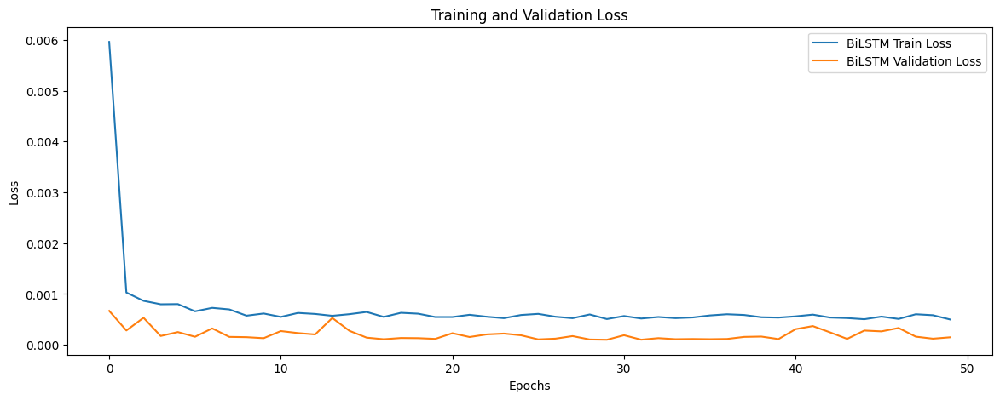

Raw BiLSTM Future Predictions (Before Inverse Transform):
[0.79851133 0.80659485 0.81458122 0.82213545 0.82939255 0.83631068
 0.84329122 0.85013694 0.85694259 0.86449635 0.87256169 0.88092697
 0.88967407 0.89846325 0.90694654 0.91575611 0.924613   0.93245584
 0.93846858 0.94423604 0.95033979 0.95737064 0.9649058  0.97287661
 0.98088884 0.98876697 0.99616402 1.00310946 1.0099566  1.01689816]

BiLSTM Future Predictions (After Inverse Transform):
[33.95940273 34.26268907 34.56233023 34.84575813 35.11803801 35.37759999
 35.63950339 35.89634825 36.15169031 36.43510032 36.73770459 37.05156198
 37.37974518 37.70950722 38.02779251 38.35831936 38.69062185 38.98487797
 39.21047038 39.42686036 39.65586762 39.91965846 40.20237074 40.50142822
 40.80203993 41.09761995 41.37515069 41.6357369  41.89263544 42.15307629]


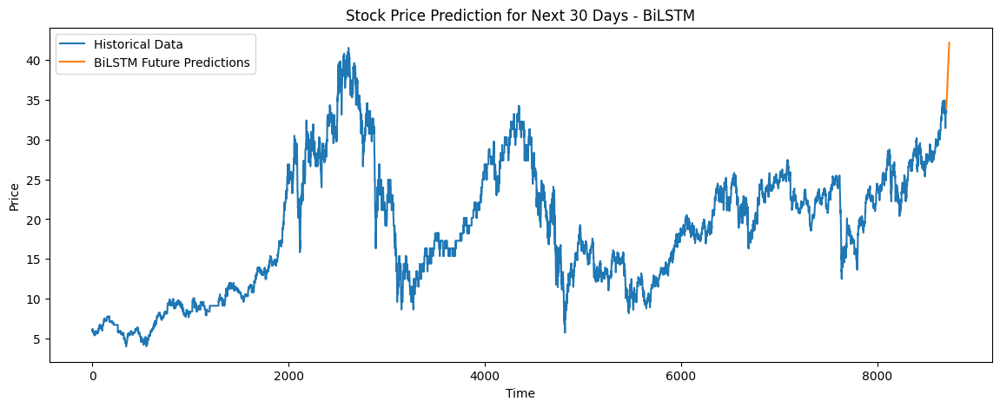

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Bidirectional, LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler

# Assume X_train, Y_train, X_test, Y_test are already defined and preprocessed

# Define BiLSTM model
def create_bilstm_model(input_shape=(30, 1), lstm_units=64, dropout_rate=0.2, lr=0.005):
    model = Sequential()
    model.add(Bidirectional(LSTM(units=lstm_units, return_sequences=True), input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(Bidirectional(LSTM(units=lstm_units, return_sequences=False)))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# Train the model
bilstm_model = create_bilstm_model(input_shape=(X_train.shape[1], 1))
bilstm_history = bilstm_model.fit(X_train, Y_train, batch_size=64, epochs=50, verbose=1, validation_split=0.2)

# Predictions
bilstm_predictions = bilstm_model.predict(X_test)

# Misalnya, kita fit scaler dengan data training
scaler = MinMaxScaler()
scaler.fit(Y_train.reshape(-1, 1))

# Inverse scaling
bilstm_predictions = scaler.inverse_transform(bilstm_predictions)
Y_test_unscaled = scaler.inverse_transform(Y_test.reshape(-1, 1))

# Calculate MAPE
bilstm_mape = mean_absolute_percentage_error(Y_test_unscaled, bilstm_predictions)
print(f'BiLSTM MAPE: {bilstm_mape:.4f}')

# Plot the results
plt.figure(figsize=(14, 5))
plt.plot(Y_test_unscaled, label='True Price')
plt.plot(bilstm_predictions, label='BiLSTM Predictions')
plt.title('Stock Price Prediction - BiLSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()


# Plot the training and validation loss for both models
plt.figure(figsize=(14, 5))
plt.plot(bilstm_history.history['loss'], label='BiLSTM Train Loss')
plt.plot(bilstm_history.history['val_loss'], label='BiLSTM Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Assume bilstm_model, data, and scaled_data are already defined and preprocessed
time_step = 30  # Sesuaikan dengan time step yang Anda gunakan

# Fit scaler dengan data asli (bukan data yang sudah discaled)
scaler = MinMaxScaler()
scaler.fit(data.reshape(-1, 1))  # Fit dengan data asli

# Fungsi untuk prediksi 30 hari ke depan
def predict_next_30_days(model, data, time_step):
    temp_input = data[-time_step:].reshape(1, -1)  # Ambil data terakhir sebanyak time_step dan reshape
    temp_input = list(temp_input[0])  # Ubah menjadi list
    lst_output = []
    n_steps = time_step
    i = 0
    while(i < 30):
        if len(temp_input) > n_steps:
            x_input = np.array(temp_input[-n_steps:])  # Ambil hanya n_steps terakhir dan ubah menjadi numpy array
            x_input = x_input.reshape(1, n_steps, 1)
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
        else:
            x_input = np.array(temp_input).reshape((1, n_steps, 1))  # Ubah list menjadi numpy array dan reshape
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
    return np.array(lst_output).reshape(-1, 1)

# Prediksi tanpa inverse transform
bilstm_future_predictions_raw = predict_next_30_days(bilstm_model, scaled_data, time_step)

# Print prediksi raw (sebelum inverse transform)
print("Raw BiLSTM Future Predictions (Before Inverse Transform):")
print(bilstm_future_predictions_raw.flatten())

# Lakukan inverse transform pada prediksi
bilstm_future_predictions = scaler.inverse_transform(bilstm_future_predictions_raw)

# Print prediksi setelah inverse transform
print("\nBiLSTM Future Predictions (After Inverse Transform):")
print(bilstm_future_predictions.flatten())

# Plot hasil prediksi
plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(data)), data, label='Historical Data')
plt.plot(np.arange(len(data), len(data) + 30), bilstm_future_predictions, label='BiLSTM Future Predictions')
plt.title('Stock Price Prediction for Next 30 Days - BiLSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()


Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


87/87 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.0169 - val_loss: 2.9565e-04
Epoch 2/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.0010 - val_loss: 2.6778e-04
Epoch 3/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 8.1167e-04 - val_loss: 2.5578e-04
Epoch 4/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 7.7801e-04 - val_loss: 2.4035e-04
Epoch 5/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 8.4771e-04 - val_loss: 2.8808e-04
Epoch 6/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 7.3396e-04 - val_loss: 1.6806e-04
Epoch 7/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 11s 108ms/step - loss: 6.4196e-04 - val_loss: 1.6280e-04
Epoch 8/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 11s 121ms/step - loss: 6.9902e-04 - val_loss: 3.6308e-04
Epoch 9/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 18s 94ms/step - loss: 7.2791e-04 - val_loss: 1.3763e-04
Epoch 10/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 12s 109ms/step - loss: 5.4935e-04 - val_loss: 2.3603e-04
Epoch 11/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss:

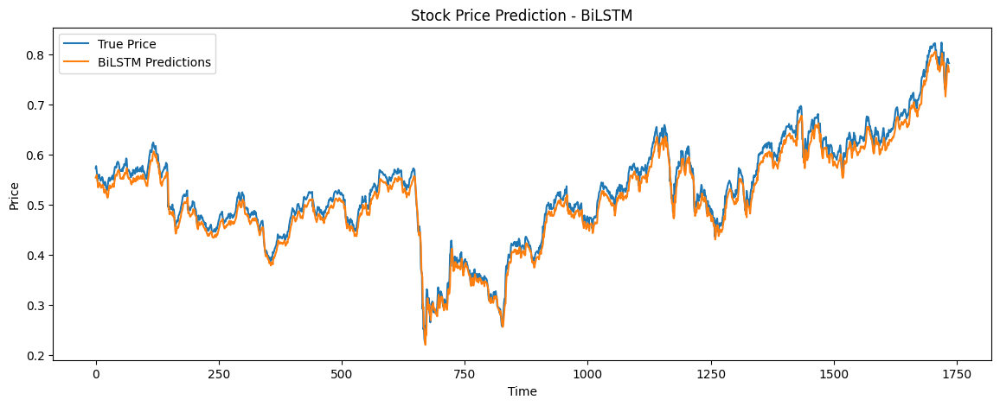

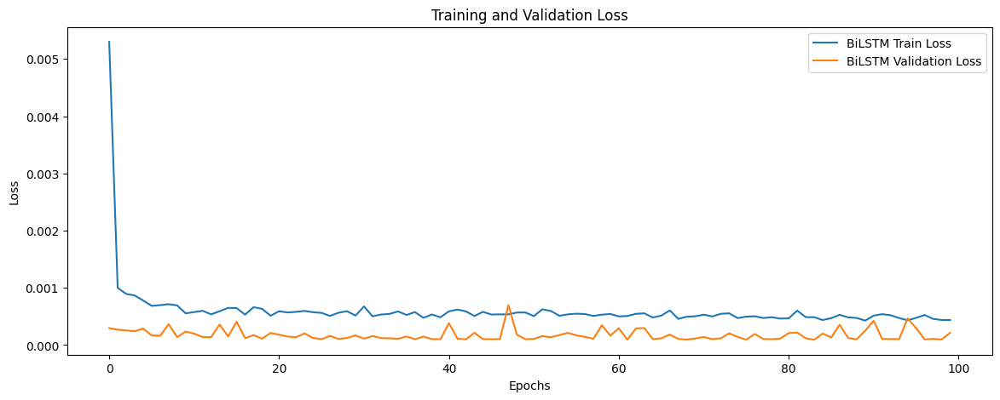

Raw BiLSTM Future Predictions (Before Inverse Transform):
[0.76656687 0.75021303 0.73646247 0.72054625 0.7059049  0.69234681
 0.68039083 0.66742301 0.65153468 0.63311291 0.61457217 0.5978955
 0.58362383 0.569839   0.55434811 0.53795379 0.52187979 0.50604212
 0.48879251 0.47106358 0.4531436  0.43610516 0.41971374 0.40394786
 0.38825035 0.372751   0.35767972 0.34364039 0.33120257 0.32015634]

BiLSTM Future Predictions (After Inverse Transform):
[32.76087612 32.14729483 31.63138668 31.03422439 30.48489457 29.97620748
 29.5276302  29.0410893  28.44497361 27.75380572 27.05817416 26.432481
 25.89702079 25.37982676 24.79862279 24.18352305 23.58044124 22.98622641
 22.33903671 21.67386371 21.00152221 20.36225577 19.74726448 19.15574329
 18.56678714 17.98526562 17.41980528 16.8930622  16.42640659 16.01196214]


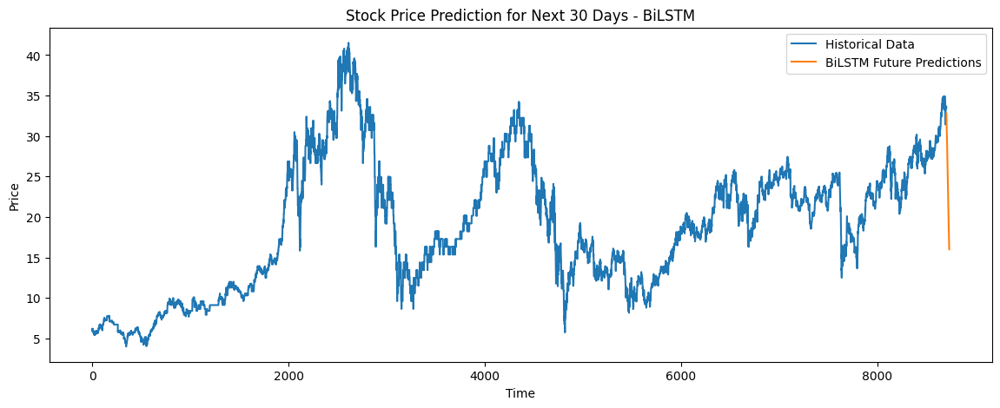

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Bidirectional, LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler

# Assume X_train, Y_train, X_test, Y_test are already defined and preprocessed

# Define BiLSTM model
def create_bilstm_model(input_shape=(30, 1), lstm_units=64, dropout_rate=0.2, lr=0.005):
    model = Sequential()
    model.add(Bidirectional(LSTM(units=lstm_units, return_sequences=True), input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(Bidirectional(LSTM(units=lstm_units, return_sequences=False)))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# Train the model
bilstm_model = create_bilstm_model(input_shape=(X_train.shape[1], 1))
bilstm_history = bilstm_model.fit(X_train, Y_train, batch_size=64, epochs=100, verbose=1, validation_split=0.2)

# Predictions
bilstm_predictions = bilstm_model.predict(X_test)

# Misalnya, kita fit scaler dengan data training
scaler = MinMaxScaler()
scaler.fit(Y_train.reshape(-1, 1))

# Inverse scaling
bilstm_predictions = scaler.inverse_transform(bilstm_predictions)
Y_test_unscaled = scaler.inverse_transform(Y_test.reshape(-1, 1))

# Calculate MAPE
bilstm_mape = mean_absolute_percentage_error(Y_test_unscaled, bilstm_predictions)
print(f'BiLSTM MAPE: {bilstm_mape:.4f}')

# Plot the results
plt.figure(figsize=(14, 5))
plt.plot(Y_test_unscaled, label='True Price')
plt.plot(bilstm_predictions, label='BiLSTM Predictions')
plt.title('Stock Price Prediction - BiLSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()


# Plot the training and validation loss for both models
plt.figure(figsize=(14, 5))
plt.plot(bilstm_history.history['loss'], label='BiLSTM Train Loss')
plt.plot(bilstm_history.history['val_loss'], label='BiLSTM Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Assume bilstm_model, data, and scaled_data are already defined and preprocessed
time_step = 30  # Sesuaikan dengan time step yang Anda gunakan

# Fit scaler dengan data asli (bukan data yang sudah discaled)
scaler = MinMaxScaler()
scaler.fit(data.reshape(-1, 1))  # Fit dengan data asli

# Fungsi untuk prediksi 30 hari ke depan
def predict_next_30_days(model, data, time_step):
    temp_input = data[-time_step:].reshape(1, -1)  # Ambil data terakhir sebanyak time_step dan reshape
    temp_input = list(temp_input[0])  # Ubah menjadi list
    lst_output = []
    n_steps = time_step
    i = 0
    while(i < 30):
        if len(temp_input) > n_steps:
            x_input = np.array(temp_input[-n_steps:])  # Ambil hanya n_steps terakhir dan ubah menjadi numpy array
            x_input = x_input.reshape(1, n_steps, 1)
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
        else:
            x_input = np.array(temp_input).reshape((1, n_steps, 1))  # Ubah list menjadi numpy array dan reshape
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
    return np.array(lst_output).reshape(-1, 1)

# Prediksi tanpa inverse transform
bilstm_future_predictions_raw = predict_next_30_days(bilstm_model, scaled_data, time_step)

# Print prediksi raw (sebelum inverse transform)
print("Raw BiLSTM Future Predictions (Before Inverse Transform):")
print(bilstm_future_predictions_raw.flatten())

# Lakukan inverse transform pada prediksi
bilstm_future_predictions = scaler.inverse_transform(bilstm_future_predictions_raw)

# Print prediksi setelah inverse transform
print("\nBiLSTM Future Predictions (After Inverse Transform):")
print(bilstm_future_predictions.flatten())

# Plot hasil prediksi
plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(data)), data, label='Historical Data')
plt.plot(np.arange(len(data), len(data) + 30), bilstm_future_predictions, label='BiLSTM Future Predictions')
plt.title('Stock Price Prediction for Next 30 Days - BiLSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()

Epoch 1/200


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


87/87 ━━━━━━━━━━━━━━━━━━━━ 19s 145ms/step - loss: 0.0357 - val_loss: 4.2982e-04
Epoch 2/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 12s 139ms/step - loss: 0.0014 - val_loss: 2.7117e-04
Epoch 3/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 19s 123ms/step - loss: 0.0011 - val_loss: 2.2227e-04
Epoch 4/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 21s 134ms/step - loss: 9.8121e-04 - val_loss: 6.8940e-04
Epoch 5/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 8.1471e-04 - val_loss: 2.0926e-04
Epoch 6/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 7.5228e-04 - val_loss: 2.6904e-04
Epoch 7/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 21s 140ms/step - loss: 6.7277e-04 - val_loss: 2.7758e-04
Epoch 8/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 18s 106ms/step - loss: 7.0474e-04 - val_loss: 2.1591e-04
Epoch 9/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 12s 138ms/step - loss: 6.8648e-04 - val_loss: 1.8571e-04
Epoch 10/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 6.2353e-04 - val_loss: 1.9559e-04
Epoch 11/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 13s 143ms/step - loss: 

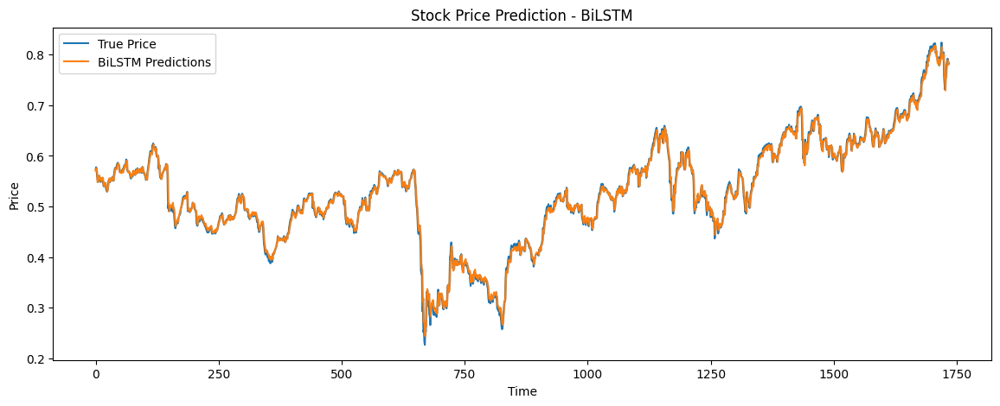

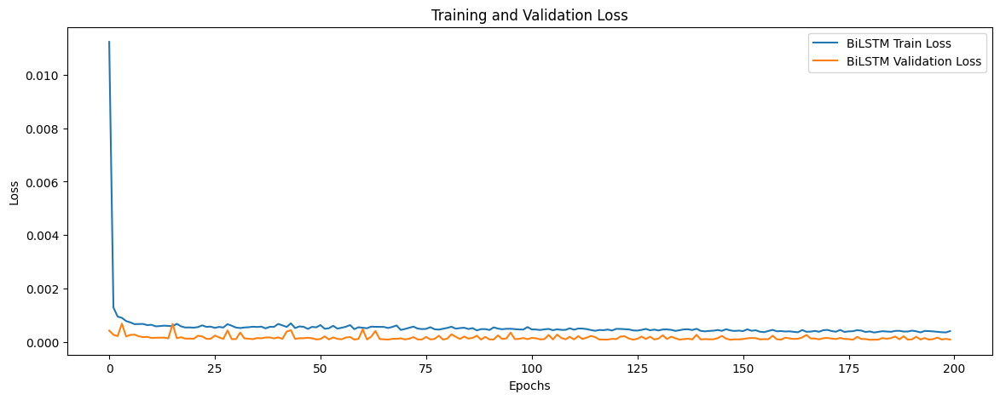

Raw BiLSTM Future Predictions (Before Inverse Transform):
[0.78439641 0.77957094 0.77809465 0.77563393 0.77478284 0.77308905
 0.77157879 0.7694931  0.76668054 0.76421022 0.7625432  0.76142299
 0.76108027 0.76099139 0.75973594 0.75786722 0.7561931  0.75458741
 0.7511453  0.74723303 0.7432875  0.74012482 0.73755038 0.73556697
 0.73392254 0.73252106 0.73103225 0.72915304 0.727283   0.72560668]

BiLSTM Future Predictions (After Inverse Transform):
[33.42982401 33.2487767  33.19338773 33.10106384 33.06913155 33.00558228
 32.94891862 32.8706656  32.76514076 32.67245683 32.60991167 32.56788243
 32.55502363 32.55168929 32.50458586 32.43447302 32.37166174 32.31141774
 32.18227298 32.03548819 31.88745554 31.76879461 31.67220384 31.59778834
 31.53609074 31.48350834 31.42764975 31.35714332 31.28698128 31.22408725]


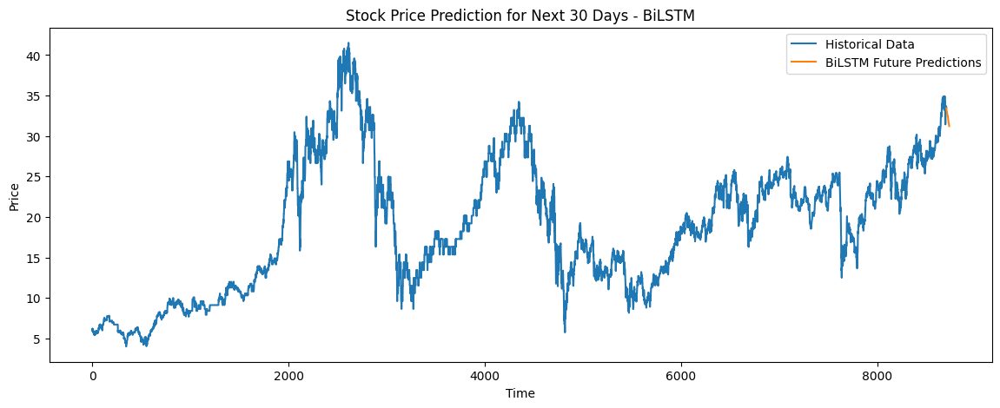

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Bidirectional, LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler

# Assume X_train, Y_train, X_test, Y_test are already defined and preprocessed

# Define BiLSTM model
def create_bilstm_model(input_shape=(30, 1), lstm_units=64, dropout_rate=0.2, lr=0.005):
    model = Sequential()
    model.add(Bidirectional(LSTM(units=lstm_units, return_sequences=True), input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(Bidirectional(LSTM(units=lstm_units, return_sequences=False)))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# Train the model
bilstm_model = create_bilstm_model(input_shape=(X_train.shape[1], 1))
bilstm_history = bilstm_model.fit(X_train, Y_train, batch_size=64, epochs=200, verbose=1, validation_split=0.2)

# Predictions
bilstm_predictions = bilstm_model.predict(X_test)

# Misalnya, kita fit scaler dengan data training
scaler = MinMaxScaler()
scaler.fit(Y_train.reshape(-1, 1))

# Inverse scaling
bilstm_predictions = scaler.inverse_transform(bilstm_predictions)
Y_test_unscaled = scaler.inverse_transform(Y_test.reshape(-1, 1))

# Calculate MAPE
bilstm_mape = mean_absolute_percentage_error(Y_test_unscaled, bilstm_predictions)
print(f'BiLSTM MAPE: {bilstm_mape:.4f}')

# Plot the results
plt.figure(figsize=(14, 5))
plt.plot(Y_test_unscaled, label='True Price')
plt.plot(bilstm_predictions, label='BiLSTM Predictions')
plt.title('Stock Price Prediction - BiLSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()


# Plot the training and validation loss for both models
plt.figure(figsize=(14, 5))
plt.plot(bilstm_history.history['loss'], label='BiLSTM Train Loss')
plt.plot(bilstm_history.history['val_loss'], label='BiLSTM Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Assume bilstm_model, data, and scaled_data are already defined and preprocessed
time_step = 30  # Sesuaikan dengan time step yang Anda gunakan

# Fit scaler dengan data asli (bukan data yang sudah discaled)
scaler = MinMaxScaler()
scaler.fit(data.reshape(-1, 1))  # Fit dengan data asli

# Fungsi untuk prediksi 30 hari ke depan
def predict_next_30_days(model, data, time_step):
    temp_input = data[-time_step:].reshape(1, -1)  # Ambil data terakhir sebanyak time_step dan reshape
    temp_input = list(temp_input[0])  # Ubah menjadi list
    lst_output = []
    n_steps = time_step
    i = 0
    while(i < 30):
        if len(temp_input) > n_steps:
            x_input = np.array(temp_input[-n_steps:])  # Ambil hanya n_steps terakhir dan ubah menjadi numpy array
            x_input = x_input.reshape(1, n_steps, 1)
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
        else:
            x_input = np.array(temp_input).reshape((1, n_steps, 1))  # Ubah list menjadi numpy array dan reshape
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
    return np.array(lst_output).reshape(-1, 1)

# Prediksi tanpa inverse transform
bilstm_future_predictions_raw = predict_next_30_days(bilstm_model, scaled_data, time_step)

# Print prediksi raw (sebelum inverse transform)
print("Raw BiLSTM Future Predictions (Before Inverse Transform):")
print(bilstm_future_predictions_raw.flatten())

# Lakukan inverse transform pada prediksi
bilstm_future_predictions = scaler.inverse_transform(bilstm_future_predictions_raw)

# Print prediksi setelah inverse transform
print("\nBiLSTM Future Predictions (After Inverse Transform):")
print(bilstm_future_predictions.flatten())

# Plot hasil prediksi
plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(data)), data, label='Historical Data')
plt.plot(np.arange(len(data), len(data) + 30), bilstm_future_predictions, label='BiLSTM Future Predictions')
plt.title('Stock Price Prediction for Next 30 Days - BiLSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 22s 85ms/step - loss: 0.0136 - val_loss: 4.6429e-04
Epoch 2/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.0019 - val_loss: 3.4096e-04
Epoch 3/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 21s 81ms/step - loss: 0.0018 - val_loss: 2.3181e-04
Epoch 4/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 20s 81ms/step - loss: 0.0016 - val_loss: 2.5652e-04
Epoch 5/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 14s 81ms/step - loss: 0.0017 - val_loss: 2.4978e-04
Epoch 6/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 20s 78ms/step - loss: 0.0018 - val_loss: 4.6665e-04
Epoch 7/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 21s 81ms/step - loss: 0.0017 - val_loss: 3.9586e-04
Epoch 8/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - loss: 0.0017 - val_loss: 3.6582e-04
Epoch 9/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 22s 82ms/step - loss: 0.0016 - val_loss: 4.1117e-04
Epoch 10/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 14s 81ms/step - loss: 0.0016 - val_loss: 3.6764e-04
Epoch 11/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 21s 82ms/step - loss: 0.0016 - val_los

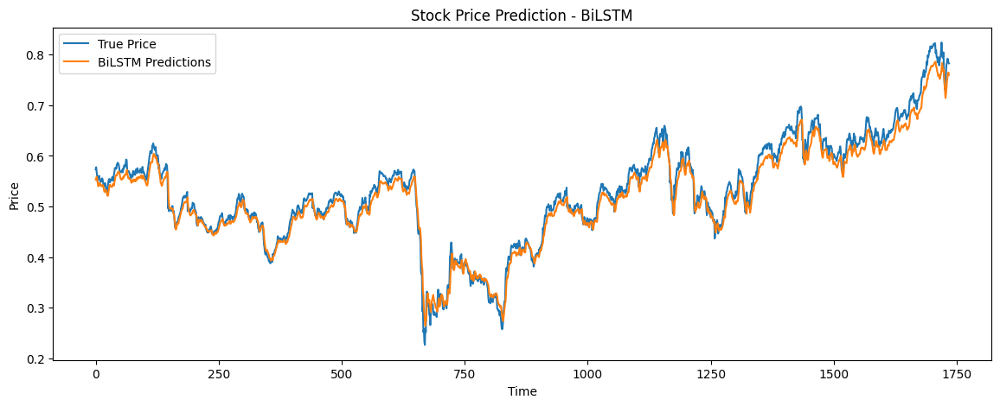

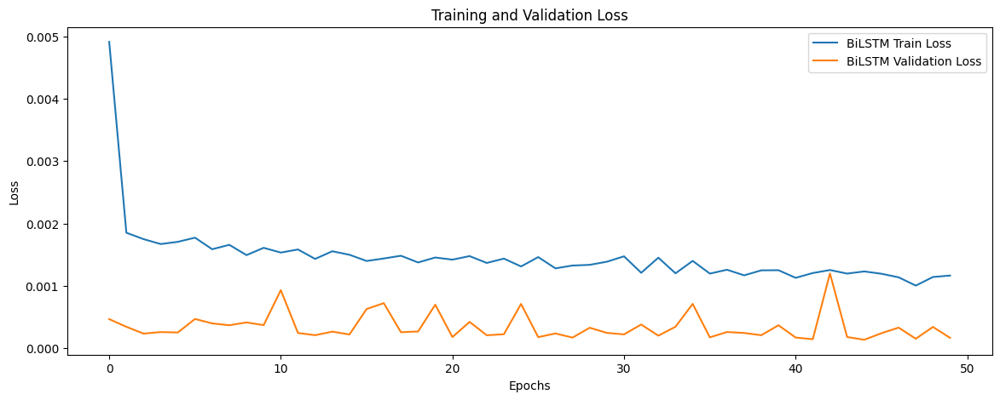

Raw BiLSTM Future Predictions (Before Inverse Transform):
[0.7572307  0.73873448 0.72150528 0.70487845 0.68936038 0.67491269
 0.66256595 0.65171111 0.64148712 0.63217992 0.62264287 0.61252892
 0.60239756 0.59209609 0.58095658 0.56993163 0.55844426 0.54538667
 0.52993053 0.51579022 0.503519   0.49417666 0.48653987 0.48077846
 0.47642916 0.47393453 0.472945   0.47324336 0.47442049 0.47541004]

BiLSTM Future Predictions (After Inverse Transform):
[32.41059145 31.71663041 31.07020665 30.44638305 29.86415932 29.32209528
 28.85885674 28.45159309 28.06799856 27.71880074 27.3609797  26.9815134
 26.60139409 26.21489236 25.79694808 25.38330199 24.9523066  24.46239781
 23.88249761 23.35196623 22.8915611  22.54104497 22.25451978 22.03835679
 21.87517536 21.78157901 21.74445289 21.75564674 21.79981166 21.83693891]


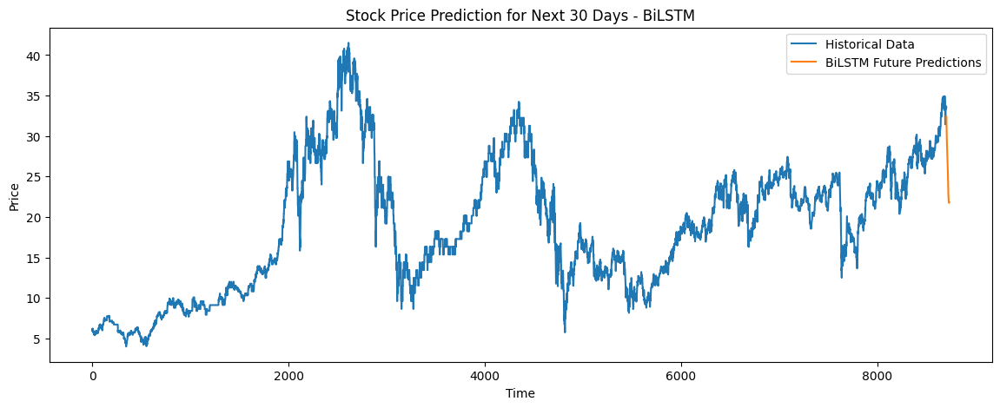

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Bidirectional, LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler

# Assume X_train, Y_train, X_test, Y_test are already defined and preprocessed

# Define BiLSTM model
def create_bilstm_model(input_shape=(30, 1), lstm_units=64, dropout_rate=0.5, lr=0.005):
    model = Sequential()
    model.add(Bidirectional(LSTM(units=lstm_units, return_sequences=True), input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(Bidirectional(LSTM(units=lstm_units, return_sequences=False)))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# Train the model
bilstm_model = create_bilstm_model(input_shape=(X_train.shape[1], 1))
bilstm_history = bilstm_model.fit(X_train, Y_train, batch_size=32, epochs=50, verbose=1, validation_split=0.2)

# Predictions
bilstm_predictions = bilstm_model.predict(X_test)

# Misalnya, kita fit scaler dengan data training
scaler = MinMaxScaler()
scaler.fit(Y_train.reshape(-1, 1))

# Inverse scaling
bilstm_predictions = scaler.inverse_transform(bilstm_predictions)
Y_test_unscaled = scaler.inverse_transform(Y_test.reshape(-1, 1))

# Calculate MAPE
bilstm_mape = mean_absolute_percentage_error(Y_test_unscaled, bilstm_predictions)
print(f'BiLSTM MAPE: {bilstm_mape:.4f}')

# Plot the results
plt.figure(figsize=(14, 5))
plt.plot(Y_test_unscaled, label='True Price')
plt.plot(bilstm_predictions, label='BiLSTM Predictions')
plt.title('Stock Price Prediction - BiLSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()


# Plot the training and validation loss for both models
plt.figure(figsize=(14, 5))
plt.plot(bilstm_history.history['loss'], label='BiLSTM Train Loss')
plt.plot(bilstm_history.history['val_loss'], label='BiLSTM Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Assume bilstm_model, data, and scaled_data are already defined and preprocessed
time_step = 30  # Sesuaikan dengan time step yang Anda gunakan

# Fit scaler dengan data asli (bukan data yang sudah discaled)
scaler = MinMaxScaler()
scaler.fit(data.reshape(-1, 1))  # Fit dengan data asli

# Fungsi untuk prediksi 30 hari ke depan
def predict_next_30_days(model, data, time_step):
    temp_input = data[-time_step:].reshape(1, -1)  # Ambil data terakhir sebanyak time_step dan reshape
    temp_input = list(temp_input[0])  # Ubah menjadi list
    lst_output = []
    n_steps = time_step
    i = 0
    while(i < 30):
        if len(temp_input) > n_steps:
            x_input = np.array(temp_input[-n_steps:])  # Ambil hanya n_steps terakhir dan ubah menjadi numpy array
            x_input = x_input.reshape(1, n_steps, 1)
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
        else:
            x_input = np.array(temp_input).reshape((1, n_steps, 1))  # Ubah list menjadi numpy array dan reshape
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
    return np.array(lst_output).reshape(-1, 1)

# Prediksi tanpa inverse transform
bilstm_future_predictions_raw = predict_next_30_days(bilstm_model, scaled_data, time_step)

# Print prediksi raw (sebelum inverse transform)
print("Raw BiLSTM Future Predictions (Before Inverse Transform):")
print(bilstm_future_predictions_raw.flatten())

# Lakukan inverse transform pada prediksi
bilstm_future_predictions = scaler.inverse_transform(bilstm_future_predictions_raw)

# Print prediksi setelah inverse transform
print("\nBiLSTM Future Predictions (After Inverse Transform):")
print(bilstm_future_predictions.flatten())

# Plot hasil prediksi
plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(data)), data, label='Historical Data')
plt.plot(np.arange(len(data), len(data) + 30), bilstm_future_predictions, label='BiLSTM Future Predictions')
plt.title('Stock Price Prediction for Next 30 Days - BiLSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()


Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


174/174 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.0165 - val_loss: 8.0039e-04
Epoch 2/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.0019 - val_loss: 8.1478e-04
Epoch 3/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0016 - val_loss: 2.9049e-04
Epoch 4/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.0018 - val_loss: 3.2139e-04
Epoch 5/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.0016 - val_loss: 3.8520e-04
Epoch 6/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.0017 - val_loss: 6.1215e-04
Epoch 7/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.0016 - val_loss: 2.3087e-04
Epoch 8/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.0015 - val_loss: 3.0184e-04
Epoch 9/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.0015 - val_loss: 3.2403e-04
Epoch 10/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.0015 - val_loss: 2.9289e-04
Epoch 11/100
174/174 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.0017 - val_loss

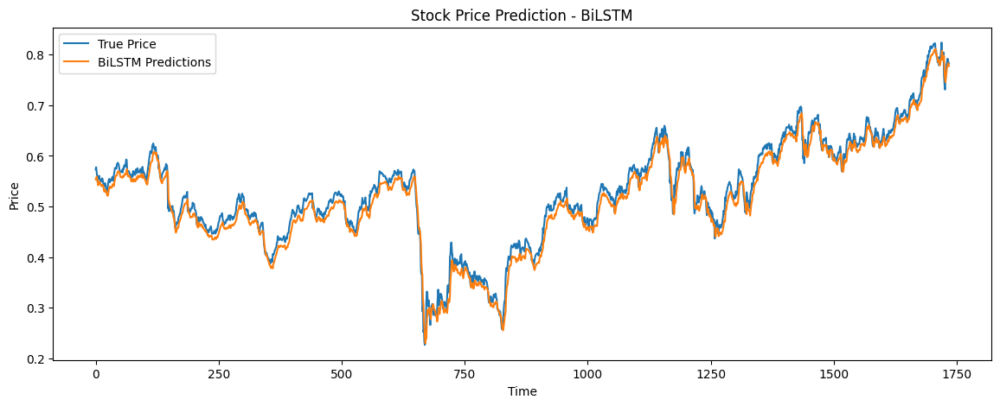

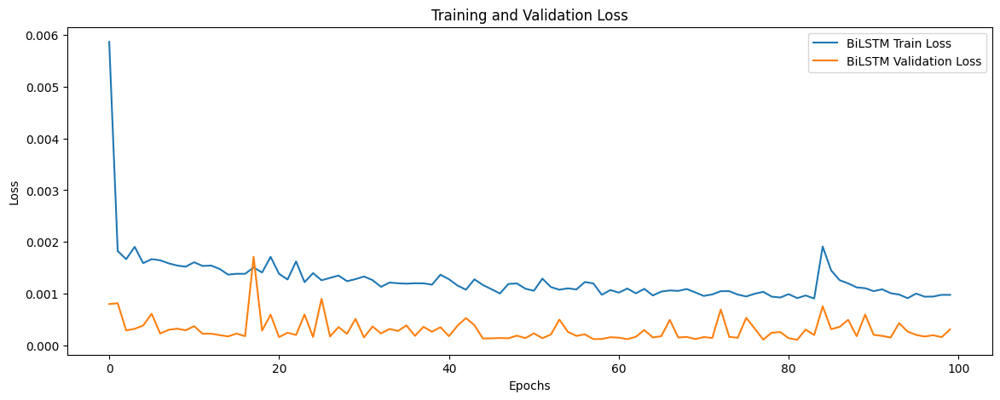

Raw BiLSTM Future Predictions (Before Inverse Transform):
[0.77885938 0.77331299 0.76884282 0.76652813 0.76530463 0.76485825
 0.76485765 0.76455927 0.76386547 0.76304984 0.76189584 0.76050031
 0.75890338 0.75654358 0.75362527 0.75102758 0.7487216  0.7455188
 0.74151993 0.73795342 0.73546386 0.73407972 0.73319304 0.73241431
 0.73140788 0.73005509 0.72821778 0.72616684 0.72416019 0.7219795 ]

BiLSTM Future Predictions (After Inverse Transform):
[33.22207961 33.0139841  32.84626744 32.75942252 32.71351775 32.69677001
 32.69674765 32.68555267 32.659522   32.62892031 32.58562309 32.53326432
 32.47334906 32.38481125 32.2753192  32.17785626 32.09133784 31.97117187
 31.82113772 31.68732578 31.59391952 31.54198789 31.50872052 31.47950311
 31.44174299 31.39098766 31.32205335 31.24510411 31.16981644 31.08799874]


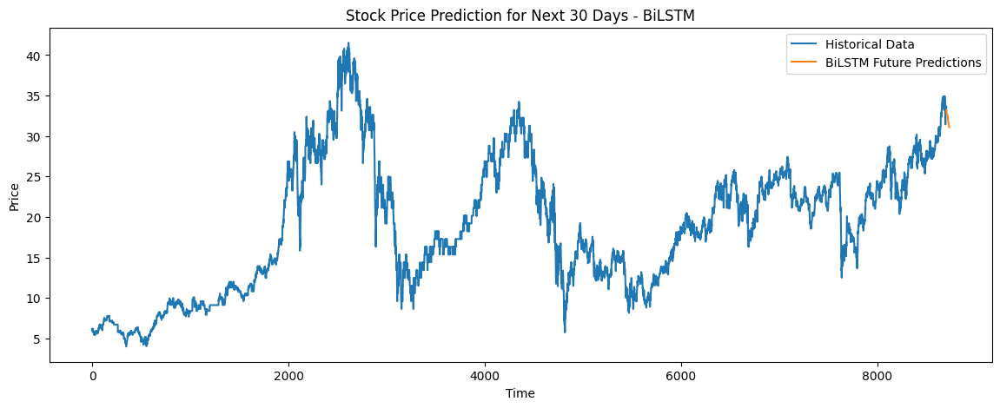

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Bidirectional, LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler

# Assume X_train, Y_train, X_test, Y_test are already defined and preprocessed

# Define BiLSTM model
def create_bilstm_model(input_shape=(30, 1), lstm_units=64, dropout_rate=0.5, lr=0.005):
    model = Sequential()
    model.add(Bidirectional(LSTM(units=lstm_units, return_sequences=True), input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(Bidirectional(LSTM(units=lstm_units, return_sequences=False)))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# Train the model
bilstm_model = create_bilstm_model(input_shape=(X_train.shape[1], 1))
bilstm_history = bilstm_model.fit(X_train, Y_train, batch_size=32, epochs=100, verbose=1, validation_split=0.2)

# Predictions
bilstm_predictions = bilstm_model.predict(X_test)

# Misalnya, kita fit scaler dengan data training
scaler = MinMaxScaler()
scaler.fit(Y_train.reshape(-1, 1))

# Inverse scaling
bilstm_predictions = scaler.inverse_transform(bilstm_predictions)
Y_test_unscaled = scaler.inverse_transform(Y_test.reshape(-1, 1))

# Calculate MAPE
bilstm_mape = mean_absolute_percentage_error(Y_test_unscaled, bilstm_predictions)
print(f'BiLSTM MAPE: {bilstm_mape:.4f}')

# Plot the results
plt.figure(figsize=(14, 5))
plt.plot(Y_test_unscaled, label='True Price')
plt.plot(bilstm_predictions, label='BiLSTM Predictions')
plt.title('Stock Price Prediction - BiLSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()


# Plot the training and validation loss for both models
plt.figure(figsize=(14, 5))
plt.plot(bilstm_history.history['loss'], label='BiLSTM Train Loss')
plt.plot(bilstm_history.history['val_loss'], label='BiLSTM Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Assume bilstm_model, data, and scaled_data are already defined and preprocessed
time_step = 30  # Sesuaikan dengan time step yang Anda gunakan

# Fit scaler dengan data asli (bukan data yang sudah discaled)
scaler = MinMaxScaler()
scaler.fit(data.reshape(-1, 1))  # Fit dengan data asli

# Fungsi untuk prediksi 30 hari ke depan
def predict_next_30_days(model, data, time_step):
    temp_input = data[-time_step:].reshape(1, -1)  # Ambil data terakhir sebanyak time_step dan reshape
    temp_input = list(temp_input[0])  # Ubah menjadi list
    lst_output = []
    n_steps = time_step
    i = 0
    while(i < 30):
        if len(temp_input) > n_steps:
            x_input = np.array(temp_input[-n_steps:])  # Ambil hanya n_steps terakhir dan ubah menjadi numpy array
            x_input = x_input.reshape(1, n_steps, 1)
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
        else:
            x_input = np.array(temp_input).reshape((1, n_steps, 1))  # Ubah list menjadi numpy array dan reshape
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
    return np.array(lst_output).reshape(-1, 1)

# Prediksi tanpa inverse transform
bilstm_future_predictions_raw = predict_next_30_days(bilstm_model, scaled_data, time_step)

# Print prediksi raw (sebelum inverse transform)
print("Raw BiLSTM Future Predictions (Before Inverse Transform):")
print(bilstm_future_predictions_raw.flatten())

# Lakukan inverse transform pada prediksi
bilstm_future_predictions = scaler.inverse_transform(bilstm_future_predictions_raw)

# Print prediksi setelah inverse transform
print("\nBiLSTM Future Predictions (After Inverse Transform):")
print(bilstm_future_predictions.flatten())

# Plot hasil prediksi
plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(data)), data, label='Historical Data')
plt.plot(np.arange(len(data), len(data) + 30), bilstm_future_predictions, label='BiLSTM Future Predictions')
plt.title('Stock Price Prediction for Next 30 Days - BiLSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 24s 88ms/step - loss: 0.0211 - val_loss: 4.4770e-04
Epoch 2/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 14s 78ms/step - loss: 0.0021 - val_loss: 2.8523e-04
Epoch 3/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 21s 80ms/step - loss: 0.0015 - val_loss: 6.8640e-04
Epoch 4/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.0016 - val_loss: 5.5640e-04
Epoch 5/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 21s 80ms/step - loss: 0.0018 - val_loss: 4.5794e-04
Epoch 6/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.0015 - val_loss: 8.1598e-04
Epoch 7/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.0017 - val_loss: 2.5038e-04
Epoch 8/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 16s 94ms/step - loss: 0.0017 - val_loss: 2.2742e-04
Epoch 9/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 18s 80ms/step - loss: 0.0015 - val_loss: 2.6977e-04
Epoch 10/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 20s 78ms/step - loss: 0.0016 - val_loss: 4.9912e-04
Epoch 11/200
174/174 ━━━━━━━━━━━━━━━━━━━━ 21s 80ms/step - loss: 0.001

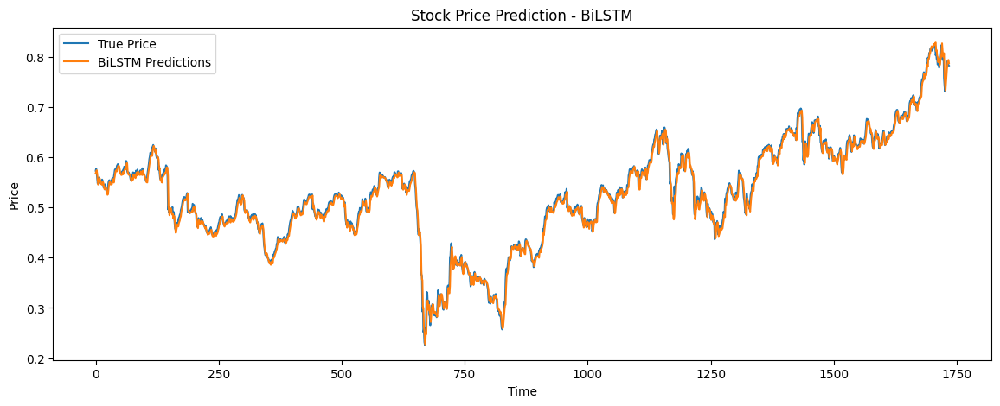

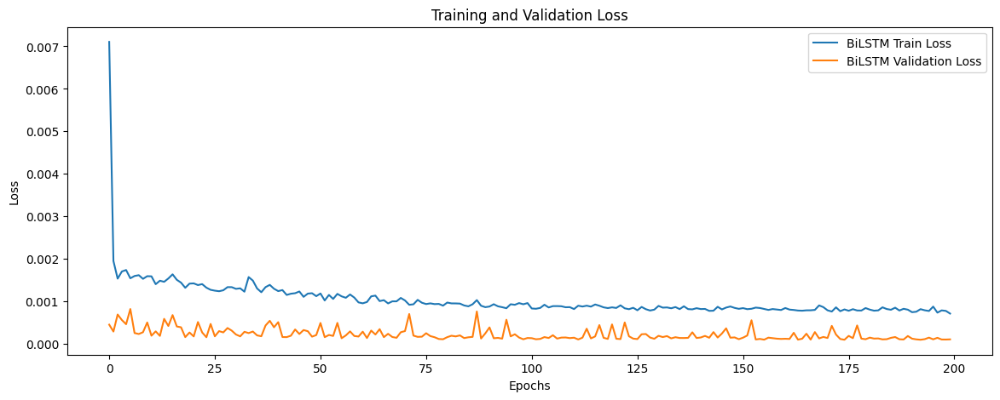

Raw BiLSTM Future Predictions (Before Inverse Transform):
[0.78922987 0.79080212 0.79200447 0.7935583  0.79548216 0.79812968
 0.80062091 0.80185795 0.80230308 0.80259538 0.80360776 0.80627275
 0.81067383 0.81602234 0.82248181 0.83002299 0.83793986 0.84487152
 0.85237175 0.86075425 0.87109882 0.88291365 0.89637828 0.91055328
 0.92455071 0.93652695 0.94555348 0.95208538 0.95672506 0.959755  ]

BiLSTM Future Predictions (After Inverse Transform):
[33.61117099 33.67016042 33.7152713  33.77356971 33.84575114 33.94508363
 34.03855251 34.08496492 34.10166569 34.11263256 34.15061632 34.25060405
 34.41572882 34.61639977 34.85875333 35.14169148 35.4387251  35.69879472
 35.98019652 36.2947002  36.68281879 37.12610048 37.63128104 38.16311396
 38.68828491 39.13762253 39.47628956 39.72136024 39.89543697 40.00911763]


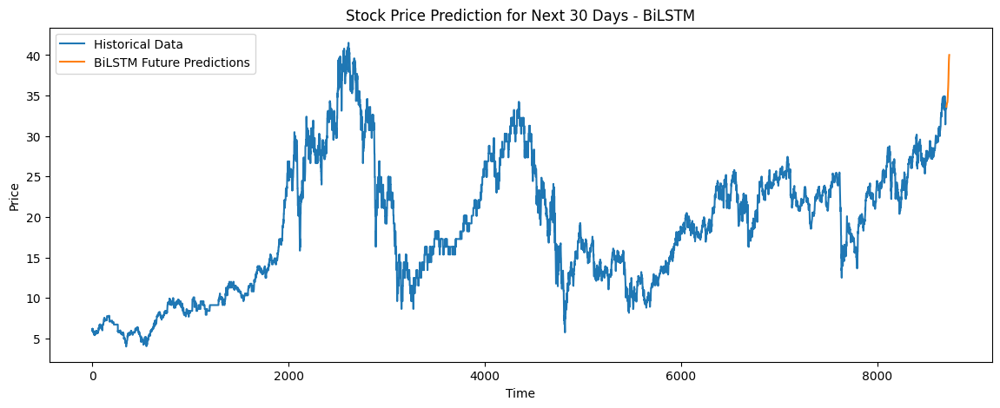

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Bidirectional, LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler

# Assume X_train, Y_train, X_test, Y_test are already defined and preprocessed

# Define BiLSTM model
def create_bilstm_model(input_shape=(30, 1), lstm_units=64, dropout_rate=0.5, lr=0.005):
    model = Sequential()
    model.add(Bidirectional(LSTM(units=lstm_units, return_sequences=True), input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(Bidirectional(LSTM(units=lstm_units, return_sequences=False)))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# Train the model
bilstm_model = create_bilstm_model(input_shape=(X_train.shape[1], 1))
bilstm_history = bilstm_model.fit(X_train, Y_train, batch_size=32, epochs=200, verbose=1, validation_split=0.2)

# Predictions
bilstm_predictions = bilstm_model.predict(X_test)

# Misalnya, kita fit scaler dengan data training
scaler = MinMaxScaler()
scaler.fit(Y_train.reshape(-1, 1))

# Inverse scaling
bilstm_predictions = scaler.inverse_transform(bilstm_predictions)
Y_test_unscaled = scaler.inverse_transform(Y_test.reshape(-1, 1))

# Calculate MAPE
bilstm_mape = mean_absolute_percentage_error(Y_test_unscaled, bilstm_predictions)
print(f'BiLSTM MAPE: {bilstm_mape:.4f}')

# Plot the results
plt.figure(figsize=(14, 5))
plt.plot(Y_test_unscaled, label='True Price')
plt.plot(bilstm_predictions, label='BiLSTM Predictions')
plt.title('Stock Price Prediction - BiLSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()


# Plot the training and validation loss for both models
plt.figure(figsize=(14, 5))
plt.plot(bilstm_history.history['loss'], label='BiLSTM Train Loss')
plt.plot(bilstm_history.history['val_loss'], label='BiLSTM Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Assume bilstm_model, data, and scaled_data are already defined and preprocessed
time_step = 30  # Sesuaikan dengan time step yang Anda gunakan

# Fit scaler dengan data asli (bukan data yang sudah discaled)
scaler = MinMaxScaler()
scaler.fit(data.reshape(-1, 1))  # Fit dengan data asli

# Fungsi untuk prediksi 30 hari ke depan
def predict_next_30_days(model, data, time_step):
    temp_input = data[-time_step:].reshape(1, -1)  # Ambil data terakhir sebanyak time_step dan reshape
    temp_input = list(temp_input[0])  # Ubah menjadi list
    lst_output = []
    n_steps = time_step
    i = 0
    while(i < 30):
        if len(temp_input) > n_steps:
            x_input = np.array(temp_input[-n_steps:])  # Ambil hanya n_steps terakhir dan ubah menjadi numpy array
            x_input = x_input.reshape(1, n_steps, 1)
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
        else:
            x_input = np.array(temp_input).reshape((1, n_steps, 1))  # Ubah list menjadi numpy array dan reshape
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
    return np.array(lst_output).reshape(-1, 1)

# Prediksi tanpa inverse transform
bilstm_future_predictions_raw = predict_next_30_days(bilstm_model, scaled_data, time_step)

# Print prediksi raw (sebelum inverse transform)
print("Raw BiLSTM Future Predictions (Before Inverse Transform):")
print(bilstm_future_predictions_raw.flatten())

# Lakukan inverse transform pada prediksi
bilstm_future_predictions = scaler.inverse_transform(bilstm_future_predictions_raw)

# Print prediksi setelah inverse transform
print("\nBiLSTM Future Predictions (After Inverse Transform):")
print(bilstm_future_predictions.flatten())

# Plot hasil prediksi
plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(data)), data, label='Historical Data')
plt.plot(np.arange(len(data), len(data) + 30), bilstm_future_predictions, label='BiLSTM Future Predictions')
plt.title('Stock Price Prediction for Next 30 Days - BiLSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 20s 140ms/step - loss: 0.0278 - val_loss: 6.9954e-04
Epoch 2/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.0020 - val_loss: 2.7711e-04
Epoch 3/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 12s 137ms/step - loss: 0.0016 - val_loss: 2.9515e-04
Epoch 4/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 19s 123ms/step - loss: 0.0014 - val_loss: 2.7797e-04
Epoch 5/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 22s 136ms/step - loss: 0.0014 - val_loss: 2.1679e-04
Epoch 6/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 20s 136ms/step - loss: 0.0014 - val_loss: 3.5542e-04
Epoch 7/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 18s 106ms/step - loss: 0.0012 - val_loss: 2.7896e-04
Epoch 8/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - loss: 0.0014 - val_loss: 2.6199e-04
Epoch 9/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 21s 134ms/step - loss: 0.0013 - val_loss: 7.7163e-04
Epoch 10/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 20s 134ms/step - loss: 0.0013 - val_loss: 2.4046e-04
Epoch 11/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.0013 - val_loss: 2.9240e-

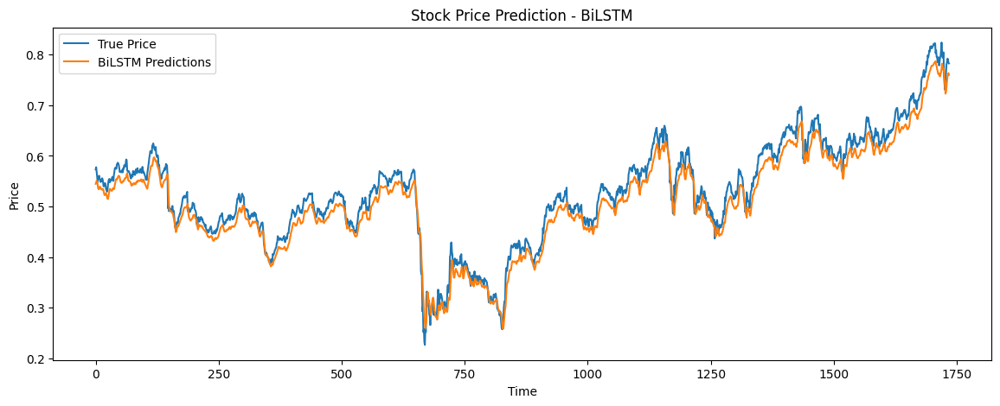

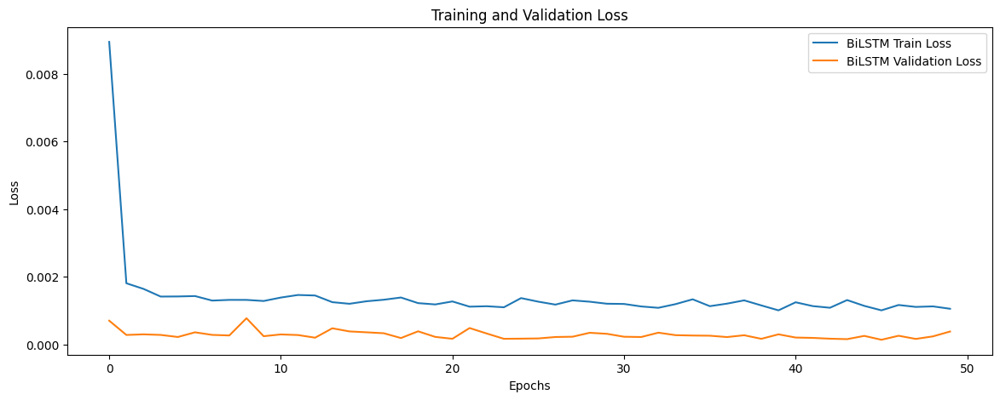

Raw BiLSTM Future Predictions (Before Inverse Transform):
[0.75673938 0.74387693 0.73107195 0.7192322  0.70916092 0.7003479
 0.69269991 0.68527734 0.67761242 0.67013717 0.66231126 0.65418303
 0.64620733 0.63823915 0.62998086 0.62221658 0.61452115 0.6061219
 0.59656274 0.58818859 0.58090186 0.57518649 0.57009447 0.56574023
 0.56169403 0.55814731 0.55479664 0.55162048 0.54851866 0.54494143]

BiLSTM Future Predictions (After Inverse Transform):
[32.39215753 31.90957043 31.42913913 30.98492267 30.60705757 30.276401
 29.98945539 29.7109675  29.42338677 29.14292199 28.84930098 28.5443374
 28.24509655 27.94613747 27.63629426 27.3449856  27.05625988 26.74112779
 26.38247708 26.06828648 25.79489514 25.5804597  25.3894116  25.22604456
 25.07423478 24.9411653  24.81545104 24.6962847  24.57990704 24.44569257]


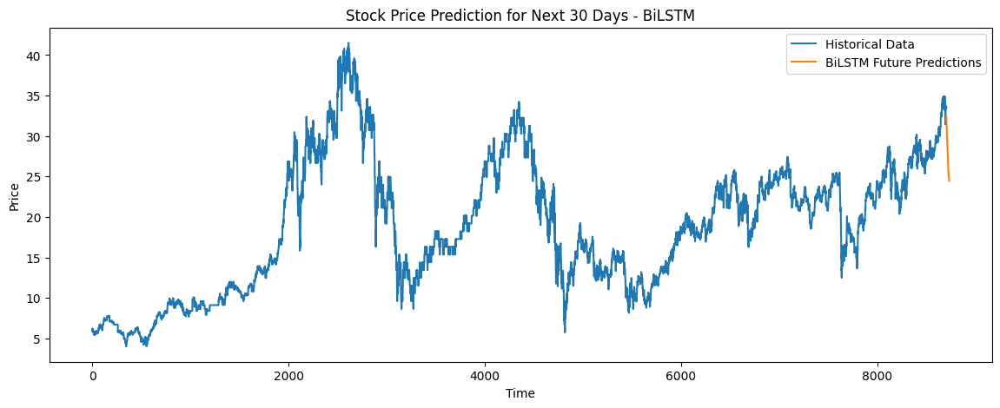

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Bidirectional, LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler

# Assume X_train, Y_train, X_test, Y_test are already defined and preprocessed

# Define BiLSTM model
def create_bilstm_model(input_shape=(30, 1), lstm_units=64, dropout_rate=0.5, lr=0.005):
    model = Sequential()
    model.add(Bidirectional(LSTM(units=lstm_units, return_sequences=True), input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(Bidirectional(LSTM(units=lstm_units, return_sequences=False)))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# Train the model
bilstm_model = create_bilstm_model(input_shape=(X_train.shape[1], 1))
bilstm_history = bilstm_model.fit(X_train, Y_train, batch_size=64, epochs=50, verbose=1, validation_split=0.2)

# Predictions
bilstm_predictions = bilstm_model.predict(X_test)

# Misalnya, kita fit scaler dengan data training
scaler = MinMaxScaler()
scaler.fit(Y_train.reshape(-1, 1))

# Inverse scaling
bilstm_predictions = scaler.inverse_transform(bilstm_predictions)
Y_test_unscaled = scaler.inverse_transform(Y_test.reshape(-1, 1))

# Calculate MAPE
bilstm_mape = mean_absolute_percentage_error(Y_test_unscaled, bilstm_predictions)
print(f'BiLSTM MAPE: {bilstm_mape:.4f}')

# Plot the results
plt.figure(figsize=(14, 5))
plt.plot(Y_test_unscaled, label='True Price')
plt.plot(bilstm_predictions, label='BiLSTM Predictions')
plt.title('Stock Price Prediction - BiLSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()


# Plot the training and validation loss for both models
plt.figure(figsize=(14, 5))
plt.plot(bilstm_history.history['loss'], label='BiLSTM Train Loss')
plt.plot(bilstm_history.history['val_loss'], label='BiLSTM Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Assume bilstm_model, data, and scaled_data are already defined and preprocessed
time_step = 30  # Sesuaikan dengan time step yang Anda gunakan

# Fit scaler dengan data asli (bukan data yang sudah discaled)
scaler = MinMaxScaler()
scaler.fit(data.reshape(-1, 1))  # Fit dengan data asli

# Fungsi untuk prediksi 30 hari ke depan
def predict_next_30_days(model, data, time_step):
    temp_input = data[-time_step:].reshape(1, -1)  # Ambil data terakhir sebanyak time_step dan reshape
    temp_input = list(temp_input[0])  # Ubah menjadi list
    lst_output = []
    n_steps = time_step
    i = 0
    while(i < 30):
        if len(temp_input) > n_steps:
            x_input = np.array(temp_input[-n_steps:])  # Ambil hanya n_steps terakhir dan ubah menjadi numpy array
            x_input = x_input.reshape(1, n_steps, 1)
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
        else:
            x_input = np.array(temp_input).reshape((1, n_steps, 1))  # Ubah list menjadi numpy array dan reshape
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
    return np.array(lst_output).reshape(-1, 1)

# Prediksi tanpa inverse transform
bilstm_future_predictions_raw = predict_next_30_days(bilstm_model, scaled_data, time_step)

# Print prediksi raw (sebelum inverse transform)
print("Raw BiLSTM Future Predictions (Before Inverse Transform):")
print(bilstm_future_predictions_raw.flatten())

# Lakukan inverse transform pada prediksi
bilstm_future_predictions = scaler.inverse_transform(bilstm_future_predictions_raw)

# Print prediksi setelah inverse transform
print("\nBiLSTM Future Predictions (After Inverse Transform):")
print(bilstm_future_predictions.flatten())

# Plot hasil prediksi
plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(data)), data, label='Historical Data')
plt.plot(np.arange(len(data), len(data) + 30), bilstm_future_predictions, label='BiLSTM Future Predictions')
plt.title('Stock Price Prediction for Next 30 Days - BiLSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()


Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


87/87 ━━━━━━━━━━━━━━━━━━━━ 18s 121ms/step - loss: 0.0251 - val_loss: 4.4126e-04
Epoch 2/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.0019 - val_loss: 3.8045e-04
Epoch 3/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 20s 122ms/step - loss: 0.0016 - val_loss: 3.5290e-04
Epoch 4/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.0017 - val_loss: 2.4207e-04
Epoch 5/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.0016 - val_loss: 3.4454e-04
Epoch 6/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 12s 140ms/step - loss: 0.0015 - val_loss: 2.3445e-04
Epoch 7/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.0014 - val_loss: 2.5226e-04
Epoch 8/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 21s 135ms/step - loss: 0.0014 - val_loss: 3.1859e-04
Epoch 9/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.0013 - val_loss: 3.1163e-04
Epoch 10/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 19s 117ms/step - loss: 0.0015 - val_loss: 8.2844e-04
Epoch 11/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 10s 118ms/step - loss: 0.0015 - val_loss: 7.6948e-0

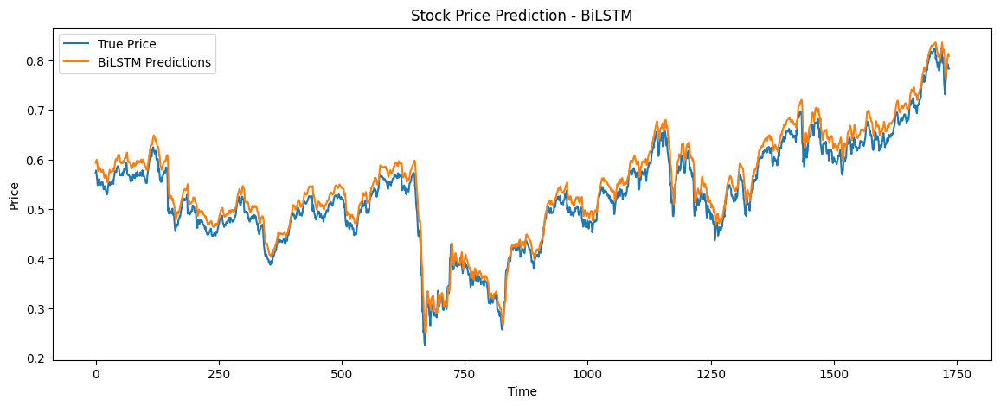

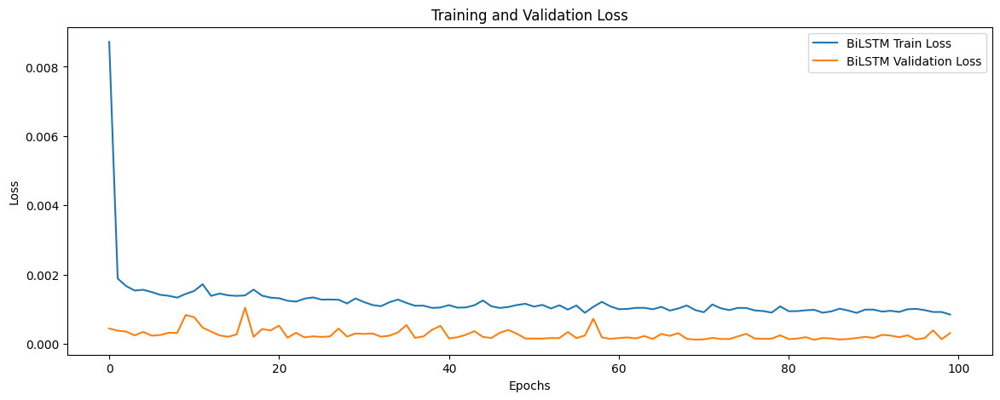

Raw BiLSTM Future Predictions (Before Inverse Transform):
[0.80846679 0.82142878 0.83303523 0.84440601 0.85562813 0.86519909
 0.87320232 0.87951398 0.88422763 0.88827217 0.89171541 0.89490414
 0.89892042 0.90403593 0.9090153  0.91314566 0.91595411 0.9173826
 0.91713166 0.91695952 0.91733599 0.91885245 0.92097759 0.92343688
 0.92554295 0.92722011 0.9284234  0.92935538 0.93032432 0.93143868]

BiLSTM Future Predictions (After Inverse Transform):
[34.33292268 34.81924442 35.25470796 35.68132913 36.10237293 36.46146643
 36.76174047 36.99854798 37.17539997 37.32714713 37.45633438 37.57597258
 37.72665973 37.91858894 38.10541041 38.26037786 38.36574839 38.41934383
 38.40992896 38.40347049 38.41759504 38.47449128 38.55422473 38.64649495
 38.72551278 38.78843812 38.83358478 38.86855175 38.90490523 38.94671531]


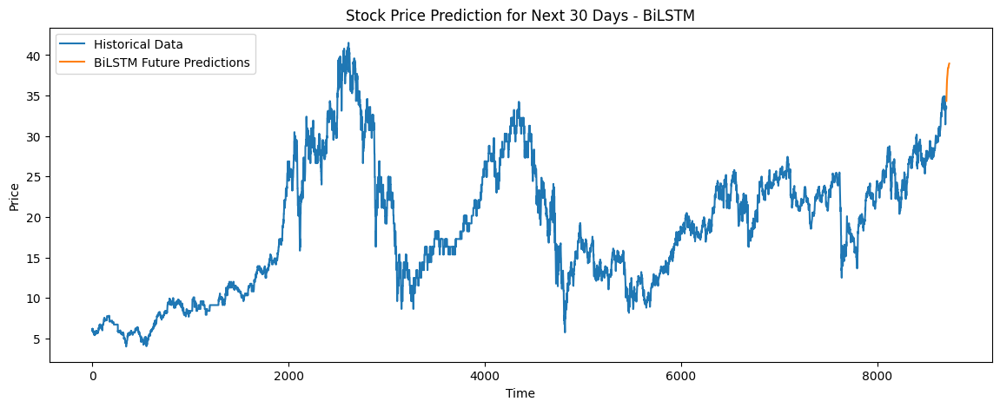

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Bidirectional, LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler

# Assume X_train, Y_train, X_test, Y_test are already defined and preprocessed

# Define BiLSTM model
def create_bilstm_model(input_shape=(30, 1), lstm_units=64, dropout_rate=0.5, lr=0.005):
    model = Sequential()
    model.add(Bidirectional(LSTM(units=lstm_units, return_sequences=True), input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(Bidirectional(LSTM(units=lstm_units, return_sequences=False)))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# Train the model
bilstm_model = create_bilstm_model(input_shape=(X_train.shape[1], 1))
bilstm_history = bilstm_model.fit(X_train, Y_train, batch_size=64, epochs=100, verbose=1, validation_split=0.2)

# Predictions
bilstm_predictions = bilstm_model.predict(X_test)

# Misalnya, kita fit scaler dengan data training
scaler = MinMaxScaler()
scaler.fit(Y_train.reshape(-1, 1))

# Inverse scaling
bilstm_predictions = scaler.inverse_transform(bilstm_predictions)
Y_test_unscaled = scaler.inverse_transform(Y_test.reshape(-1, 1))

# Calculate MAPE
bilstm_mape = mean_absolute_percentage_error(Y_test_unscaled, bilstm_predictions)
print(f'BiLSTM MAPE: {bilstm_mape:.4f}')

# Plot the results
plt.figure(figsize=(14, 5))
plt.plot(Y_test_unscaled, label='True Price')
plt.plot(bilstm_predictions, label='BiLSTM Predictions')
plt.title('Stock Price Prediction - BiLSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()


# Plot the training and validation loss for both models
plt.figure(figsize=(14, 5))
plt.plot(bilstm_history.history['loss'], label='BiLSTM Train Loss')
plt.plot(bilstm_history.history['val_loss'], label='BiLSTM Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Assume bilstm_model, data, and scaled_data are already defined and preprocessed
time_step = 30  # Sesuaikan dengan time step yang Anda gunakan

# Fit scaler dengan data asli (bukan data yang sudah discaled)
scaler = MinMaxScaler()
scaler.fit(data.reshape(-1, 1))  # Fit dengan data asli

# Fungsi untuk prediksi 30 hari ke depan
def predict_next_30_days(model, data, time_step):
    temp_input = data[-time_step:].reshape(1, -1)  # Ambil data terakhir sebanyak time_step dan reshape
    temp_input = list(temp_input[0])  # Ubah menjadi list
    lst_output = []
    n_steps = time_step
    i = 0
    while(i < 30):
        if len(temp_input) > n_steps:
            x_input = np.array(temp_input[-n_steps:])  # Ambil hanya n_steps terakhir dan ubah menjadi numpy array
            x_input = x_input.reshape(1, n_steps, 1)
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
        else:
            x_input = np.array(temp_input).reshape((1, n_steps, 1))  # Ubah list menjadi numpy array dan reshape
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
    return np.array(lst_output).reshape(-1, 1)

# Prediksi tanpa inverse transform
bilstm_future_predictions_raw = predict_next_30_days(bilstm_model, scaled_data, time_step)

# Print prediksi raw (sebelum inverse transform)
print("Raw BiLSTM Future Predictions (Before Inverse Transform):")
print(bilstm_future_predictions_raw.flatten())

# Lakukan inverse transform pada prediksi
bilstm_future_predictions = scaler.inverse_transform(bilstm_future_predictions_raw)

# Print prediksi setelah inverse transform
print("\nBiLSTM Future Predictions (After Inverse Transform):")
print(bilstm_future_predictions.flatten())

# Plot hasil prediksi
plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(data)), data, label='Historical Data')
plt.plot(np.arange(len(data), len(data) + 30), bilstm_future_predictions, label='BiLSTM Future Predictions')
plt.title('Stock Price Prediction for Next 30 Days - BiLSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()


Epoch 1/200


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


87/87 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.0316 - val_loss: 5.8816e-04
Epoch 2/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 21s 135ms/step - loss: 0.0020 - val_loss: 3.2503e-04
Epoch 3/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 10s 110ms/step - loss: 0.0017 - val_loss: 3.1734e-04
Epoch 4/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 11s 122ms/step - loss: 0.0014 - val_loss: 3.0685e-04
Epoch 5/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.0013 - val_loss: 3.3677e-04
Epoch 6/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 9s 107ms/step - loss: 0.0013 - val_loss: 2.7161e-04
Epoch 7/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 11s 118ms/step - loss: 0.0014 - val_loss: 2.1599e-04
Epoch 8/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 22s 135ms/step - loss: 0.0014 - val_loss: 2.2206e-04
Epoch 9/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.0014 - val_loss: 2.6068e-04
Epoch 10/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 12s 135ms/step - loss: 0.0013 - val_loss: 7.2984e-04
Epoch 11/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 18s 111ms/step - loss: 0.0014 - val_loss: 2.1581e-04

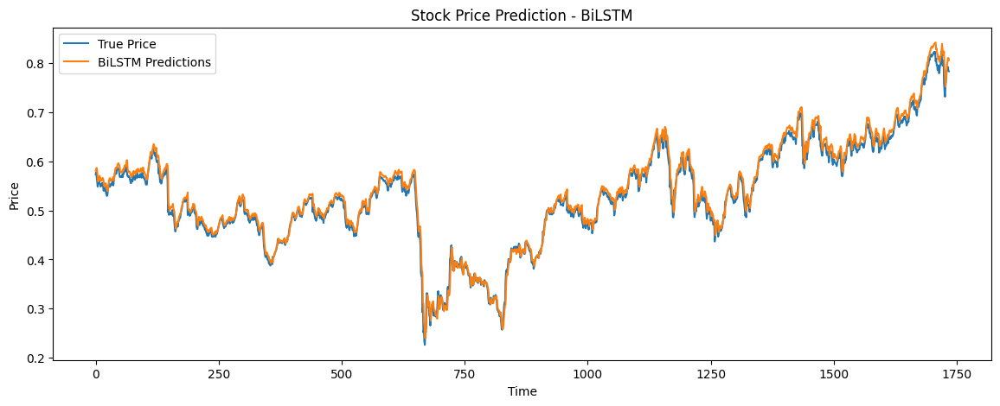

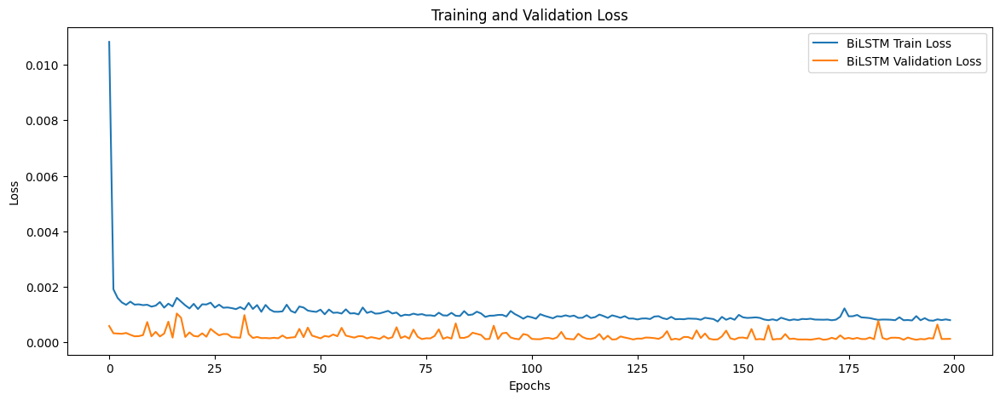

Raw BiLSTM Future Predictions (Before Inverse Transform):
[0.80643106 0.82087111 0.83452159 0.84769195 0.86010545 0.87215346
 0.88381016 0.89442503 0.90447628 0.91411984 0.92316455 0.93186229
 0.94030029 0.94789886 0.95490152 0.96171176 0.96845061 0.97397655
 0.97913432 0.98395509 0.98896646 0.99378842 0.99849731 1.00286889
 1.00700593 1.01085246 1.01428342 1.01751125 1.02055693 1.02365088]

BiLSTM Future Predictions (After Inverse Transform):
[34.25654369 34.79832149 35.31047486 35.80461475 36.27035795 36.72238809
 37.15973684 37.55799711 37.93511081 38.29692814 38.63627724 38.96260878
 39.27919447 39.56428618 39.82701925 40.08253351 40.33536866 40.54269711
 40.73621187 40.91708251 41.10510488 41.28602026 41.46269335 41.62671115
 41.78192907 41.9262472  42.05497377 42.17607899 42.29035004 42.4064325 ]


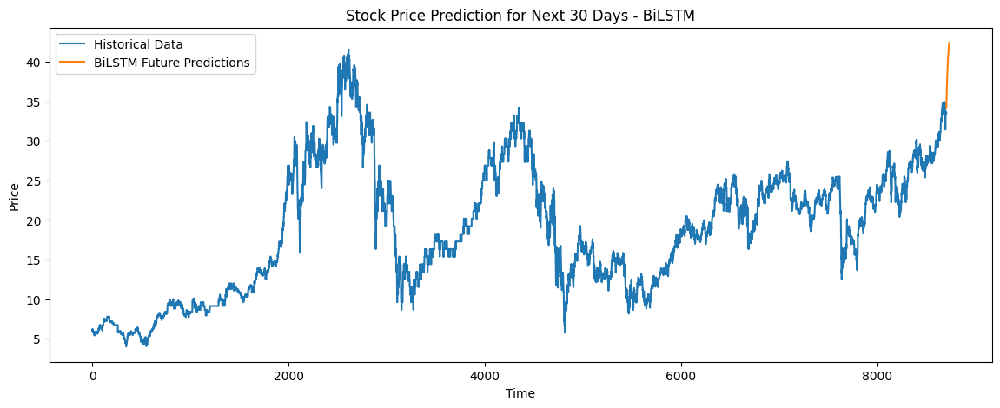

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Bidirectional, LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler

# Assume X_train, Y_train, X_test, Y_test are already defined and preprocessed

# Define BiLSTM model
def create_bilstm_model(input_shape=(30, 1), lstm_units=64, dropout_rate=0.5, lr=0.005):
    model = Sequential()
    model.add(Bidirectional(LSTM(units=lstm_units, return_sequences=True), input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(Bidirectional(LSTM(units=lstm_units, return_sequences=False)))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# Train the model
bilstm_model = create_bilstm_model(input_shape=(X_train.shape[1], 1))
bilstm_history = bilstm_model.fit(X_train, Y_train, batch_size=64, epochs=200, verbose=1, validation_split=0.2)

# Predictions
bilstm_predictions = bilstm_model.predict(X_test)

# Misalnya, kita fit scaler dengan data training
scaler = MinMaxScaler()
scaler.fit(Y_train.reshape(-1, 1))

# Inverse scaling
bilstm_predictions = scaler.inverse_transform(bilstm_predictions)
Y_test_unscaled = scaler.inverse_transform(Y_test.reshape(-1, 1))

# Calculate MAPE
bilstm_mape = mean_absolute_percentage_error(Y_test_unscaled, bilstm_predictions)
print(f'BiLSTM MAPE: {bilstm_mape:.4f}')

# Plot the results
plt.figure(figsize=(14, 5))
plt.plot(Y_test_unscaled, label='True Price')
plt.plot(bilstm_predictions, label='BiLSTM Predictions')
plt.title('Stock Price Prediction - BiLSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()


# Plot the training and validation loss for both models
plt.figure(figsize=(14, 5))
plt.plot(bilstm_history.history['loss'], label='BiLSTM Train Loss')
plt.plot(bilstm_history.history['val_loss'], label='BiLSTM Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Assume bilstm_model, data, and scaled_data are already defined and preprocessed
time_step = 30  # Sesuaikan dengan time step yang Anda gunakan

# Fit scaler dengan data asli (bukan data yang sudah discaled)
scaler = MinMaxScaler()
scaler.fit(data.reshape(-1, 1))  # Fit dengan data asli

# Fungsi untuk prediksi 30 hari ke depan
def predict_next_30_days(model, data, time_step):
    temp_input = data[-time_step:].reshape(1, -1)  # Ambil data terakhir sebanyak time_step dan reshape
    temp_input = list(temp_input[0])  # Ubah menjadi list
    lst_output = []
    n_steps = time_step
    i = 0
    while(i < 30):
        if len(temp_input) > n_steps:
            x_input = np.array(temp_input[-n_steps:])  # Ambil hanya n_steps terakhir dan ubah menjadi numpy array
            x_input = x_input.reshape(1, n_steps, 1)
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
        else:
            x_input = np.array(temp_input).reshape((1, n_steps, 1))  # Ubah list menjadi numpy array dan reshape
            yhat = model.predict(x_input, verbose=0)
            temp_input.extend(yhat[0].tolist())
            lst_output.extend(yhat.tolist())
            i += 1
    return np.array(lst_output).reshape(-1, 1)

# Prediksi tanpa inverse transform
bilstm_future_predictions_raw = predict_next_30_days(bilstm_model, scaled_data, time_step)

# Print prediksi raw (sebelum inverse transform)
print("Raw BiLSTM Future Predictions (Before Inverse Transform):")
print(bilstm_future_predictions_raw.flatten())

# Lakukan inverse transform pada prediksi
bilstm_future_predictions = scaler.inverse_transform(bilstm_future_predictions_raw)

# Print prediksi setelah inverse transform
print("\nBiLSTM Future Predictions (After Inverse Transform):")
print(bilstm_future_predictions.flatten())

# Plot hasil prediksi
plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(data)), data, label='Historical Data')
plt.plot(np.arange(len(data), len(data) + 30), bilstm_future_predictions, label='BiLSTM Future Predictions')
plt.title('Stock Price Prediction for Next 30 Days - BiLSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()
